

# Part A: DCGAN 16 MODELS

## Class-Specific DCGAN Models (One Model per Class)

To generate more class-consistent and higher-quality images, we trained **16 separate DCGAN models**, each dedicated to learning one of the 16 EMNIST letter classes.

### Rationale:
Instead of training a single GAN to generate images across all classes (which may struggle with mode collapse or class confusion), we use one DCGAN per class:
- **Each generator** learns to map noise vectors to realistic images of a specific letter class.
- **Each discriminator** learns to distinguish between real and generated images for only that class.

This approach:
- Improves class-specific detail and sharpness.
- Avoids the need for conditional embeddings or label concatenation.
- Simplifies training logic per model.

### Training Setup:
For each of the 16 classes:
1. Filter the dataset to include only images of that class.
2. Train a separate DCGAN (generator + discriminator) using the filtered subset.
3. Save the best weights and sample outputs during training.
4. Use callbacks to monitor and visualize progress.

Each model uses the same architecture and hyperparameters (e.g., latent dimension, optimizer settings), but is trained on a different subset of the dataset.

### Output:
- After training, each class-specific generator is capable of producing realistic handwritten characters of its corresponding label.
- We later generate and visualize **10 samples per class**, arranged in a 16×10 grid (one row per class), to showcase results from all 16 generators.



# Table of Content

## **Table of Contents**
1. [Imports](#imports)
2. [Control GPU Memory Usage](#control-gpu-memory-usage)
3. [Background Research and Data Exploration](#background-research-and-data-exploration)
4. [Feature Engineering](#feature-engineering)
5. [Application of Multi-DCGANS](#application-of-multi-dcgans)
6. [Multi-DCGANS 16 Models – Baseline Modelling](#multi-dcgans-16-models--baseline-modelling)
7. [Model Improvement 1](#model-improvement-1)
8. [Model Improvement 2](#model-improvement-2)


# Imports

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import (Input, Dense, Reshape, Conv2DTranspose, BatchNormalization,
                                     Activation, Conv2D, LeakyReLU, Dropout, Flatten)
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam


# Control GPU Memory Usage

In [17]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

# Background Research and Data Exploration

### Load Dataset

In [18]:
df = pd.read_csv('emnist-letters-train.csv')

In [19]:
# Check how many duplicate rows exist
df.duplicated().sum()


9465

In [20]:
df.drop_duplicates(inplace=True)


In [21]:
labels = df.iloc[:, 0]
images = df.iloc[:, 1:].values

## Data Exploration

In [22]:
df.shape

(55363, 785)

In [23]:
df.head()

,24,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,...,0.552,0.553,0.554,0.555,0.556,0.557,0.558,0.559,0.560,0.561
0,-2,142,142,142,142,142,142,142,142,142,...,142,142,142,142,142,142,142,142,142,142
1,15,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,14,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,-2,120,120,120,120,120,120,120,120,120,...,120,120,120,120,120,120,120,120,120,120
4,-1,131,131,131,131,131,131,131,131,200,...,131,131,131,131,131,131,131,131,131,131


In [24]:
df.shape

(55363, 785)

In [25]:
df.describe()

,24,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,...,0.552,0.553,0.554,0.555,0.556,0.557,0.558,0.559,0.560,0.561
count,55363.000000,55363.000000,55363.000000,55363.000000,55363.000000,55363.000000,55363.000000,55363.000000,55363.00000,55363.000000,...,55363.000000,55363.000000,55363.000000,55363.000000,55363.000000,55363.000000,55363.000000,55363.000000,55363.000000,55363.000000
mean,11.589003,1.787602,1.787602,1.787602,1.787710,1.791991,1.810921,1.819807,1.81009,2.259542,...,1.787602,1.787602,1.787602,1.792479,1.788180,1.787602,1.787602,1.787602,1.787602,1.787602
std,7.467979,17.352303,17.352303,17.352303,17.368913,17.359561,17.449014,17.500948,17.45474,19.855490,...,17.352303,17.352303,17.352303,17.383111,17.352776,17.352303,17.352303,17.352303,17.352303,17.352303
min,-2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,16.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,26.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.00000,255.000000,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000


In [26]:
print("Unique labels:", sorted(labels.unique()))

Unique labels: [-2, -1, 1, 2, 4, 5, 6, 7, 9, 10, 12, 14, 15, 16, 17, 20, 24, 26]


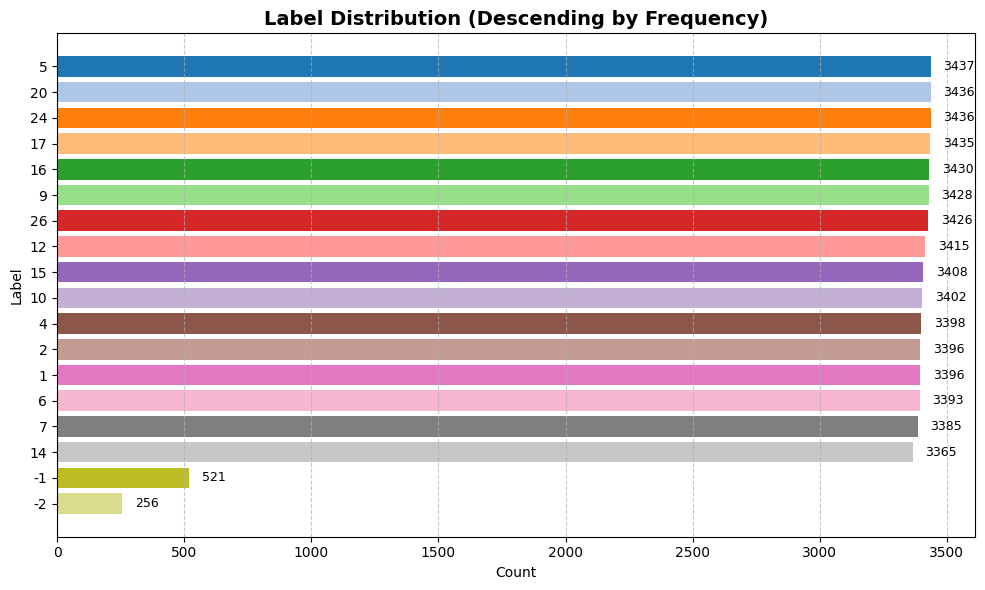

In [27]:
import matplotlib.pyplot as plt

# Count occurrences and sort by frequency (descending)
label_counts = labels.value_counts().sort_values(ascending=False)

# Create horizontal bar chart
plt.figure(figsize=(10, 6))
bars = plt.barh(label_counts.index.astype(str), label_counts.values, color=plt.cm.tab20.colors)

# Add count values next to bars
for bar, value in zip(bars, label_counts.values):
    plt.text(value + 50, bar.get_y() + bar.get_height()/2,
             str(value), va='center', fontsize=9)

plt.title("Label Distribution (Descending by Frequency)", fontsize=14, fontweight='bold')
plt.xlabel("Count")
plt.ylabel("Label")
plt.gca().invert_yaxis()  # Highest count at the top
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [28]:
label_counts = labels.value_counts().sort_index()
print(label_counts)

24
-2      256
-1      521
 1     3396
 2     3396
 4     3398
 5     3437
 6     3393
 7     3385
 9     3428
 10    3402
 12    3415
 14    3365
 15    3408
 16    3430
 17    3435
 20    3436
 24    3436
 26    3426
Name: count, dtype: int64


Two significantly underrepresented labels –
- Label -1: 521 samples
- Label -2: 256 samples

Before we drop them, let us explore what they are first.

---------------

## Print out sample images by class

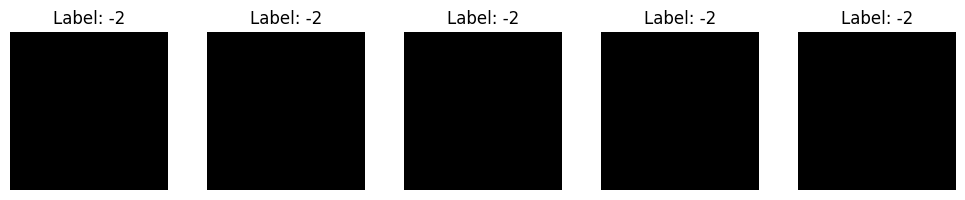

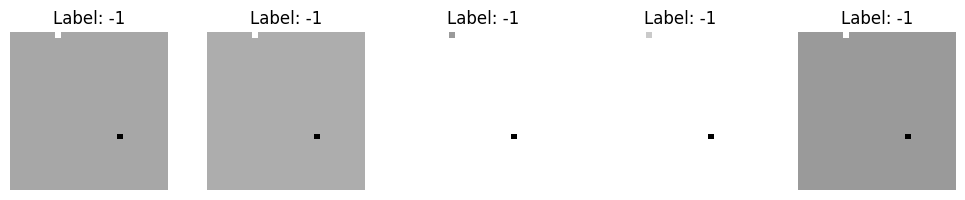

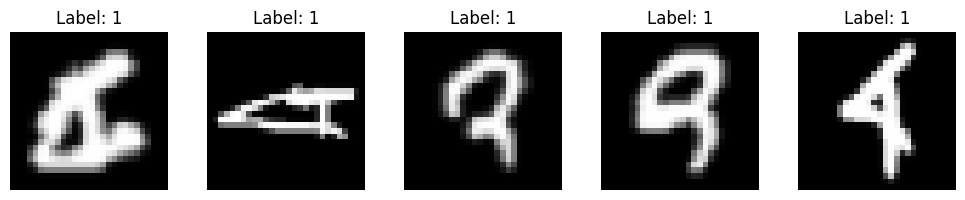

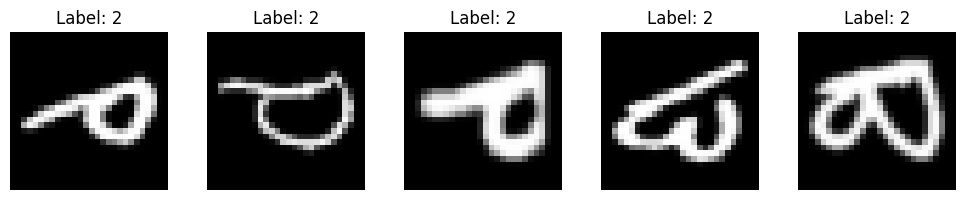

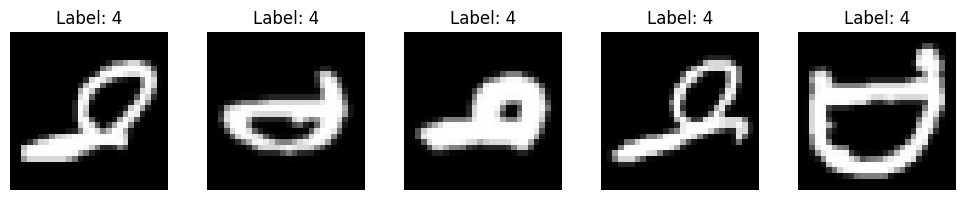

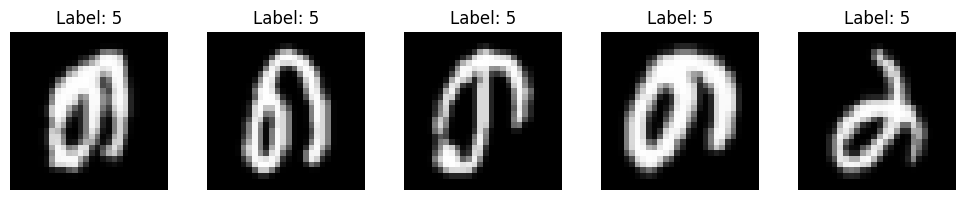

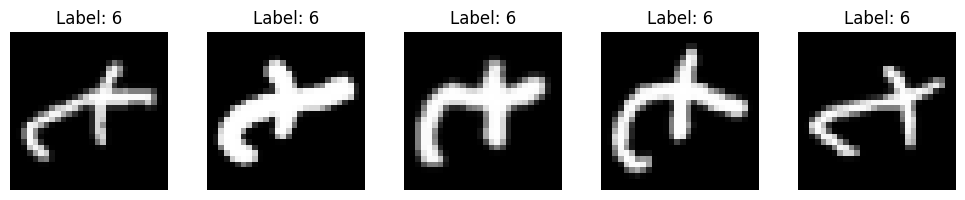

In [29]:
# Helper function to plot images by class
def plot_class_images(class_label, n=5):
    indices = df[df.iloc[:, 0] == class_label].index[:n]
    plt.figure(figsize=(10, 2))
    for i, idx in enumerate(indices):
        img = images[idx].reshape(28, 28)
        plt.subplot(1, n, i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(f"Label: {class_label}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

plot_class_images(-2)
plot_class_images(-1)
plot_class_images(1)
plot_class_images(2)
plot_class_images(4)
plot_class_images(5)
plot_class_images(6)

Observations:
- Each label corresponds to a letter in the EMNIST dataset (currently shown as numeric IDs).
- Labels -2 and -1 appear to be mostly blank or minimal marks
- Other labels (e.g., 1, 2, 4, 5, 6) show handwritten letter variations.
- Variation in handwriting style and stroke thickness may affect GAN training quality.
- Letters have both uppercase and lowercase in the same class

------

<a id="filter-reset"></a>
# Filter Out Unwanted Labels and Reset Index

### Filter Out Unwanted Labels and Reset Index

To ensure clean input data, we removed samples with invalid or unused labels (`-1`, `-2`) and reset the index of the dataset. This step helps eliminate noise and outliers that could destabilize the GAN training process.



In [30]:
df = df[~labels.isin([-1, -2])].copy()
df.reset_index(drop=True, inplace=True)

In [31]:
labels = df.iloc[:, 0]
images = df.iloc[:, 1:].values

In [32]:
print("Unique labels after cleaning:", sorted(labels.unique()))

Unique labels after cleaning: [1, 2, 4, 5, 6, 7, 9, 10, 12, 14, 15, 16, 17, 20, 24, 26]


---------------


### Map Original Labels to a 0–15 Range

The EMNIST dataset contains various character labels, but for this GAN training task, we selected only 16 specific character classes. To make them compatible with Conditional GAN training, we mapped these original labels to a range of 0 to 15 using the following approach:

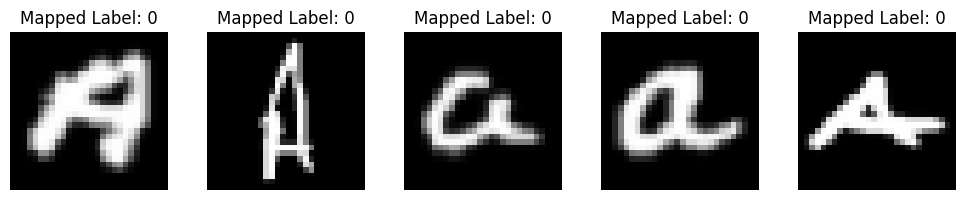

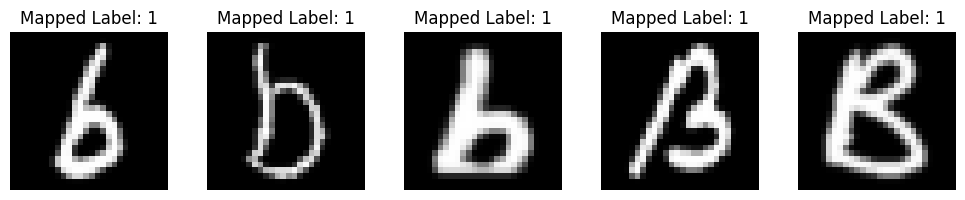

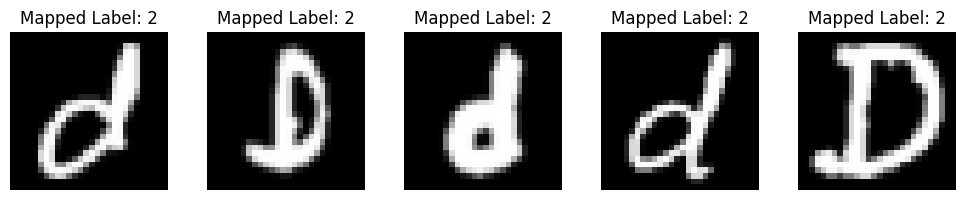

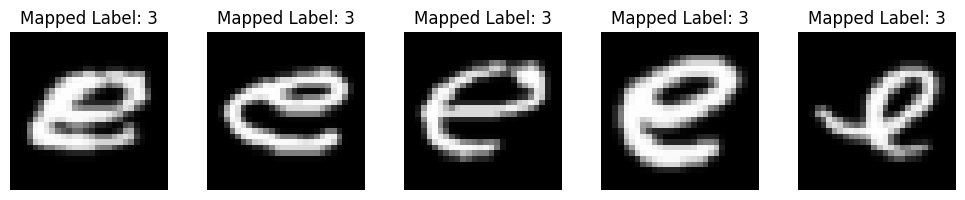

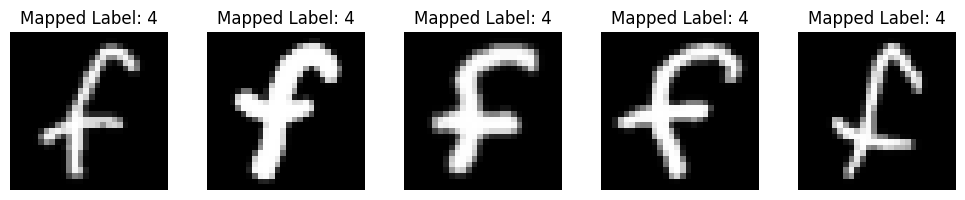

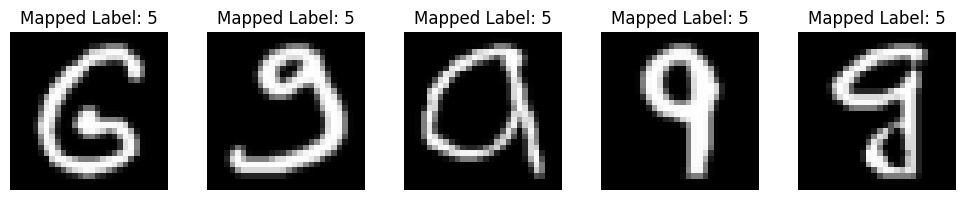

In [33]:
# Map original labels to 0–15
unique_labels = sorted(labels.unique())
label_map = {original: new for new, original in enumerate(unique_labels)}
df['mapped_label'] = df.iloc[:, 0].map(label_map)
mapped_labels = df['mapped_label'].values

# Helper function to plot images using re-mapped label (0–15)
def plot_mapped_class_images(mapped_class_label, n=5):
    indices = df[df['mapped_label'] == mapped_class_label].index[:n]
    plt.figure(figsize=(10, 2))
    for i, idx in enumerate(indices):
        img = images[idx].reshape(28, 28)
        plt.subplot(1, n, i + 1)
        plt.imshow(img.T, cmap='gray')  # Transpose to fix orientation
        plt.title(f"Mapped Label: {mapped_class_label}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Plot samples from re-mapped labels 0 to 5 (i.e., A to F)
for i in range(6):
    plot_mapped_class_images(i)


Unique labels after mapping: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


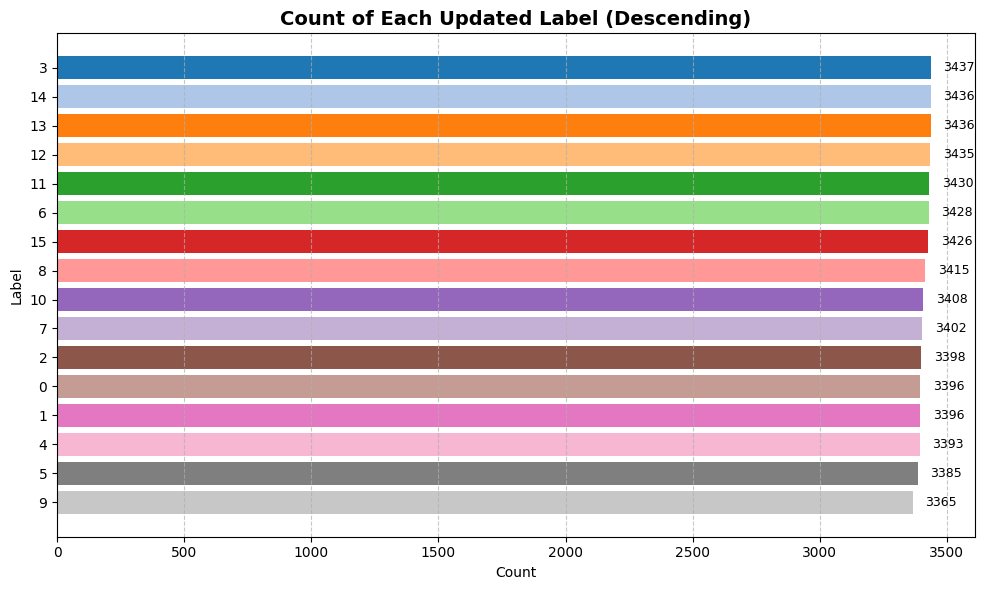

In [34]:
print("Unique labels after mapping:", sorted(np.unique(mapped_labels))) 

# Count occurrences using the updated labels
label_counts = pd.Series(mapped_labels).value_counts().sort_values(ascending=False)

# Plot as horizontal bar chart
plt.figure(figsize=(10, 6))
bars = plt.barh(label_counts.index.astype(str), label_counts.values, color=plt.cm.tab20.colors)

# Add count values next to bars
for bar, value in zip(bars, label_counts.values):
    plt.text(value + 50, bar.get_y() + bar.get_height()/2,
             str(value), va='center', fontsize=9)

plt.title("Count of Each Updated Label (Descending)", fontsize=14, fontweight='bold')
plt.xlabel("Count")
plt.ylabel("Label")
plt.gca().invert_yaxis()  # So highest count is at the top
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


-----------

## Image Average

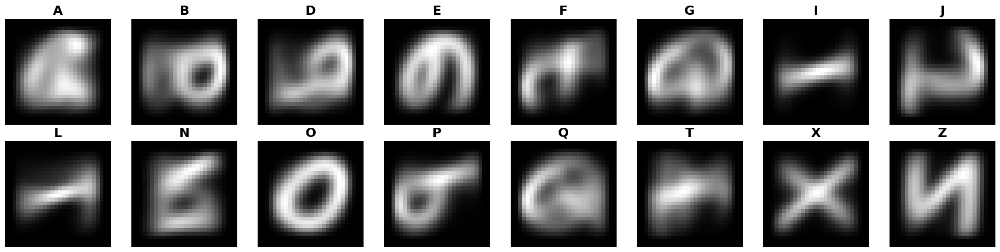

In [14]:
import numpy as np
import matplotlib.pyplot as plt


images = images.reshape(-1, 28, 28)
labels = np.asarray(labels).astype(int)

chosen = list("ABDEFGIJLNOPQTXZ")   # 16 letters
rows, cols = 2, 8
fig, ax = plt.subplots(rows, cols, figsize=(20, 5))
ax = ax.ravel()

for i, ch in enumerate(chosen):
    lab = ord(ch.lower()) - 96       # 'a'->1, ..., 'z'->26
    class_imgs = images[labels == lab]

    avg_img = np.mean(class_imgs, axis=0) if len(class_imgs) else np.zeros((28, 28))
    ax[i].imshow(avg_img, cmap='gray')
    ax[i].set_title(ch, fontsize=18, fontweight='bold')
    ax[i].axis('off')

# hide any leftover axes (shouldn't be any, but just in case)
for j in range(len(chosen), rows*cols):
    ax[j].axis('off')

plt.tight_layout()
plt.show()


Observations:
- Each label corresponds to a letter in the EMNIST dataset
- Labels -2 and -1 appear to be mostly blank or minimal marks
- Other labels (e.g., 1, 2, 4, 5, 6) show handwritten letter variations.
- Variation in handwriting style and stroke thickness may affect GAN training quality.
- Letters have both uppercase and lowercase in the same class

------

# Feature Engineering

### Image Preprocessing Summary

To prepare the EMNIST images for Conditional GAN training, the following preprocessing steps were applied:

1. **Reshape**  
   The flat image arrays were reshaped into 28×28 pixel format to match the original image dimensions.

2. **Rotate and Flip**  
   The EMNIST dataset stores images in a transposed and inverted format. We corrected this by rotating each image 90 degrees counter-clockwise and flipping it horizontally to restore proper orientation.

3. **Expand Dimensions**  
   A channel dimension was added to represent grayscale format, resulting in image shapes of (28, 28, 1) — required for convolutional neural networks.

4. **Normalize**  
   Pixel values were scaled from the original [0, 255] range to [-1, 1], which is important for stabilizing GAN training and matching the output activation (`tanh`) of the generator.


In [20]:
# Normalize pixel values to [-1, 1]
images = (images - 127.5) / 127.5

# Reshape and fix orientation: rotate 90° clockwise then flip horizontally
images = images.reshape(-1, 28, 28)
images = np.array([np.fliplr(np.rot90(img, k=-1)) for img in images])  # Changed k=1 to k=-1

# Reshape back to (N, 28, 28, 1) for CNN/GAN input
images = images.reshape(-1, 28, 28, 1)

# Confirm shape
print("Final image shape:", images.shape)

Final image shape: (54586, 28, 28, 1)


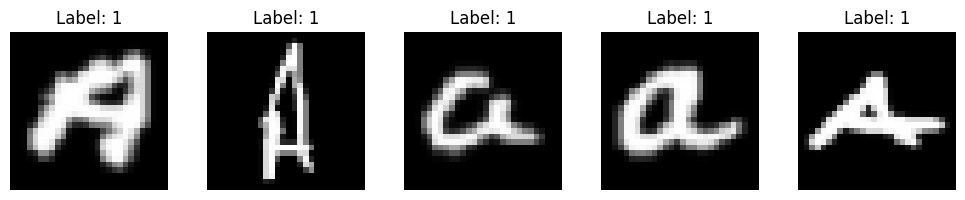

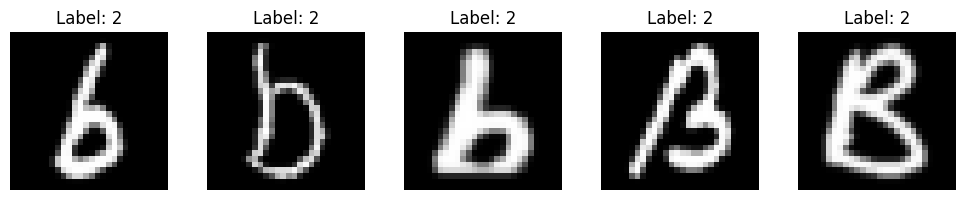

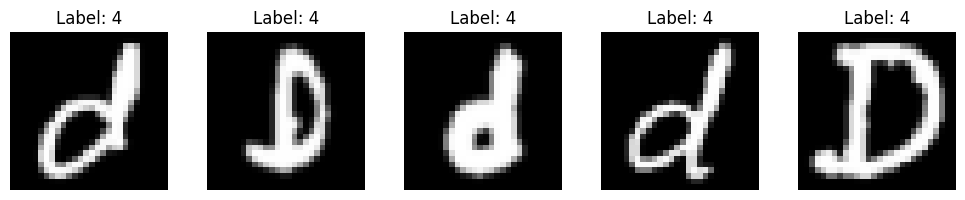

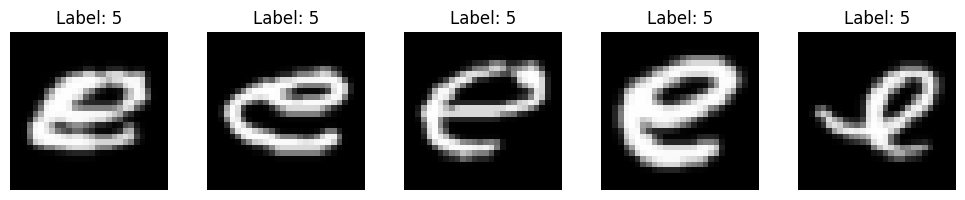

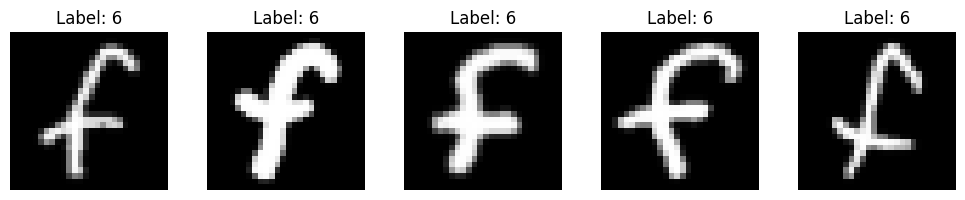

In [21]:
# Helper function to plot images by class
def plot_class_images(class_label, n=5):
    indices = df[df.iloc[:, 0] == class_label].index[:n]
    plt.figure(figsize=(10, 2))
    for i, idx in enumerate(indices):
        img = images[idx].reshape(28, 28)
        plt.subplot(1, n, i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(f"Label: {class_label}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

plot_class_images(1)
plot_class_images(2)
plot_class_images(4)
plot_class_images(5)
plot_class_images(6)

# Application of Multi-DCGANS

# Multi-DCGANS 16 Models - Baseline Modelling

### **Baseline DCGAN Generator**

| **Layer** | **Type** | **Parameters** | **Activation** | **Output Shape** |
|-----------|----------|----------------|----------------|------------------|
| Input | Input | `(latent_dim,)` | – | `(latent_dim,)` |
| Dense | Fully Connected | Units = `7×7×128` | ReLU | `(6272,)` |
| Reshape | Reshape | `(7, 7, 128)` | – | `(7, 7, 128)` |
| UpSampling2D | Upsampling | – | – | `(14, 14, 128)` |
| Conv2D | Conv | 128 filters, 3×3, padding = same | ReLU | `(14, 14, 128)` |
| BatchNormalization | BN | Default momentum | – | `(14, 14, 128)` |
| UpSampling2D | Upsampling | – | – | `(28, 28, 128)` |
| Conv2D | Conv | 64 filters, 3×3, padding = same | ReLU | `(28, 28, 64)` |
| BatchNormalization | BN | Default momentum | – | `(28, 28, 64)` |
| Conv2D | Conv | `channels` filters, 3×3, padding = same | Tanh | `(28, 28, channels)` |

---

### **Baseline DCGAN Discriminator**

| **Layer** | **Type** | **Parameters** | **Activation** | **Output Shape** |
|-----------|----------|----------------|----------------|------------------|
| Input | Input | `(28, 28, channels)` | – | `(28, 28, channels)` |
| Conv2D | Conv | 64 filters, 3×3, stride=2, padding = same | LeakyReLU(0.2) | `(14, 14, 64)` |
| Dropout | Dropout | 0.2 | – | `(14, 14, 64)` |
| Conv2D | Conv | 128 filters, 3×3, stride=2, padding = same | LeakyReLU(0.2) | `(7, 7, 128)` |
| BatchNormalization | BN | Default momentum | – | `(7, 7, 128)` |
| Dropout | Dropout | 0.3 | – | `(7, 7, 128)` |
| Flatten | Flatten | – | – | `(6272,)` |
| Dense | Fully Connected | Units = 1 | Sigmoid | `(1,)` |



### Configuration Parameters

`latent_dim = 150`  
Size of the random noise vector input to the generator.  
- **Higher values** → more variation and detail in generated images, but can make training slower and less stable.  
- **Lower values** → faster and more stable training, but risk of limited diversity and overly simple outputs.  
**This was chosen because** it balances detail and diversity for 28×28 grayscale images while keeping training stable.

`num_classes = 16`  
Total number of character classes in the dataset.  
- **Higher values** → model must learn to represent more categories, increasing difficulty.  
- **Lower values** → fewer categories, training is easier but less versatile.  
**This was chosen because** the dataset contains exactly 16 target charan and color format.

`batch_size = 64`  
Number of images processed in each training step.  
- **Higher values** → faster epoch completion, more stable gradient updates, but needs more memory.  
- **Lower values** → less memory needed, but training may be noisier and less stable.  
**This was chosen because** it offers a good trade-off between training speed, stability, and memory usage on available hardware.
ier and less stable.
d stability.
d stability.


In [22]:
latent_dim = 150
num_classes = 16
image_shape = (28, 28, 1)

---

### Baseline DCGAN Architecture Explanation

- **Generator**:  
  - Starts from a random noise vector (`latent_dim = 150`).  
  - Progressively upsamples to create a `28×28` image.  
  - `Dense` and `Reshape` layers form the initial feature map (`7×7×128`).  
  - `UpSampling` and `Conv2D` layers increase resolution step by step.  
  - `BatchNormalization` stabilizes training.  
  - Final `Conv2D` layer with `Tanh` outputs normalized grayscale images in the range `[-1, 1]`.

- **Discriminator**:  
  - Takes a `28×28` grayscale image (real or generated).  
  - Down-samples through `Conv2D` layers with `stride=2`.  
  - Uses `LeakyReLU` to preserve gradient flow for negative activations.  
  - `Dropout` regularizes the model to prevent overfitting.  
  - Final `Dense-Sigmoid` outputs the probability that the input is real.

- **Why this baseline works**:  
  - **Simple** for fast training.  
  - **Stable** due to proven DCGAN design choices.  
  - **Efficient** for low-resolution datasets.  
  - Ideal for benchmarking improvements.
ements.


In [23]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import UpSampling2D

latent_dim = 150
num_classes = 16
image_shape = (28, 28, 1)
batch_size = 64

# === Baseline Generator ===
def build_baseline_generator(latent_dim, channels=1):
    model = Sequential([
        Dense(7 * 7 * 128, activation='relu', input_dim=latent_dim),  # same units as CGAN
        Reshape((7, 7, 128)),

        UpSampling2D(),
        Conv2D(128, kernel_size=3, padding='same'),
        BatchNormalization(),
        Activation('relu'),

        UpSampling2D(),
        Conv2D(64, kernel_size=3, padding='same'),
        BatchNormalization(),
        Activation('relu'),

        Conv2D(channels, kernel_size=3, padding='same'),
        Activation('tanh'),
    ])

    noise = Input(shape=(latent_dim,))
    img = model(noise)
    return Model(noise, img, name="DCGAN_Generator")


# === Baseline Discriminator ===
def build_baseline_discriminator(img_shape):
    model = Sequential([
        Conv2D(64, kernel_size=3, strides=2, padding='same', input_shape=img_shape),
        LeakyReLU(alpha=0.2),
        Dropout(0.2),  # same as CGAN

        Conv2D(128, kernel_size=3, strides=2, padding='same'),
        BatchNormalization(),
        LeakyReLU(alpha=0.2),
        Dropout(0.3),  # same as CGAN

        Flatten(),
        Dense(1, activation='sigmoid'),
    ])

    img = Input(shape=img_shape)
    validity = model(img)
    return Model(img, validity, name="DCGAN_Discriminator")


----

### Instantiate Models — Summary

 **Generator (`gen`)**  
  Created using `build_baseline_generator(latent_dim, channels=1)`.  
  - `latent_dim`: size of the noise input vector.  
  - `channels=1`: output is grayscale images.

- **Discriminator (`disc`)**  
  Created using `build_baseline_discriminator(image_shape)`.  
  - `image_shape`: `(28, 28, 1)` for grayscale input.

- **Model Summaries**  
  `gen.summary()` and `disc.summary()` print each model’s architecture, layer types, output shapes, and parameter counts for verification.

- **Training Loop by Class**  
  The `for c in range(num_classes):` loop trains a separate DCGAN for each class using its class-specific dataset from `prepare_class_datasets()`.

In [28]:
## Instatantiate Models 
gen = build_baseline_generator(latent_dim, channels=1)
disc = build_baseline_discriminator(image_shape)

print("=== Generator Summary ===")
gen.summary()
print("\n=== Discriminator Summary ===")
disc.summary()




=== Generator Summary ===
Model: "DCGAN_Generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 150)]             0         
                                                                 
 sequential_1 (Sequential)   (None, 28, 28, 1)         1169793   
                                                                 
Total params: 1,169,793
Trainable params: 1,169,409
Non-trainable params: 384
_________________________________________________________________

=== Discriminator Summary ===
Model: "DCGAN_Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 sequential_2 (Sequential)   (None, 1)                 81281     
                   

----------

### DCGAN Training Class (`DCGANModel`) — Summary

A custom `tf.keras.Model` that wraps the `generator` and `discriminator` for training with `fit()`. It defines custom losses, a `train_step`, and tracks `g_loss`, `d_loss`, and `d_accuracy`.

- **Key Components**  
  - `generator`, `discriminator`: models being trained.  
  - `latent_dim`: size of noise input to the generator.  
  - `loss_fn`: Binary Crossentropy (with optional logits).  
  - Metric trackers for per-epoch averages.

- **Losses**  
  - `generator_loss`: encourages fakes to be classified as real.  
  - `discriminator_loss`: real labels smoothed to `0.9`, fake labels `0`, averaged for stability.

- **Training Flow**  
  1. Generate fakes from random noise.  
  2. Get discriminator outputs for real and fake images.  
  3. Compute `d_loss` and `g_loss`.  
  4. Backpropagate and update each model separately.  
  5. Calculate `d_accuracy` (average of real and fake classification rates).  

- **Why This Design Works**  
  - Label smoothing prevents overconfident discriminator.  
  - Separate optimizers allow different learning settings.  
  - Works seamlessly with Keras callbacks, logs, and plots.


In [51]:
# DCGAN training class
class DCGANModel(tf.keras.Model):
    def __init__(self, generator, discriminator, latent_dim, from_logits=False):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.loss_fn = tf.keras.losses.BinaryCrossentropy(from_logits=from_logits)
        self.from_logits = from_logits

        # Trackers so Keras logs per-epoch averages into history.history
        self.g_loss_tracker = tf.keras.metrics.Mean(name="g_loss")
        self.d_loss_tracker = tf.keras.metrics.Mean(name="d_loss")
        self.d_acc_tracker  = tf.keras.metrics.Mean(name="d_accuracy")

    def compile(self, g_optimizer, d_optimizer):
        super().compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer

    @property
    def metrics(self):
        return [self.g_loss_tracker, self.d_loss_tracker, self.d_acc_tracker]

    def generator_loss(self, fake_output):
        return self.loss_fn(tf.ones_like(fake_output), fake_output)

    def discriminator_loss(self, real_output, fake_output):
        real_loss = self.loss_fn(tf.ones_like(real_output) * 0.9, real_output)  # smoothing
        fake_loss = self.loss_fn(tf.zeros_like(fake_output), fake_output)
        return (real_loss + fake_loss) / 2.0

    # Remove @tf.function until everything works
    def train_step(self, real_images):
        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal([batch_size, self.latent_dim])

        with tf.GradientTape() as disc_tape, tf.GradientTape() as gen_tape:
            fake_images = self.generator(noise, training=True)
            real_out = self.discriminator(real_images, training=True)
            fake_out = self.discriminator(fake_images, training=True)

            d_loss = self.discriminator_loss(real_out, fake_out)
            g_loss = self.generator_loss(fake_out)

        d_grads = disc_tape.gradient(d_loss, self.discriminator.trainable_variables)
        g_grads = gen_tape.gradient(g_loss, self.generator.trainable_variables)
        self.d_optimizer.apply_gradients(zip(d_grads, self.discriminator.trainable_variables))
        self.g_optimizer.apply_gradients(zip(g_grads, self.generator.trainable_variables))

        # Accuracy calc (probabilities: threshold 0.5; logits: threshold 0.0)
        thr = 0.0 if self.loss_fn.from_logits else 0.5
        real_correct = tf.cast(real_out > thr, tf.float32)
        fake_correct = tf.cast(fake_out < thr, tf.float32)
        d_acc = 0.5 * (tf.reduce_mean(real_correct) + tf.reduce_mean(fake_correct))

        # Update trackers
        self.g_loss_tracker.update_state(g_loss)
        self.d_loss_tracker.update_state(d_loss)
        self.d_acc_tracker.update_state(d_acc)

        return {"g_loss": self.g_loss_tracker.result(),
                "d_loss": self.d_loss_tracker.result(),
                "d_accuracy": self.d_acc_tracker.result()}


----------

### Prepare Class-Wise Datasets (`prepare_class_datasets`) — Summary

- **What it does**  
  Splits the full dataset into **one `tf.data.Dataset` per class**, e.g. `class_datasets[0]`, `class_datasets[1]`, …, `class_datasets[15]`.

- **How it works**
  - Filters images: `class_imgs = images[labels == c]`  
  - Builds pipeline: `tf.data.Dataset.from_tensor_slices(class_imgs)` → `shuffle(10000)` → `batch(batch_size)` → `prefetch(tf.data.AUTOTUNE)`

- **Why this is useful**  
  - Enables **per-class DCGAN training** (one model per class).  
  - Clean data input with shuffling, batching, and prefetching for stability.

- **Key parameters**
  - `batch_size`: controls mini-batch size (e.g., `64`) for memory/speed trade-off.  
  - `buffer_size=10000`: large shuffle buffer → better mixing of samples.  
  - `num_classes=16`: iterates classes `0..15`.


In [52]:
# Prepare datasets by class
def prepare_class_datasets(images, labels, batch_size=64, num_classes=16):
    class_datasets = {}
    for c in range(num_classes):
        class_imgs = images[labels == c]
        dataset = tf.data.Dataset.from_tensor_slices(class_imgs) \
                               .shuffle(buffer_size=10000) \
                               .batch(batch_size) \
                               .prefetch(tf.data.AUTOTUNE)
        class_datasets[c] = dataset
    return class_datasets


------------

### Per-Class DCGAN Training Loop — Summary


- **Setup**
  - `epochs = 50`: train each class-specific DCGAN for 50 epochs.
  - `histories`: dict to record `g_loss`, `d_loss`, `d_accuracy` per class across epochs.
  - `dcgan_models`: stores the trained `DCGANModel` for each class.

- **Per-Class Initialization**
  - For each class `c`:
    - Build fresh `G = build_baseline_generator(latent_dim, channels=1)` and `D = build_baseline_discriminator(image_shape)`.
    - Wrap into `dcgan = DCGANModel(G, D, latent_dim, from_logits=False)` (use `from_logits=False` if `D` ends with `sigmoid`).
    - Compile with `Adam(0.0002, 0.5)` for both G and D (DCGAN best-practice: lower LR with `β1=0.5` for stability).

- **Training & Logging**
  - `dcgan.fit(class_datasets[c], epochs=1, verbose=0)` runs one epoch and returns a History.
  - Extract per-epoch metrics:
    - `g_loss`: how well G is fooling D (lower is better).
    - `d_loss`: how well D separates real/fake (balanced, not too low/high).
    - `d_accuracy`: average of (real→real, fake→fake) correctness.
  - Append metrics to `histories[c]` and print a concise log line:
    ```
    [Class c | Epoch e] G_loss=...  D_loss=...  D_acc=...
    ```

- **Periodic Preview**
  - Every 50 epochs, generate a sample:
    - `noise ~ N(0, I)` → `G(noise)`
    - Rescale from `[-1, 1]` to `[0, 1]` and `imshow` with `cmap='gray'`.
  - Gives a quick visual check of class-specific generation quality.

- **Model Storage**
  - After training, save the trained `dcgan` in `dcgan_models[c]` for later sampling/evaluation.

- **Why These Choices**
  - **Fresh G/D per class**: encourages each model to specialize on that class’s distribution.
  - **Adam(0.0002, 0.5)**: canonical DCGAN settings that reduce oscillations and mode collapse risk.
  - **`from_logits=False`**: matches a discriminator that outputs probabilities (`sigmoid`); keep consistent with the loss.



=== Training DCGAN for class 0 ===
[Class 0 | Epoch 001] G_loss=1.0386  D_loss=0.6510  D_acc=0.661
[Class 0 | Epoch 002] G_loss=1.0614  D_loss=0.6742  D_acc=0.612
[Class 0 | Epoch 003] G_loss=1.1192  D_loss=0.6334  D_acc=0.654
[Class 0 | Epoch 004] G_loss=1.0739  D_loss=0.6543  D_acc=0.631
[Class 0 | Epoch 005] G_loss=1.0216  D_loss=0.6864  D_acc=0.602
[Class 0 | Epoch 006] G_loss=0.9825  D_loss=0.6879  D_acc=0.583
[Class 0 | Epoch 007] G_loss=0.9828  D_loss=0.6882  D_acc=0.584
[Class 0 | Epoch 008] G_loss=0.9745  D_loss=0.6868  D_acc=0.582
[Class 0 | Epoch 009] G_loss=0.9970  D_loss=0.6671  D_acc=0.600
[Class 0 | Epoch 010] G_loss=0.9963  D_loss=0.6616  D_acc=0.623
[Class 0 | Epoch 011] G_loss=1.0346  D_loss=0.6506  D_acc=0.633
[Class 0 | Epoch 012] G_loss=1.0415  D_loss=0.6457  D_acc=0.627
[Class 0 | Epoch 013] G_loss=1.0516  D_loss=0.6305  D_acc=0.650
[Class 0 | Epoch 014] G_loss=1.0495  D_loss=0.6338  D_acc=0.648
[Class 0 | Epoch 015] G_loss=1.0718  D_loss=0.6145  D_acc=0.667
[Cla

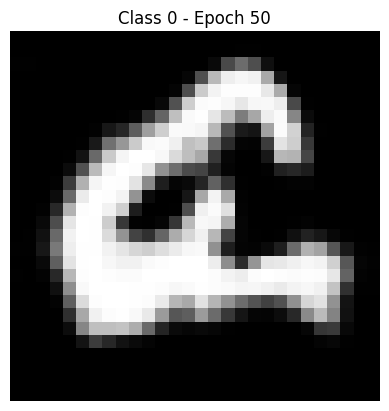


=== Training DCGAN for class 1 ===
[Class 1 | Epoch 001] G_loss=1.1714  D_loss=0.5639  D_acc=0.747
[Class 1 | Epoch 002] G_loss=1.1196  D_loss=0.6731  D_acc=0.639
[Class 1 | Epoch 003] G_loss=1.2650  D_loss=0.5606  D_acc=0.738
[Class 1 | Epoch 004] G_loss=1.2491  D_loss=0.5723  D_acc=0.724
[Class 1 | Epoch 005] G_loss=1.1792  D_loss=0.6015  D_acc=0.694
[Class 1 | Epoch 006] G_loss=1.1160  D_loss=0.6311  D_acc=0.658
[Class 1 | Epoch 007] G_loss=1.1056  D_loss=0.6324  D_acc=0.653
[Class 1 | Epoch 008] G_loss=1.0679  D_loss=0.6496  D_acc=0.637
[Class 1 | Epoch 009] G_loss=1.0529  D_loss=0.6458  D_acc=0.637
[Class 1 | Epoch 010] G_loss=1.0598  D_loss=0.6442  D_acc=0.640
[Class 1 | Epoch 011] G_loss=1.0444  D_loss=0.6415  D_acc=0.635
[Class 1 | Epoch 012] G_loss=1.0502  D_loss=0.6415  D_acc=0.637
[Class 1 | Epoch 013] G_loss=1.0458  D_loss=0.6352  D_acc=0.649
[Class 1 | Epoch 014] G_loss=1.0490  D_loss=0.6371  D_acc=0.647
[Class 1 | Epoch 015] G_loss=1.0466  D_loss=0.6337  D_acc=0.648
[Cla

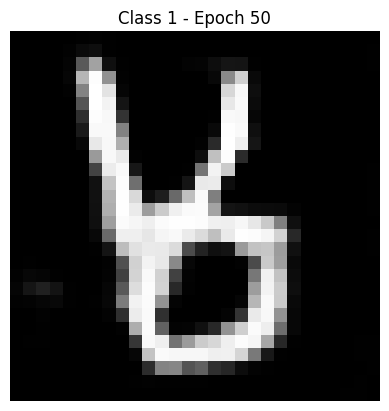


=== Training DCGAN for class 2 ===
[Class 2 | Epoch 001] G_loss=1.1452  D_loss=0.5410  D_acc=0.772
[Class 2 | Epoch 002] G_loss=1.0939  D_loss=0.6757  D_acc=0.640
[Class 2 | Epoch 003] G_loss=1.2892  D_loss=0.5559  D_acc=0.728
[Class 2 | Epoch 004] G_loss=1.2523  D_loss=0.5750  D_acc=0.718
[Class 2 | Epoch 005] G_loss=1.1628  D_loss=0.6107  D_acc=0.676
[Class 2 | Epoch 006] G_loss=1.1098  D_loss=0.6403  D_acc=0.650
[Class 2 | Epoch 007] G_loss=1.0595  D_loss=0.6554  D_acc=0.627
[Class 2 | Epoch 008] G_loss=1.0652  D_loss=0.6442  D_acc=0.644
[Class 2 | Epoch 009] G_loss=1.0652  D_loss=0.6315  D_acc=0.653
[Class 2 | Epoch 010] G_loss=1.0765  D_loss=0.6223  D_acc=0.658
[Class 2 | Epoch 011] G_loss=1.1100  D_loss=0.6049  D_acc=0.681
[Class 2 | Epoch 012] G_loss=1.0989  D_loss=0.6078  D_acc=0.681
[Class 2 | Epoch 013] G_loss=1.1186  D_loss=0.5992  D_acc=0.684
[Class 2 | Epoch 014] G_loss=1.1415  D_loss=0.5985  D_acc=0.687
[Class 2 | Epoch 015] G_loss=1.1248  D_loss=0.5965  D_acc=0.686
[Cla

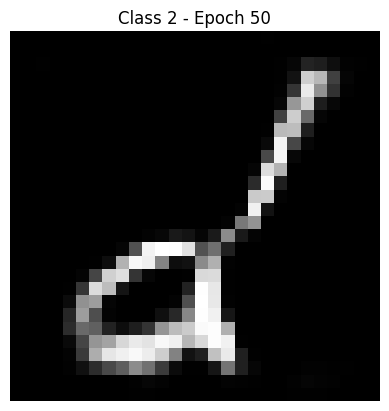


=== Training DCGAN for class 3 ===
[Class 3 | Epoch 001] G_loss=1.4764  D_loss=0.4372  D_acc=0.863
[Class 3 | Epoch 002] G_loss=1.1750  D_loss=0.6372  D_acc=0.667
[Class 3 | Epoch 003] G_loss=1.2351  D_loss=0.5801  D_acc=0.711
[Class 3 | Epoch 004] G_loss=1.1795  D_loss=0.6028  D_acc=0.689
[Class 3 | Epoch 005] G_loss=1.0970  D_loss=0.6433  D_acc=0.642
[Class 3 | Epoch 006] G_loss=1.0910  D_loss=0.6420  D_acc=0.650
[Class 3 | Epoch 007] G_loss=1.0897  D_loss=0.6321  D_acc=0.647
[Class 3 | Epoch 008] G_loss=1.0598  D_loss=0.6483  D_acc=0.634
[Class 3 | Epoch 009] G_loss=1.0667  D_loss=0.6389  D_acc=0.648
[Class 3 | Epoch 010] G_loss=1.0400  D_loss=0.6537  D_acc=0.626
[Class 3 | Epoch 011] G_loss=1.0324  D_loss=0.6483  D_acc=0.628
[Class 3 | Epoch 012] G_loss=1.0334  D_loss=0.6487  D_acc=0.630
[Class 3 | Epoch 013] G_loss=1.0515  D_loss=0.6466  D_acc=0.629
[Class 3 | Epoch 014] G_loss=1.0516  D_loss=0.6471  D_acc=0.636
[Class 3 | Epoch 015] G_loss=1.0335  D_loss=0.6447  D_acc=0.635
[Cla

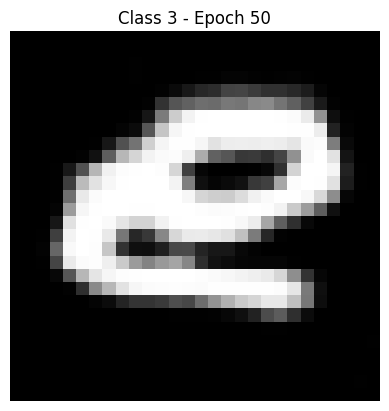


=== Training DCGAN for class 4 ===
[Class 4 | Epoch 001] G_loss=1.1932  D_loss=0.5132  D_acc=0.795
[Class 4 | Epoch 002] G_loss=1.1142  D_loss=0.6665  D_acc=0.645
[Class 4 | Epoch 003] G_loss=1.2624  D_loss=0.5676  D_acc=0.720
[Class 4 | Epoch 004] G_loss=1.2702  D_loss=0.5678  D_acc=0.725
[Class 4 | Epoch 005] G_loss=1.1651  D_loss=0.6204  D_acc=0.673
[Class 4 | Epoch 006] G_loss=1.1045  D_loss=0.6427  D_acc=0.658
[Class 4 | Epoch 007] G_loss=1.0486  D_loss=0.6738  D_acc=0.615
[Class 4 | Epoch 008] G_loss=1.0121  D_loss=0.6800  D_acc=0.604
[Class 4 | Epoch 009] G_loss=1.0105  D_loss=0.6706  D_acc=0.608
[Class 4 | Epoch 010] G_loss=1.0138  D_loss=0.6573  D_acc=0.619
[Class 4 | Epoch 011] G_loss=1.0412  D_loss=0.6437  D_acc=0.636
[Class 4 | Epoch 012] G_loss=1.0498  D_loss=0.6338  D_acc=0.650
[Class 4 | Epoch 013] G_loss=1.0511  D_loss=0.6427  D_acc=0.643
[Class 4 | Epoch 014] G_loss=1.0188  D_loss=0.6533  D_acc=0.624
[Class 4 | Epoch 015] G_loss=1.0042  D_loss=0.6540  D_acc=0.632
[Cla

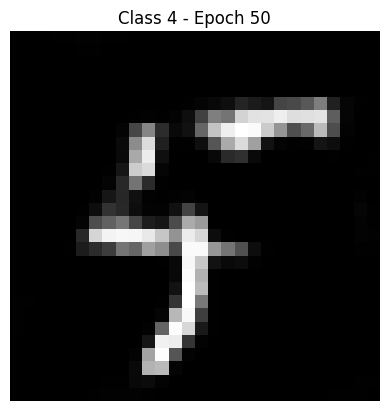


=== Training DCGAN for class 5 ===
[Class 5 | Epoch 001] G_loss=0.9468  D_loss=0.6881  D_acc=0.626
[Class 5 | Epoch 002] G_loss=1.0989  D_loss=0.6693  D_acc=0.626
[Class 5 | Epoch 003] G_loss=1.1837  D_loss=0.6067  D_acc=0.680
[Class 5 | Epoch 004] G_loss=1.1286  D_loss=0.6280  D_acc=0.674
[Class 5 | Epoch 005] G_loss=1.0986  D_loss=0.6413  D_acc=0.645
[Class 5 | Epoch 006] G_loss=1.0272  D_loss=0.6713  D_acc=0.617
[Class 5 | Epoch 007] G_loss=1.0069  D_loss=0.6826  D_acc=0.601
[Class 5 | Epoch 008] G_loss=1.0213  D_loss=0.6619  D_acc=0.623
[Class 5 | Epoch 009] G_loss=1.0214  D_loss=0.6548  D_acc=0.627
[Class 5 | Epoch 010] G_loss=1.0304  D_loss=0.6455  D_acc=0.630
[Class 5 | Epoch 011] G_loss=1.0478  D_loss=0.6360  D_acc=0.642
[Class 5 | Epoch 012] G_loss=1.0753  D_loss=0.6236  D_acc=0.659
[Class 5 | Epoch 013] G_loss=1.0579  D_loss=0.6295  D_acc=0.653
[Class 5 | Epoch 014] G_loss=1.0653  D_loss=0.6245  D_acc=0.653
[Class 5 | Epoch 015] G_loss=1.0698  D_loss=0.6185  D_acc=0.668
[Cla

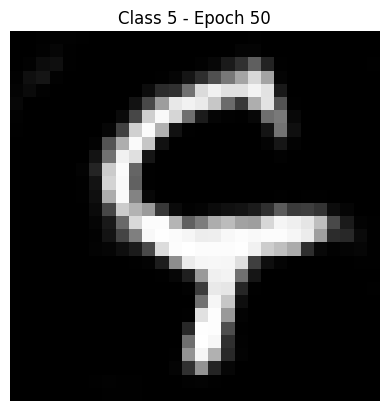


=== Training DCGAN for class 6 ===
[Class 6 | Epoch 001] G_loss=1.3226  D_loss=0.5149  D_acc=0.795
[Class 6 | Epoch 002] G_loss=1.1253  D_loss=0.6374  D_acc=0.673
[Class 6 | Epoch 003] G_loss=1.0565  D_loss=0.6665  D_acc=0.609
[Class 6 | Epoch 004] G_loss=1.0294  D_loss=0.6741  D_acc=0.600
[Class 6 | Epoch 005] G_loss=1.0198  D_loss=0.6815  D_acc=0.598
[Class 6 | Epoch 006] G_loss=1.0092  D_loss=0.6768  D_acc=0.600
[Class 6 | Epoch 007] G_loss=1.0292  D_loss=0.6510  D_acc=0.628
[Class 6 | Epoch 008] G_loss=1.0481  D_loss=0.6434  D_acc=0.640
[Class 6 | Epoch 009] G_loss=1.0312  D_loss=0.6440  D_acc=0.637
[Class 6 | Epoch 010] G_loss=1.0655  D_loss=0.6213  D_acc=0.663
[Class 6 | Epoch 011] G_loss=1.0500  D_loss=0.6385  D_acc=0.638
[Class 6 | Epoch 012] G_loss=1.0450  D_loss=0.6270  D_acc=0.650
[Class 6 | Epoch 013] G_loss=1.0529  D_loss=0.6309  D_acc=0.652
[Class 6 | Epoch 014] G_loss=1.0277  D_loss=0.6302  D_acc=0.645
[Class 6 | Epoch 015] G_loss=1.0203  D_loss=0.6406  D_acc=0.638
[Cla

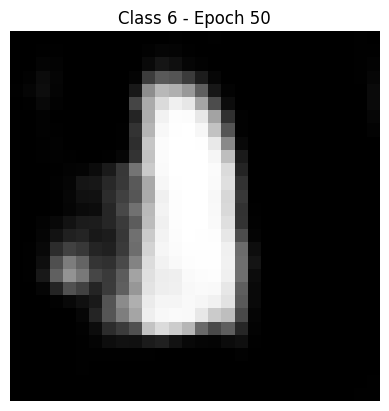


=== Training DCGAN for class 7 ===
[Class 7 | Epoch 001] G_loss=1.4097  D_loss=0.4615  D_acc=0.836
[Class 7 | Epoch 002] G_loss=1.1377  D_loss=0.6567  D_acc=0.650
[Class 7 | Epoch 003] G_loss=1.3615  D_loss=0.5432  D_acc=0.746
[Class 7 | Epoch 004] G_loss=1.3166  D_loss=0.5554  D_acc=0.741
[Class 7 | Epoch 005] G_loss=1.2213  D_loss=0.6104  D_acc=0.689
[Class 7 | Epoch 006] G_loss=1.1257  D_loss=0.6465  D_acc=0.649
[Class 7 | Epoch 007] G_loss=1.0681  D_loss=0.6668  D_acc=0.622
[Class 7 | Epoch 008] G_loss=1.0197  D_loss=0.6686  D_acc=0.614
[Class 7 | Epoch 009] G_loss=1.0539  D_loss=0.6460  D_acc=0.633
[Class 7 | Epoch 010] G_loss=1.0456  D_loss=0.6362  D_acc=0.650
[Class 7 | Epoch 011] G_loss=1.0511  D_loss=0.6340  D_acc=0.650
[Class 7 | Epoch 012] G_loss=1.0568  D_loss=0.6243  D_acc=0.659
[Class 7 | Epoch 013] G_loss=1.0822  D_loss=0.6186  D_acc=0.667
[Class 7 | Epoch 014] G_loss=1.0869  D_loss=0.6111  D_acc=0.679
[Class 7 | Epoch 015] G_loss=1.1087  D_loss=0.6066  D_acc=0.682
[Cla

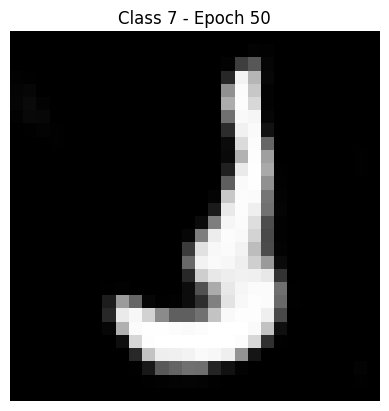


=== Training DCGAN for class 8 ===
[Class 8 | Epoch 001] G_loss=1.0410  D_loss=0.6483  D_acc=0.662
[Class 8 | Epoch 002] G_loss=1.0623  D_loss=0.6983  D_acc=0.608
[Class 8 | Epoch 003] G_loss=1.1522  D_loss=0.6166  D_acc=0.675
[Class 8 | Epoch 004] G_loss=1.1292  D_loss=0.6546  D_acc=0.634
[Class 8 | Epoch 005] G_loss=1.0804  D_loss=0.6589  D_acc=0.633
[Class 8 | Epoch 006] G_loss=1.0794  D_loss=0.6437  D_acc=0.636
[Class 8 | Epoch 007] G_loss=1.0794  D_loss=0.6375  D_acc=0.646
[Class 8 | Epoch 008] G_loss=1.0876  D_loss=0.6246  D_acc=0.658
[Class 8 | Epoch 009] G_loss=1.1001  D_loss=0.6259  D_acc=0.662
[Class 8 | Epoch 010] G_loss=1.1071  D_loss=0.6175  D_acc=0.669
[Class 8 | Epoch 011] G_loss=1.0892  D_loss=0.6191  D_acc=0.674
[Class 8 | Epoch 012] G_loss=1.0784  D_loss=0.6238  D_acc=0.659
[Class 8 | Epoch 013] G_loss=1.0646  D_loss=0.6239  D_acc=0.660
[Class 8 | Epoch 014] G_loss=1.0572  D_loss=0.6259  D_acc=0.655
[Class 8 | Epoch 015] G_loss=1.0629  D_loss=0.6194  D_acc=0.661
[Cla

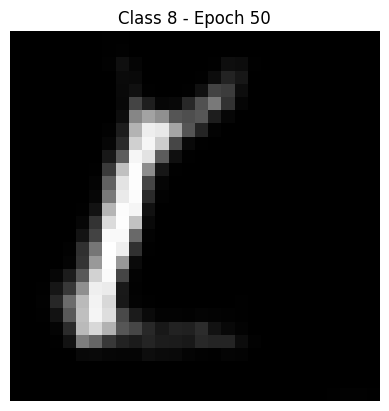


=== Training DCGAN for class 9 ===
[Class 9 | Epoch 001] G_loss=1.0636  D_loss=0.6391  D_acc=0.681
[Class 9 | Epoch 002] G_loss=1.1021  D_loss=0.6654  D_acc=0.633
[Class 9 | Epoch 003] G_loss=1.1259  D_loss=0.6376  D_acc=0.643
[Class 9 | Epoch 004] G_loss=1.0588  D_loss=0.6671  D_acc=0.609
[Class 9 | Epoch 005] G_loss=1.0020  D_loss=0.6955  D_acc=0.584
[Class 9 | Epoch 006] G_loss=0.9932  D_loss=0.6872  D_acc=0.593
[Class 9 | Epoch 007] G_loss=1.0040  D_loss=0.6764  D_acc=0.596
[Class 9 | Epoch 008] G_loss=1.0052  D_loss=0.6678  D_acc=0.610
[Class 9 | Epoch 009] G_loss=1.0099  D_loss=0.6643  D_acc=0.612
[Class 9 | Epoch 010] G_loss=1.0166  D_loss=0.6543  D_acc=0.623
[Class 9 | Epoch 011] G_loss=1.0273  D_loss=0.6463  D_acc=0.629
[Class 9 | Epoch 012] G_loss=1.0179  D_loss=0.6441  D_acc=0.634
[Class 9 | Epoch 013] G_loss=1.0415  D_loss=0.6313  D_acc=0.652
[Class 9 | Epoch 014] G_loss=1.0607  D_loss=0.6263  D_acc=0.651
[Class 9 | Epoch 015] G_loss=1.0552  D_loss=0.6301  D_acc=0.649
[Cla

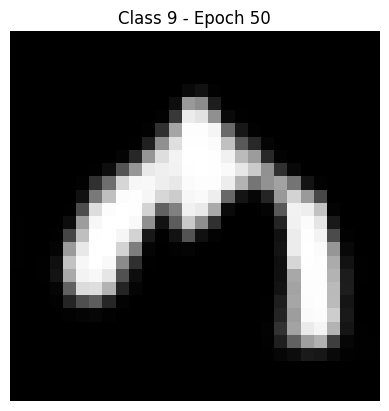


=== Training DCGAN for class 10 ===
[Class 10 | Epoch 001] G_loss=1.2368  D_loss=0.5623  D_acc=0.746
[Class 10 | Epoch 002] G_loss=1.1850  D_loss=0.6115  D_acc=0.692
[Class 10 | Epoch 003] G_loss=1.1789  D_loss=0.5993  D_acc=0.687
[Class 10 | Epoch 004] G_loss=1.1869  D_loss=0.6064  D_acc=0.681
[Class 10 | Epoch 005] G_loss=1.1201  D_loss=0.6298  D_acc=0.656
[Class 10 | Epoch 006] G_loss=1.1017  D_loss=0.6336  D_acc=0.649
[Class 10 | Epoch 007] G_loss=1.0831  D_loss=0.6363  D_acc=0.644
[Class 10 | Epoch 008] G_loss=1.0741  D_loss=0.6367  D_acc=0.645
[Class 10 | Epoch 009] G_loss=1.0307  D_loss=0.6509  D_acc=0.624
[Class 10 | Epoch 010] G_loss=1.0423  D_loss=0.6510  D_acc=0.625
[Class 10 | Epoch 011] G_loss=1.0326  D_loss=0.6512  D_acc=0.620
[Class 10 | Epoch 012] G_loss=1.0429  D_loss=0.6461  D_acc=0.631
[Class 10 | Epoch 013] G_loss=1.0125  D_loss=0.6595  D_acc=0.608
[Class 10 | Epoch 014] G_loss=1.0145  D_loss=0.6575  D_acc=0.624
[Class 10 | Epoch 015] G_loss=1.0146  D_loss=0.6528  

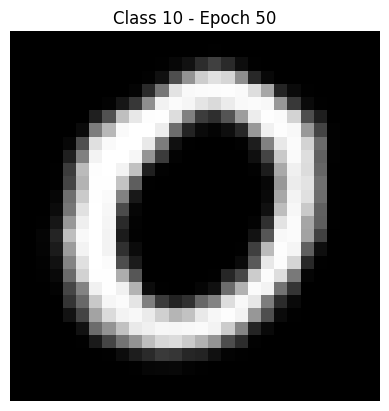


=== Training DCGAN for class 11 ===
[Class 11 | Epoch 001] G_loss=1.1586  D_loss=0.5874  D_acc=0.718
[Class 11 | Epoch 002] G_loss=1.1426  D_loss=0.6499  D_acc=0.655
[Class 11 | Epoch 003] G_loss=1.2834  D_loss=0.5535  D_acc=0.736
[Class 11 | Epoch 004] G_loss=1.2393  D_loss=0.5747  D_acc=0.718
[Class 11 | Epoch 005] G_loss=1.1556  D_loss=0.6212  D_acc=0.678
[Class 11 | Epoch 006] G_loss=1.1314  D_loss=0.6325  D_acc=0.651
[Class 11 | Epoch 007] G_loss=1.0758  D_loss=0.6464  D_acc=0.643
[Class 11 | Epoch 008] G_loss=1.0773  D_loss=0.6418  D_acc=0.641
[Class 11 | Epoch 009] G_loss=1.0658  D_loss=0.6426  D_acc=0.642
[Class 11 | Epoch 010] G_loss=1.0619  D_loss=0.6454  D_acc=0.635
[Class 11 | Epoch 011] G_loss=1.0615  D_loss=0.6347  D_acc=0.650
[Class 11 | Epoch 012] G_loss=1.0406  D_loss=0.6359  D_acc=0.647
[Class 11 | Epoch 013] G_loss=1.0411  D_loss=0.6400  D_acc=0.642
[Class 11 | Epoch 014] G_loss=1.0572  D_loss=0.6254  D_acc=0.658
[Class 11 | Epoch 015] G_loss=1.0521  D_loss=0.6296  

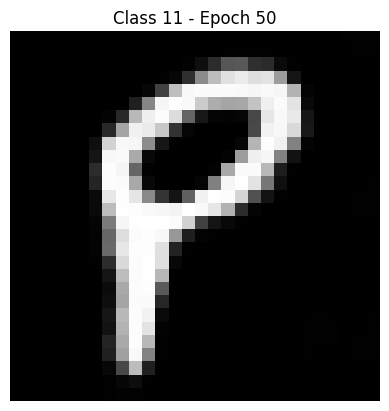


=== Training DCGAN for class 12 ===
[Class 12 | Epoch 001] G_loss=1.1934  D_loss=0.5469  D_acc=0.757
[Class 12 | Epoch 002] G_loss=1.0485  D_loss=0.6956  D_acc=0.625
[Class 12 | Epoch 003] G_loss=1.2280  D_loss=0.5822  D_acc=0.708
[Class 12 | Epoch 004] G_loss=1.2158  D_loss=0.6030  D_acc=0.689
[Class 12 | Epoch 005] G_loss=1.1449  D_loss=0.6203  D_acc=0.671
[Class 12 | Epoch 006] G_loss=1.0832  D_loss=0.6438  D_acc=0.658
[Class 12 | Epoch 007] G_loss=1.0473  D_loss=0.6571  D_acc=0.635
[Class 12 | Epoch 008] G_loss=1.0594  D_loss=0.6528  D_acc=0.640
[Class 12 | Epoch 009] G_loss=1.0523  D_loss=0.6419  D_acc=0.642
[Class 12 | Epoch 010] G_loss=1.0555  D_loss=0.6386  D_acc=0.652
[Class 12 | Epoch 011] G_loss=1.0860  D_loss=0.6311  D_acc=0.662
[Class 12 | Epoch 012] G_loss=1.0963  D_loss=0.6183  D_acc=0.672
[Class 12 | Epoch 013] G_loss=1.0667  D_loss=0.6345  D_acc=0.649
[Class 12 | Epoch 014] G_loss=1.0965  D_loss=0.6108  D_acc=0.676
[Class 12 | Epoch 015] G_loss=1.1105  D_loss=0.6048  

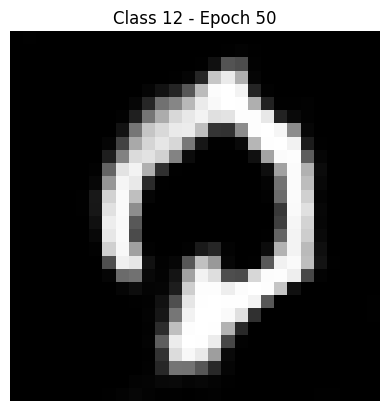


=== Training DCGAN for class 13 ===
[Class 13 | Epoch 001] G_loss=1.0249  D_loss=0.6423  D_acc=0.665
[Class 13 | Epoch 002] G_loss=1.1391  D_loss=0.6388  D_acc=0.653
[Class 13 | Epoch 003] G_loss=1.1840  D_loss=0.6137  D_acc=0.676
[Class 13 | Epoch 004] G_loss=1.1519  D_loss=0.6094  D_acc=0.684
[Class 13 | Epoch 005] G_loss=1.1024  D_loss=0.6317  D_acc=0.665
[Class 13 | Epoch 006] G_loss=1.1040  D_loss=0.6259  D_acc=0.665
[Class 13 | Epoch 007] G_loss=1.0699  D_loss=0.6397  D_acc=0.646
[Class 13 | Epoch 008] G_loss=1.0667  D_loss=0.6373  D_acc=0.647
[Class 13 | Epoch 009] G_loss=1.0703  D_loss=0.6318  D_acc=0.656
[Class 13 | Epoch 010] G_loss=1.0843  D_loss=0.6236  D_acc=0.664
[Class 13 | Epoch 011] G_loss=1.0860  D_loss=0.6272  D_acc=0.655
[Class 13 | Epoch 012] G_loss=1.0875  D_loss=0.6133  D_acc=0.678
[Class 13 | Epoch 013] G_loss=1.0880  D_loss=0.6107  D_acc=0.676
[Class 13 | Epoch 014] G_loss=1.0871  D_loss=0.6079  D_acc=0.677
[Class 13 | Epoch 015] G_loss=1.0792  D_loss=0.6055  

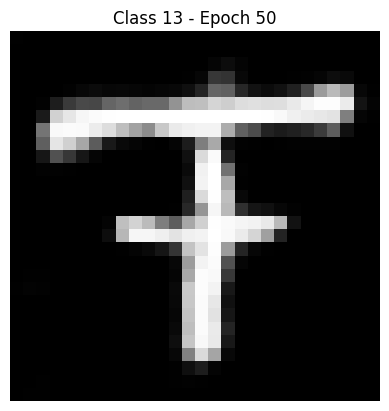


=== Training DCGAN for class 14 ===
[Class 14 | Epoch 001] G_loss=1.2222  D_loss=0.5612  D_acc=0.741
[Class 14 | Epoch 002] G_loss=1.1737  D_loss=0.6142  D_acc=0.693
[Class 14 | Epoch 003] G_loss=1.2380  D_loss=0.5674  D_acc=0.726
[Class 14 | Epoch 004] G_loss=1.1889  D_loss=0.5934  D_acc=0.702
[Class 14 | Epoch 005] G_loss=1.1168  D_loss=0.6274  D_acc=0.667
[Class 14 | Epoch 006] G_loss=1.0802  D_loss=0.6552  D_acc=0.635
[Class 14 | Epoch 007] G_loss=1.0129  D_loss=0.6735  D_acc=0.616
[Class 14 | Epoch 008] G_loss=0.9990  D_loss=0.6715  D_acc=0.607
[Class 14 | Epoch 009] G_loss=1.0059  D_loss=0.6672  D_acc=0.610
[Class 14 | Epoch 010] G_loss=1.0114  D_loss=0.6548  D_acc=0.624
[Class 14 | Epoch 011] G_loss=1.0135  D_loss=0.6523  D_acc=0.618
[Class 14 | Epoch 012] G_loss=1.0258  D_loss=0.6472  D_acc=0.632
[Class 14 | Epoch 013] G_loss=1.0211  D_loss=0.6375  D_acc=0.643
[Class 14 | Epoch 014] G_loss=1.0280  D_loss=0.6316  D_acc=0.653
[Class 14 | Epoch 015] G_loss=1.0087  D_loss=0.6385  

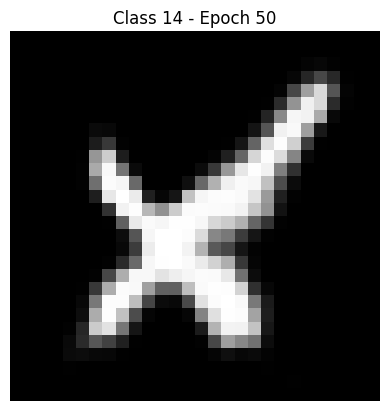


=== Training DCGAN for class 15 ===
[Class 15 | Epoch 001] G_loss=1.0956  D_loss=0.6064  D_acc=0.703
[Class 15 | Epoch 002] G_loss=1.1912  D_loss=0.6204  D_acc=0.676
[Class 15 | Epoch 003] G_loss=1.2514  D_loss=0.5723  D_acc=0.725
[Class 15 | Epoch 004] G_loss=1.1835  D_loss=0.6117  D_acc=0.682
[Class 15 | Epoch 005] G_loss=1.1204  D_loss=0.6407  D_acc=0.649
[Class 15 | Epoch 006] G_loss=1.0709  D_loss=0.6654  D_acc=0.627
[Class 15 | Epoch 007] G_loss=1.0298  D_loss=0.6814  D_acc=0.606
[Class 15 | Epoch 008] G_loss=0.9903  D_loss=0.6900  D_acc=0.595
[Class 15 | Epoch 009] G_loss=1.0039  D_loss=0.6728  D_acc=0.603
[Class 15 | Epoch 010] G_loss=1.0167  D_loss=0.6604  D_acc=0.618
[Class 15 | Epoch 011] G_loss=1.0127  D_loss=0.6625  D_acc=0.621
[Class 15 | Epoch 012] G_loss=1.0124  D_loss=0.6568  D_acc=0.623
[Class 15 | Epoch 013] G_loss=1.0277  D_loss=0.6492  D_acc=0.633
[Class 15 | Epoch 014] G_loss=1.0387  D_loss=0.6394  D_acc=0.642
[Class 15 | Epoch 015] G_loss=1.0334  D_loss=0.6390  

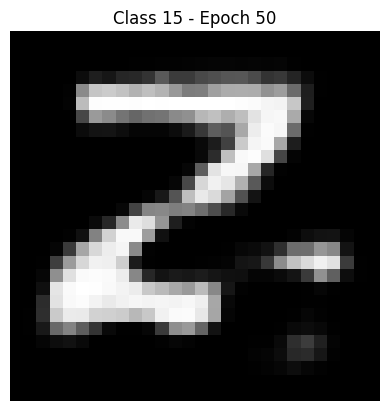

In [53]:
# Number of training epochs for each class
epochs = 50

# Dictionary to store trained DCGAN models for each class
dcgan_models = {}

# Dictionary to store training history (g_loss, d_loss, d_accuracy) per class
histories = {c: {"g_loss": [], "d_loss": [], "d_accuracy": []} for c in range(num_classes)}

# Loop through each class to train a class-specific DCGAN
for c in range(num_classes):
    print(f"\n=== Training DCGAN for class {c} ===")

    # Build a fresh Generator and Discriminator for this class
    G = build_baseline_generator(latent_dim, channels=1)  # 1 channel = grayscale
    D = build_baseline_discriminator(image_shape)         # Discriminator for 28×28×1 images

    # Wrap them into a custom DCGAN model
    # If Discriminator ends with sigmoid, set from_logits=False

    # Compile DCGAN with Adam optimizer (LR=0.0002, β1=0.5 → DCGAN best practice)
    
    dcgan = DCGANModel(G, D, latent_dim, from_logits=False)
    dcgan.compile(Adam(0.0002, 0.5), Adam(0.0002, 0.5))

    # Train for the specified number of epochs
    for epoch in range(epochs):
        # Fit for 1 epoch on the dataset of the current class
        hist = dcgan.fit(class_datasets[c], epochs=1, verbose=0)

        # Extract loss and accuracy from training history
        h = hist.history
        g = float(h["g_loss"][0])       # Generator loss
        d = float(h["d_loss"][0])       # Discriminator loss
        acc = float(h["d_accuracy"][0]) # Discriminator accuracy

        # Store metrics for plotting/analysis later
        histories[c]["g_loss"].append(g)
        histories[c]["d_loss"].append(d)
        histories[c]["d_accuracy"].append(acc)

        # Print training progress for this epoch
        print(f"[Class {c} | Epoch {epoch+1:03d}] G_loss={g:.4f}  D_loss={d:.4f}  D_acc={acc:.3f}")

        # Every 50 epochs, generate and display a sample image for this class
        if (epoch + 1) % 50 == 0:
            noise = tf.random.normal([1, latent_dim])  # Random noise input
            img = (G(noise, training=False)[0, :, :, 0] + 1.0) / 2.0  # Scale from [-1, 1] → [0, 1]
            plt.imshow(img, cmap='gray')
            plt.title(f"Class {c} - Epoch {epoch+1}")
            plt.axis('off')
            plt.show()

    # Save the trained DCGAN model for this class
    dcgan_models[c] = dcgan


----------

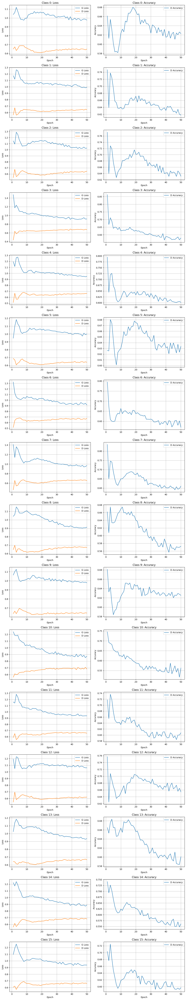

In [61]:
def plot_all_classes(histories):
    num_classes = len(histories)
    fig, axes = plt.subplots(num_classes, 2, figsize=(12, 4*num_classes))

    for idx, c in enumerate(histories.keys()):
        e = range(1, len(histories[c]["g_loss"]) + 1)

        # Loss subplot
        axes[idx, 0].plot(e, histories[c]["g_loss"], label="G Loss")
        axes[idx, 0].plot(e, histories[c]["d_loss"], label="D Loss")
        axes[idx, 0].set_title(f"Class {c}: Loss")
        axes[idx, 0].set_xlabel("Epoch")
        axes[idx, 0].set_ylabel("Loss")
        axes[idx, 0].legend()
        axes[idx, 0].grid(True)

        # Accuracy subplot
        axes[idx, 1].plot(e, histories[c]["d_accuracy"], label="D Accuracy")
        axes[idx, 1].set_title(f"Class {c}: Accuracy")
        axes[idx, 1].set_xlabel("Epoch")
        axes[idx, 1].set_ylabel("Accuracy")
        axes[idx, 1].legend()
        axes[idx, 1].grid(True)

    plt.tight_layout()
    plt.show()
plot_all_classes(histories)


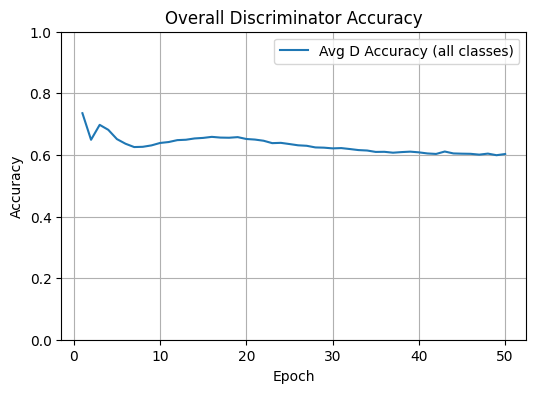

In [55]:
def plot_overall_accuracy(histories):
    num_classes = len(histories)
    num_epochs = len(next(iter(histories.values()))["d_accuracy"])
    # average across classes per epoch
    avg_acc = [
        sum(histories[c]["d_accuracy"][ep] for c in histories) / num_classes
        for ep in range(num_epochs)
    ]
    plt.figure(figsize=(6,4))
    plt.plot(range(1, num_epochs+1), avg_acc, label="Avg D Accuracy (all classes)")
    plt.xlabel("Epoch"); plt.ylabel("Accuracy"); plt.title("Overall Discriminator Accuracy")
    plt.ylim(0,1); plt.legend(); plt.grid(True); plt.show()

# Example:
plot_overall_accuracy(histories)


-------

### Generate Classwise Grid — Summary ###

Generates and saves a `16×10` grid of samples from trained class-specific DCGANs.  
- **Rows** = 16 classes, **columns** = 10 samples per class.  
- For each class:  
  1. Get its trained generator.  
  2. Create random noise (and labels if conditional).  
  3. Generate images, rescale to `[0, 1]`, and place in grid.  
- Saves output as `"dcgan_16x10_grid.png"` in `save_dir` for visual comparison across classes.


In [56]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf

def generate_classwise_grid(dcgan_models, latent_dim, save_dir="DCGAN_16Models/Baseline"):
    rows = 16  # number of classes
    cols = 10  # number of samples per class

    os.makedirs(save_dir, exist_ok=True)

    fig, axes = plt.subplots(rows, cols, figsize=(cols, rows))
    fig.subplots_adjust(hspace=0.1, wspace=0.1)

    for class_id in range(16):
        generator = dcgan_models[class_id].generator

        noise = tf.random.normal([cols, latent_dim])
        labels = tf.constant([[class_id]] * cols, dtype=tf.int32)
        generated_imgs = generator([noise, labels], training=False)

        generated_imgs = (generated_imgs + 1.0) / 2.0  # scale from [-1,1] to [0,1]

        for j in range(cols):
            ax = axes[class_id, j]
            ax.imshow(generated_imgs[j, :, :, 0], cmap='gray')
            ax.axis('off')

    save_path = os.path.join(save_dir, "dcgan_16x10_grid.png")
    plt.savefig(save_path, bbox_inches='tight', pad_inches=0.1)
    plt.close()
    print(f"Saved 160-image grid to: {save_path}")


--------

## Generate letters

**`generate_word` — Summary**

- **Purpose**: Renders a word by sampling each character’s class-specific generator and displaying letters side-by-side.
- **Flow**:
  1. Reverse the mapping to get `char → class_id`.
  2. For each character in `word.upper()`:
     - Find its `class_id`, fetch the corresponding generator.
     - Sample noise of size `latent_dim`, generate the image, rescale to `[0, 1]`.
     - Plot the letter (title = the character).
- **Notes**:
  - Characters not in `label_to_char` (e.g., spaces/punctuation) are skipped.
  - Ensure `dcgan_models` keys match your class IDs used in `label_to_char`.
  - For reproducible results, set a seed once: `tf.random.set_seed(42)`.


In [57]:
label_to_char = {
    0: 'A', 1: 'B', 2: 'D', 3: 'E',
    4: 'F', 5: 'G', 6: 'I', 7: 'J',
    8: 'L', 9: 'N', 10: 'O', 11: 'P',
    12: 'Q', 13: 'T', 14: 'X', 15: 'Z'
}

In [58]:
def generate_word(dcgan_models, word, latent_dim, label_to_char):
    # Reverse the label_to_char mapping
    char_to_label = {v: k for k, v in label_to_char.items()}

    fig, axs = plt.subplots(1, len(word), figsize=(len(word) * 1.5, 2))

    for i, char in enumerate(word.upper()):
        label = char_to_label.get(char, None)
        if label is None:
            print(f"Character '{char}' not found in label_to_char mapping. Skipping.")
            continue

        # Get the corresponding generator
        generator = dcgan_models[label].generator

        # Generate a noise vector and produce image
        noise = tf.random.normal([1, latent_dim])
        gen_img = generator(noise, training=False)
        img = (gen_img[0, :, :, 0] + 1.0) / 2.0  # Rescale from [-1, 1] to [0, 1]

        # Plot
        axs[i].imshow(img, cmap='gray')
        axs[i].axis('off')
        axs[i].set_title(char)

    plt.tight_layout()
    plt.show()


-----------

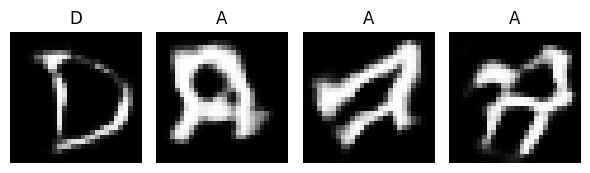

Character ' ' not found in label_to_char mapping. Skipping.


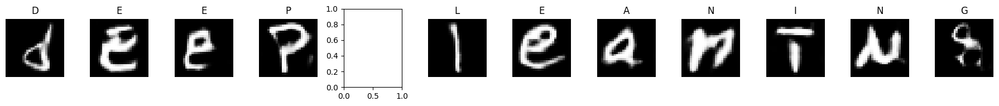

In [59]:
generate_word(dcgan_models, "DAAA", latent_dim, label_to_char)
generate_word(dcgan_models, "DEEP LEANING", latent_dim, label_to_char)


# Model improvement 1

## DCGAN Architecture Overview (Enhanced Generator)

### Generator Architecture

| Layer Type           | Output Shape        | Parameters / Description                              |
|----------------------|---------------------|--------------------------------------------------------|
| Input                | (latent_dim,)       | Random noise vector                                   |
| Dense                | (7, 7, 256)         | Fully connected layer reshaped into 7×7×256           |
| BatchNormalization   | (7, 7, 256)         | Normalize activations                                 |
| LeakyReLU (α=0.2)    | (7, 7, 256)         | Non-linearity                                         |
| Conv2DTranspose      | (14, 14, 128)       | Kernel=4, Stride=2, Padding='same'                    |
| BatchNormalization   | (14, 14, 128)       |                                                      |
| LeakyReLU (α=0.2)    | (14, 14, 128)       |                                                      |
| Conv2DTranspose      | (28, 28, 64)        | Kernel=4, Stride=2, Padding='same'                    |
| BatchNormalization   | (28, 28, 64)        |                                                      |
| LeakyReLU (α=0.2)    | (28, 28, 64)        |                                                      |
| Conv2DTranspose      | (28, 28, 32)        | Kernel=3, Stride=1, Padding='same' (refinement layer) |
| BatchNormalization   | (28, 28, 32)        |                                                      |
| LeakyReLU (α=0.2)    | (28, 28, 32)        |                                                      |
| Conv2D               | (28, 28, 1)         | Final output layer with 1 channel                     |
| Activation (tanh)    | (28, 28, 1)         | Output scaled to [-1, 1]                              |

---

### Discriminator Architecture (Simplified)

| Layer Type           | Output Shape        | Parameters / Description                     |
|----------------------|---------------------|----------------------------------------------|
| Input                | (28, 28, 1)         | Real or generated grayscale image            |
| Conv2D               | (14, 14, 64)        | Kernel=3, Stride=2, Padding='same'           |
| LeakyReLU (α=0.2)    | (14, 14, 64)        |                                              |
| Dropout (0.3)        | (14, 14, 64)        | Regularization                               |
| Conv2D               | (7, 7, 128)         | Kernel=3, Stride=2, Padding='same'           |
| BatchNormalization   | (7, 7, 128)         |                                              |
| LeakyReLU (α=0.2)    | (7, 7, 128)         |                                              |
| Dropout (0.3)        | (7, 7, 128)         |                                              |
| Conv2D               | (7, 7, 128)         | Kernel=3, Stride=1, Padding='same'           |
| BatchNormalization   | (7, 7, 128)         |                                              |
| LeakyReLU (α=0.2)    | (7, 7, 128)         |                                              |
| Flatten              | (6272,)             | Flatten all features                         |
| Dense                | (64,)               | Intermediate dense layer                     |
| LeakyReLU (α=0.2)    | (64,)               |                                              |
| Dense                | (1,)                | Sigmoid activation for real/fake prediction  |

---

**Notes:**
- Generator uses `tanh` activation → scale training images to [-1, 1].
- Discriminator uses `sigmoid` → output is probability of being real.
- Enhanced generator should improve image quality, especially on more complex datasets.


**Improved DCGAN Architecture — Detailed Summary**

- **Generator (`build_generator`) — 9 layers total**  
  1. **Dense (256×7×7 = 12544 units)** — transforms noise vector into rich feature space.  
  2. **BatchNormalization** — stabilizes activations after dense layer.  
  3. **LeakyReLU(0.2)** — avoids dead neurons, keeps gradients for negative values.  
  4. **Reshape (7×7×256)** — converts dense output into spatial feature map.  
  5. **Conv2DTranspose(128, 4×4, stride=2, same)** — upsample to 14×14, learn coarse features.  
  6. **BatchNormalization**  
  7. **LeakyReLU(0.2)**  
  8. **Conv2DTranspose(64, 4×4, stride=2, same)** — upsample to 28×28, add finer details.  
  9. **BatchNormalization → LeakyReLU(0.2)**  
  10. **Conv2DTranspose(32, 3×3, stride=1, same)** — refinement layer for extra sharpness.  
  11. **BatchNormalization → LeakyReLU(0.2)**  
  12. **Conv2D(channels=1, 3×3, same)** — final grayscale output.  
  13. **Activation(`tanh`)** — scale output to `[-1, 1]`.

- **Discriminator (`build_discriminator`) — 11 layers total**  
  1. **Conv2D(64, 3×3, stride=2, same)** — downsample to 14×14, learn low-level features.  
  2. **LeakyReLU(0.2)**  
  3. **Dropout(0.3)** — regularization to prevent overfitting.  
  4. **Conv2D(128, 3×3, stride=2, same)** — downsample to 7×7, extract mid-level features.  
  5. **BatchNormalization** — stabilize training.  
  6. **LeakyReLU(0.2)**  
  7. **Dropout(0.3)**  
  8. **Conv2D(128, 3×3, stride=1, same)** — keep spatial size, learn deeper patterns.  
  9. **BatchNormalization → LeakyReLU(0.2)**  
  10. **Flatten** — convert 3D feature maps to 1D vector.  
  11. **Dense(64)** — learn combined feature representation.  
  12. **LeakyReLU(0.2)**  
  13. **Dense(1, sigmoid)** — output probability (real/fake).

- **Why these design choices**  
  - **Generator**: gradual upsampling with multiple `Conv2DTranspose` layers creates smoother, sharper images; refinement layer adds fine detail.  
  - **Discriminator**: multiple convolution blocks with dropout and batchnorm improve robustness, prevent overfitting, and keep gradients stable.  
  - Layer counts and filter sizes are balanced for **28×28 grayscale images** to avoid over-parameterization while still capturing detail.
tion while still capturing detail.


In [50]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import (Input, Dense, Reshape, Conv2DTranspose, BatchNormalization,
                                     Activation, Conv2D, LeakyReLU, Dropout, Flatten)
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam

# === Generator ===
def build_generator(latent_dim, channels=1):
    model = Sequential([
        Dense(256 * 7 * 7, input_dim=latent_dim),  # More neurons here
        BatchNormalization(),
        LeakyReLU(0.2),
        Reshape((7, 7, 256)),

        # Add more Conv2DTranspose blocks
        Conv2DTranspose(128, kernel_size=4, strides=2, padding='same'),  # → 14x14
        BatchNormalization(),
        LeakyReLU(0.2),

        Conv2DTranspose(64, kernel_size=4, strides=2, padding='same'),   # → 28x28
        BatchNormalization(),
        LeakyReLU(0.2),

        Conv2DTranspose(32, kernel_size=3, strides=1, padding='same'),   # refinement layer
        BatchNormalization(),
        LeakyReLU(0.2),

        Conv2D(channels, kernel_size=3, padding='same'),
        Activation('tanh')
    ])

    noise = Input(shape=(latent_dim,))
    img = model(noise)
    return Model(noise, img)

# === Discriminator ===
def build_discriminator(img_shape):
    model = Sequential([
        # Block 1
        Conv2D(64, kernel_size=3, strides=2, padding='same', input_shape=img_shape),
        LeakyReLU(0.2),
        Dropout(0.3),

        # Block 2
        Conv2D(128, kernel_size=3, strides=2, padding='same'),
        BatchNormalization(),
        LeakyReLU(0.2),
        Dropout(0.3),

        # Block 3
        Conv2D(128, kernel_size=3, strides=1, padding='same'),
        BatchNormalization(),
        LeakyReLU(0.2),

        Flatten(),
        Dense(64),
        LeakyReLU(0.2),
        Dense(1, activation='sigmoid')
    ])

    img = Input(shape=img_shape)
    validity = model(img)
    return Model(img, validity)


In [51]:
latent_dim = 128
img_shape = (28, 28, 1)
batch_size = 128
epochs = 500
num_classes = 16

class_datasets = prepare_class_datasets(images, mapped_labels, batch_size=batch_size, num_classes=num_classes)

# Build models
generator = build_generator(latent_dim, channels=1)
discriminator = build_discriminator(img_shape)

# Print summaries
print("=== Generator Summary ===")
generator.summary()

print("\n=== Discriminator Summary ===")
discriminator.summary()


=== Generator Summary ===
Model: "model_178"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_147 (InputLayer)      [(None, 128)]             0         
                                                                 
 sequential_146 (Sequential)  (None, 28, 28, 1)        2343553   
                                                                 
Total params: 2,343,553
Trainable params: 2,318,017
Non-trainable params: 25,536
_________________________________________________________________

=== Discriminator Summary ===
Model: "model_179"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_148 (InputLayer)      [(None, 28, 28, 1)]       0         
                                                                 
 sequential_147 (Sequential)  (None, 1)                624641    
                                

In [27]:
# === DCGAN Model Class ===
class DCGANModel(tf.keras.Model):
    def __init__(self, generator, discriminator, latent_dim):
        super().__init__()
        self.generator = generator          # Generator network
        self.discriminator = discriminator  # Discriminator network
        self.latent_dim = latent_dim         # Size of random noise vector (latent space)
        self.loss_fn = tf.keras.losses.BinaryCrossentropy(from_logits=False)  # Loss function for binary classification

    def compile(self, g_optimizer, d_optimizer):
        super().compile()
        self.g_optimizer = g_optimizer  # Optimizer for the generator
        self.d_optimizer = d_optimizer  # Optimizer for the discriminator

    # Generator loss: tries to make fake images look real (labels = 1)
    def generator_loss(self, fake_output):
        return self.loss_fn(tf.ones_like(fake_output), fake_output)

    # Discriminator loss: real images → label 1, fake images → label 0
    def discriminator_loss(self, real_output, fake_output):
        real_loss = self.loss_fn(tf.ones_like(real_output), real_output)  
        fake_loss = self.loss_fn(tf.zeros_like(fake_output), fake_output)
        return real_loss + fake_loss

    @tf.function
    def train_step(self, real_images):
        # 1. Get batch size and generate random noise
        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal([batch_size, self.latent_dim])

        # 2. Record gradients for both networks
        with tf.GradientTape() as disc_tape, tf.GradientTape() as gen_tape:
            # Generate fake images from noise
            generated_images = self.generator(noise, training=True)
            # Discriminator predictions for real and fake images
            real_output = self.discriminator(real_images, training=True)
            fake_output = self.discriminator(generated_images, training=True)
            # Calculate losses
            d_loss = self.discriminator_loss(real_output, fake_output)
            g_loss = self.generator_loss(fake_output)

        # 3. Compute and apply gradients for both networks
        grads_d = disc_tape.gradient(d_loss, self.discriminator.trainable_variables)
        grads_g = gen_tape.gradient(g_loss, self.generator.trainable_variables)
        self.d_optimizer.apply_gradients(zip(grads_d, self.discriminator.trainable_variables))
        self.g_optimizer.apply_gradients(zip(grads_g, self.generator.trainable_variables))

        # 4. Calculate discriminator accuracy:
        #    Real images → correctly classified as real (> 0.5)
        #    Fake images → correctly classified as fake (< 0.5)
        real_preds = tf.cast(real_output > 0.5, tf.float32)
        fake_preds = tf.cast(fake_output < 0.5, tf.float32)
        real_accuracy = tf.reduce_mean(real_preds)
        fake_accuracy = tf.reduce_mean(fake_preds)
        d_accuracy = 0.5 * (real_accuracy + fake_accuracy)

        # 5. Return training metrics
        return {
            "d_loss": d_loss,       # Discriminator loss
            "g_loss": g_loss,       # Generator loss
            "d_accuracy": d_accuracy # Discriminator accuracy
        }


# === Callback to Save Best Generator ===
class SaveBestGenerator(tf.keras.callbacks.Callback):
    def __init__(self, save_path):
        super().__init__()
        self.save_path = save_path
        self.best_loss = float('inf')  # Track best generator loss

    def on_epoch_end(self, epoch, logs=None):
        # Save generator weights if loss improved
        g_loss = logs.get('g_loss')
        if g_loss is not None and g_loss < self.best_loss:
            print(f"\nEpoch {epoch + 1}: Generator loss improved from {self.best_loss:.4f} to {g_loss:.4f}. Saving weights.")
            self.best_loss = g_loss
            self.model.generator.save_weights(self.save_path)


# === Callback to Print Images Every N Epochs ===
class PrintImagesEveryN(tf.keras.callbacks.Callback):
    def __init__(self, class_index, latent_dim, interval=250):
        super().__init__()
        self.class_index = class_index
        self.latent_dim = latent_dim
        self.interval = interval
        # Fixed noise seed to see consistent sample evolution over time
        self.seed = tf.random.normal([10, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        # Every N epochs, generate and show sample images
        if (epoch + 1) % self.interval == 0:
            generated_images = self.model.generator(self.seed, training=False)
            generated_images = 0.5 * generated_images + 0.5  # Rescale from [-1, 1] to [0, 1]
            print(f"\nClass {self.class_index} — Epoch {epoch + 1} preview:")
            fig, axes = plt.subplots(1, 10, figsize=(20, 2))
            for i in range(10):
                ax = axes[i]
                ax.imshow(generated_images[i, :, :, 0], cmap='gray')
                ax.axis('off')
            plt.show()


# === Prepare Dataset Per Class ===
def prepare_class_datasets(images, labels, batch_size=128, num_classes=16):
    """
    Creates a dictionary where each key is a class index and value is a tf.data.Dataset
    containing only images of that class.
    """
    class_datasets = {}
    for c in range(num_classes):
        class_imgs = images[labels == c]
        dataset = tf.data.Dataset.from_tensor_slices(class_imgs) \
                                 .shuffle(buffer_size=10000) \
                                 .batch(batch_size) \
                                 .prefetch(tf.data.AUTOTUNE)
        class_datasets[c] = dataset
    return class_datasets


# === Callback to Print Discriminator Accuracy ===
class PrintAccuracy(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        # Display discriminator accuracy at the end of each epoch if available
        if logs and 'd_accuracy' in logs:
            print(f"Epoch {epoch + 1}: D Accuracy = {logs['d_accuracy']:.4f}")


Training DCGAN for class 0...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.6930 - g_loss: 2.3278 - d_accuracy: 0.9089
Epoch 1: Generator loss improved from inf to 3.3849. Saving weights.
Epoch 1: D Accuracy = 0.8750
27/27 [==============================] - 4s 40ms/step - d_loss: 0.6916 - g_loss: 2.3656 - d_accuracy: 0.9076
Epoch 2/500
27/27 [==============================] - 1s 32ms/step - d_loss: 0.5239 - g_loss: 3.7931 - d_accuracy: 0.9596
Epoch 3/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9416 - g_loss: 2.7182 - d_accuracy: 0.8639
Epoch 3: Generator loss improved from 3.3849 to 1.4738. Saving weights.
Epoch 3: D Accuracy = 0.8529
27/27 [==============================] - 1s 33ms/step - d_loss: 0.9403 - g_loss: 2.6738 - d_accuracy: 0.8635
Epoch 4/500
27/27 [==============================] - 1s 32ms/step - d_loss: 0.7443 - g_loss: 2.3541 - d_accuracy: 0.8879
Epoch 5/500
27/27 [==============================] - 1s 33ms/step - d_loss: 0.5

27/27 [==============================] - 1s 32ms/step - d_loss: 1.0641 - g_loss: 1.3763 - d_accuracy: 0.7467
Epoch 32/500
27/27 [==============================] - 1s 32ms/step - d_loss: 1.0460 - g_loss: 1.3978 - d_accuracy: 0.7610
Epoch 33/500
27/27 [==============================] - 1s 32ms/step - d_loss: 1.0661 - g_loss: 1.3755 - d_accuracy: 0.7557
Epoch 34/500
27/27 [==============================] - 1s 32ms/step - d_loss: 1.0500 - g_loss: 1.4219 - d_accuracy: 0.7581
Epoch 35/500
27/27 [==============================] - 1s 32ms/step - d_loss: 1.0512 - g_loss: 1.3985 - d_accuracy: 0.7653
Epoch 36/500
27/27 [==============================] - 1s 32ms/step - d_loss: 1.0626 - g_loss: 1.4373 - d_accuracy: 0.7513
Epoch 37/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0560 - g_loss: 1.3963 - d_accuracy: 0.7611
Epoch 37: Generator loss improved from 0.8818 to 0.8202. Saving weights.
Epoch 37: D Accuracy = 0.6838
27/27 [==============================] - 1s 33ms/step - d_los

Epoch 63/500
27/27 [==============================] - 1s 32ms/step - d_loss: 1.1034 - g_loss: 1.4256 - d_accuracy: 0.7276
Epoch 64/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0819 - g_loss: 1.3817 - d_accuracy: 0.7401
Epoch 65/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0979 - g_loss: 1.3605 - d_accuracy: 0.7303
Epoch 66/500
27/27 [==============================] - 1s 32ms/step - d_loss: 1.0974 - g_loss: 1.3923 - d_accuracy: 0.7296
Epoch 67/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0938 - g_loss: 1.3271 - d_accuracy: 0.7368
Epoch 68/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.1046 - g_loss: 1.3834 - d_accuracy: 0.7364
Epoch 69/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.1356 - g_loss: 1.3308 - d_accuracy: 0.7196
Epoch 70/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.1253 - g_loss: 1.3272 - d_accuracy: 0.7144
Epoch 71/500
27/27 [====

Epoch 95/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0923 - g_loss: 1.2884 - d_accuracy: 0.7364
Epoch 96/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.1293 - g_loss: 1.3440 - d_accuracy: 0.7156
Epoch 97/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.1354 - g_loss: 1.2645 - d_accuracy: 0.7225
Epoch 98/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.1334 - g_loss: 1.3226 - d_accuracy: 0.7120
Epoch 99/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.1096 - g_loss: 1.3090 - d_accuracy: 0.7271
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1202 - g_loss: 1.3082 - d_accuracy: 0.7201
Class 0 — Epoch 100 preview:


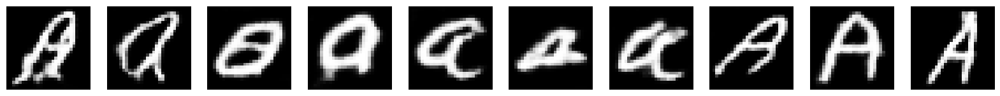

Epoch 100: D Accuracy = 0.7426
27/27 [==============================] - 1s 40ms/step - d_loss: 1.1179 - g_loss: 1.3081 - d_accuracy: 0.7209
Epoch 101/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0969 - g_loss: 1.2989 - d_accuracy: 0.7317
Epoch 102/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.1672 - g_loss: 1.3398 - d_accuracy: 0.7023
Epoch 103/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.1034 - g_loss: 1.3142 - d_accuracy: 0.7353
Epoch 104/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.1226 - g_loss: 1.3288 - d_accuracy: 0.7144
Epoch 105/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.1308 - g_loss: 1.3247 - d_accuracy: 0.7175
Epoch 106/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.1372 - g_loss: 1.3292 - d_accuracy: 0.7130
Epoch 107/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0880 - g_loss: 1.3325 - d_accuracy: 0.7380

27/27 [==============================] - 1s 33ms/step - d_loss: 1.0877 - g_loss: 1.3605 - d_accuracy: 0.7409
Epoch 133/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.1061 - g_loss: 1.3334 - d_accuracy: 0.7350
Epoch 134/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0883 - g_loss: 1.3785 - d_accuracy: 0.7359
Epoch 135/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.1157 - g_loss: 1.3625 - d_accuracy: 0.7212
Epoch 136/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0876 - g_loss: 1.3776 - d_accuracy: 0.7386
Epoch 137/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0820 - g_loss: 1.3693 - d_accuracy: 0.7412
Epoch 138/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0906 - g_loss: 1.3384 - d_accuracy: 0.7320
Epoch 139/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0916 - g_loss: 1.3695 - d_accuracy: 0.7365
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0722 - g_loss: 1.3994 - d_accuracy: 0.7399
Epoch 165/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0555 - g_loss: 1.3966 - d_accuracy: 0.7567
Epoch 166/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0890 - g_loss: 1.4036 - d_accuracy: 0.7310
Epoch 167/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0766 - g_loss: 1.3690 - d_accuracy: 0.7429
Epoch 168/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0637 - g_loss: 1.4150 - d_accuracy: 0.7483
Epoch 169/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0893 - g_loss: 1.4083 - d_accuracy: 0.7375
Epoch 170/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0650 - g_loss: 1.4188 - d_accuracy: 0.7482
Epoch 171/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0554 - g_loss: 1.4483 - d_accuracy: 0.7493
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0735 - g_loss: 1.4852 - d_accuracy: 0.7444
Epoch 197/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0285 - g_loss: 1.4638 - d_accuracy: 0.7629
Epoch 198/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0922 - g_loss: 1.5202 - d_accuracy: 0.7265
Epoch 199/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0138 - g_loss: 1.4621 - d_accuracy: 0.7762
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0224 - g_loss: 1.4729 - d_accuracy: 0.7723
Class 0 — Epoch 200 preview:


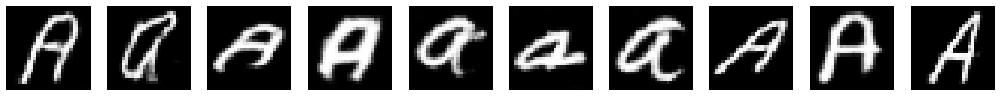

Epoch 200: D Accuracy = 0.8603
27/27 [==============================] - 1s 42ms/step - d_loss: 1.0186 - g_loss: 1.4656 - d_accuracy: 0.7755
Epoch 201/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0211 - g_loss: 1.5040 - d_accuracy: 0.7719
Epoch 202/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0231 - g_loss: 1.5385 - d_accuracy: 0.7655
Epoch 203/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0445 - g_loss: 1.5143 - d_accuracy: 0.7563
Epoch 204/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0360 - g_loss: 1.4957 - d_accuracy: 0.7632
Epoch 205/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0526 - g_loss: 1.4992 - d_accuracy: 0.7573
Epoch 206/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0628 - g_loss: 1.5098 - d_accuracy: 0.7493
Epoch 207/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0198 - g_loss: 1.4841 - d_accuracy: 0.7734

27/27 [==============================] - 1s 34ms/step - d_loss: 1.0112 - g_loss: 1.5648 - d_accuracy: 0.7764
Epoch 233/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9979 - g_loss: 1.5906 - d_accuracy: 0.7877
Epoch 234/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.0009 - g_loss: 1.5946 - d_accuracy: 0.7764
Epoch 235/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9914 - g_loss: 1.6004 - d_accuracy: 0.7823
Epoch 236/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0114 - g_loss: 1.5930 - d_accuracy: 0.7769
Epoch 237/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9806 - g_loss: 1.5649 - d_accuracy: 0.7901
Epoch 238/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0348 - g_loss: 1.6044 - d_accuracy: 0.7570
Epoch 239/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9789 - g_loss: 1.6098 - d_accuracy: 0.7832
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9716 - g_loss: 1.7183 - d_accuracy: 0.7908
Epoch 265/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9816 - g_loss: 1.6883 - d_accuracy: 0.7845
Epoch 266/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9767 - g_loss: 1.6402 - d_accuracy: 0.7926
Epoch 267/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9305 - g_loss: 1.6771 - d_accuracy: 0.8088
Epoch 268/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9760 - g_loss: 1.6732 - d_accuracy: 0.7893
Epoch 269/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9898 - g_loss: 1.7441 - d_accuracy: 0.7788
Epoch 270/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9629 - g_loss: 1.6669 - d_accuracy: 0.7974
Epoch 271/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9376 - g_loss: 1.7038 - d_accuracy: 0.8070
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9618 - g_loss: 1.8235 - d_accuracy: 0.7908
Epoch 297/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9376 - g_loss: 1.8211 - d_accuracy: 0.8026
Epoch 298/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9025 - g_loss: 1.8099 - d_accuracy: 0.8186
Epoch 299/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9328 - g_loss: 1.8003 - d_accuracy: 0.8080
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9082 - g_loss: 1.8245 - d_accuracy: 0.8195
Class 0 — Epoch 300 preview:


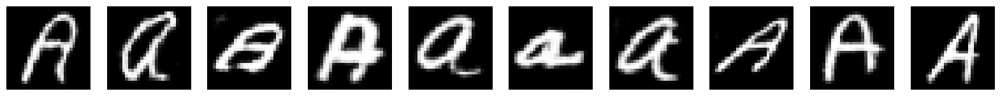

Epoch 300: D Accuracy = 0.8676
27/27 [==============================] - 1s 39ms/step - d_loss: 0.9041 - g_loss: 1.8275 - d_accuracy: 0.8212
Epoch 301/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9396 - g_loss: 1.8996 - d_accuracy: 0.8076
Epoch 302/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9134 - g_loss: 1.8282 - d_accuracy: 0.8139
Epoch 303/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9361 - g_loss: 1.7883 - d_accuracy: 0.8044
Epoch 304/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9144 - g_loss: 1.8112 - d_accuracy: 0.8151
Epoch 305/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9243 - g_loss: 1.8645 - d_accuracy: 0.8087
Epoch 306/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9382 - g_loss: 1.8863 - d_accuracy: 0.8032
Epoch 307/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8788 - g_loss: 1.7681 - d_accuracy: 0.8374

27/27 [==============================] - 1s 34ms/step - d_loss: 0.8599 - g_loss: 1.9130 - d_accuracy: 0.8392
Epoch 333/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8466 - g_loss: 1.9579 - d_accuracy: 0.8462
Epoch 334/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8761 - g_loss: 1.9530 - d_accuracy: 0.8271
Epoch 335/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8372 - g_loss: 1.9684 - d_accuracy: 0.8485
Epoch 336/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8752 - g_loss: 1.9746 - d_accuracy: 0.8284
Epoch 337/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2420 - g_loss: 2.0642 - d_accuracy: 0.7737
Epoch 338/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8615 - g_loss: 1.8771 - d_accuracy: 0.8415
Epoch 339/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8407 - g_loss: 1.9239 - d_accuracy: 0.8465
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8868 - g_loss: 2.0078 - d_accuracy: 0.8250
Epoch 365/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8506 - g_loss: 2.0904 - d_accuracy: 0.8334
Epoch 366/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8621 - g_loss: 2.0506 - d_accuracy: 0.8362
Epoch 367/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8363 - g_loss: 2.0425 - d_accuracy: 0.8473
Epoch 368/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8368 - g_loss: 2.1242 - d_accuracy: 0.8382
Epoch 369/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8144 - g_loss: 2.0520 - d_accuracy: 0.8554
Epoch 370/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8602 - g_loss: 2.0947 - d_accuracy: 0.8323
Epoch 371/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8404 - g_loss: 2.0688 - d_accuracy: 0.8413
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8423 - g_loss: 2.1177 - d_accuracy: 0.8447
Epoch 397/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8330 - g_loss: 2.1576 - d_accuracy: 0.8434
Epoch 398/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8146 - g_loss: 2.1717 - d_accuracy: 0.8546
Epoch 399/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8052 - g_loss: 2.1622 - d_accuracy: 0.8557
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8131 - g_loss: 2.1956 - d_accuracy: 0.8488
Class 0 — Epoch 400 preview:


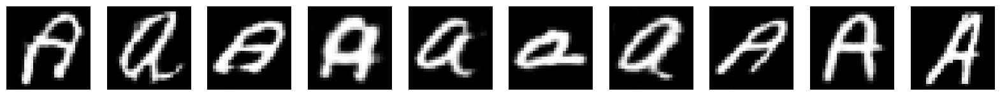

Epoch 400: D Accuracy = 0.8235
27/27 [==============================] - 1s 40ms/step - d_loss: 0.8192 - g_loss: 2.1635 - d_accuracy: 0.8479
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8551 - g_loss: 2.1583 - d_accuracy: 0.8378
Epoch 402/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8041 - g_loss: 2.1691 - d_accuracy: 0.8592
Epoch 403/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8094 - g_loss: 2.1850 - d_accuracy: 0.8548
Epoch 404/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8415 - g_loss: 2.1910 - d_accuracy: 0.8411
Epoch 405/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8170 - g_loss: 2.2062 - d_accuracy: 0.8513
Epoch 406/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8217 - g_loss: 2.1670 - d_accuracy: 0.8540
Epoch 407/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9911 - g_loss: 2.2094 - d_accuracy: 0.7969

27/27 [==============================] - 1s 34ms/step - d_loss: 0.8277 - g_loss: 2.3304 - d_accuracy: 0.8430
Epoch 433/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7891 - g_loss: 2.2074 - d_accuracy: 0.8686
Epoch 434/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7904 - g_loss: 2.2951 - d_accuracy: 0.8635
Epoch 435/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7989 - g_loss: 2.2985 - d_accuracy: 0.8567
Epoch 436/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7658 - g_loss: 2.2722 - d_accuracy: 0.8746
Epoch 437/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7780 - g_loss: 2.3257 - d_accuracy: 0.8672
Epoch 438/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7970 - g_loss: 2.3271 - d_accuracy: 0.8549
Epoch 439/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7696 - g_loss: 2.2741 - d_accuracy: 0.8758
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7905 - g_loss: 2.4381 - d_accuracy: 0.8566
Epoch 465/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7444 - g_loss: 2.3831 - d_accuracy: 0.8795
Epoch 466/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7414 - g_loss: 2.3709 - d_accuracy: 0.8833
Epoch 467/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7847 - g_loss: 2.3719 - d_accuracy: 0.8540
Epoch 468/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7376 - g_loss: 2.4697 - d_accuracy: 0.8804
Epoch 469/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7932 - g_loss: 2.4047 - d_accuracy: 0.8612
Epoch 470/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7445 - g_loss: 2.3915 - d_accuracy: 0.8835
Epoch 471/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7498 - g_loss: 2.3463 - d_accuracy: 0.8825
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7337 - g_loss: 2.4460 - d_accuracy: 0.8863
Epoch 497/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7797 - g_loss: 2.3961 - d_accuracy: 0.8654
Epoch 498/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7658 - g_loss: 2.3960 - d_accuracy: 0.8741
Epoch 499/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7040 - g_loss: 2.5275 - d_accuracy: 0.8992
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7446 - g_loss: 2.4452 - d_accuracy: 0.8820
Class 0 — Epoch 500 preview:


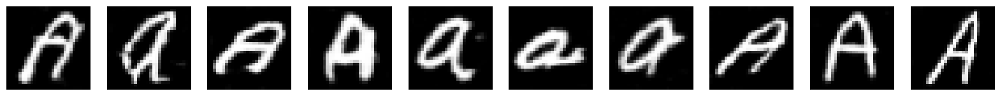

Epoch 500: D Accuracy = 0.7868
27/27 [==============================] - 1s 40ms/step - d_loss: 0.7466 - g_loss: 2.4843 - d_accuracy: 0.8786
Training DCGAN for class 1...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7153 - g_loss: 2.3404 - d_accuracy: 0.9003
Epoch 1: Generator loss improved from inf to 3.0120. Saving weights.
Epoch 1: D Accuracy = 0.9632
27/27 [==============================] - 2s 35ms/step - d_loss: 0.7099 - g_loss: 2.3644 - d_accuracy: 0.9025
Epoch 2/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7265 - g_loss: 2.9894 - d_accuracy: 0.8866
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7142 - g_loss: 2.6925 - d_accuracy: 0.8954
Epoch 4/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.4897 - g_loss: 3.4861 - d_accuracy: 0.9688
Epoch 5/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.4387 - g_loss: 4.2661 - d_accuracy: 0.9823
Epoch 6/500
27/27 [====

27/27 [==============================] - 1s 34ms/step - d_loss: 1.0288 - g_loss: 1.4511 - d_accuracy: 0.7664
Epoch 30/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0517 - g_loss: 1.5043 - d_accuracy: 0.7531
Epoch 31/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0202 - g_loss: 1.4622 - d_accuracy: 0.7719
Epoch 32/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0637 - g_loss: 1.5129 - d_accuracy: 0.7437
Epoch 33/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0442 - g_loss: 1.4654 - d_accuracy: 0.7661
Epoch 33: Generator loss improved from 0.6629 to 0.4692. Saving weights.
Epoch 33: D Accuracy = 0.6029
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0643 - g_loss: 1.4298 - d_accuracy: 0.7603
Epoch 34/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0514 - g_loss: 1.5191 - d_accuracy: 0.7627
Epoch 35/500
27/27 [==============================] - 1s 34ms/step - d_los

Epoch 61/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1084 - g_loss: 1.3899 - d_accuracy: 0.7371
Epoch 62/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0946 - g_loss: 1.3723 - d_accuracy: 0.7415
Epoch 63/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1148 - g_loss: 1.4642 - d_accuracy: 0.7165
Epoch 64/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0905 - g_loss: 1.4236 - d_accuracy: 0.7392
Epoch 65/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1091 - g_loss: 1.3970 - d_accuracy: 0.7302
Epoch 66/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0768 - g_loss: 1.3952 - d_accuracy: 0.7378
Epoch 67/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0842 - g_loss: 1.4336 - d_accuracy: 0.7367
Epoch 68/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0983 - g_loss: 1.3829 - d_accuracy: 0.7361
Epoch 69/500
27/27 [====

27/27 [==============================] - 1s 35ms/step - d_loss: 1.1052 - g_loss: 1.3602 - d_accuracy: 0.7266
Epoch 94/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1313 - g_loss: 1.3896 - d_accuracy: 0.7170
Epoch 95/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1245 - g_loss: 1.4246 - d_accuracy: 0.7150
Epoch 96/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1169 - g_loss: 1.3661 - d_accuracy: 0.7179
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0943 - g_loss: 1.3421 - d_accuracy: 0.7349
Epoch 98/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1607 - g_loss: 1.3098 - d_accuracy: 0.6977
Epoch 99/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1132 - g_loss: 1.3441 - d_accuracy: 0.7290
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1424 - g_loss: 1.3832 - d_accuracy: 0.7125
Class 1 — Epoch 100 preview:


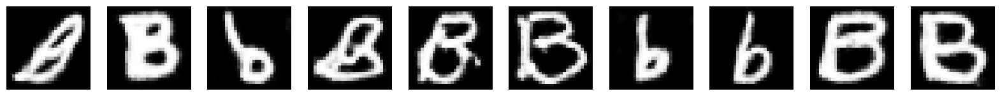

Epoch 100: D Accuracy = 0.7647
27/27 [==============================] - 1s 44ms/step - d_loss: 1.1451 - g_loss: 1.3675 - d_accuracy: 0.7144
Epoch 101/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0808 - g_loss: 1.3984 - d_accuracy: 0.7340
Epoch 102/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1251 - g_loss: 1.3501 - d_accuracy: 0.7216
Epoch 103/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1257 - g_loss: 1.3600 - d_accuracy: 0.7300
Epoch 104/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0963 - g_loss: 1.3433 - d_accuracy: 0.7390
Epoch 105/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1002 - g_loss: 1.3714 - d_accuracy: 0.7309
Epoch 106/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1220 - g_loss: 1.3557 - d_accuracy: 0.7247
Epoch 107/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1021 - g_loss: 1.3647 - d_accuracy: 0.7265

27/27 [==============================] - 1s 35ms/step - d_loss: 1.1318 - g_loss: 1.3663 - d_accuracy: 0.7182
Epoch 133/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0975 - g_loss: 1.3535 - d_accuracy: 0.7288
Epoch 134/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1002 - g_loss: 1.4697 - d_accuracy: 0.7237
Epoch 135/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1260 - g_loss: 1.3770 - d_accuracy: 0.7184
Epoch 136/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1220 - g_loss: 1.4539 - d_accuracy: 0.7200
Epoch 137/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0556 - g_loss: 1.3918 - d_accuracy: 0.7458
Epoch 138/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1330 - g_loss: 1.3804 - d_accuracy: 0.7252
Epoch 139/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1019 - g_loss: 1.4155 - d_accuracy: 0.7276
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0457 - g_loss: 1.4361 - d_accuracy: 0.7564
Epoch 165/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0500 - g_loss: 1.4319 - d_accuracy: 0.7475
Epoch 166/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0882 - g_loss: 1.4092 - d_accuracy: 0.7357
Epoch 167/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1274 - g_loss: 1.4388 - d_accuracy: 0.7192
Epoch 168/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1180 - g_loss: 1.3825 - d_accuracy: 0.7258
Epoch 169/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0681 - g_loss: 1.3747 - d_accuracy: 0.7467
Epoch 170/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0864 - g_loss: 1.4556 - d_accuracy: 0.7320
Epoch 171/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0857 - g_loss: 1.4136 - d_accuracy: 0.7362
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0750 - g_loss: 1.4717 - d_accuracy: 0.7342
Epoch 197/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0881 - g_loss: 1.4704 - d_accuracy: 0.7292
Epoch 198/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0796 - g_loss: 1.4854 - d_accuracy: 0.7381
Epoch 199/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0790 - g_loss: 1.4626 - d_accuracy: 0.7405
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0666 - g_loss: 1.4757 - d_accuracy: 0.7465
Class 1 — Epoch 200 preview:


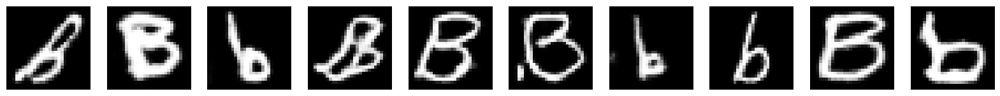

Epoch 200: D Accuracy = 0.7500
27/27 [==============================] - 1s 40ms/step - d_loss: 1.0707 - g_loss: 1.4596 - d_accuracy: 0.7467
Epoch 201/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0340 - g_loss: 1.4798 - d_accuracy: 0.7611
Epoch 202/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0367 - g_loss: 1.4502 - d_accuracy: 0.7672
Epoch 203/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0370 - g_loss: 1.5149 - d_accuracy: 0.7615
Epoch 204/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0535 - g_loss: 1.4399 - d_accuracy: 0.7617
Epoch 205/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0524 - g_loss: 1.5190 - d_accuracy: 0.7462
Epoch 206/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0566 - g_loss: 1.4826 - d_accuracy: 0.7515
Epoch 207/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1205 - g_loss: 1.5199 - d_accuracy: 0.7157

27/27 [==============================] - 1s 35ms/step - d_loss: 1.0628 - g_loss: 1.5218 - d_accuracy: 0.7467
Epoch 233/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0542 - g_loss: 1.5781 - d_accuracy: 0.7426
Epoch 234/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0387 - g_loss: 1.5376 - d_accuracy: 0.7596
Epoch 235/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0543 - g_loss: 1.5476 - d_accuracy: 0.7509
Epoch 236/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0466 - g_loss: 1.4950 - d_accuracy: 0.7582
Epoch 237/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0531 - g_loss: 1.5224 - d_accuracy: 0.7467
Epoch 238/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0238 - g_loss: 1.5813 - d_accuracy: 0.7642
Epoch 239/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0209 - g_loss: 1.4786 - d_accuracy: 0.7721
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0121 - g_loss: 1.6204 - d_accuracy: 0.7715
Epoch 265/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0326 - g_loss: 1.6056 - d_accuracy: 0.7588
Epoch 266/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0190 - g_loss: 1.5670 - d_accuracy: 0.7717
Epoch 267/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0123 - g_loss: 1.6193 - d_accuracy: 0.7727
Epoch 268/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0339 - g_loss: 1.5640 - d_accuracy: 0.7608
Epoch 269/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9857 - g_loss: 1.6227 - d_accuracy: 0.7819
Epoch 270/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0354 - g_loss: 1.6407 - d_accuracy: 0.7526
Epoch 271/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0142 - g_loss: 1.6062 - d_accuracy: 0.7662
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9794 - g_loss: 1.6788 - d_accuracy: 0.7856
Epoch 297/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9918 - g_loss: 1.6876 - d_accuracy: 0.7906
Epoch 298/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9585 - g_loss: 1.6681 - d_accuracy: 0.7900
Epoch 299/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0015 - g_loss: 1.6951 - d_accuracy: 0.7740
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9653 - g_loss: 1.6755 - d_accuracy: 0.7897
Class 1 — Epoch 300 preview:


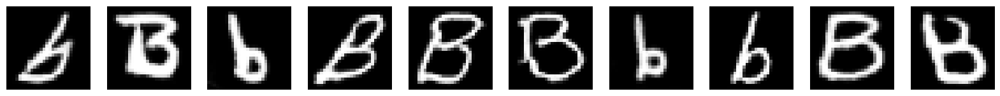

Epoch 300: D Accuracy = 0.7132
27/27 [==============================] - 1s 40ms/step - d_loss: 0.9766 - g_loss: 1.6464 - d_accuracy: 0.7870
Epoch 301/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0185 - g_loss: 1.7102 - d_accuracy: 0.7692
Epoch 302/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9761 - g_loss: 1.6855 - d_accuracy: 0.7867
Epoch 303/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9727 - g_loss: 1.6907 - d_accuracy: 0.7871
Epoch 304/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9756 - g_loss: 1.6953 - d_accuracy: 0.7834
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0380 - g_loss: 1.6709 - d_accuracy: 0.7628
Epoch 306/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0084 - g_loss: 1.6966 - d_accuracy: 0.7750
Epoch 307/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0065 - g_loss: 1.6834 - d_accuracy: 0.7736

27/27 [==============================] - 1s 34ms/step - d_loss: 0.9917 - g_loss: 1.7965 - d_accuracy: 0.7756
Epoch 333/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9462 - g_loss: 1.7632 - d_accuracy: 0.8004
Epoch 334/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9190 - g_loss: 1.8216 - d_accuracy: 0.8042
Epoch 335/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9474 - g_loss: 1.8426 - d_accuracy: 0.7961
Epoch 336/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9595 - g_loss: 1.7475 - d_accuracy: 0.7989
Epoch 337/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9824 - g_loss: 1.8757 - d_accuracy: 0.7794
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9403 - g_loss: 1.8094 - d_accuracy: 0.8034
Epoch 339/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9798 - g_loss: 1.7794 - d_accuracy: 0.7791
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9464 - g_loss: 1.8755 - d_accuracy: 0.7936
Epoch 365/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9221 - g_loss: 1.7984 - d_accuracy: 0.8160
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9222 - g_loss: 1.8320 - d_accuracy: 0.8110
Epoch 367/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9341 - g_loss: 1.8483 - d_accuracy: 0.7972
Epoch 368/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9282 - g_loss: 1.9289 - d_accuracy: 0.8094
Epoch 369/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0019 - g_loss: 1.8462 - d_accuracy: 0.7806
Epoch 370/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9174 - g_loss: 1.9098 - d_accuracy: 0.8080
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9595 - g_loss: 1.9355 - d_accuracy: 0.7828
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9154 - g_loss: 1.9751 - d_accuracy: 0.8093
Epoch 397/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9073 - g_loss: 1.9218 - d_accuracy: 0.8191
Epoch 398/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8786 - g_loss: 2.0689 - d_accuracy: 0.8245
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8883 - g_loss: 1.9846 - d_accuracy: 0.8258
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9200 - g_loss: 2.0244 - d_accuracy: 0.8096
Class 1 — Epoch 400 preview:


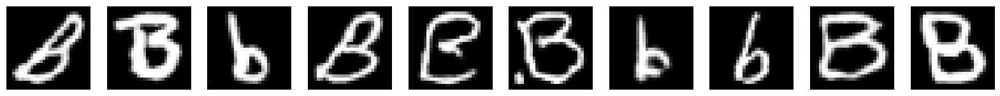

Epoch 400: D Accuracy = 0.7059
27/27 [==============================] - 1s 41ms/step - d_loss: 0.9227 - g_loss: 2.0787 - d_accuracy: 0.8059
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9204 - g_loss: 1.9297 - d_accuracy: 0.8119
Epoch 402/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8773 - g_loss: 1.9773 - d_accuracy: 0.8278
Epoch 403/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9419 - g_loss: 2.0374 - d_accuracy: 0.7929
Epoch 404/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9286 - g_loss: 1.9040 - d_accuracy: 0.8067
Epoch 405/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8947 - g_loss: 1.9692 - d_accuracy: 0.8140
Epoch 406/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9197 - g_loss: 1.8779 - d_accuracy: 0.8087
Epoch 407/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8746 - g_loss: 1.9788 - d_accuracy: 0.8266

27/27 [==============================] - 1s 34ms/step - d_loss: 0.9062 - g_loss: 2.0110 - d_accuracy: 0.8154
Epoch 433/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8501 - g_loss: 2.0889 - d_accuracy: 0.8348
Epoch 434/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8872 - g_loss: 2.0711 - d_accuracy: 0.8206
Epoch 435/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8665 - g_loss: 2.0468 - d_accuracy: 0.8359
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8783 - g_loss: 2.0326 - d_accuracy: 0.8277
Epoch 437/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8752 - g_loss: 2.0454 - d_accuracy: 0.8271
Epoch 438/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8866 - g_loss: 2.0886 - d_accuracy: 0.8189
Epoch 439/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8935 - g_loss: 2.0574 - d_accuracy: 0.8137
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8499 - g_loss: 2.1925 - d_accuracy: 0.8396
Epoch 465/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8583 - g_loss: 2.1250 - d_accuracy: 0.8383
Epoch 466/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8183 - g_loss: 2.1718 - d_accuracy: 0.8506
Epoch 467/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8348 - g_loss: 2.1758 - d_accuracy: 0.8418
Epoch 468/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8142 - g_loss: 2.1139 - d_accuracy: 0.8595
Epoch 469/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8464 - g_loss: 2.1687 - d_accuracy: 0.8399
Epoch 470/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8212 - g_loss: 2.2312 - d_accuracy: 0.8427
Epoch 471/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8396 - g_loss: 2.1502 - d_accuracy: 0.8392
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8074 - g_loss: 2.1945 - d_accuracy: 0.8593
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8120 - g_loss: 2.2683 - d_accuracy: 0.8523
Epoch 498/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7928 - g_loss: 2.2777 - d_accuracy: 0.8574
Epoch 499/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8030 - g_loss: 2.2353 - d_accuracy: 0.8574
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8396 - g_loss: 2.2780 - d_accuracy: 0.8414
Class 1 — Epoch 500 preview:


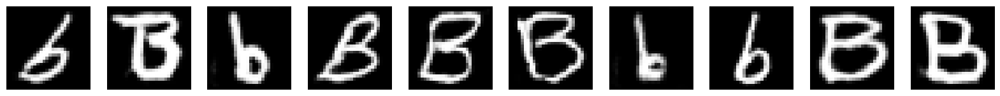

Epoch 500: D Accuracy = 0.8088
27/27 [==============================] - 1s 41ms/step - d_loss: 0.8385 - g_loss: 2.3042 - d_accuracy: 0.8403
Training DCGAN for class 2...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7549 - g_loss: 2.4693 - d_accuracy: 0.8796
Epoch 1: Generator loss improved from inf to 3.5175. Saving weights.
Epoch 1: D Accuracy = 0.8929
27/27 [==============================] - 2s 42ms/step - d_loss: 0.7506 - g_loss: 2.5068 - d_accuracy: 0.8800
Epoch 2/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.4978 - g_loss: 3.4304 - d_accuracy: 0.9661
Epoch 3/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7797 - g_loss: 3.6183 - d_accuracy: 0.8727
Epoch 3: Generator loss improved from 3.5175 to 0.9447. Saving weights.
Epoch 3: D Accuracy = 0.5857
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8011 - g_loss: 3.5228 - d_accuracy: 0.8624
Epoch 4/500
27/27 [==============================] - 1s 34ms

Epoch 31/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0719 - g_loss: 1.5601 - d_accuracy: 0.7495
Epoch 32/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0344 - g_loss: 1.5308 - d_accuracy: 0.7636
Epoch 33/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0119 - g_loss: 1.5039 - d_accuracy: 0.7785
Epoch 34/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0333 - g_loss: 1.5261 - d_accuracy: 0.7650
Epoch 35/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0759 - g_loss: 1.5131 - d_accuracy: 0.7495
Epoch 36/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0495 - g_loss: 1.5087 - d_accuracy: 0.7578
Epoch 37/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0179 - g_loss: 1.4884 - d_accuracy: 0.7786
Epoch 38/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0596 - g_loss: 1.4810 - d_accuracy: 0.7564
Epoch 39/500
27/27 [====

Epoch 63/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1272 - g_loss: 1.3696 - d_accuracy: 0.7207
Epoch 64/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0633 - g_loss: 1.3438 - d_accuracy: 0.7497
Epoch 65/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1420 - g_loss: 1.3886 - d_accuracy: 0.7096
Epoch 66/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1294 - g_loss: 1.3403 - d_accuracy: 0.7197
Epoch 67/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0780 - g_loss: 1.3375 - d_accuracy: 0.7460
Epoch 68/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0993 - g_loss: 1.3676 - d_accuracy: 0.7303
Epoch 69/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1611 - g_loss: 1.3891 - d_accuracy: 0.6940
Epoch 70/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1320 - g_loss: 1.3042 - d_accuracy: 0.7208
Epoch 71/500
27/27 [====

27/27 [==============================] - 1s 36ms/step - d_loss: 1.1391 - g_loss: 1.3381 - d_accuracy: 0.7143
Epoch 96/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1138 - g_loss: 1.3193 - d_accuracy: 0.7277
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1191 - g_loss: 1.3154 - d_accuracy: 0.7197
Epoch 98/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0949 - g_loss: 1.3460 - d_accuracy: 0.7411
Epoch 99/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1674 - g_loss: 1.3455 - d_accuracy: 0.7000
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1320 - g_loss: 1.3091 - d_accuracy: 0.7162
Class 2 — Epoch 100 preview:


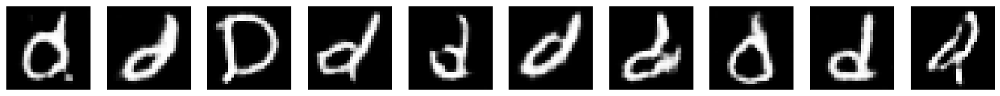

Epoch 100: D Accuracy = 0.7429
27/27 [==============================] - 1s 40ms/step - d_loss: 1.1305 - g_loss: 1.3117 - d_accuracy: 0.7171
Epoch 101/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1529 - g_loss: 1.3039 - d_accuracy: 0.7044
Epoch 102/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1226 - g_loss: 1.3043 - d_accuracy: 0.7266
Epoch 103/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1169 - g_loss: 1.3084 - d_accuracy: 0.7255
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1359 - g_loss: 1.2793 - d_accuracy: 0.7142
Epoch 105/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1511 - g_loss: 1.3561 - d_accuracy: 0.7039
Epoch 106/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1564 - g_loss: 1.2946 - d_accuracy: 0.7060
Epoch 107/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1381 - g_loss: 1.3334 - d_accuracy: 0.7123

27/27 [==============================] - 1s 34ms/step - d_loss: 1.1171 - g_loss: 1.3108 - d_accuracy: 0.7248
Epoch 133/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1316 - g_loss: 1.3297 - d_accuracy: 0.7135
Epoch 134/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1171 - g_loss: 1.3454 - d_accuracy: 0.7214
Epoch 135/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0915 - g_loss: 1.4035 - d_accuracy: 0.7325
Epoch 136/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1051 - g_loss: 1.3518 - d_accuracy: 0.7360
Epoch 137/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1220 - g_loss: 1.3621 - d_accuracy: 0.7200
Epoch 138/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1057 - g_loss: 1.3596 - d_accuracy: 0.7337
Epoch 139/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0740 - g_loss: 1.3347 - d_accuracy: 0.7485
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0559 - g_loss: 1.4415 - d_accuracy: 0.7495
Epoch 165/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0562 - g_loss: 1.4270 - d_accuracy: 0.7562
Epoch 165: Generator loss improved from 0.6894 to 0.6097. Saving weights.
Epoch 165: D Accuracy = 0.6857
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0678 - g_loss: 1.3978 - d_accuracy: 0.7536
Epoch 166/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0906 - g_loss: 1.4122 - d_accuracy: 0.7347
Epoch 167/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0702 - g_loss: 1.4120 - d_accuracy: 0.7413
Epoch 168/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0816 - g_loss: 1.4883 - d_accuracy: 0.7394
Epoch 169/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0929 - g_loss: 1.4601 - d_accuracy: 0.7351
Epoch 170/500
27/27 [==============================] 

Epoch 196/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0427 - g_loss: 1.5045 - d_accuracy: 0.7522
Epoch 197/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0401 - g_loss: 1.5113 - d_accuracy: 0.7577
Epoch 198/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0458 - g_loss: 1.5203 - d_accuracy: 0.7542
Epoch 199/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0299 - g_loss: 1.5193 - d_accuracy: 0.7670
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0189 - g_loss: 1.5074 - d_accuracy: 0.7663
Class 2 — Epoch 200 preview:


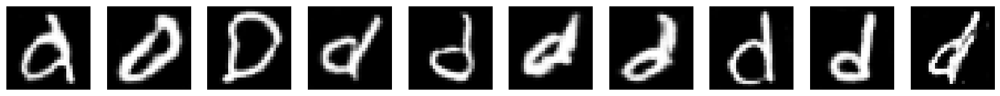

Epoch 200: D Accuracy = 0.8143
27/27 [==============================] - 1s 40ms/step - d_loss: 1.0151 - g_loss: 1.5080 - d_accuracy: 0.7680
Epoch 201/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0759 - g_loss: 1.5484 - d_accuracy: 0.7305
Epoch 202/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0423 - g_loss: 1.4921 - d_accuracy: 0.7534
Epoch 203/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0420 - g_loss: 1.4996 - d_accuracy: 0.7538
Epoch 204/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0644 - g_loss: 1.5067 - d_accuracy: 0.7532
Epoch 205/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0275 - g_loss: 1.5965 - d_accuracy: 0.7564
Epoch 206/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0428 - g_loss: 1.5185 - d_accuracy: 0.7599
Epoch 207/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0318 - g_loss: 1.5224 - d_accuracy: 0.7653

27/27 [==============================] - 1s 36ms/step - d_loss: 1.0246 - g_loss: 1.5378 - d_accuracy: 0.7670
Epoch 233/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0090 - g_loss: 1.5903 - d_accuracy: 0.7742
Epoch 234/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9897 - g_loss: 1.6316 - d_accuracy: 0.7786
Epoch 235/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0310 - g_loss: 1.5665 - d_accuracy: 0.7668
Epoch 236/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9988 - g_loss: 1.6161 - d_accuracy: 0.7686
Epoch 237/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0063 - g_loss: 1.5541 - d_accuracy: 0.7799
Epoch 238/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0211 - g_loss: 1.6010 - d_accuracy: 0.7650
Epoch 239/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0262 - g_loss: 1.6063 - d_accuracy: 0.7671
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9902 - g_loss: 1.6996 - d_accuracy: 0.7746
Epoch 265/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0182 - g_loss: 1.6445 - d_accuracy: 0.7639
Epoch 266/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0033 - g_loss: 1.7285 - d_accuracy: 0.7730
Epoch 267/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9784 - g_loss: 1.6709 - d_accuracy: 0.7822
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9897 - g_loss: 1.6459 - d_accuracy: 0.7837
Epoch 269/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9858 - g_loss: 1.6429 - d_accuracy: 0.7890
Epoch 270/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9809 - g_loss: 1.6492 - d_accuracy: 0.7871
Epoch 271/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9855 - g_loss: 1.7377 - d_accuracy: 0.7749
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9559 - g_loss: 1.7446 - d_accuracy: 0.7897
Epoch 297/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9223 - g_loss: 1.7555 - d_accuracy: 0.8126
Epoch 298/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9336 - g_loss: 1.7837 - d_accuracy: 0.8012
Epoch 299/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9460 - g_loss: 1.7469 - d_accuracy: 0.8038
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9457 - g_loss: 1.7875 - d_accuracy: 0.7954
Class 2 — Epoch 300 preview:


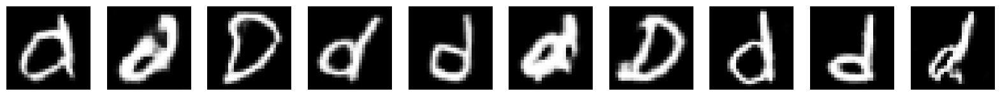

Epoch 300: D Accuracy = 0.8071
27/27 [==============================] - 1s 40ms/step - d_loss: 0.9496 - g_loss: 1.7615 - d_accuracy: 0.7958
Epoch 301/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9855 - g_loss: 1.7911 - d_accuracy: 0.7795
Epoch 302/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8978 - g_loss: 1.7914 - d_accuracy: 0.8240
Epoch 303/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9935 - g_loss: 1.7883 - d_accuracy: 0.7781
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9543 - g_loss: 1.7596 - d_accuracy: 0.7973
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0282 - g_loss: 1.7938 - d_accuracy: 0.7800
Epoch 306/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9222 - g_loss: 1.7425 - d_accuracy: 0.8113
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9055 - g_loss: 1.7945 - d_accuracy: 0.8212

27/27 [==============================] - 1s 35ms/step - d_loss: 0.9231 - g_loss: 1.8789 - d_accuracy: 0.8049
Epoch 333/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9271 - g_loss: 1.8494 - d_accuracy: 0.8112
Epoch 334/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.9167 - g_loss: 1.8855 - d_accuracy: 0.8125
Epoch 335/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8652 - g_loss: 1.8844 - d_accuracy: 0.8361
Epoch 336/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9022 - g_loss: 1.8765 - d_accuracy: 0.8178
Epoch 337/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8654 - g_loss: 1.9077 - d_accuracy: 0.8387
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9294 - g_loss: 1.9731 - d_accuracy: 0.8033
Epoch 339/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9905 - g_loss: 1.8534 - d_accuracy: 0.7842
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8710 - g_loss: 2.0197 - d_accuracy: 0.8271
Epoch 365/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8812 - g_loss: 1.9573 - d_accuracy: 0.8268
Epoch 366/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8749 - g_loss: 2.0006 - d_accuracy: 0.8284
Epoch 367/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9043 - g_loss: 1.9992 - d_accuracy: 0.8182
Epoch 368/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8429 - g_loss: 2.0345 - d_accuracy: 0.8459
Epoch 369/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8402 - g_loss: 1.9880 - d_accuracy: 0.8503
Epoch 370/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8365 - g_loss: 2.0002 - d_accuracy: 0.8489
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8752 - g_loss: 1.9891 - d_accuracy: 0.8332
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8425 - g_loss: 2.1292 - d_accuracy: 0.8366
Epoch 397/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8173 - g_loss: 2.1358 - d_accuracy: 0.8530
Epoch 398/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8011 - g_loss: 2.1401 - d_accuracy: 0.8622
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8696 - g_loss: 2.0797 - d_accuracy: 0.8281
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8432 - g_loss: 2.1444 - d_accuracy: 0.8406
Class 2 — Epoch 400 preview:


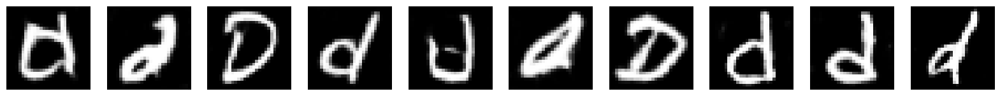

Epoch 400: D Accuracy = 0.8357
27/27 [==============================] - 1s 40ms/step - d_loss: 0.8432 - g_loss: 2.1378 - d_accuracy: 0.8404
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8016 - g_loss: 2.1109 - d_accuracy: 0.8606
Epoch 402/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9027 - g_loss: 2.1548 - d_accuracy: 0.8143
Epoch 403/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8278 - g_loss: 2.1193 - d_accuracy: 0.8496
Epoch 404/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8605 - g_loss: 2.1369 - d_accuracy: 0.8286
Epoch 405/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7942 - g_loss: 2.1635 - d_accuracy: 0.8612
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8584 - g_loss: 2.1992 - d_accuracy: 0.8351
Epoch 407/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9109 - g_loss: 2.1414 - d_accuracy: 0.8155

27/27 [==============================] - 1s 34ms/step - d_loss: 0.8432 - g_loss: 2.2478 - d_accuracy: 0.8358
Epoch 433/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7844 - g_loss: 2.3024 - d_accuracy: 0.8598
Epoch 434/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7992 - g_loss: 2.2602 - d_accuracy: 0.8578
Epoch 435/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8171 - g_loss: 2.2892 - d_accuracy: 0.8521
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7754 - g_loss: 2.2804 - d_accuracy: 0.8685
Epoch 437/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8272 - g_loss: 2.2553 - d_accuracy: 0.8512
Epoch 438/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8009 - g_loss: 2.2483 - d_accuracy: 0.8530
Epoch 439/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8021 - g_loss: 2.2399 - d_accuracy: 0.8600
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7739 - g_loss: 2.3047 - d_accuracy: 0.8738
Epoch 465/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7806 - g_loss: 2.3324 - d_accuracy: 0.8612
Epoch 466/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7758 - g_loss: 2.3644 - d_accuracy: 0.8691
Epoch 467/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8064 - g_loss: 2.2988 - d_accuracy: 0.8564
Epoch 468/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7522 - g_loss: 2.3781 - d_accuracy: 0.8806
Epoch 469/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7956 - g_loss: 2.3993 - d_accuracy: 0.8569
Epoch 470/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7827 - g_loss: 2.4129 - d_accuracy: 0.8640
Epoch 471/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8531 - g_loss: 2.3107 - d_accuracy: 0.8303
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7461 - g_loss: 2.4480 - d_accuracy: 0.8786
Epoch 497/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7442 - g_loss: 2.4768 - d_accuracy: 0.8805
Epoch 498/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8328 - g_loss: 2.4787 - d_accuracy: 0.8449
Epoch 499/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7603 - g_loss: 2.4943 - d_accuracy: 0.8752
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7311 - g_loss: 2.4622 - d_accuracy: 0.8849
Class 2 — Epoch 500 preview:


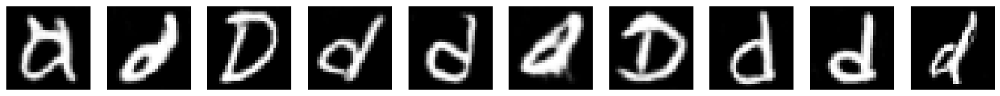

Epoch 500: D Accuracy = 0.8286
27/27 [==============================] - 1s 45ms/step - d_loss: 0.7340 - g_loss: 2.4635 - d_accuracy: 0.8828
Training DCGAN for class 3...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8284 - g_loss: 1.9719 - d_accuracy: 0.8688
Epoch 1: Generator loss improved from inf to 1.1074. Saving weights.
Epoch 1: D Accuracy = 0.8119
27/27 [==============================] - 2s 44ms/step - d_loss: 0.8359 - g_loss: 1.9410 - d_accuracy: 0.8667
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1602 - g_loss: 1.5598 - d_accuracy: 0.7374
Epoch 2: Generator loss improved from 1.1074 to 1.0177. Saving weights.
Epoch 2: D Accuracy = 0.7431
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1583 - g_loss: 1.5404 - d_accuracy: 0.7377
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2273 - g_loss: 1.2487 - d_accuracy: 0.6845
Epoch 4/500
27/27 [==============================] - 1s 34ms

Epoch 30/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1865 - g_loss: 1.1779 - d_accuracy: 0.6971
Epoch 31/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1551 - g_loss: 1.1928 - d_accuracy: 0.7083
Epoch 32/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1536 - g_loss: 1.2073 - d_accuracy: 0.7097
Epoch 33/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1473 - g_loss: 1.1931 - d_accuracy: 0.7100
Epoch 34/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2010 - g_loss: 1.1765 - d_accuracy: 0.6866
Epoch 35/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1573 - g_loss: 1.1764 - d_accuracy: 0.7068
Epoch 36/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2026 - g_loss: 1.1652 - d_accuracy: 0.6849
Epoch 37/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1824 - g_loss: 1.1489 - d_accuracy: 0.6878
Epoch 38/500
27/27 [====

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2202 - g_loss: 1.0816 - d_accuracy: 0.6682
Epoch 63/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2442 - g_loss: 1.0656 - d_accuracy: 0.6553
Epoch 64/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2378 - g_loss: 1.0477 - d_accuracy: 0.6574
Epoch 65/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2443 - g_loss: 1.0747 - d_accuracy: 0.6462
Epoch 66/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2553 - g_loss: 1.0761 - d_accuracy: 0.6443
Epoch 67/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2487 - g_loss: 1.0823 - d_accuracy: 0.6606
Epoch 68/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2305 - g_loss: 1.0736 - d_accuracy: 0.6591
Epoch 69/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2411 - g_loss: 1.0490 - d_accuracy: 0.6523
Epoch 70/500
27/27 [=================

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2346 - g_loss: 1.1017 - d_accuracy: 0.6630
Epoch 95/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2497 - g_loss: 1.0849 - d_accuracy: 0.6487
Epoch 96/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2163 - g_loss: 1.0530 - d_accuracy: 0.6678
Epoch 97/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2409 - g_loss: 1.0992 - d_accuracy: 0.6514
Epoch 98/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2125 - g_loss: 1.0693 - d_accuracy: 0.6733
Epoch 99/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2490 - g_loss: 1.1065 - d_accuracy: 0.6457
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2194 - g_loss: 1.0659 - d_accuracy: 0.6683
Class 3 — Epoch 100 preview:


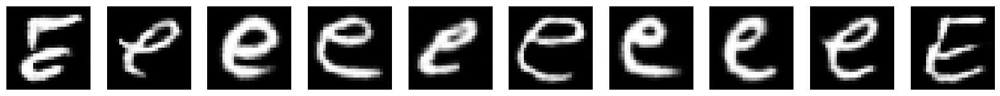

Epoch 100: D Accuracy = 0.6468
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2204 - g_loss: 1.0647 - d_accuracy: 0.6676
Epoch 101/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2412 - g_loss: 1.0879 - d_accuracy: 0.6488
Epoch 102/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2136 - g_loss: 1.1238 - d_accuracy: 0.6718
Epoch 103/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2147 - g_loss: 1.1144 - d_accuracy: 0.6722
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2162 - g_loss: 1.0988 - d_accuracy: 0.6751
Epoch 105/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2081 - g_loss: 1.0952 - d_accuracy: 0.6778
Epoch 106/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2208 - g_loss: 1.1191 - d_accuracy: 0.6713
Epoch 107/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2185 - g_loss: 1.0943 - d_accuracy: 0.6740

27/27 [==============================] - 1s 36ms/step - d_loss: 1.1954 - g_loss: 1.1747 - d_accuracy: 0.6830
Epoch 133/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1946 - g_loss: 1.1486 - d_accuracy: 0.6788
Epoch 134/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1755 - g_loss: 1.1565 - d_accuracy: 0.6915
Epoch 135/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1796 - g_loss: 1.1591 - d_accuracy: 0.6970
Epoch 136/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1786 - g_loss: 1.1295 - d_accuracy: 0.7008
Epoch 137/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1870 - g_loss: 1.1806 - d_accuracy: 0.6887
Epoch 138/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1750 - g_loss: 1.1723 - d_accuracy: 0.6931
Epoch 139/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1644 - g_loss: 1.1522 - d_accuracy: 0.7037
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1596 - g_loss: 1.2651 - d_accuracy: 0.7060
Epoch 165/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1263 - g_loss: 1.2121 - d_accuracy: 0.7149
Epoch 166/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1341 - g_loss: 1.3184 - d_accuracy: 0.7200
Epoch 167/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1535 - g_loss: 1.2396 - d_accuracy: 0.7113
Epoch 168/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1056 - g_loss: 1.2411 - d_accuracy: 0.7342
Epoch 169/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1193 - g_loss: 1.2739 - d_accuracy: 0.7198
Epoch 170/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0973 - g_loss: 1.2912 - d_accuracy: 0.7349
Epoch 171/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1282 - g_loss: 1.2815 - d_accuracy: 0.7169
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1119 - g_loss: 1.3788 - d_accuracy: 0.7269
Epoch 197/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1034 - g_loss: 1.3948 - d_accuracy: 0.7321
Epoch 198/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0375 - g_loss: 1.3716 - d_accuracy: 0.7683
Epoch 199/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0520 - g_loss: 1.3747 - d_accuracy: 0.7539
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0495 - g_loss: 1.4072 - d_accuracy: 0.7568
Class 3 — Epoch 200 preview:


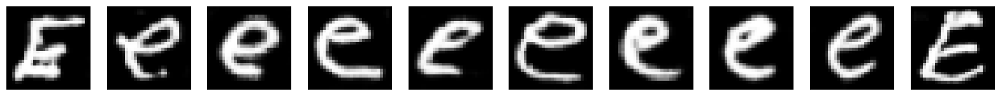

Epoch 200: D Accuracy = 0.7706
27/27 [==============================] - 1s 41ms/step - d_loss: 1.0484 - g_loss: 1.4100 - d_accuracy: 0.7573
Epoch 201/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0519 - g_loss: 1.4222 - d_accuracy: 0.7501
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0475 - g_loss: 1.4239 - d_accuracy: 0.7545
Epoch 203/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0828 - g_loss: 1.3951 - d_accuracy: 0.7455
Epoch 204/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0374 - g_loss: 1.4302 - d_accuracy: 0.7613
Epoch 205/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0425 - g_loss: 1.4124 - d_accuracy: 0.7629
Epoch 206/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0436 - g_loss: 1.4534 - d_accuracy: 0.7541
Epoch 207/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0360 - g_loss: 1.4292 - d_accuracy: 0.7662

27/27 [==============================] - 1s 36ms/step - d_loss: 0.9749 - g_loss: 1.5567 - d_accuracy: 0.7959
Epoch 233/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9807 - g_loss: 1.5503 - d_accuracy: 0.7873
Epoch 234/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0003 - g_loss: 1.5900 - d_accuracy: 0.7758
Epoch 235/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0137 - g_loss: 1.5616 - d_accuracy: 0.7771
Epoch 236/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0014 - g_loss: 1.5592 - d_accuracy: 0.7720
Epoch 237/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9811 - g_loss: 1.5907 - d_accuracy: 0.7846
Epoch 238/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9654 - g_loss: 1.5396 - d_accuracy: 0.7947
Epoch 239/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9783 - g_loss: 1.5517 - d_accuracy: 0.7917
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9440 - g_loss: 1.6319 - d_accuracy: 0.8047
Epoch 265/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9539 - g_loss: 1.6501 - d_accuracy: 0.7967
Epoch 266/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9632 - g_loss: 1.6526 - d_accuracy: 0.7927
Epoch 267/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9257 - g_loss: 1.6869 - d_accuracy: 0.8129
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9719 - g_loss: 1.7808 - d_accuracy: 0.7847
Epoch 269/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9381 - g_loss: 1.6659 - d_accuracy: 0.8116
Epoch 270/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9481 - g_loss: 1.6427 - d_accuracy: 0.8085
Epoch 271/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9313 - g_loss: 1.7010 - d_accuracy: 0.8092
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9027 - g_loss: 1.7492 - d_accuracy: 0.8236
Epoch 297/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9099 - g_loss: 1.8196 - d_accuracy: 0.8120
Epoch 298/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9148 - g_loss: 1.8249 - d_accuracy: 0.8138
Epoch 299/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8807 - g_loss: 1.8047 - d_accuracy: 0.8328
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9021 - g_loss: 1.8087 - d_accuracy: 0.8185
Class 3 — Epoch 300 preview:


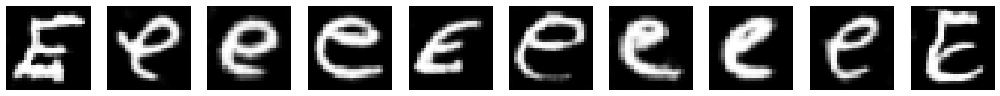

Epoch 300: D Accuracy = 0.8211
27/27 [==============================] - 1s 42ms/step - d_loss: 0.9001 - g_loss: 1.8245 - d_accuracy: 0.8186
Epoch 301/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8712 - g_loss: 1.8055 - d_accuracy: 0.8370
Epoch 302/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9061 - g_loss: 1.8255 - d_accuracy: 0.8160
Epoch 303/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9125 - g_loss: 1.7503 - d_accuracy: 0.8200
Epoch 304/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9219 - g_loss: 1.8229 - d_accuracy: 0.8193
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9096 - g_loss: 1.7608 - d_accuracy: 0.8195
Epoch 306/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8783 - g_loss: 1.8558 - d_accuracy: 0.8348
Epoch 307/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9068 - g_loss: 1.8433 - d_accuracy: 0.8147

27/27 [==============================] - 1s 35ms/step - d_loss: 0.8803 - g_loss: 1.9423 - d_accuracy: 0.8288
Epoch 333/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8925 - g_loss: 1.8922 - d_accuracy: 0.8223
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9042 - g_loss: 1.9261 - d_accuracy: 0.8148
Epoch 335/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8804 - g_loss: 1.9196 - d_accuracy: 0.8260
Epoch 336/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8722 - g_loss: 1.9376 - d_accuracy: 0.8317
Epoch 337/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8508 - g_loss: 1.8946 - d_accuracy: 0.8476
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8634 - g_loss: 1.9624 - d_accuracy: 0.8352
Epoch 339/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8572 - g_loss: 2.0281 - d_accuracy: 0.8323
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8609 - g_loss: 1.9839 - d_accuracy: 0.8344
Epoch 365/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8166 - g_loss: 2.0404 - d_accuracy: 0.8601
Epoch 366/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8355 - g_loss: 2.0574 - d_accuracy: 0.8450
Epoch 367/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8080 - g_loss: 2.0713 - d_accuracy: 0.8615
Epoch 368/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8517 - g_loss: 2.1508 - d_accuracy: 0.8396
Epoch 369/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8327 - g_loss: 2.0758 - d_accuracy: 0.8447
Epoch 370/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8404 - g_loss: 2.0645 - d_accuracy: 0.8393
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8210 - g_loss: 1.9907 - d_accuracy: 0.8579
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8652 - g_loss: 2.2876 - d_accuracy: 0.8246
Epoch 397/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8480 - g_loss: 2.1016 - d_accuracy: 0.8462
Epoch 398/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8052 - g_loss: 2.1225 - d_accuracy: 0.8602
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8247 - g_loss: 2.1462 - d_accuracy: 0.8475
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7867 - g_loss: 2.1442 - d_accuracy: 0.8606
Class 3 — Epoch 400 preview:


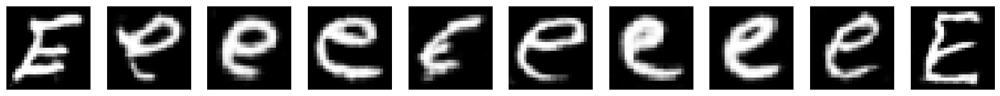

Epoch 400: D Accuracy = 0.9037
27/27 [==============================] - 1s 44ms/step - d_loss: 0.7833 - g_loss: 2.1467 - d_accuracy: 0.8621
Epoch 401/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7966 - g_loss: 2.1550 - d_accuracy: 0.8631
Epoch 402/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7731 - g_loss: 2.1787 - d_accuracy: 0.8740
Epoch 403/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8042 - g_loss: 2.1629 - d_accuracy: 0.8558
Epoch 404/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8654 - g_loss: 2.3100 - d_accuracy: 0.8352
Epoch 405/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8081 - g_loss: 2.1563 - d_accuracy: 0.8587
Epoch 406/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7944 - g_loss: 2.1220 - d_accuracy: 0.8655
Epoch 407/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7801 - g_loss: 2.1745 - d_accuracy: 0.8702

27/27 [==============================] - 1s 35ms/step - d_loss: 0.7918 - g_loss: 2.2363 - d_accuracy: 0.8618
Epoch 433/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7514 - g_loss: 2.3102 - d_accuracy: 0.8780
Epoch 434/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7621 - g_loss: 2.2311 - d_accuracy: 0.8819
Epoch 435/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7960 - g_loss: 2.3077 - d_accuracy: 0.8569
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7660 - g_loss: 2.3056 - d_accuracy: 0.8726
Epoch 437/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7595 - g_loss: 2.3644 - d_accuracy: 0.8717
Epoch 438/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7833 - g_loss: 2.1758 - d_accuracy: 0.8732
Epoch 439/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8187 - g_loss: 2.3126 - d_accuracy: 0.8455
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7601 - g_loss: 2.3471 - d_accuracy: 0.8740
Epoch 465/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7820 - g_loss: 2.3604 - d_accuracy: 0.8667
Epoch 466/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7411 - g_loss: 2.3628 - d_accuracy: 0.8811
Epoch 467/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7550 - g_loss: 2.4030 - d_accuracy: 0.8716
Epoch 468/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7615 - g_loss: 2.4058 - d_accuracy: 0.8689
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7893 - g_loss: 2.3765 - d_accuracy: 0.8596
Epoch 470/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7308 - g_loss: 2.3540 - d_accuracy: 0.8897
Epoch 471/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7611 - g_loss: 2.4140 - d_accuracy: 0.8648
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7117 - g_loss: 2.4534 - d_accuracy: 0.8949
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7614 - g_loss: 2.5023 - d_accuracy: 0.8704
Epoch 498/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7390 - g_loss: 2.4551 - d_accuracy: 0.8816
Epoch 499/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7199 - g_loss: 2.4205 - d_accuracy: 0.8897
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7242 - g_loss: 2.5107 - d_accuracy: 0.8854
Class 3 — Epoch 500 preview:


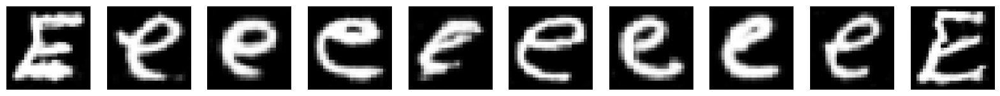

Epoch 500: D Accuracy = 0.8394
27/27 [==============================] - 1s 42ms/step - d_loss: 0.7252 - g_loss: 2.5275 - d_accuracy: 0.8838
Training DCGAN for class 4...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7343 - g_loss: 2.3840 - d_accuracy: 0.8907
Epoch 1: Generator loss improved from inf to 3.2327. Saving weights.
Epoch 1: D Accuracy = 0.7846
27/27 [==============================] - 2s 41ms/step - d_loss: 0.7406 - g_loss: 2.4143 - d_accuracy: 0.8870
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8153 - g_loss: 2.2402 - d_accuracy: 0.8614
Epoch 2: Generator loss improved from 3.2327 to 2.8099. Saving weights.
Epoch 2: D Accuracy = 0.9231
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8078 - g_loss: 2.2605 - d_accuracy: 0.8636
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.5105 - g_loss: 3.6424 - d_accuracy: 0.9618
Epoch 4/500
27/27 [==============================] - ETA: 0s

Epoch 31/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1065 - g_loss: 1.3553 - d_accuracy: 0.7356
Epoch 32/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1050 - g_loss: 1.2980 - d_accuracy: 0.7346
Epoch 33/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1339 - g_loss: 1.3228 - d_accuracy: 0.7176
Epoch 34/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0990 - g_loss: 1.3448 - d_accuracy: 0.7383
Epoch 35/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1110 - g_loss: 1.3550 - d_accuracy: 0.7258
Epoch 36/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0868 - g_loss: 1.3442 - d_accuracy: 0.7400
Epoch 37/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0988 - g_loss: 1.3702 - d_accuracy: 0.7345
Epoch 38/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1117 - g_loss: 1.3758 - d_accuracy: 0.7320
Epoch 39/500
27/27 [====

27/27 [==============================] - 1s 34ms/step - d_loss: 1.1773 - g_loss: 1.2531 - d_accuracy: 0.6993
Epoch 64/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1775 - g_loss: 1.2250 - d_accuracy: 0.6991
Epoch 65/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1540 - g_loss: 1.2359 - d_accuracy: 0.7075
Epoch 66/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1600 - g_loss: 1.2381 - d_accuracy: 0.7006
Epoch 67/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1724 - g_loss: 1.2122 - d_accuracy: 0.6957
Epoch 68/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1496 - g_loss: 1.2258 - d_accuracy: 0.7069
Epoch 69/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2062 - g_loss: 1.2149 - d_accuracy: 0.6786
Epoch 70/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1958 - g_loss: 1.2008 - d_accuracy: 0.6755
Epoch 71/500
27/27 [=================

27/27 [==============================] - 1s 35ms/step - d_loss: 1.1910 - g_loss: 1.1902 - d_accuracy: 0.6905
Epoch 96/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1805 - g_loss: 1.2157 - d_accuracy: 0.6879
Epoch 97/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2040 - g_loss: 1.2256 - d_accuracy: 0.6763
Epoch 98/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2113 - g_loss: 1.1389 - d_accuracy: 0.6794
Epoch 99/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1604 - g_loss: 1.1895 - d_accuracy: 0.6962
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1921 - g_loss: 1.1745 - d_accuracy: 0.6829
Class 4 — Epoch 100 preview:


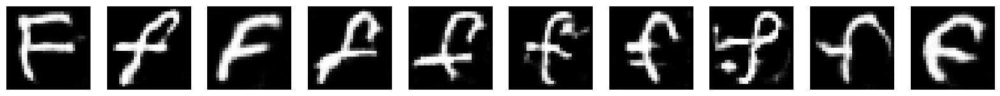

Epoch 100: D Accuracy = 0.6308
27/27 [==============================] - 1s 40ms/step - d_loss: 1.1947 - g_loss: 1.1684 - d_accuracy: 0.6811
Epoch 101/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2094 - g_loss: 1.1904 - d_accuracy: 0.6795
Epoch 102/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1826 - g_loss: 1.1613 - d_accuracy: 0.6864
Epoch 103/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1896 - g_loss: 1.1807 - d_accuracy: 0.6861
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1874 - g_loss: 1.1557 - d_accuracy: 0.6874
Epoch 105/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1795 - g_loss: 1.1919 - d_accuracy: 0.6915
Epoch 106/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2130 - g_loss: 1.1948 - d_accuracy: 0.6708
Epoch 107/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1774 - g_loss: 1.1521 - d_accuracy: 0.6898

27/27 [==============================] - 1s 34ms/step - d_loss: 1.1515 - g_loss: 1.2135 - d_accuracy: 0.7090
Epoch 133/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1194 - g_loss: 1.2923 - d_accuracy: 0.7163
Epoch 134/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1509 - g_loss: 1.2286 - d_accuracy: 0.7072
Epoch 135/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1497 - g_loss: 1.2632 - d_accuracy: 0.7079
Epoch 136/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1330 - g_loss: 1.2742 - d_accuracy: 0.7189
Epoch 137/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1379 - g_loss: 1.2655 - d_accuracy: 0.7050
Epoch 138/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1380 - g_loss: 1.3023 - d_accuracy: 0.7048
Epoch 139/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1339 - g_loss: 1.2774 - d_accuracy: 0.7143
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0900 - g_loss: 1.3468 - d_accuracy: 0.7345
Epoch 165/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1101 - g_loss: 1.3346 - d_accuracy: 0.7268
Epoch 166/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0991 - g_loss: 1.3185 - d_accuracy: 0.7375
Epoch 167/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0863 - g_loss: 1.3736 - d_accuracy: 0.7332
Epoch 168/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0856 - g_loss: 1.3791 - d_accuracy: 0.7461
Epoch 169/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0766 - g_loss: 1.3893 - d_accuracy: 0.7438
Epoch 170/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0801 - g_loss: 1.3406 - d_accuracy: 0.7452
Epoch 171/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0564 - g_loss: 1.4022 - d_accuracy: 0.7555
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0574 - g_loss: 1.4270 - d_accuracy: 0.7510
Epoch 197/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0397 - g_loss: 1.4716 - d_accuracy: 0.7596
Epoch 198/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0749 - g_loss: 1.4387 - d_accuracy: 0.7473
Epoch 199/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0434 - g_loss: 1.4258 - d_accuracy: 0.7593
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0388 - g_loss: 1.4849 - d_accuracy: 0.7606
Class 4 — Epoch 200 preview:


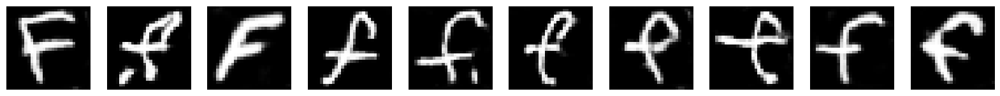

Epoch 200: D Accuracy = 0.7308
27/27 [==============================] - 1s 42ms/step - d_loss: 1.0369 - g_loss: 1.5076 - d_accuracy: 0.7595
Epoch 201/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0265 - g_loss: 1.4342 - d_accuracy: 0.7663
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0429 - g_loss: 1.4965 - d_accuracy: 0.7573
Epoch 203/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0583 - g_loss: 1.4757 - d_accuracy: 0.7496
Epoch 204/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0715 - g_loss: 1.4964 - d_accuracy: 0.7408
Epoch 205/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0395 - g_loss: 1.4411 - d_accuracy: 0.7624
Epoch 206/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0319 - g_loss: 1.4707 - d_accuracy: 0.7670
Epoch 207/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0298 - g_loss: 1.4818 - d_accuracy: 0.7684

27/27 [==============================] - 1s 34ms/step - d_loss: 0.9561 - g_loss: 1.6054 - d_accuracy: 0.8031
Epoch 233/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0034 - g_loss: 1.6410 - d_accuracy: 0.7751
Epoch 234/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9959 - g_loss: 1.5888 - d_accuracy: 0.7817
Epoch 235/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.9782 - g_loss: 1.5556 - d_accuracy: 0.7923
Epoch 236/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0093 - g_loss: 1.5835 - d_accuracy: 0.7714
Epoch 237/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9724 - g_loss: 1.5788 - d_accuracy: 0.7978
Epoch 238/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0171 - g_loss: 1.5890 - d_accuracy: 0.7685
Epoch 239/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0024 - g_loss: 1.5964 - d_accuracy: 0.7749
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9337 - g_loss: 1.7006 - d_accuracy: 0.8052
Epoch 265/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9227 - g_loss: 1.6925 - d_accuracy: 0.8124
Epoch 266/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9450 - g_loss: 1.7263 - d_accuracy: 0.8037
Epoch 267/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9456 - g_loss: 1.7586 - d_accuracy: 0.8024
Epoch 268/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9544 - g_loss: 1.7829 - d_accuracy: 0.8013
Epoch 269/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9360 - g_loss: 1.7207 - d_accuracy: 0.8100
Epoch 270/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9100 - g_loss: 1.7354 - d_accuracy: 0.8211
Epoch 271/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9627 - g_loss: 1.8421 - d_accuracy: 0.7904
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8875 - g_loss: 1.8431 - d_accuracy: 0.8254
Epoch 297/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9303 - g_loss: 1.9279 - d_accuracy: 0.7971
Epoch 298/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8774 - g_loss: 1.8196 - d_accuracy: 0.8365
Epoch 299/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9269 - g_loss: 1.8724 - d_accuracy: 0.8104
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8837 - g_loss: 1.8983 - d_accuracy: 0.8268
Class 4 — Epoch 300 preview:


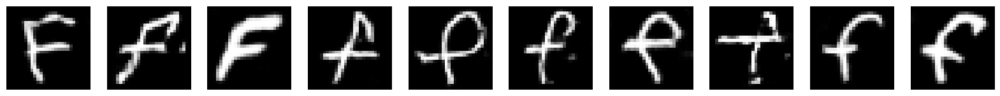

Epoch 300: D Accuracy = 0.7846
27/27 [==============================] - 1s 41ms/step - d_loss: 0.8830 - g_loss: 1.9017 - d_accuracy: 0.8253
Epoch 301/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8769 - g_loss: 1.8844 - d_accuracy: 0.8297
Epoch 302/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9071 - g_loss: 1.8966 - d_accuracy: 0.8162
Epoch 303/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8696 - g_loss: 1.8819 - d_accuracy: 0.8336
Epoch 304/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8942 - g_loss: 1.8852 - d_accuracy: 0.8215
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8937 - g_loss: 1.8996 - d_accuracy: 0.8253
Epoch 306/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8736 - g_loss: 1.8897 - d_accuracy: 0.8276
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8645 - g_loss: 1.9283 - d_accuracy: 0.8305

27/27 [==============================] - 1s 34ms/step - d_loss: 0.8553 - g_loss: 2.0200 - d_accuracy: 0.8362
Epoch 333/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8581 - g_loss: 2.0059 - d_accuracy: 0.8376
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8699 - g_loss: 2.0353 - d_accuracy: 0.8285
Epoch 335/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8564 - g_loss: 2.0473 - d_accuracy: 0.8339
Epoch 336/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8136 - g_loss: 2.0542 - d_accuracy: 0.8565
Epoch 337/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8479 - g_loss: 2.1306 - d_accuracy: 0.8391
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9037 - g_loss: 2.0023 - d_accuracy: 0.8160
Epoch 339/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8285 - g_loss: 2.0347 - d_accuracy: 0.8478
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7976 - g_loss: 2.1066 - d_accuracy: 0.8629
Epoch 365/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8557 - g_loss: 2.1912 - d_accuracy: 0.8390
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8312 - g_loss: 2.1384 - d_accuracy: 0.8508
Epoch 367/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8468 - g_loss: 2.1738 - d_accuracy: 0.8369
Epoch 368/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8118 - g_loss: 2.1633 - d_accuracy: 0.8577
Epoch 369/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8033 - g_loss: 2.1418 - d_accuracy: 0.8573
Epoch 370/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8457 - g_loss: 2.1979 - d_accuracy: 0.8385
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7976 - g_loss: 2.1744 - d_accuracy: 0.8642
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7685 - g_loss: 2.3116 - d_accuracy: 0.8689
Epoch 397/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8265 - g_loss: 2.3315 - d_accuracy: 0.8515
Epoch 398/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7808 - g_loss: 2.2495 - d_accuracy: 0.8686
Epoch 399/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7753 - g_loss: 2.2676 - d_accuracy: 0.8701
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7817 - g_loss: 2.3236 - d_accuracy: 0.8602
Class 4 — Epoch 400 preview:


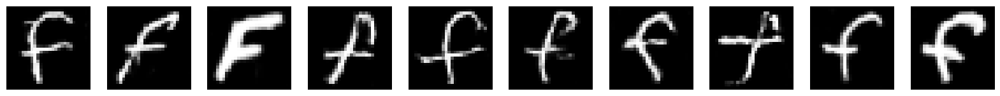

Epoch 400: D Accuracy = 0.9077
27/27 [==============================] - 1s 46ms/step - d_loss: 0.7796 - g_loss: 2.3275 - d_accuracy: 0.8618
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7777 - g_loss: 2.2665 - d_accuracy: 0.8707
Epoch 402/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8000 - g_loss: 2.3709 - d_accuracy: 0.8545
Epoch 403/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7617 - g_loss: 2.3613 - d_accuracy: 0.8718
Epoch 404/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7864 - g_loss: 2.3532 - d_accuracy: 0.8586
Epoch 405/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7928 - g_loss: 2.2961 - d_accuracy: 0.8618
Epoch 406/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8247 - g_loss: 2.2849 - d_accuracy: 0.8404
Epoch 407/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7860 - g_loss: 2.3261 - d_accuracy: 0.8654

27/27 [==============================] - 1s 34ms/step - d_loss: 0.7269 - g_loss: 2.4293 - d_accuracy: 0.8848
Epoch 433/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7733 - g_loss: 2.4326 - d_accuracy: 0.8723
Epoch 434/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7555 - g_loss: 2.4420 - d_accuracy: 0.8773
Epoch 435/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7935 - g_loss: 2.4902 - d_accuracy: 0.8562
Epoch 436/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7467 - g_loss: 2.3963 - d_accuracy: 0.8803
Epoch 437/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7126 - g_loss: 2.4117 - d_accuracy: 0.8992
Epoch 438/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7434 - g_loss: 2.4783 - d_accuracy: 0.8752
Epoch 439/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7336 - g_loss: 2.5257 - d_accuracy: 0.8816
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7756 - g_loss: 2.5300 - d_accuracy: 0.8621
Epoch 465/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7371 - g_loss: 2.4938 - d_accuracy: 0.8848
Epoch 466/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7588 - g_loss: 2.6030 - d_accuracy: 0.8695
Epoch 467/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7377 - g_loss: 2.5987 - d_accuracy: 0.8768
Epoch 468/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7266 - g_loss: 2.5534 - d_accuracy: 0.8843
Epoch 469/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7272 - g_loss: 2.6151 - d_accuracy: 0.8831
Epoch 470/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7541 - g_loss: 2.5894 - d_accuracy: 0.8700
Epoch 471/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7231 - g_loss: 2.5705 - d_accuracy: 0.8879
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7002 - g_loss: 2.6706 - d_accuracy: 0.8948
Epoch 497/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7298 - g_loss: 2.5676 - d_accuracy: 0.8832
Epoch 498/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7477 - g_loss: 2.6996 - d_accuracy: 0.8738
Epoch 499/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7074 - g_loss: 2.6627 - d_accuracy: 0.8917
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.6864 - g_loss: 2.6270 - d_accuracy: 0.9047
Class 4 — Epoch 500 preview:


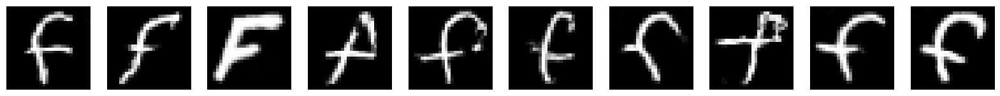

Epoch 500: D Accuracy = 0.9154
27/27 [==============================] - 1s 41ms/step - d_loss: 0.6854 - g_loss: 2.6142 - d_accuracy: 0.9051
Training DCGAN for class 5...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.6631 - g_loss: 2.5077 - d_accuracy: 0.9167
Epoch 1: Generator loss improved from inf to 3.6914. Saving weights.
Epoch 1: D Accuracy = 0.9386
27/27 [==============================] - 2s 42ms/step - d_loss: 0.6577 - g_loss: 2.5500 - d_accuracy: 0.9175
Epoch 2/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.5040 - g_loss: 3.5252 - d_accuracy: 0.9621
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.3922 - g_loss: 4.8060 - d_accuracy: 0.9911
Epoch 4/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.3666 - g_loss: 5.6520 - d_accuracy: 0.9982
Epoch 5/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8581 - g_loss: 3.3633 - d_accuracy: 0.9027
Epoch 5: Generator loss impr

27/27 [==============================] - 1s 34ms/step - d_loss: 1.0889 - g_loss: 1.1794 - d_accuracy: 0.7705
Epoch 31/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1305 - g_loss: 1.1652 - d_accuracy: 0.7398
Epoch 31: Generator loss improved from 1.1247 to 0.8964. Saving weights.
Epoch 31: D Accuracy = 0.5789
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1417 - g_loss: 1.1556 - d_accuracy: 0.7340
Epoch 32/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1596 - g_loss: 1.1835 - d_accuracy: 0.7129
Epoch 32: Generator loss improved from 0.8964 to 0.8273. Saving weights.
Epoch 32: D Accuracy = 0.6228
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1642 - g_loss: 1.1707 - d_accuracy: 0.7097
Epoch 33/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1467 - g_loss: 1.1706 - d_accuracy: 0.7189
Epoch 34/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1245 - g_loss: 1.1967 - d_accura

27/27 [==============================] - 1s 35ms/step - d_loss: 1.0850 - g_loss: 1.3603 - d_accuracy: 0.7466
Epoch 62/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0905 - g_loss: 1.3531 - d_accuracy: 0.7402
Epoch 63/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0669 - g_loss: 1.3810 - d_accuracy: 0.7465
Epoch 64/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0833 - g_loss: 1.3432 - d_accuracy: 0.7392
Epoch 65/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0837 - g_loss: 1.3969 - d_accuracy: 0.7356
Epoch 65: Generator loss improved from 0.8066 to 0.6840. Saving weights.
Epoch 65: D Accuracy = 0.6140
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0914 - g_loss: 1.3715 - d_accuracy: 0.7312
Epoch 66/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0896 - g_loss: 1.3904 - d_accuracy: 0.7377
Epoch 67/500
27/27 [==============================] - 1s 35ms/step - d_los

Epoch 93/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1129 - g_loss: 1.4513 - d_accuracy: 0.7233
Epoch 94/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0761 - g_loss: 1.3547 - d_accuracy: 0.7485
Epoch 95/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0718 - g_loss: 1.4019 - d_accuracy: 0.7408
Epoch 96/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0914 - g_loss: 1.4083 - d_accuracy: 0.7373
Epoch 97/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0725 - g_loss: 1.3196 - d_accuracy: 0.7487
Epoch 98/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1055 - g_loss: 1.4232 - d_accuracy: 0.7359
Epoch 99/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0717 - g_loss: 1.3669 - d_accuracy: 0.7532
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0955 - g_loss: 1.4060 - d_accuracy: 0.7366
Class 5 — Epoch 100 preview:

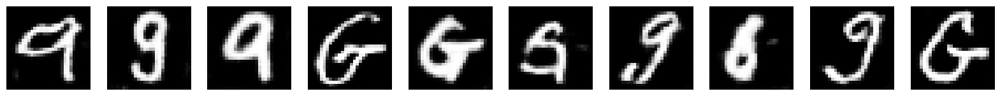

Epoch 100: D Accuracy = 0.8246
27/27 [==============================] - 1s 40ms/step - d_loss: 1.0882 - g_loss: 1.4232 - d_accuracy: 0.7397
Epoch 101/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0949 - g_loss: 1.3769 - d_accuracy: 0.7273
Epoch 102/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0807 - g_loss: 1.3484 - d_accuracy: 0.7466
Epoch 102: Generator loss improved from 0.6316 to 0.6179. Saving weights.
Epoch 102: D Accuracy = 0.5789
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0942 - g_loss: 1.3223 - d_accuracy: 0.7406
Epoch 103/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0892 - g_loss: 1.3903 - d_accuracy: 0.7361
Epoch 104/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1120 - g_loss: 1.4057 - d_accuracy: 0.7286
Epoch 105/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0854 - g_loss: 1.3757 - d_accuracy: 0.7384
Epoch 106/500
27/27 [===============

27/27 [==============================] - 1s 35ms/step - d_loss: 1.1036 - g_loss: 1.3577 - d_accuracy: 0.7375
Epoch 133/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0515 - g_loss: 1.4167 - d_accuracy: 0.7616
Epoch 134/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0446 - g_loss: 1.4326 - d_accuracy: 0.7560
Epoch 135/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0446 - g_loss: 1.3811 - d_accuracy: 0.7665
Epoch 136/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0466 - g_loss: 1.4622 - d_accuracy: 0.7593
Epoch 137/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0906 - g_loss: 1.4537 - d_accuracy: 0.7393
Epoch 138/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0868 - g_loss: 1.4128 - d_accuracy: 0.7359
Epoch 139/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0773 - g_loss: 1.4163 - d_accuracy: 0.7533
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0399 - g_loss: 1.4540 - d_accuracy: 0.7634
Epoch 165/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0422 - g_loss: 1.4431 - d_accuracy: 0.7654
Epoch 166/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0502 - g_loss: 1.4698 - d_accuracy: 0.7573
Epoch 167/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0601 - g_loss: 1.5181 - d_accuracy: 0.7482
Epoch 168/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0392 - g_loss: 1.4398 - d_accuracy: 0.7626
Epoch 169/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0289 - g_loss: 1.4917 - d_accuracy: 0.7675
Epoch 170/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0343 - g_loss: 1.4576 - d_accuracy: 0.7607
Epoch 171/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0631 - g_loss: 1.4770 - d_accuracy: 0.7514
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0033 - g_loss: 1.5340 - d_accuracy: 0.7787
Epoch 197/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0066 - g_loss: 1.6131 - d_accuracy: 0.7705
Epoch 198/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0699 - g_loss: 1.5620 - d_accuracy: 0.7483
Epoch 199/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9934 - g_loss: 1.5788 - d_accuracy: 0.7820
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0295 - g_loss: 1.5549 - d_accuracy: 0.7617
Class 5 — Epoch 200 preview:


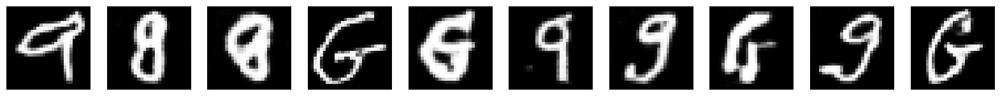

Epoch 200: D Accuracy = 0.8860
27/27 [==============================] - 1s 40ms/step - d_loss: 1.0220 - g_loss: 1.5548 - d_accuracy: 0.7661
Epoch 201/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0348 - g_loss: 1.5462 - d_accuracy: 0.7595
Epoch 202/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9838 - g_loss: 1.5658 - d_accuracy: 0.7920
Epoch 203/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0311 - g_loss: 1.5026 - d_accuracy: 0.7685
Epoch 204/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0331 - g_loss: 1.5847 - d_accuracy: 0.7592
Epoch 205/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0130 - g_loss: 1.5731 - d_accuracy: 0.7664
Epoch 206/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0758 - g_loss: 1.5430 - d_accuracy: 0.7457
Epoch 207/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0150 - g_loss: 1.5795 - d_accuracy: 0.7699

27/27 [==============================] - 1s 34ms/step - d_loss: 0.9943 - g_loss: 1.5589 - d_accuracy: 0.7761
Epoch 233/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9814 - g_loss: 1.6593 - d_accuracy: 0.7892
Epoch 234/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0572 - g_loss: 1.6124 - d_accuracy: 0.7566
Epoch 235/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9720 - g_loss: 1.6496 - d_accuracy: 0.7900
Epoch 236/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0004 - g_loss: 1.6760 - d_accuracy: 0.7666
Epoch 237/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0176 - g_loss: 1.5725 - d_accuracy: 0.7730
Epoch 238/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9920 - g_loss: 1.6788 - d_accuracy: 0.7804
Epoch 239/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9899 - g_loss: 1.6301 - d_accuracy: 0.7793
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9891 - g_loss: 1.6535 - d_accuracy: 0.7799
Epoch 265/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0205 - g_loss: 1.6718 - d_accuracy: 0.7639
Epoch 266/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9654 - g_loss: 1.7876 - d_accuracy: 0.7835
Epoch 267/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9989 - g_loss: 1.6760 - d_accuracy: 0.7795
Epoch 268/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9551 - g_loss: 1.6813 - d_accuracy: 0.8026
Epoch 269/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9890 - g_loss: 1.7169 - d_accuracy: 0.7832
Epoch 270/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9544 - g_loss: 1.7224 - d_accuracy: 0.7975
Epoch 271/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9716 - g_loss: 1.7121 - d_accuracy: 0.7867
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9712 - g_loss: 1.8150 - d_accuracy: 0.7822
Epoch 297/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9551 - g_loss: 1.7580 - d_accuracy: 0.7948
Epoch 298/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9379 - g_loss: 1.7626 - d_accuracy: 0.8014
Epoch 299/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9337 - g_loss: 1.7647 - d_accuracy: 0.8078
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9500 - g_loss: 1.7539 - d_accuracy: 0.7981
Class 5 — Epoch 300 preview:


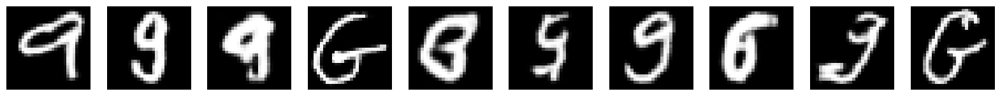

Epoch 300: D Accuracy = 0.7632
27/27 [==============================] - 1s 41ms/step - d_loss: 0.9528 - g_loss: 1.7453 - d_accuracy: 0.7968
Epoch 301/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9827 - g_loss: 1.7919 - d_accuracy: 0.7841
Epoch 302/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9565 - g_loss: 1.7304 - d_accuracy: 0.7961
Epoch 303/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9768 - g_loss: 1.7885 - d_accuracy: 0.7873
Epoch 304/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9416 - g_loss: 1.7869 - d_accuracy: 0.8013
Epoch 305/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9367 - g_loss: 1.7787 - d_accuracy: 0.8039
Epoch 306/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9524 - g_loss: 1.8282 - d_accuracy: 0.7971
Epoch 307/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9257 - g_loss: 1.7764 - d_accuracy: 0.8102

27/27 [==============================] - 1s 34ms/step - d_loss: 0.9295 - g_loss: 1.8931 - d_accuracy: 0.8014
Epoch 333/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9298 - g_loss: 1.8755 - d_accuracy: 0.8055
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9477 - g_loss: 1.8928 - d_accuracy: 0.7922
Epoch 335/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8921 - g_loss: 1.8680 - d_accuracy: 0.8251
Epoch 336/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9079 - g_loss: 1.8804 - d_accuracy: 0.8195
Epoch 337/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9040 - g_loss: 1.8651 - d_accuracy: 0.8178
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9018 - g_loss: 1.8742 - d_accuracy: 0.8197
Epoch 339/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9464 - g_loss: 1.8554 - d_accuracy: 0.7957
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9364 - g_loss: 2.0341 - d_accuracy: 0.8001
Epoch 365/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9076 - g_loss: 1.9403 - d_accuracy: 0.8203
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8547 - g_loss: 1.9953 - d_accuracy: 0.8397
Epoch 367/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8578 - g_loss: 2.0134 - d_accuracy: 0.8350
Epoch 368/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8931 - g_loss: 2.0099 - d_accuracy: 0.8160
Epoch 369/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8793 - g_loss: 1.9913 - d_accuracy: 0.8256
Epoch 370/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9006 - g_loss: 1.9874 - d_accuracy: 0.8235
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8616 - g_loss: 2.0087 - d_accuracy: 0.8346
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8290 - g_loss: 2.0788 - d_accuracy: 0.8486
Epoch 397/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8572 - g_loss: 2.1160 - d_accuracy: 0.8332
Epoch 398/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8512 - g_loss: 2.0038 - d_accuracy: 0.8369
Epoch 399/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8479 - g_loss: 2.0871 - d_accuracy: 0.8367
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8567 - g_loss: 2.1217 - d_accuracy: 0.8372
Class 5 — Epoch 400 preview:


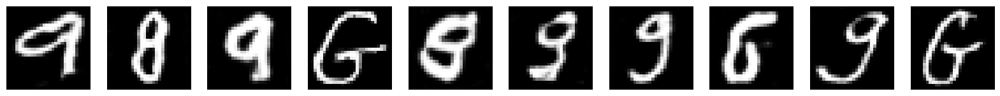

Epoch 400: D Accuracy = 0.8947
27/27 [==============================] - 1s 44ms/step - d_loss: 0.8544 - g_loss: 2.1182 - d_accuracy: 0.8393
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8335 - g_loss: 2.0579 - d_accuracy: 0.8413
Epoch 402/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8572 - g_loss: 2.1306 - d_accuracy: 0.8337
Epoch 403/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8548 - g_loss: 2.0528 - d_accuracy: 0.8361
Epoch 404/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8463 - g_loss: 2.0975 - d_accuracy: 0.8429
Epoch 405/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8343 - g_loss: 2.1414 - d_accuracy: 0.8479
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8499 - g_loss: 2.1446 - d_accuracy: 0.8344
Epoch 407/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8682 - g_loss: 2.1624 - d_accuracy: 0.8267

27/27 [==============================] - 1s 34ms/step - d_loss: 0.8822 - g_loss: 2.2558 - d_accuracy: 0.8242
Epoch 433/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8563 - g_loss: 2.1369 - d_accuracy: 0.8341
Epoch 434/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8383 - g_loss: 2.2457 - d_accuracy: 0.8361
Epoch 435/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7972 - g_loss: 2.1680 - d_accuracy: 0.8605
Epoch 436/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8208 - g_loss: 2.1557 - d_accuracy: 0.8502
Epoch 437/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8835 - g_loss: 2.1312 - d_accuracy: 0.8294
Epoch 438/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7861 - g_loss: 2.2175 - d_accuracy: 0.8655
Epoch 439/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8873 - g_loss: 2.2639 - d_accuracy: 0.8240
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7896 - g_loss: 2.2457 - d_accuracy: 0.8620
Epoch 465/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8206 - g_loss: 2.3288 - d_accuracy: 0.8476
Epoch 466/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8483 - g_loss: 2.3280 - d_accuracy: 0.8329
Epoch 467/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8030 - g_loss: 2.3224 - d_accuracy: 0.8590
Epoch 468/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7669 - g_loss: 2.3047 - d_accuracy: 0.8717
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7951 - g_loss: 2.2577 - d_accuracy: 0.8616
Epoch 470/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8205 - g_loss: 2.2463 - d_accuracy: 0.8512
Epoch 471/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7553 - g_loss: 2.2923 - d_accuracy: 0.8738
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7587 - g_loss: 2.3469 - d_accuracy: 0.8713
Epoch 497/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8462 - g_loss: 2.4200 - d_accuracy: 0.8383
Epoch 498/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8091 - g_loss: 2.3676 - d_accuracy: 0.8519
Epoch 499/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7622 - g_loss: 2.4179 - d_accuracy: 0.8703
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8165 - g_loss: 2.4298 - d_accuracy: 0.8448
Class 5 — Epoch 500 preview:


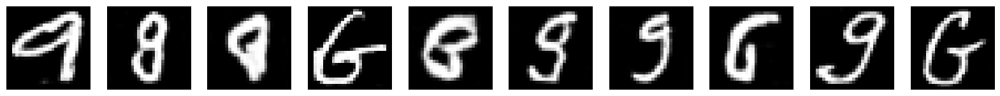

Epoch 500: D Accuracy = 0.8246
27/27 [==============================] - 1s 41ms/step - d_loss: 0.8179 - g_loss: 2.4225 - d_accuracy: 0.8441
Training DCGAN for class 6...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.6692 - g_loss: 2.7518 - d_accuracy: 0.9166
Epoch 1: Generator loss improved from inf to 3.5414. Saving weights.
Epoch 1: D Accuracy = 0.9200
27/27 [==============================] - 2s 43ms/step - d_loss: 0.6679 - g_loss: 2.7800 - d_accuracy: 0.9167
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7963 - g_loss: 2.5443 - d_accuracy: 0.8812
Epoch 2: Generator loss improved from 3.5414 to 2.9223. Saving weights.
Epoch 2: D Accuracy = 0.9500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7889 - g_loss: 2.5578 - d_accuracy: 0.8837
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.4616 - g_loss: 3.7982 - d_accuracy: 0.9760
Epoch 4/500
27/27 [==============================] - 1s 35ms

27/27 [==============================] - 1s 37ms/step - d_loss: 1.2394 - g_loss: 1.1730 - d_accuracy: 0.6577
Epoch 30/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2366 - g_loss: 1.1472 - d_accuracy: 0.6511
Epoch 31/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2205 - g_loss: 1.2134 - d_accuracy: 0.6601
Epoch 32/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2493 - g_loss: 1.1749 - d_accuracy: 0.6507
Epoch 33/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2341 - g_loss: 1.1219 - d_accuracy: 0.6527
Epoch 34/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2357 - g_loss: 1.1138 - d_accuracy: 0.6609
Epoch 35/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2414 - g_loss: 1.1518 - d_accuracy: 0.6533
Epoch 36/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2392 - g_loss: 1.1084 - d_accuracy: 0.6577
Epoch 37/500
27/27 [=================

27/27 [==============================] - 1s 34ms/step - d_loss: 1.2523 - g_loss: 1.0894 - d_accuracy: 0.6424
Epoch 61/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2545 - g_loss: 1.0917 - d_accuracy: 0.6428
Epoch 62/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2430 - g_loss: 1.0659 - d_accuracy: 0.6440
Epoch 63/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2365 - g_loss: 1.1066 - d_accuracy: 0.6509
Epoch 64/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2729 - g_loss: 1.0833 - d_accuracy: 0.6328
Epoch 65/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2399 - g_loss: 1.1001 - d_accuracy: 0.6552
Epoch 66/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2461 - g_loss: 1.1091 - d_accuracy: 0.6469
Epoch 67/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2691 - g_loss: 1.0774 - d_accuracy: 0.6416
Epoch 68/500
27/27 [=================

27/27 [==============================] - 1s 36ms/step - d_loss: 1.2310 - g_loss: 1.1113 - d_accuracy: 0.6602
Epoch 93/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2229 - g_loss: 1.1047 - d_accuracy: 0.6620
Epoch 94/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2540 - g_loss: 1.1390 - d_accuracy: 0.6499
Epoch 95/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2059 - g_loss: 1.1170 - d_accuracy: 0.6753
Epoch 96/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1923 - g_loss: 1.1550 - d_accuracy: 0.6812
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2557 - g_loss: 1.1488 - d_accuracy: 0.6453
Epoch 98/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2104 - g_loss: 1.1437 - d_accuracy: 0.6685
Epoch 99/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2092 - g_loss: 1.1923 - d_accuracy: 0.6698
Epoch 100/500
27/27 [================

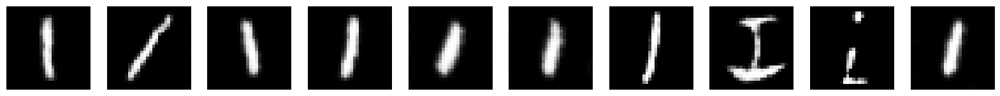

Epoch 100: D Accuracy = 0.6100
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2344 - g_loss: 1.1347 - d_accuracy: 0.6606
Epoch 101/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2458 - g_loss: 1.1407 - d_accuracy: 0.6543
Epoch 102/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2144 - g_loss: 1.1645 - d_accuracy: 0.6716
Epoch 103/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2287 - g_loss: 1.1369 - d_accuracy: 0.6613
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2375 - g_loss: 1.1326 - d_accuracy: 0.6628
Epoch 105/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1994 - g_loss: 1.1528 - d_accuracy: 0.6836
Epoch 106/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1898 - g_loss: 1.1828 - d_accuracy: 0.6925
Epoch 107/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1699 - g_loss: 1.1617 - d_accuracy: 0.7009

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2193 - g_loss: 1.1808 - d_accuracy: 0.6669
Epoch 133/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1750 - g_loss: 1.1548 - d_accuracy: 0.6967
Epoch 134/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1869 - g_loss: 1.1643 - d_accuracy: 0.6873
Epoch 135/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1710 - g_loss: 1.2016 - d_accuracy: 0.6991
Epoch 136/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1904 - g_loss: 1.1778 - d_accuracy: 0.6846
Epoch 137/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1915 - g_loss: 1.1735 - d_accuracy: 0.6817
Epoch 138/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1862 - g_loss: 1.1568 - d_accuracy: 0.6925
Epoch 139/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2004 - g_loss: 1.2023 - d_accuracy: 0.6792
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1911 - g_loss: 1.2243 - d_accuracy: 0.6879
Epoch 165/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1158 - g_loss: 1.2810 - d_accuracy: 0.7287
Epoch 166/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1406 - g_loss: 1.2650 - d_accuracy: 0.7104
Epoch 167/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1051 - g_loss: 1.2925 - d_accuracy: 0.7358
Epoch 168/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1596 - g_loss: 1.2790 - d_accuracy: 0.6947
Epoch 169/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1434 - g_loss: 1.2629 - d_accuracy: 0.7082
Epoch 170/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1521 - g_loss: 1.2964 - d_accuracy: 0.7109
Epoch 171/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1129 - g_loss: 1.2550 - d_accuracy: 0.7267
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0949 - g_loss: 1.3607 - d_accuracy: 0.7368
Epoch 197/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1012 - g_loss: 1.3061 - d_accuracy: 0.7441
Epoch 198/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1117 - g_loss: 1.3816 - d_accuracy: 0.7247
Epoch 199/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0938 - g_loss: 1.3499 - d_accuracy: 0.7345
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0986 - g_loss: 1.3627 - d_accuracy: 0.7416
Class 6 — Epoch 200 preview:


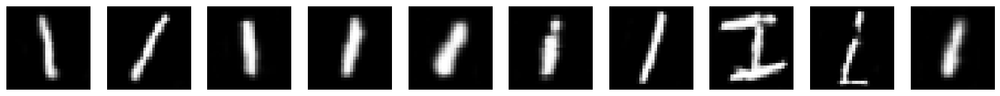

Epoch 200: D Accuracy = 0.6550
27/27 [==============================] - 1s 41ms/step - d_loss: 1.1019 - g_loss: 1.3788 - d_accuracy: 0.7385
Epoch 201/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1307 - g_loss: 1.4096 - d_accuracy: 0.7094
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0735 - g_loss: 1.3499 - d_accuracy: 0.7526
Epoch 203/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0858 - g_loss: 1.3580 - d_accuracy: 0.7379
Epoch 204/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0652 - g_loss: 1.3930 - d_accuracy: 0.7507
Epoch 205/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0981 - g_loss: 1.4535 - d_accuracy: 0.7315
Epoch 206/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1036 - g_loss: 1.3675 - d_accuracy: 0.7353
Epoch 207/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0987 - g_loss: 1.4124 - d_accuracy: 0.7211

27/27 [==============================] - 1s 37ms/step - d_loss: 1.0598 - g_loss: 1.4849 - d_accuracy: 0.7517
Epoch 233/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0423 - g_loss: 1.4843 - d_accuracy: 0.7524
Epoch 234/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0405 - g_loss: 1.5001 - d_accuracy: 0.7666
Epoch 235/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0573 - g_loss: 1.5271 - d_accuracy: 0.7491
Epoch 236/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0167 - g_loss: 1.4929 - d_accuracy: 0.7758
Epoch 237/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9976 - g_loss: 1.5420 - d_accuracy: 0.7826
Epoch 238/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0003 - g_loss: 1.5211 - d_accuracy: 0.7843
Epoch 239/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0565 - g_loss: 1.5714 - d_accuracy: 0.7511
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9845 - g_loss: 1.6086 - d_accuracy: 0.7837
Epoch 265/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9532 - g_loss: 1.6515 - d_accuracy: 0.8024
Epoch 266/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9269 - g_loss: 1.6334 - d_accuracy: 0.8201
Epoch 267/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0551 - g_loss: 1.6797 - d_accuracy: 0.7549
Epoch 268/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9929 - g_loss: 1.6645 - d_accuracy: 0.7877
Epoch 269/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9995 - g_loss: 1.5979 - d_accuracy: 0.7818
Epoch 270/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0219 - g_loss: 1.6442 - d_accuracy: 0.7748
Epoch 271/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0282 - g_loss: 1.7091 - d_accuracy: 0.7589
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9702 - g_loss: 1.7156 - d_accuracy: 0.7931
Epoch 297/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9228 - g_loss: 1.7614 - d_accuracy: 0.8116
Epoch 298/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9484 - g_loss: 1.7734 - d_accuracy: 0.8044
Epoch 299/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9838 - g_loss: 1.7185 - d_accuracy: 0.7830
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9351 - g_loss: 1.7380 - d_accuracy: 0.8047
Class 6 — Epoch 300 preview:


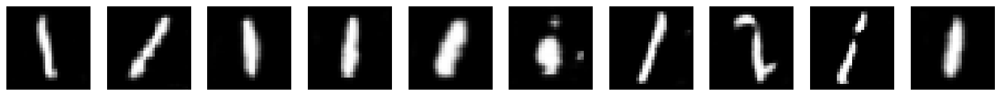

Epoch 300: D Accuracy = 0.8800
27/27 [==============================] - 1s 41ms/step - d_loss: 0.9322 - g_loss: 1.7413 - d_accuracy: 0.8074
Epoch 301/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9299 - g_loss: 1.7233 - d_accuracy: 0.8082
Epoch 302/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9942 - g_loss: 1.7458 - d_accuracy: 0.7739
Epoch 303/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9220 - g_loss: 1.7393 - d_accuracy: 0.8174
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9438 - g_loss: 1.7158 - d_accuracy: 0.8037
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9443 - g_loss: 1.7680 - d_accuracy: 0.8036
Epoch 306/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9028 - g_loss: 1.7759 - d_accuracy: 0.8234
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9528 - g_loss: 1.7588 - d_accuracy: 0.7973

27/27 [==============================] - 1s 36ms/step - d_loss: 0.8775 - g_loss: 1.8611 - d_accuracy: 0.8338
Epoch 333/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8963 - g_loss: 1.8716 - d_accuracy: 0.8259
Epoch 334/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0221 - g_loss: 1.9283 - d_accuracy: 0.7609
Epoch 335/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9238 - g_loss: 1.8581 - d_accuracy: 0.8114
Epoch 336/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9201 - g_loss: 1.8833 - d_accuracy: 0.8180
Epoch 337/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8898 - g_loss: 1.8954 - d_accuracy: 0.8197
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9027 - g_loss: 1.8720 - d_accuracy: 0.8211
Epoch 339/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8636 - g_loss: 1.8599 - d_accuracy: 0.8485
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8936 - g_loss: 2.0296 - d_accuracy: 0.8169
Epoch 365/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8879 - g_loss: 1.9638 - d_accuracy: 0.8300
Epoch 366/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9199 - g_loss: 1.9134 - d_accuracy: 0.8107
Epoch 367/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8782 - g_loss: 2.0338 - d_accuracy: 0.8214
Epoch 368/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8506 - g_loss: 2.0370 - d_accuracy: 0.8399
Epoch 369/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9598 - g_loss: 2.0021 - d_accuracy: 0.7886
Epoch 370/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8694 - g_loss: 1.9744 - d_accuracy: 0.8257
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8699 - g_loss: 1.9184 - d_accuracy: 0.8334
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 38ms/step - d_loss: 0.8221 - g_loss: 2.0195 - d_accuracy: 0.8564
Epoch 397/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.8002 - g_loss: 2.0694 - d_accuracy: 0.8661
Epoch 398/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8895 - g_loss: 2.1200 - d_accuracy: 0.8258
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8998 - g_loss: 2.1392 - d_accuracy: 0.8063
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8322 - g_loss: 2.0581 - d_accuracy: 0.8499
Class 6 — Epoch 400 preview:


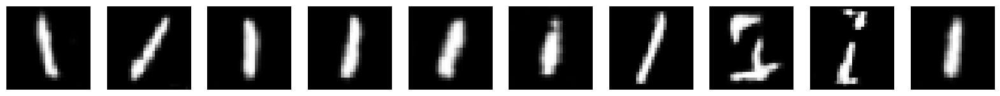

Epoch 400: D Accuracy = 0.8850
27/27 [==============================] - 1s 40ms/step - d_loss: 0.8313 - g_loss: 2.0494 - d_accuracy: 0.8512
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9103 - g_loss: 2.1149 - d_accuracy: 0.8107
Epoch 402/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8320 - g_loss: 2.0715 - d_accuracy: 0.8498
Epoch 403/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8332 - g_loss: 2.0723 - d_accuracy: 0.8446
Epoch 404/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8410 - g_loss: 2.1274 - d_accuracy: 0.8466
Epoch 405/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8757 - g_loss: 2.1006 - d_accuracy: 0.8268
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8426 - g_loss: 2.0564 - d_accuracy: 0.8447
Epoch 407/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8880 - g_loss: 2.1060 - d_accuracy: 0.8264

27/27 [==============================] - 1s 34ms/step - d_loss: 0.9013 - g_loss: 2.1612 - d_accuracy: 0.8190
Epoch 433/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7899 - g_loss: 2.1787 - d_accuracy: 0.8671
Epoch 434/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8246 - g_loss: 2.1571 - d_accuracy: 0.8549
Epoch 435/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8172 - g_loss: 2.1760 - d_accuracy: 0.8530
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9147 - g_loss: 2.1850 - d_accuracy: 0.8286
Epoch 437/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8086 - g_loss: 2.2188 - d_accuracy: 0.8508
Epoch 438/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8176 - g_loss: 2.1430 - d_accuracy: 0.8512
Epoch 439/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7947 - g_loss: 2.2185 - d_accuracy: 0.8601
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.7692 - g_loss: 2.2962 - d_accuracy: 0.8706
Epoch 465/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.8015 - g_loss: 2.3617 - d_accuracy: 0.8589
Epoch 466/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7995 - g_loss: 2.2526 - d_accuracy: 0.8586
Epoch 467/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8118 - g_loss: 2.3247 - d_accuracy: 0.8531
Epoch 468/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9180 - g_loss: 2.2687 - d_accuracy: 0.8169
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7847 - g_loss: 2.1683 - d_accuracy: 0.8717
Epoch 470/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8017 - g_loss: 2.2264 - d_accuracy: 0.8604
Epoch 471/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7561 - g_loss: 2.2961 - d_accuracy: 0.8795
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7840 - g_loss: 2.3299 - d_accuracy: 0.8611
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7965 - g_loss: 2.3042 - d_accuracy: 0.8613
Epoch 498/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7614 - g_loss: 2.3697 - d_accuracy: 0.8744
Epoch 499/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7721 - g_loss: 2.3992 - d_accuracy: 0.8675
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8021 - g_loss: 2.3752 - d_accuracy: 0.8573
Class 6 — Epoch 500 preview:


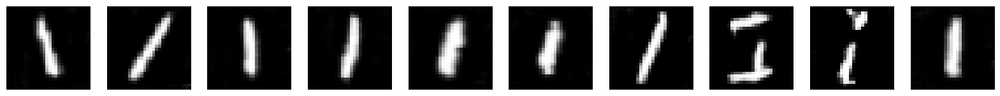

Epoch 500: D Accuracy = 0.8200
27/27 [==============================] - 1s 41ms/step - d_loss: 0.7990 - g_loss: 2.4175 - d_accuracy: 0.8560
Training DCGAN for class 7...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.6879 - g_loss: 2.3187 - d_accuracy: 0.9117
Epoch 1: Generator loss improved from inf to 2.8116. Saving weights.
Epoch 1: D Accuracy = 0.9797
27/27 [==============================] - 2s 42ms/step - d_loss: 0.6821 - g_loss: 2.3364 - d_accuracy: 0.9141
Epoch 2/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.4626 - g_loss: 3.6836 - d_accuracy: 0.9753
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7944 - g_loss: 2.6225 - d_accuracy: 0.8752
Epoch 4/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.4529 - g_loss: 3.8027 - d_accuracy: 0.9792
Epoch 5/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.5444 - g_loss: 4.2098 - d_accuracy: 0.9536
Epoch 6/500
27/27 [====

27/27 [==============================] - 1s 35ms/step - d_loss: 0.3308 - g_loss: 8.0142 - d_accuracy: 1.0000
Epoch 32/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.3305 - g_loss: 8.1132 - d_accuracy: 1.0000
Epoch 33/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.3304 - g_loss: 8.0481 - d_accuracy: 1.0000
Epoch 34/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.3300 - g_loss: 8.1133 - d_accuracy: 1.0000
Epoch 35/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1745 - g_loss: 5.0696 - d_accuracy: 0.8424
Epoch 35: Generator loss improved from 2.8116 to 1.1353. Saving weights.
Epoch 35: D Accuracy = 0.8649
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1689 - g_loss: 4.9291 - d_accuracy: 0.8432
Epoch 36/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8455 - g_loss: 1.5446 - d_accuracy: 0.8949
Epoch 36: Generator loss improved from 1.1353 to 0.4587. Saving weights.
Epoch 

Epoch 63/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1110 - g_loss: 1.2843 - d_accuracy: 0.7354
Epoch 64/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1205 - g_loss: 1.3178 - d_accuracy: 0.7204
Epoch 65/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1072 - g_loss: 1.3006 - d_accuracy: 0.7301
Epoch 66/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0965 - g_loss: 1.2730 - d_accuracy: 0.7446
Epoch 67/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1350 - g_loss: 1.2814 - d_accuracy: 0.7196
Epoch 68/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1125 - g_loss: 1.2922 - d_accuracy: 0.7257
Epoch 69/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1045 - g_loss: 1.3398 - d_accuracy: 0.7246
Epoch 70/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0824 - g_loss: 1.3260 - d_accuracy: 0.7427
Epoch 71/500
27/27 [====

27/27 [==============================] - 1s 36ms/step - d_loss: 1.1804 - g_loss: 1.2205 - d_accuracy: 0.6955
Epoch 96/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1409 - g_loss: 1.2657 - d_accuracy: 0.7153
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1602 - g_loss: 1.2489 - d_accuracy: 0.6948
Epoch 98/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1433 - g_loss: 1.2223 - d_accuracy: 0.7147
Epoch 99/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1749 - g_loss: 1.2510 - d_accuracy: 0.6921
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1547 - g_loss: 1.2105 - d_accuracy: 0.7048
Class 7 — Epoch 100 preview:


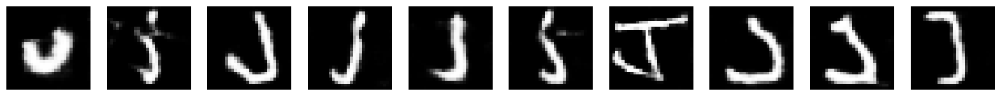

Epoch 100: D Accuracy = 0.7162
27/27 [==============================] - 1s 41ms/step - d_loss: 1.1569 - g_loss: 1.2033 - d_accuracy: 0.7052
Epoch 101/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1974 - g_loss: 1.2400 - d_accuracy: 0.6853
Epoch 102/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1342 - g_loss: 1.2240 - d_accuracy: 0.7149
Epoch 103/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1803 - g_loss: 1.2745 - d_accuracy: 0.6881
Epoch 104/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1373 - g_loss: 1.2173 - d_accuracy: 0.7137
Epoch 105/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1602 - g_loss: 1.2698 - d_accuracy: 0.6949
Epoch 106/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1560 - g_loss: 1.2292 - d_accuracy: 0.7086
Epoch 107/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1577 - g_loss: 1.2208 - d_accuracy: 0.7004

27/27 [==============================] - 1s 35ms/step - d_loss: 1.1409 - g_loss: 1.2323 - d_accuracy: 0.7154
Epoch 133/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1639 - g_loss: 1.2415 - d_accuracy: 0.7044
Epoch 134/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1507 - g_loss: 1.2647 - d_accuracy: 0.7055
Epoch 135/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1384 - g_loss: 1.2505 - d_accuracy: 0.7178
Epoch 136/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1237 - g_loss: 1.2602 - d_accuracy: 0.7222
Epoch 137/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1734 - g_loss: 1.3090 - d_accuracy: 0.6920
Epoch 138/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1178 - g_loss: 1.2574 - d_accuracy: 0.7243
Epoch 139/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0913 - g_loss: 1.2694 - d_accuracy: 0.7390
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1346 - g_loss: 1.3328 - d_accuracy: 0.7143
Epoch 165/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1586 - g_loss: 1.2553 - d_accuracy: 0.7147
Epoch 166/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0971 - g_loss: 1.3326 - d_accuracy: 0.7349
Epoch 167/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1105 - g_loss: 1.3010 - d_accuracy: 0.7247
Epoch 168/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1149 - g_loss: 1.2966 - d_accuracy: 0.7246
Epoch 169/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1221 - g_loss: 1.3671 - d_accuracy: 0.7157
Epoch 170/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1145 - g_loss: 1.3277 - d_accuracy: 0.7242
Epoch 171/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0590 - g_loss: 1.3090 - d_accuracy: 0.7594
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0918 - g_loss: 1.3773 - d_accuracy: 0.7322
Epoch 197/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1005 - g_loss: 1.3800 - d_accuracy: 0.7295
Epoch 198/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0770 - g_loss: 1.3701 - d_accuracy: 0.7439
Epoch 199/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0873 - g_loss: 1.3691 - d_accuracy: 0.7404
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0901 - g_loss: 1.3698 - d_accuracy: 0.7346
Class 7 — Epoch 200 preview:


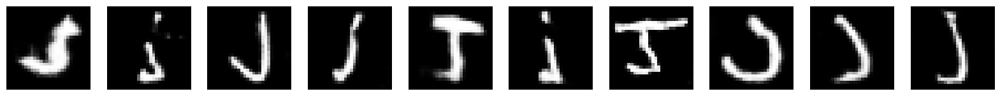

Epoch 200: D Accuracy = 0.6419
27/27 [==============================] - 1s 41ms/step - d_loss: 1.0940 - g_loss: 1.3825 - d_accuracy: 0.7313
Epoch 201/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0735 - g_loss: 1.4246 - d_accuracy: 0.7390
Epoch 202/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1025 - g_loss: 1.3689 - d_accuracy: 0.7301
Epoch 203/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0776 - g_loss: 1.3510 - d_accuracy: 0.7417
Epoch 204/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1049 - g_loss: 1.4448 - d_accuracy: 0.7253
Epoch 205/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0501 - g_loss: 1.4108 - d_accuracy: 0.7572
Epoch 206/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1171 - g_loss: 1.3965 - d_accuracy: 0.7224
Epoch 207/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0658 - g_loss: 1.4224 - d_accuracy: 0.7432

27/27 [==============================] - 1s 35ms/step - d_loss: 1.0549 - g_loss: 1.4828 - d_accuracy: 0.7523
Epoch 233/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0348 - g_loss: 1.4625 - d_accuracy: 0.7605
Epoch 234/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0520 - g_loss: 1.5093 - d_accuracy: 0.7507
Epoch 235/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0517 - g_loss: 1.4842 - d_accuracy: 0.7591
Epoch 236/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0134 - g_loss: 1.4836 - d_accuracy: 0.7750
Epoch 237/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0274 - g_loss: 1.4729 - d_accuracy: 0.7649
Epoch 238/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0630 - g_loss: 1.4873 - d_accuracy: 0.7464
Epoch 239/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0437 - g_loss: 1.4818 - d_accuracy: 0.7553
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0372 - g_loss: 1.5776 - d_accuracy: 0.7575
Epoch 265/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0520 - g_loss: 1.5465 - d_accuracy: 0.7553
Epoch 266/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0066 - g_loss: 1.5162 - d_accuracy: 0.7741
Epoch 267/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0565 - g_loss: 1.5045 - d_accuracy: 0.7504
Epoch 268/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0013 - g_loss: 1.5261 - d_accuracy: 0.7794
Epoch 269/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0137 - g_loss: 1.5961 - d_accuracy: 0.7720
Epoch 270/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0280 - g_loss: 1.5573 - d_accuracy: 0.7617
Epoch 271/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0220 - g_loss: 1.5384 - d_accuracy: 0.7700
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9834 - g_loss: 1.6208 - d_accuracy: 0.7870
Epoch 297/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0124 - g_loss: 1.6506 - d_accuracy: 0.7645
Epoch 298/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9782 - g_loss: 1.6117 - d_accuracy: 0.7881
Epoch 299/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9905 - g_loss: 1.6587 - d_accuracy: 0.7832
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9775 - g_loss: 1.6422 - d_accuracy: 0.7895
Class 7 — Epoch 300 preview:


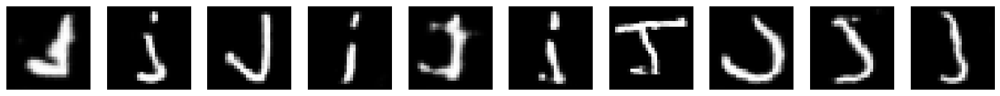

Epoch 300: D Accuracy = 0.8311
27/27 [==============================] - 1s 42ms/step - d_loss: 0.9775 - g_loss: 1.6225 - d_accuracy: 0.7909
Epoch 301/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9885 - g_loss: 1.6218 - d_accuracy: 0.7778
Epoch 302/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9910 - g_loss: 1.6510 - d_accuracy: 0.7776
Epoch 303/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0275 - g_loss: 1.6093 - d_accuracy: 0.7671
Epoch 304/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9458 - g_loss: 1.6835 - d_accuracy: 0.7952
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9749 - g_loss: 1.6517 - d_accuracy: 0.7936
Epoch 306/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9498 - g_loss: 1.7323 - d_accuracy: 0.7950
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9862 - g_loss: 1.6875 - d_accuracy: 0.7826

27/27 [==============================] - 1s 35ms/step - d_loss: 0.9989 - g_loss: 1.7622 - d_accuracy: 0.7752
Epoch 333/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9399 - g_loss: 1.7787 - d_accuracy: 0.8019
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9373 - g_loss: 1.7636 - d_accuracy: 0.8068
Epoch 335/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9150 - g_loss: 1.7521 - d_accuracy: 0.8128
Epoch 336/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0501 - g_loss: 1.7602 - d_accuracy: 0.7581
Epoch 337/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9527 - g_loss: 1.7232 - d_accuracy: 0.7983
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9140 - g_loss: 1.7300 - d_accuracy: 0.8168
Epoch 339/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9280 - g_loss: 1.7894 - d_accuracy: 0.8126
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8896 - g_loss: 1.8332 - d_accuracy: 0.8267
Epoch 365/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9365 - g_loss: 1.8475 - d_accuracy: 0.8001
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9379 - g_loss: 1.7802 - d_accuracy: 0.8012
Epoch 367/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9601 - g_loss: 1.8360 - d_accuracy: 0.7900
Epoch 368/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0945 - g_loss: 1.9072 - d_accuracy: 0.7781
Epoch 369/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9257 - g_loss: 1.7917 - d_accuracy: 0.8101
Epoch 370/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9257 - g_loss: 1.7693 - d_accuracy: 0.8154
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9061 - g_loss: 1.8032 - d_accuracy: 0.8190
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9237 - g_loss: 1.9522 - d_accuracy: 0.7959
Epoch 397/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9005 - g_loss: 1.8839 - d_accuracy: 0.8224
Epoch 398/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8580 - g_loss: 1.9426 - d_accuracy: 0.8370
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8549 - g_loss: 1.9823 - d_accuracy: 0.8349
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9133 - g_loss: 1.9405 - d_accuracy: 0.8153
Class 7 — Epoch 400 preview:


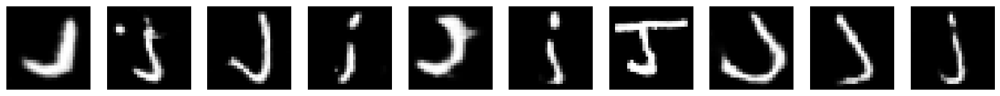

Epoch 400: D Accuracy = 0.8851
27/27 [==============================] - 1s 41ms/step - d_loss: 0.9086 - g_loss: 1.9460 - d_accuracy: 0.8178
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9480 - g_loss: 1.9131 - d_accuracy: 0.7931
Epoch 402/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8908 - g_loss: 1.9202 - d_accuracy: 0.8244
Epoch 403/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8678 - g_loss: 1.9062 - d_accuracy: 0.8347
Epoch 404/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8549 - g_loss: 1.9308 - d_accuracy: 0.8407
Epoch 405/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8885 - g_loss: 1.9568 - d_accuracy: 0.8228
Epoch 406/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9366 - g_loss: 1.9379 - d_accuracy: 0.7986
Epoch 407/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9032 - g_loss: 1.8915 - d_accuracy: 0.8191

27/27 [==============================] - 1s 35ms/step - d_loss: 0.8579 - g_loss: 2.0250 - d_accuracy: 0.8338
Epoch 433/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8742 - g_loss: 2.0251 - d_accuracy: 0.8293
Epoch 434/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8570 - g_loss: 2.0096 - d_accuracy: 0.8420
Epoch 435/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8283 - g_loss: 2.0913 - d_accuracy: 0.8462
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9166 - g_loss: 1.9896 - d_accuracy: 0.8130
Epoch 437/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8531 - g_loss: 2.0400 - d_accuracy: 0.8331
Epoch 438/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9012 - g_loss: 2.0378 - d_accuracy: 0.8133
Epoch 439/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8457 - g_loss: 2.0973 - d_accuracy: 0.8385
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8533 - g_loss: 2.1383 - d_accuracy: 0.8356
Epoch 465/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8407 - g_loss: 2.0923 - d_accuracy: 0.8432
Epoch 466/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8445 - g_loss: 2.1582 - d_accuracy: 0.8428
Epoch 467/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8537 - g_loss: 2.1075 - d_accuracy: 0.8354
Epoch 468/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8513 - g_loss: 2.1565 - d_accuracy: 0.8347
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8319 - g_loss: 2.1284 - d_accuracy: 0.8453
Epoch 470/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8342 - g_loss: 2.0964 - d_accuracy: 0.8444
Epoch 471/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8292 - g_loss: 2.1426 - d_accuracy: 0.8469
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8043 - g_loss: 2.2649 - d_accuracy: 0.8587
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8034 - g_loss: 2.2446 - d_accuracy: 0.8597
Epoch 498/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8297 - g_loss: 2.1806 - d_accuracy: 0.8471
Epoch 499/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7619 - g_loss: 2.2576 - d_accuracy: 0.8775
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8107 - g_loss: 2.2570 - d_accuracy: 0.8544
Class 7 — Epoch 500 preview:


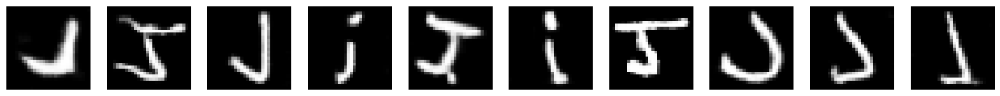

Epoch 500: D Accuracy = 0.8919
27/27 [==============================] - 1s 46ms/step - d_loss: 0.8120 - g_loss: 2.2409 - d_accuracy: 0.8557
Training DCGAN for class 8...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.6297 - g_loss: 2.6278 - d_accuracy: 0.9282
Epoch 1: Generator loss improved from inf to 4.1781. Saving weights.
Epoch 1: D Accuracy = 0.9828
27/27 [==============================] - 2s 42ms/step - d_loss: 0.6222 - g_loss: 2.6831 - d_accuracy: 0.9301
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 0.6419 - g_loss: 4.0652 - d_accuracy: 0.9402
Epoch 2: Generator loss improved from 4.1781 to 3.3979. Saving weights.
Epoch 2: D Accuracy = 0.7644
27/27 [==============================] - 1s 35ms/step - d_loss: 0.6504 - g_loss: 4.0413 - d_accuracy: 0.9339
Epoch 3/500
27/27 [==============================] - ETA: 0s - d_loss: 0.5976 - g_loss: 2.7253 - d_accuracy: 0.9391
Epoch 3: Generator loss improved from 3.3979 to 3.1250. Saving we

Epoch 30/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1390 - g_loss: 1.3491 - d_accuracy: 0.7100
Epoch 31/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1344 - g_loss: 1.3448 - d_accuracy: 0.7209
Epoch 32/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1605 - g_loss: 1.3425 - d_accuracy: 0.6938
Epoch 33/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1542 - g_loss: 1.3204 - d_accuracy: 0.6998
Epoch 34/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1574 - g_loss: 1.2896 - d_accuracy: 0.7021
Epoch 34: Generator loss improved from 0.9133 to 0.7970. Saving weights.
Epoch 34: D Accuracy = 0.6609
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1652 - g_loss: 1.2720 - d_accuracy: 0.7007
Epoch 35/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1631 - g_loss: 1.3012 - d_accuracy: 0.6927
Epoch 36/500
27/27 [==============================] - 1s 35ms

Epoch 62/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2295 - g_loss: 1.1326 - d_accuracy: 0.6561
Epoch 63/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2435 - g_loss: 1.1038 - d_accuracy: 0.6455
Epoch 64/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2295 - g_loss: 1.1034 - d_accuracy: 0.6518
Epoch 65/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2472 - g_loss: 1.1092 - d_accuracy: 0.6476
Epoch 66/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2576 - g_loss: 1.0556 - d_accuracy: 0.6420
Epoch 67/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2402 - g_loss: 1.0849 - d_accuracy: 0.6496
Epoch 68/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2605 - g_loss: 1.0969 - d_accuracy: 0.6420
Epoch 69/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2513 - g_loss: 1.0975 - d_accuracy: 0.6452
Epoch 70/500
27/27 [====

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2363 - g_loss: 1.0804 - d_accuracy: 0.6532
Epoch 95/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2448 - g_loss: 1.0688 - d_accuracy: 0.6474
Epoch 96/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2608 - g_loss: 1.1039 - d_accuracy: 0.6371
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2748 - g_loss: 1.0797 - d_accuracy: 0.6283
Epoch 98/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2662 - g_loss: 1.0809 - d_accuracy: 0.6348
Epoch 99/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2464 - g_loss: 1.0738 - d_accuracy: 0.6403
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2338 - g_loss: 1.0793 - d_accuracy: 0.6605
Class 8 — Epoch 100 preview:


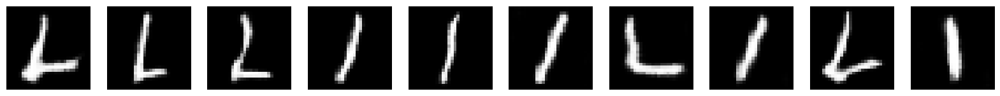

Epoch 100: D Accuracy = 0.7011
27/27 [==============================] - 1s 42ms/step - d_loss: 1.2322 - g_loss: 1.0713 - d_accuracy: 0.6620
Epoch 101/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2636 - g_loss: 1.0796 - d_accuracy: 0.6389
Epoch 102/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2377 - g_loss: 1.0682 - d_accuracy: 0.6539
Epoch 103/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2775 - g_loss: 1.0956 - d_accuracy: 0.6308
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2157 - g_loss: 1.1001 - d_accuracy: 0.6641
Epoch 105/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2452 - g_loss: 1.1046 - d_accuracy: 0.6521
Epoch 106/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2229 - g_loss: 1.0769 - d_accuracy: 0.6580
Epoch 107/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2507 - g_loss: 1.0742 - d_accuracy: 0.6458

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2317 - g_loss: 1.0859 - d_accuracy: 0.6582
Epoch 133/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2363 - g_loss: 1.1177 - d_accuracy: 0.6535
Epoch 134/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2215 - g_loss: 1.1589 - d_accuracy: 0.6630
Epoch 135/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2258 - g_loss: 1.1058 - d_accuracy: 0.6625
Epoch 136/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2161 - g_loss: 1.1065 - d_accuracy: 0.6698
Epoch 137/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2136 - g_loss: 1.1413 - d_accuracy: 0.6625
Epoch 138/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2307 - g_loss: 1.1265 - d_accuracy: 0.6599
Epoch 139/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2284 - g_loss: 1.1157 - d_accuracy: 0.6597
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2345 - g_loss: 1.1838 - d_accuracy: 0.6758
Epoch 165/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1906 - g_loss: 1.1319 - d_accuracy: 0.6767
Epoch 166/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1738 - g_loss: 1.1595 - d_accuracy: 0.6981
Epoch 167/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1924 - g_loss: 1.1672 - d_accuracy: 0.6829
Epoch 168/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1839 - g_loss: 1.1817 - d_accuracy: 0.6773
Epoch 169/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2080 - g_loss: 1.1327 - d_accuracy: 0.6777
Epoch 170/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1905 - g_loss: 1.1897 - d_accuracy: 0.6790
Epoch 171/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1941 - g_loss: 1.2026 - d_accuracy: 0.6809
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1893 - g_loss: 1.2353 - d_accuracy: 0.6798
Epoch 197/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1545 - g_loss: 1.1968 - d_accuracy: 0.6972
Epoch 198/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1714 - g_loss: 1.2458 - d_accuracy: 0.6996
Epoch 199/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1795 - g_loss: 1.2109 - d_accuracy: 0.6917
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1354 - g_loss: 1.2308 - d_accuracy: 0.7130
Class 8 — Epoch 200 preview:


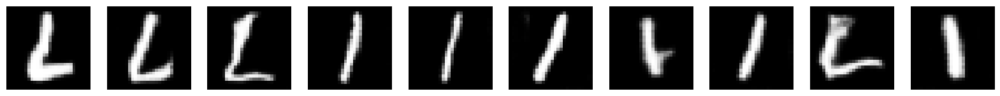

Epoch 200: D Accuracy = 0.6092
27/27 [==============================] - 1s 41ms/step - d_loss: 1.1430 - g_loss: 1.2168 - d_accuracy: 0.7093
Epoch 201/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2106 - g_loss: 1.2761 - d_accuracy: 0.6685
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2116 - g_loss: 1.2000 - d_accuracy: 0.6714
Epoch 203/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1313 - g_loss: 1.2229 - d_accuracy: 0.7154
Epoch 204/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1643 - g_loss: 1.2335 - d_accuracy: 0.6950
Epoch 205/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1815 - g_loss: 1.2463 - d_accuracy: 0.6864
Epoch 206/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1391 - g_loss: 1.1996 - d_accuracy: 0.7180
Epoch 207/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2090 - g_loss: 1.2460 - d_accuracy: 0.6791

27/27 [==============================] - 1s 34ms/step - d_loss: 1.1209 - g_loss: 1.3245 - d_accuracy: 0.7145
Epoch 233/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1354 - g_loss: 1.2911 - d_accuracy: 0.7131
Epoch 234/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1229 - g_loss: 1.2758 - d_accuracy: 0.7129
Epoch 235/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1512 - g_loss: 1.2990 - d_accuracy: 0.7055
Epoch 236/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1225 - g_loss: 1.2537 - d_accuracy: 0.7249
Epoch 237/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1554 - g_loss: 1.2917 - d_accuracy: 0.7066
Epoch 238/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1474 - g_loss: 1.3308 - d_accuracy: 0.7045
Epoch 239/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1715 - g_loss: 1.3118 - d_accuracy: 0.6956
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1250 - g_loss: 1.3301 - d_accuracy: 0.7151
Epoch 265/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0724 - g_loss: 1.3462 - d_accuracy: 0.7461
Epoch 266/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1323 - g_loss: 1.3432 - d_accuracy: 0.7103
Epoch 267/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1230 - g_loss: 1.3901 - d_accuracy: 0.7197
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1151 - g_loss: 1.3235 - d_accuracy: 0.7227
Epoch 269/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1245 - g_loss: 1.3291 - d_accuracy: 0.7200
Epoch 270/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1182 - g_loss: 1.3640 - d_accuracy: 0.7194
Epoch 271/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0926 - g_loss: 1.3892 - d_accuracy: 0.7302
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0837 - g_loss: 1.4517 - d_accuracy: 0.7402
Epoch 297/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1006 - g_loss: 1.4340 - d_accuracy: 0.7276
Epoch 298/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1022 - g_loss: 1.3908 - d_accuracy: 0.7229
Epoch 299/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0590 - g_loss: 1.4367 - d_accuracy: 0.7543
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0910 - g_loss: 1.4341 - d_accuracy: 0.7336
Class 8 — Epoch 300 preview:


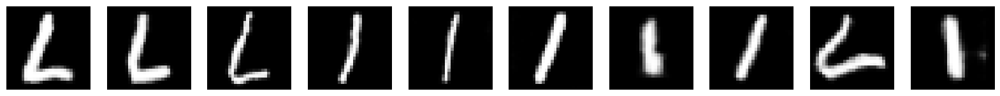

Epoch 300: D Accuracy = 0.8046
27/27 [==============================] - 1s 40ms/step - d_loss: 1.0886 - g_loss: 1.4277 - d_accuracy: 0.7362
Epoch 301/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0728 - g_loss: 1.4427 - d_accuracy: 0.7385
Epoch 302/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0891 - g_loss: 1.4072 - d_accuracy: 0.7400
Epoch 303/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0933 - g_loss: 1.3705 - d_accuracy: 0.7378
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0730 - g_loss: 1.4350 - d_accuracy: 0.7512
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1134 - g_loss: 1.4815 - d_accuracy: 0.7183
Epoch 306/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0573 - g_loss: 1.4322 - d_accuracy: 0.7514
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0522 - g_loss: 1.4702 - d_accuracy: 0.7501

27/27 [==============================] - 1s 36ms/step - d_loss: 1.0629 - g_loss: 1.4671 - d_accuracy: 0.7497
Epoch 333/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0661 - g_loss: 1.4852 - d_accuracy: 0.7528
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0217 - g_loss: 1.5369 - d_accuracy: 0.7670
Epoch 335/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0495 - g_loss: 1.5135 - d_accuracy: 0.7557
Epoch 336/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0203 - g_loss: 1.4987 - d_accuracy: 0.7710
Epoch 337/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0605 - g_loss: 1.5461 - d_accuracy: 0.7449
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0692 - g_loss: 1.5947 - d_accuracy: 0.7463
Epoch 339/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0538 - g_loss: 1.4825 - d_accuracy: 0.7586
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0220 - g_loss: 1.5531 - d_accuracy: 0.7688
Epoch 365/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0180 - g_loss: 1.5393 - d_accuracy: 0.7681
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9631 - g_loss: 1.6422 - d_accuracy: 0.7981
Epoch 367/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0062 - g_loss: 1.6084 - d_accuracy: 0.7717
Epoch 368/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0244 - g_loss: 1.6239 - d_accuracy: 0.7652
Epoch 369/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9860 - g_loss: 1.5953 - d_accuracy: 0.7882
Epoch 370/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0437 - g_loss: 1.6440 - d_accuracy: 0.7443
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0108 - g_loss: 1.5976 - d_accuracy: 0.7777
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9629 - g_loss: 1.7352 - d_accuracy: 0.7890
Epoch 397/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9604 - g_loss: 1.6949 - d_accuracy: 0.7979
Epoch 398/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9955 - g_loss: 1.6835 - d_accuracy: 0.7804
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9262 - g_loss: 1.7274 - d_accuracy: 0.8162
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9663 - g_loss: 1.7042 - d_accuracy: 0.7936
Class 8 — Epoch 400 preview:


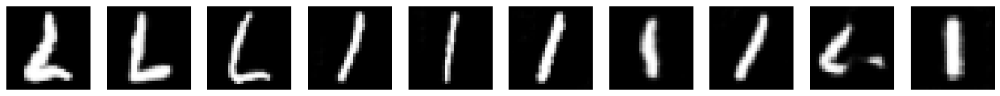

Epoch 400: D Accuracy = 0.8678
27/27 [==============================] - 1s 41ms/step - d_loss: 0.9610 - g_loss: 1.7081 - d_accuracy: 0.7962
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0176 - g_loss: 1.6630 - d_accuracy: 0.7658
Epoch 402/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9609 - g_loss: 1.7165 - d_accuracy: 0.7890
Epoch 403/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9599 - g_loss: 1.7001 - d_accuracy: 0.7900
Epoch 404/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0002 - g_loss: 1.6773 - d_accuracy: 0.7781
Epoch 405/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9960 - g_loss: 1.7844 - d_accuracy: 0.7757
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9591 - g_loss: 1.7393 - d_accuracy: 0.7878
Epoch 407/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9821 - g_loss: 1.6948 - d_accuracy: 0.7889

27/27 [==============================] - 1s 34ms/step - d_loss: 0.9584 - g_loss: 1.7819 - d_accuracy: 0.7943
Epoch 433/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9393 - g_loss: 1.7825 - d_accuracy: 0.8040
Epoch 434/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9119 - g_loss: 1.7595 - d_accuracy: 0.8187
Epoch 435/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8840 - g_loss: 1.8513 - d_accuracy: 0.8301
Epoch 436/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9815 - g_loss: 1.8663 - d_accuracy: 0.7875
Epoch 437/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9334 - g_loss: 1.7939 - d_accuracy: 0.8003
Epoch 438/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9637 - g_loss: 1.8526 - d_accuracy: 0.7916
Epoch 439/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9913 - g_loss: 1.8763 - d_accuracy: 0.7733
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8852 - g_loss: 1.9352 - d_accuracy: 0.8212
Epoch 465/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9096 - g_loss: 1.9057 - d_accuracy: 0.8158
Epoch 466/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8999 - g_loss: 1.8715 - d_accuracy: 0.8238
Epoch 467/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9286 - g_loss: 1.9589 - d_accuracy: 0.8086
Epoch 468/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8907 - g_loss: 1.8995 - d_accuracy: 0.8169
Epoch 469/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9234 - g_loss: 1.8675 - d_accuracy: 0.8083
Epoch 470/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9500 - g_loss: 1.9298 - d_accuracy: 0.7921
Epoch 471/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9210 - g_loss: 1.8798 - d_accuracy: 0.8179
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8700 - g_loss: 1.9572 - d_accuracy: 0.8311
Epoch 497/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8681 - g_loss: 1.9630 - d_accuracy: 0.8365
Epoch 498/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9734 - g_loss: 2.0084 - d_accuracy: 0.7842
Epoch 499/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9246 - g_loss: 1.9508 - d_accuracy: 0.8128
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9240 - g_loss: 1.9878 - d_accuracy: 0.8095
Class 8 — Epoch 500 preview:


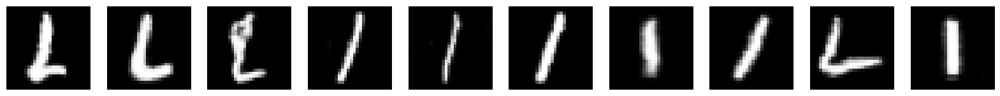

Epoch 500: D Accuracy = 0.9310
27/27 [==============================] - 1s 40ms/step - d_loss: 0.9156 - g_loss: 1.9933 - d_accuracy: 0.8139
Training DCGAN for class 9...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.6667 - g_loss: 2.5838 - d_accuracy: 0.9144
Epoch 1: Generator loss improved from inf to 3.8030. Saving weights.
Epoch 1: D Accuracy = 0.8649
27/27 [==============================] - 2s 40ms/step - d_loss: 0.6687 - g_loss: 2.6273 - d_accuracy: 0.9126
Epoch 2/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.5058 - g_loss: 3.7394 - d_accuracy: 0.9643
Epoch 3/500
25/27 [==========================>...] - ETA: 0s - d_loss: 0.6282 - g_loss: 3.6750 - d_accuracy: 0.9252
Epoch 3: Generator loss improved from 3.8030 to 3.1940. Saving weights.
Epoch 3: D Accuracy = 0.9730
27/27 [==============================] - 1s 35ms/step - d_loss: 0.6135 - g_loss: 3.6197 - d_accuracy: 0.9297
Epoch 4/500
27/27 [==============================] - 1s 34ms

Epoch 30/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0407 - g_loss: 1.4249 - d_accuracy: 0.7680
Epoch 31/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0445 - g_loss: 1.5156 - d_accuracy: 0.7589
Epoch 32/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0155 - g_loss: 1.4541 - d_accuracy: 0.7734
Epoch 33/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0596 - g_loss: 1.5123 - d_accuracy: 0.7567
Epoch 34/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0179 - g_loss: 1.4151 - d_accuracy: 0.7733
Epoch 35/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0354 - g_loss: 1.5035 - d_accuracy: 0.7601
Epoch 36/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0532 - g_loss: 1.4221 - d_accuracy: 0.7552
Epoch 37/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0786 - g_loss: 1.4335 - d_accuracy: 0.7475
Epoch 38/500
27/27 [====

27/27 [==============================] - 1s 35ms/step - d_loss: 1.1272 - g_loss: 1.3917 - d_accuracy: 0.7212
Epoch 63/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1037 - g_loss: 1.3516 - d_accuracy: 0.7296
Epoch 64/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0783 - g_loss: 1.3785 - d_accuracy: 0.7447
Epoch 65/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1036 - g_loss: 1.4131 - d_accuracy: 0.7249
Epoch 66/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0953 - g_loss: 1.3886 - d_accuracy: 0.7407
Epoch 67/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0827 - g_loss: 1.3522 - d_accuracy: 0.7442
Epoch 68/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1056 - g_loss: 1.4822 - d_accuracy: 0.7230
Epoch 69/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0853 - g_loss: 1.3986 - d_accuracy: 0.7415
Epoch 70/500
27/27 [=================

27/27 [==============================] - 1s 34ms/step - d_loss: 1.1337 - g_loss: 1.4389 - d_accuracy: 0.7165
Epoch 95/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0628 - g_loss: 1.3661 - d_accuracy: 0.7534
Epoch 96/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1554 - g_loss: 1.3750 - d_accuracy: 0.7018
Epoch 97/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1250 - g_loss: 1.3161 - d_accuracy: 0.7235
Epoch 98/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0964 - g_loss: 1.4070 - d_accuracy: 0.7333
Epoch 99/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1161 - g_loss: 1.3542 - d_accuracy: 0.7260
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1215 - g_loss: 1.3846 - d_accuracy: 0.7250
Class 9 — Epoch 100 preview:


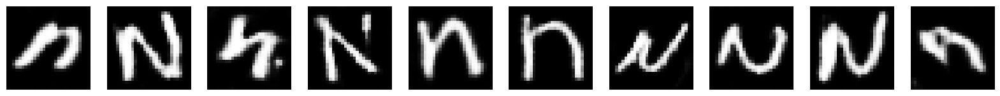

Epoch 100: D Accuracy = 0.6892
27/27 [==============================] - 1s 40ms/step - d_loss: 1.1188 - g_loss: 1.3887 - d_accuracy: 0.7238
Epoch 101/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1137 - g_loss: 1.3337 - d_accuracy: 0.7254
Epoch 102/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0926 - g_loss: 1.3482 - d_accuracy: 0.7431
Epoch 103/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1405 - g_loss: 1.3295 - d_accuracy: 0.7187
Epoch 104/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0533 - g_loss: 1.3614 - d_accuracy: 0.7591
Epoch 105/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1166 - g_loss: 1.3562 - d_accuracy: 0.7227
Epoch 106/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1177 - g_loss: 1.3647 - d_accuracy: 0.7214
Epoch 107/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0927 - g_loss: 1.4112 - d_accuracy: 0.7340

27/27 [==============================] - 1s 35ms/step - d_loss: 1.0862 - g_loss: 1.3703 - d_accuracy: 0.7402
Epoch 133/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1316 - g_loss: 1.3997 - d_accuracy: 0.7182
Epoch 134/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0907 - g_loss: 1.3382 - d_accuracy: 0.7411
Epoch 135/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0615 - g_loss: 1.3950 - d_accuracy: 0.7525
Epoch 136/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0996 - g_loss: 1.3871 - d_accuracy: 0.7271
Epoch 137/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0439 - g_loss: 1.4402 - d_accuracy: 0.7576
Epoch 138/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0985 - g_loss: 1.4258 - d_accuracy: 0.7237
Epoch 139/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0737 - g_loss: 1.3987 - d_accuracy: 0.7403
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0506 - g_loss: 1.4653 - d_accuracy: 0.7534
Epoch 165/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0278 - g_loss: 1.4608 - d_accuracy: 0.7660
Epoch 166/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0339 - g_loss: 1.4935 - d_accuracy: 0.7659
Epoch 167/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0680 - g_loss: 1.4632 - d_accuracy: 0.7463
Epoch 168/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0346 - g_loss: 1.4889 - d_accuracy: 0.7605
Epoch 169/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0725 - g_loss: 1.4682 - d_accuracy: 0.7498
Epoch 170/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0131 - g_loss: 1.5191 - d_accuracy: 0.7715
Epoch 171/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0706 - g_loss: 1.4628 - d_accuracy: 0.7516
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9996 - g_loss: 1.5190 - d_accuracy: 0.7813
Epoch 197/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0496 - g_loss: 1.5812 - d_accuracy: 0.7558
Epoch 198/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0213 - g_loss: 1.5295 - d_accuracy: 0.7639
Epoch 199/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0026 - g_loss: 1.5915 - d_accuracy: 0.7707
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0152 - g_loss: 1.5691 - d_accuracy: 0.7729
Class 9 — Epoch 200 preview:


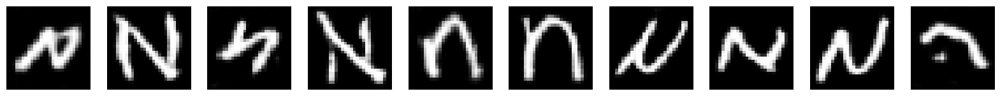

Epoch 200: D Accuracy = 0.6216
27/27 [==============================] - 1s 42ms/step - d_loss: 1.0243 - g_loss: 1.5840 - d_accuracy: 0.7675
Epoch 201/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0530 - g_loss: 1.6338 - d_accuracy: 0.7538
Epoch 202/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0238 - g_loss: 1.5007 - d_accuracy: 0.7645
Epoch 203/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0047 - g_loss: 1.5573 - d_accuracy: 0.7732
Epoch 204/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0464 - g_loss: 1.6539 - d_accuracy: 0.7519
Epoch 205/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0102 - g_loss: 1.5679 - d_accuracy: 0.7740
Epoch 206/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9938 - g_loss: 1.5477 - d_accuracy: 0.7854
Epoch 207/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0231 - g_loss: 1.6006 - d_accuracy: 0.7558

27/27 [==============================] - 1s 34ms/step - d_loss: 1.0102 - g_loss: 1.6596 - d_accuracy: 0.7726
Epoch 233/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9947 - g_loss: 1.6728 - d_accuracy: 0.7832
Epoch 234/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9508 - g_loss: 1.6398 - d_accuracy: 0.8010
Epoch 235/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9844 - g_loss: 1.7483 - d_accuracy: 0.7865
Epoch 236/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9654 - g_loss: 1.6285 - d_accuracy: 0.7970
Epoch 237/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9937 - g_loss: 1.7029 - d_accuracy: 0.7747
Epoch 238/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9441 - g_loss: 1.7420 - d_accuracy: 0.8073
Epoch 239/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9615 - g_loss: 1.7157 - d_accuracy: 0.7896
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9496 - g_loss: 1.8233 - d_accuracy: 0.7969
Epoch 265/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9431 - g_loss: 1.7577 - d_accuracy: 0.8043
Epoch 266/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9341 - g_loss: 1.7761 - d_accuracy: 0.8068
Epoch 267/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9459 - g_loss: 1.7622 - d_accuracy: 0.7973
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9588 - g_loss: 1.7398 - d_accuracy: 0.7990
Epoch 269/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9157 - g_loss: 1.7884 - d_accuracy: 0.8135
Epoch 270/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9508 - g_loss: 1.7719 - d_accuracy: 0.7938
Epoch 271/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9295 - g_loss: 1.7561 - d_accuracy: 0.8060
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9200 - g_loss: 1.8364 - d_accuracy: 0.8160
Epoch 297/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9404 - g_loss: 1.8673 - d_accuracy: 0.7961
Epoch 298/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9400 - g_loss: 1.8341 - d_accuracy: 0.8019
Epoch 299/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9435 - g_loss: 1.8698 - d_accuracy: 0.8024
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8918 - g_loss: 1.8392 - d_accuracy: 0.8267
Class 9 — Epoch 300 preview:


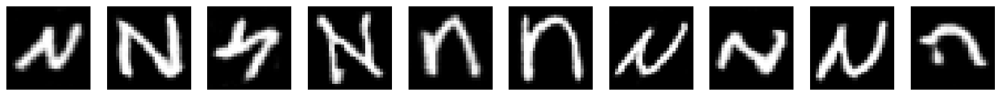

Epoch 300: D Accuracy = 0.8649
27/27 [==============================] - 1s 41ms/step - d_loss: 0.8913 - g_loss: 1.8297 - d_accuracy: 0.8281
Epoch 301/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9223 - g_loss: 1.8489 - d_accuracy: 0.8109
Epoch 302/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8853 - g_loss: 1.8245 - d_accuracy: 0.8287
Epoch 303/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9255 - g_loss: 1.9539 - d_accuracy: 0.8027
Epoch 304/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8880 - g_loss: 1.8795 - d_accuracy: 0.8230
Epoch 305/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9621 - g_loss: 1.8259 - d_accuracy: 0.7920
Epoch 306/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8918 - g_loss: 1.8773 - d_accuracy: 0.8241
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8974 - g_loss: 1.8909 - d_accuracy: 0.8201

27/27 [==============================] - 1s 34ms/step - d_loss: 0.9007 - g_loss: 1.9734 - d_accuracy: 0.8188
Epoch 333/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8933 - g_loss: 1.9896 - d_accuracy: 0.8149
Epoch 334/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9452 - g_loss: 1.9275 - d_accuracy: 0.8028
Epoch 335/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8984 - g_loss: 1.8562 - d_accuracy: 0.8213
Epoch 336/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8617 - g_loss: 1.9749 - d_accuracy: 0.8326
Epoch 337/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9185 - g_loss: 1.9397 - d_accuracy: 0.8140
Epoch 338/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8777 - g_loss: 1.9622 - d_accuracy: 0.8375
Epoch 339/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8513 - g_loss: 1.9887 - d_accuracy: 0.8434
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8670 - g_loss: 2.1067 - d_accuracy: 0.8295
Epoch 365/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8845 - g_loss: 2.0302 - d_accuracy: 0.8263
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8841 - g_loss: 1.9855 - d_accuracy: 0.8256
Epoch 367/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8463 - g_loss: 2.0718 - d_accuracy: 0.8400
Epoch 368/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8280 - g_loss: 2.0589 - d_accuracy: 0.8484
Epoch 369/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8883 - g_loss: 2.1334 - d_accuracy: 0.8149
Epoch 370/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8621 - g_loss: 2.1020 - d_accuracy: 0.8294
Epoch 371/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8805 - g_loss: 1.9683 - d_accuracy: 0.8254
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9824 - g_loss: 2.1962 - d_accuracy: 0.7833
Epoch 397/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8278 - g_loss: 2.0672 - d_accuracy: 0.8557
Epoch 398/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8156 - g_loss: 2.0922 - d_accuracy: 0.8587
Epoch 399/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8007 - g_loss: 2.1504 - d_accuracy: 0.8616
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8362 - g_loss: 2.1514 - d_accuracy: 0.8462
Class 9 — Epoch 400 preview:


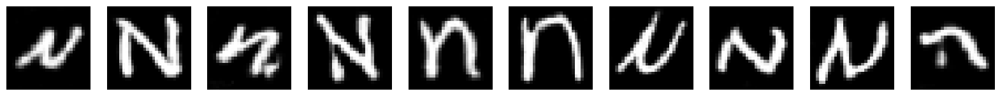

Epoch 400: D Accuracy = 0.9054
27/27 [==============================] - 1s 40ms/step - d_loss: 0.8345 - g_loss: 2.1327 - d_accuracy: 0.8483
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8654 - g_loss: 2.1152 - d_accuracy: 0.8284
Epoch 402/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7976 - g_loss: 2.1166 - d_accuracy: 0.8645
Epoch 403/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8122 - g_loss: 2.2159 - d_accuracy: 0.8518
Epoch 404/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8193 - g_loss: 2.0950 - d_accuracy: 0.8553
Epoch 405/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8159 - g_loss: 2.1225 - d_accuracy: 0.8551
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7881 - g_loss: 2.1931 - d_accuracy: 0.8686
Epoch 407/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8119 - g_loss: 2.2081 - d_accuracy: 0.8573

27/27 [==============================] - 1s 34ms/step - d_loss: 0.8635 - g_loss: 2.2269 - d_accuracy: 0.8312
Epoch 433/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7856 - g_loss: 2.2876 - d_accuracy: 0.8603
Epoch 434/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8013 - g_loss: 2.2977 - d_accuracy: 0.8537
Epoch 435/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8219 - g_loss: 2.2676 - d_accuracy: 0.8554
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8065 - g_loss: 2.2955 - d_accuracy: 0.8600
Epoch 437/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8199 - g_loss: 2.2541 - d_accuracy: 0.8486
Epoch 438/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7843 - g_loss: 2.2552 - d_accuracy: 0.8653
Epoch 439/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7992 - g_loss: 2.2820 - d_accuracy: 0.8589
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7616 - g_loss: 2.3919 - d_accuracy: 0.8709
Epoch 465/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7753 - g_loss: 2.3112 - d_accuracy: 0.8676
Epoch 466/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8152 - g_loss: 2.4348 - d_accuracy: 0.8447
Epoch 467/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7797 - g_loss: 2.3431 - d_accuracy: 0.8681
Epoch 468/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8041 - g_loss: 2.3557 - d_accuracy: 0.8546
Epoch 469/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7281 - g_loss: 2.3720 - d_accuracy: 0.8851
Epoch 470/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7674 - g_loss: 2.3377 - d_accuracy: 0.8728
Epoch 471/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7649 - g_loss: 2.3521 - d_accuracy: 0.8662
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8423 - g_loss: 2.3978 - d_accuracy: 0.8461
Epoch 497/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7188 - g_loss: 2.4880 - d_accuracy: 0.8842
Epoch 498/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7742 - g_loss: 2.3843 - d_accuracy: 0.8653
Epoch 499/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7916 - g_loss: 2.4540 - d_accuracy: 0.8547
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7743 - g_loss: 2.4808 - d_accuracy: 0.8583
Class 9 — Epoch 500 preview:


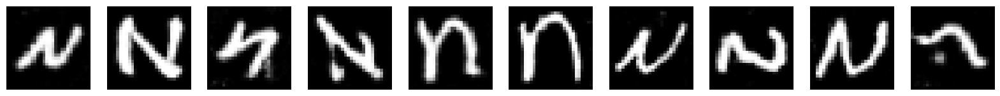

Epoch 500: D Accuracy = 0.7432
27/27 [==============================] - 1s 40ms/step - d_loss: 0.7774 - g_loss: 2.5381 - d_accuracy: 0.8541
Training DCGAN for class 10...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.6276 - g_loss: 2.6708 - d_accuracy: 0.9293
Epoch 1: Generator loss improved from inf to 3.1099. Saving weights.
Epoch 1: D Accuracy = 0.9812
27/27 [==============================] - 2s 42ms/step - d_loss: 0.6223 - g_loss: 2.6865 - d_accuracy: 0.9311
Epoch 2/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.5050 - g_loss: 3.5705 - d_accuracy: 0.9629
Epoch 3/500
27/27 [==============================] - ETA: 0s - d_loss: 0.4133 - g_loss: 4.3512 - d_accuracy: 0.9878
Epoch 3: Generator loss improved from 3.1099 to 3.0973. Saving weights.
Epoch 3: D Accuracy = 0.9937
27/27 [==============================] - 1s 35ms/step - d_loss: 0.4149 - g_loss: 4.3064 - d_accuracy: 0.9880
Epoch 4/500
27/27 [==============================] - ETA: 0

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2221 - g_loss: 1.0982 - d_accuracy: 0.6713
Epoch 30/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2222 - g_loss: 1.1007 - d_accuracy: 0.6797
Epoch 31/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2037 - g_loss: 1.1126 - d_accuracy: 0.6864
Epoch 32/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2169 - g_loss: 1.1078 - d_accuracy: 0.6774
Epoch 33/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2417 - g_loss: 1.1060 - d_accuracy: 0.6667
Epoch 34/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2214 - g_loss: 1.1001 - d_accuracy: 0.6708
Epoch 35/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2067 - g_loss: 1.1097 - d_accuracy: 0.6846
Epoch 36/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2194 - g_loss: 1.1086 - d_accuracy: 0.6769
Epoch 36: Generator loss improved from 0.8

Epoch 61/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2304 - g_loss: 1.0794 - d_accuracy: 0.6613
Epoch 62/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2249 - g_loss: 1.1287 - d_accuracy: 0.6605
Epoch 63/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2210 - g_loss: 1.1015 - d_accuracy: 0.6764
Epoch 64/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2687 - g_loss: 1.0699 - d_accuracy: 0.6461
Epoch 65/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2199 - g_loss: 1.0946 - d_accuracy: 0.6746
Epoch 66/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2489 - g_loss: 1.0650 - d_accuracy: 0.6515
Epoch 66: Generator loss improved from 0.7886 to 0.7320. Saving weights.
Epoch 66: D Accuracy = 0.6062
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2503 - g_loss: 1.0531 - d_accuracy: 0.6499
Epoch 67/500
27/27 [==============================] - 1s 34ms

Epoch 93/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2436 - g_loss: 1.0522 - d_accuracy: 0.6543
Epoch 94/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2553 - g_loss: 1.0603 - d_accuracy: 0.6500
Epoch 95/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2499 - g_loss: 1.0516 - d_accuracy: 0.6554
Epoch 96/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2353 - g_loss: 1.0635 - d_accuracy: 0.6564
Epoch 97/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2293 - g_loss: 1.0569 - d_accuracy: 0.6729
Epoch 98/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2569 - g_loss: 1.0793 - d_accuracy: 0.6485
Epoch 99/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2541 - g_loss: 1.0270 - d_accuracy: 0.6446
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2542 - g_loss: 1.0670 - d_accuracy: 0.6436
Class 10 — Epoch 100 preview

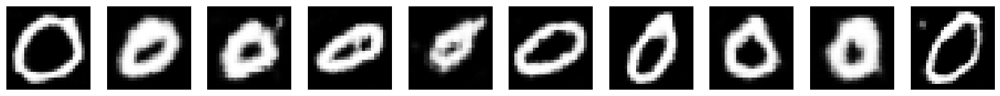

Epoch 100: D Accuracy = 0.6812
27/27 [==============================] - 1s 45ms/step - d_loss: 1.2513 - g_loss: 1.0729 - d_accuracy: 0.6449
Epoch 101/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2389 - g_loss: 1.0355 - d_accuracy: 0.6551
Epoch 102/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2297 - g_loss: 1.0775 - d_accuracy: 0.6647
Epoch 103/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2880 - g_loss: 1.0622 - d_accuracy: 0.6319
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2282 - g_loss: 1.0479 - d_accuracy: 0.6694
Epoch 105/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2400 - g_loss: 1.0816 - d_accuracy: 0.6615
Epoch 106/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2472 - g_loss: 1.0551 - d_accuracy: 0.6523
Epoch 106: Generator loss improved from 0.6654 to 0.6386. Saving weights.
Epoch 106: D Accuracy = 0.6125
27/27 [===============

27/27 [==============================] - 1s 36ms/step - d_loss: 1.1834 - g_loss: 1.1607 - d_accuracy: 0.6966
Epoch 133/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1559 - g_loss: 1.2293 - d_accuracy: 0.7024
Epoch 134/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1461 - g_loss: 1.1831 - d_accuracy: 0.7155
Epoch 135/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1672 - g_loss: 1.1695 - d_accuracy: 0.6994
Epoch 136/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1386 - g_loss: 1.1905 - d_accuracy: 0.7244
Epoch 137/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1529 - g_loss: 1.2057 - d_accuracy: 0.7032
Epoch 138/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1601 - g_loss: 1.2189 - d_accuracy: 0.7037
Epoch 139/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1478 - g_loss: 1.2440 - d_accuracy: 0.7060
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0796 - g_loss: 1.3486 - d_accuracy: 0.7424
Epoch 165/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0955 - g_loss: 1.3557 - d_accuracy: 0.7389
Epoch 166/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0615 - g_loss: 1.3004 - d_accuracy: 0.7613
Epoch 167/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0777 - g_loss: 1.3608 - d_accuracy: 0.7544
Epoch 168/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0873 - g_loss: 1.3294 - d_accuracy: 0.7453
Epoch 169/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0664 - g_loss: 1.3471 - d_accuracy: 0.7504
Epoch 170/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0798 - g_loss: 1.3683 - d_accuracy: 0.7431
Epoch 171/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0721 - g_loss: 1.3542 - d_accuracy: 0.7555
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0286 - g_loss: 1.5152 - d_accuracy: 0.7722
Epoch 197/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0260 - g_loss: 1.5055 - d_accuracy: 0.7669
Epoch 198/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9803 - g_loss: 1.5133 - d_accuracy: 0.7970
Epoch 199/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0097 - g_loss: 1.5425 - d_accuracy: 0.7775
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0126 - g_loss: 1.5272 - d_accuracy: 0.7775
Class 10 — Epoch 200 preview:


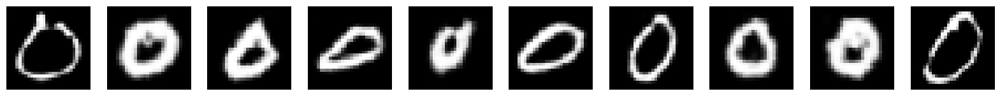

Epoch 200: D Accuracy = 0.7125
27/27 [==============================] - 1s 41ms/step - d_loss: 1.0151 - g_loss: 1.5251 - d_accuracy: 0.7752
Epoch 201/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9768 - g_loss: 1.5582 - d_accuracy: 0.7931
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0137 - g_loss: 1.5843 - d_accuracy: 0.7726
Epoch 203/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0123 - g_loss: 1.5260 - d_accuracy: 0.7727
Epoch 204/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9506 - g_loss: 1.5558 - d_accuracy: 0.8033
Epoch 205/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9644 - g_loss: 1.5381 - d_accuracy: 0.8008
Epoch 206/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9667 - g_loss: 1.5125 - d_accuracy: 0.7986
Epoch 207/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9997 - g_loss: 1.5860 - d_accuracy: 0.7839

27/27 [==============================] - 1s 34ms/step - d_loss: 0.9599 - g_loss: 1.6841 - d_accuracy: 0.7968
Epoch 233/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8921 - g_loss: 1.6781 - d_accuracy: 0.8312
Epoch 234/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8987 - g_loss: 1.7035 - d_accuracy: 0.8223
Epoch 235/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9212 - g_loss: 1.7173 - d_accuracy: 0.8223
Epoch 236/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9275 - g_loss: 1.6745 - d_accuracy: 0.8135
Epoch 237/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9010 - g_loss: 1.7475 - d_accuracy: 0.8234
Epoch 238/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9389 - g_loss: 1.7158 - d_accuracy: 0.8093
Epoch 239/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8985 - g_loss: 1.7341 - d_accuracy: 0.8262
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8783 - g_loss: 1.8382 - d_accuracy: 0.8303
Epoch 265/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9076 - g_loss: 1.8960 - d_accuracy: 0.8123
Epoch 266/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8923 - g_loss: 1.8362 - d_accuracy: 0.8261
Epoch 267/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8376 - g_loss: 1.8666 - d_accuracy: 0.8497
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9110 - g_loss: 1.8611 - d_accuracy: 0.8139
Epoch 269/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8259 - g_loss: 1.8983 - d_accuracy: 0.8569
Epoch 270/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8870 - g_loss: 1.9498 - d_accuracy: 0.8208
Epoch 271/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8745 - g_loss: 1.8376 - d_accuracy: 0.8358
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8194 - g_loss: 1.9703 - d_accuracy: 0.8520
Epoch 297/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8665 - g_loss: 2.0790 - d_accuracy: 0.8304
Epoch 298/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8321 - g_loss: 1.9409 - d_accuracy: 0.8580
Epoch 299/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8078 - g_loss: 1.9954 - d_accuracy: 0.8615
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8439 - g_loss: 1.9989 - d_accuracy: 0.8425
Class 10 — Epoch 300 preview:


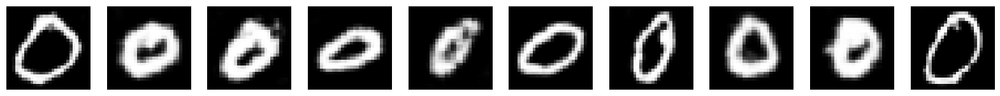

Epoch 300: D Accuracy = 0.8875
27/27 [==============================] - 1s 40ms/step - d_loss: 0.8382 - g_loss: 2.0099 - d_accuracy: 0.8441
Epoch 301/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8944 - g_loss: 1.9555 - d_accuracy: 0.8169
Epoch 302/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8289 - g_loss: 2.0319 - d_accuracy: 0.8480
Epoch 303/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7907 - g_loss: 2.0213 - d_accuracy: 0.8695
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7883 - g_loss: 2.0416 - d_accuracy: 0.8730
Epoch 305/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8134 - g_loss: 2.0198 - d_accuracy: 0.8527
Epoch 306/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8443 - g_loss: 2.0363 - d_accuracy: 0.8430
Epoch 307/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8464 - g_loss: 2.0851 - d_accuracy: 0.8386

27/27 [==============================] - 1s 34ms/step - d_loss: 0.7704 - g_loss: 2.1337 - d_accuracy: 0.8717
Epoch 333/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8300 - g_loss: 2.1079 - d_accuracy: 0.8528
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7734 - g_loss: 2.1518 - d_accuracy: 0.8715
Epoch 335/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8171 - g_loss: 2.1678 - d_accuracy: 0.8510
Epoch 336/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7992 - g_loss: 2.0905 - d_accuracy: 0.8656
Epoch 337/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7941 - g_loss: 2.1794 - d_accuracy: 0.8554
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8194 - g_loss: 2.1443 - d_accuracy: 0.8521
Epoch 339/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7650 - g_loss: 2.1220 - d_accuracy: 0.8774
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8380 - g_loss: 2.2415 - d_accuracy: 0.8408
Epoch 365/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8177 - g_loss: 2.2054 - d_accuracy: 0.8509
Epoch 366/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7474 - g_loss: 2.2851 - d_accuracy: 0.8801
Epoch 367/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7384 - g_loss: 2.2629 - d_accuracy: 0.8828
Epoch 368/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8046 - g_loss: 2.2763 - d_accuracy: 0.8536
Epoch 369/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7682 - g_loss: 2.2287 - d_accuracy: 0.8765
Epoch 370/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7482 - g_loss: 2.2842 - d_accuracy: 0.8831
Epoch 371/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7635 - g_loss: 2.2678 - d_accuracy: 0.8752
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7513 - g_loss: 2.3799 - d_accuracy: 0.8793
Epoch 397/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7363 - g_loss: 2.3455 - d_accuracy: 0.8872
Epoch 398/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7051 - g_loss: 2.3670 - d_accuracy: 0.8980
Epoch 399/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7858 - g_loss: 2.4155 - d_accuracy: 0.8650
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7822 - g_loss: 2.4205 - d_accuracy: 0.8650
Class 10 — Epoch 400 preview:


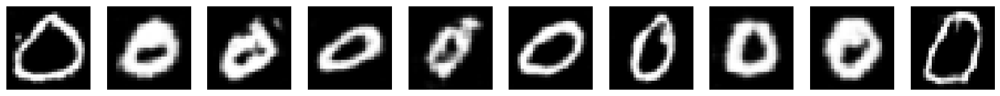

Epoch 400: D Accuracy = 0.9250
27/27 [==============================] - 1s 40ms/step - d_loss: 0.7763 - g_loss: 2.4235 - d_accuracy: 0.8671
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7656 - g_loss: 2.3343 - d_accuracy: 0.8701
Epoch 402/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7208 - g_loss: 2.4067 - d_accuracy: 0.8862
Epoch 403/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7729 - g_loss: 2.4700 - d_accuracy: 0.8656
Epoch 404/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7256 - g_loss: 2.3976 - d_accuracy: 0.8888
Epoch 405/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7396 - g_loss: 2.3639 - d_accuracy: 0.8832
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7620 - g_loss: 2.4299 - d_accuracy: 0.8705
Epoch 407/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7378 - g_loss: 2.4233 - d_accuracy: 0.8826

27/27 [==============================] - 1s 35ms/step - d_loss: 0.7198 - g_loss: 2.4815 - d_accuracy: 0.8880
Epoch 433/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7000 - g_loss: 2.4544 - d_accuracy: 0.8951
Epoch 434/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.6950 - g_loss: 2.4547 - d_accuracy: 0.9002
Epoch 435/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.6819 - g_loss: 2.6047 - d_accuracy: 0.9014
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7132 - g_loss: 2.4836 - d_accuracy: 0.8954
Epoch 437/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7245 - g_loss: 2.4757 - d_accuracy: 0.8915
Epoch 438/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.6750 - g_loss: 2.4943 - d_accuracy: 0.9095
Epoch 439/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7107 - g_loss: 2.5645 - d_accuracy: 0.8910
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7086 - g_loss: 2.5647 - d_accuracy: 0.8939
Epoch 465/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7069 - g_loss: 2.5080 - d_accuracy: 0.8940
Epoch 466/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7119 - g_loss: 2.6565 - d_accuracy: 0.8915
Epoch 467/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.6870 - g_loss: 2.5679 - d_accuracy: 0.9020
Epoch 468/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.6784 - g_loss: 2.5834 - d_accuracy: 0.9063
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7509 - g_loss: 2.6630 - d_accuracy: 0.8748
Epoch 470/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.6957 - g_loss: 2.5417 - d_accuracy: 0.8983
Epoch 471/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7797 - g_loss: 2.6572 - d_accuracy: 0.8571
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.6630 - g_loss: 2.6443 - d_accuracy: 0.9134
Epoch 497/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0392 - g_loss: 2.7983 - d_accuracy: 0.8176
Epoch 498/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.6949 - g_loss: 2.5021 - d_accuracy: 0.9027
Epoch 499/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.6877 - g_loss: 2.6037 - d_accuracy: 0.9015
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.6613 - g_loss: 2.6702 - d_accuracy: 0.9117
Class 10 — Epoch 500 preview:


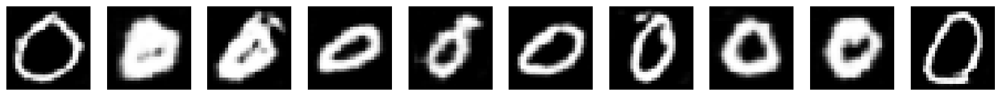

Epoch 500: D Accuracy = 0.9563
27/27 [==============================] - 1s 41ms/step - d_loss: 0.6585 - g_loss: 2.6835 - d_accuracy: 0.9133
Training DCGAN for class 11...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.6860 - g_loss: 2.5182 - d_accuracy: 0.9141
Epoch 1: Generator loss improved from inf to 2.4486. Saving weights.
Epoch 1: D Accuracy = 0.9265
27/27 [==============================] - 2s 43ms/step - d_loss: 0.6845 - g_loss: 2.5157 - d_accuracy: 0.9145
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9330 - g_loss: 2.0465 - d_accuracy: 0.8333
Epoch 2: Generator loss improved from 2.4486 to 1.8059. Saving weights.
Epoch 2: D Accuracy = 0.8235
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9310 - g_loss: 2.0379 - d_accuracy: 0.8330
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1121 - g_loss: 1.6286 - d_accuracy: 0.7446
Epoch 4/500
27/27 [==============================] - ETA: 0

Epoch 30/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1835 - g_loss: 1.1828 - d_accuracy: 0.6897
Epoch 31/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1938 - g_loss: 1.1823 - d_accuracy: 0.6872
Epoch 31: Generator loss improved from 0.7438 to 0.7261. Saving weights.
Epoch 31: D Accuracy = 0.7108
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1961 - g_loss: 1.1660 - d_accuracy: 0.6880
Epoch 32/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1791 - g_loss: 1.1939 - d_accuracy: 0.6890
Epoch 33/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1990 - g_loss: 1.1863 - d_accuracy: 0.6818
Epoch 34/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2084 - g_loss: 1.1591 - d_accuracy: 0.6739
Epoch 35/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1584 - g_loss: 1.1775 - d_accuracy: 0.7014
Epoch 36/500
27/27 [==============================] - 1s 35ms

Epoch 62/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1970 - g_loss: 1.1784 - d_accuracy: 0.6827
Epoch 63/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1972 - g_loss: 1.1425 - d_accuracy: 0.6930
Epoch 64/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1729 - g_loss: 1.1615 - d_accuracy: 0.6943
Epoch 65/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2040 - g_loss: 1.1758 - d_accuracy: 0.6816
Epoch 66/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1884 - g_loss: 1.1712 - d_accuracy: 0.6856
Epoch 67/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1914 - g_loss: 1.1535 - d_accuracy: 0.6811
Epoch 68/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1910 - g_loss: 1.1460 - d_accuracy: 0.6841
Epoch 69/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1804 - g_loss: 1.1847 - d_accuracy: 0.6880
Epoch 69: Generator loss impr

Epoch 94/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2149 - g_loss: 1.1260 - d_accuracy: 0.6707
Epoch 95/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2037 - g_loss: 1.1421 - d_accuracy: 0.6877
Epoch 96/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2202 - g_loss: 1.1291 - d_accuracy: 0.6702
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1897 - g_loss: 1.1351 - d_accuracy: 0.6903
Epoch 98/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1947 - g_loss: 1.1235 - d_accuracy: 0.6856
Epoch 99/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2149 - g_loss: 1.1339 - d_accuracy: 0.6703
Epoch 99: Generator loss improved from 0.7169 to 0.5726. Saving weights.
Epoch 99: D Accuracy = 0.5931
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2226 - g_loss: 1.1138 - d_accuracy: 0.6675
Epoch 100/500
27/27 [==============================] - ETA: 0

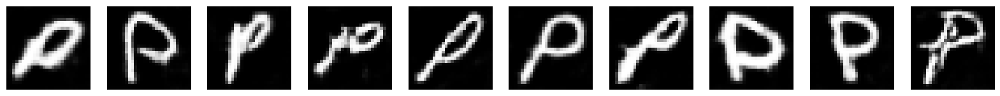

Epoch 100: D Accuracy = 0.7206
27/27 [==============================] - 1s 41ms/step - d_loss: 1.1926 - g_loss: 1.1614 - d_accuracy: 0.6851
Epoch 101/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2069 - g_loss: 1.1421 - d_accuracy: 0.6728
Epoch 102/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1934 - g_loss: 1.1083 - d_accuracy: 0.6839
Epoch 103/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2024 - g_loss: 1.1569 - d_accuracy: 0.6735
Epoch 104/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1817 - g_loss: 1.1370 - d_accuracy: 0.6913
Epoch 105/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2195 - g_loss: 1.1738 - d_accuracy: 0.6679
Epoch 106/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2000 - g_loss: 1.1307 - d_accuracy: 0.6762
Epoch 107/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1971 - g_loss: 1.1576 - d_accuracy: 0.6852
Epoc

27/27 [==============================] - 1s 35ms/step - d_loss: 1.1871 - g_loss: 1.1739 - d_accuracy: 0.6857
Epoch 133/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1580 - g_loss: 1.1782 - d_accuracy: 0.7019
Epoch 134/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1938 - g_loss: 1.1755 - d_accuracy: 0.6804
Epoch 135/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1900 - g_loss: 1.1673 - d_accuracy: 0.6892
Epoch 136/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1627 - g_loss: 1.2084 - d_accuracy: 0.6935
Epoch 137/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1983 - g_loss: 1.1883 - d_accuracy: 0.6777
Epoch 138/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2039 - g_loss: 1.2126 - d_accuracy: 0.6684
Epoch 139/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1690 - g_loss: 1.1670 - d_accuracy: 0.6956
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.1645 - g_loss: 1.2489 - d_accuracy: 0.6965
Epoch 165/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1278 - g_loss: 1.2566 - d_accuracy: 0.7185
Epoch 166/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1512 - g_loss: 1.2059 - d_accuracy: 0.7060
Epoch 167/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1494 - g_loss: 1.2507 - d_accuracy: 0.7029
Epoch 168/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1494 - g_loss: 1.2401 - d_accuracy: 0.7060
Epoch 169/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1239 - g_loss: 1.2570 - d_accuracy: 0.7171
Epoch 170/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1490 - g_loss: 1.2164 - d_accuracy: 0.7096
Epoch 171/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1444 - g_loss: 1.2379 - d_accuracy: 0.7065
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1153 - g_loss: 1.2880 - d_accuracy: 0.7267
Epoch 197/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1298 - g_loss: 1.2981 - d_accuracy: 0.7198
Epoch 198/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0886 - g_loss: 1.3219 - d_accuracy: 0.7405
Epoch 199/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1280 - g_loss: 1.3339 - d_accuracy: 0.7220
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0838 - g_loss: 1.3121 - d_accuracy: 0.7421
Class 11 — Epoch 200 preview:


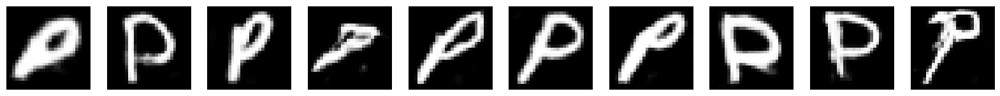

Epoch 200: D Accuracy = 0.6814
27/27 [==============================] - 1s 40ms/step - d_loss: 1.0847 - g_loss: 1.3211 - d_accuracy: 0.7399
Epoch 201/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1428 - g_loss: 1.3383 - d_accuracy: 0.7115
Epoch 202/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0919 - g_loss: 1.3068 - d_accuracy: 0.7362
Epoch 203/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1023 - g_loss: 1.3075 - d_accuracy: 0.7298
Epoch 204/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1127 - g_loss: 1.3180 - d_accuracy: 0.7318
Epoch 205/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0889 - g_loss: 1.3442 - d_accuracy: 0.7363
Epoch 206/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0943 - g_loss: 1.3096 - d_accuracy: 0.7393
Epoch 207/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1128 - g_loss: 1.3673 - d_accuracy: 0.7233

27/27 [==============================] - 1s 36ms/step - d_loss: 1.0632 - g_loss: 1.3945 - d_accuracy: 0.7554
Epoch 233/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0374 - g_loss: 1.4289 - d_accuracy: 0.7624
Epoch 234/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0330 - g_loss: 1.4443 - d_accuracy: 0.7619
Epoch 235/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0780 - g_loss: 1.4543 - d_accuracy: 0.7378
Epoch 236/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0585 - g_loss: 1.4017 - d_accuracy: 0.7559
Epoch 237/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0665 - g_loss: 1.4373 - d_accuracy: 0.7497
Epoch 238/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0419 - g_loss: 1.4136 - d_accuracy: 0.7596
Epoch 239/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0863 - g_loss: 1.5245 - d_accuracy: 0.7345
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9957 - g_loss: 1.5408 - d_accuracy: 0.7769
Epoch 265/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0382 - g_loss: 1.5151 - d_accuracy: 0.7635
Epoch 266/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0410 - g_loss: 1.5441 - d_accuracy: 0.7604
Epoch 267/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0197 - g_loss: 1.5538 - d_accuracy: 0.7661
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0186 - g_loss: 1.5426 - d_accuracy: 0.7648
Epoch 269/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9808 - g_loss: 1.5537 - d_accuracy: 0.7895
Epoch 270/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0454 - g_loss: 1.5452 - d_accuracy: 0.7513
Epoch 271/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0148 - g_loss: 1.5418 - d_accuracy: 0.7666
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9647 - g_loss: 1.6312 - d_accuracy: 0.7919
Epoch 297/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9995 - g_loss: 1.7168 - d_accuracy: 0.7722
Epoch 298/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9687 - g_loss: 1.6872 - d_accuracy: 0.7861
Epoch 299/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9775 - g_loss: 1.6312 - d_accuracy: 0.7850
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9527 - g_loss: 1.6667 - d_accuracy: 0.7928
Class 11 — Epoch 300 preview:


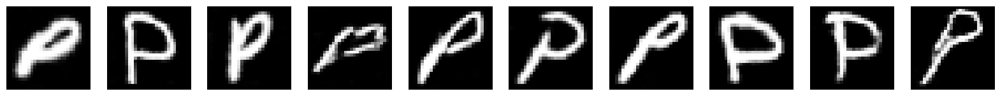

Epoch 300: D Accuracy = 0.8235
27/27 [==============================] - 1s 46ms/step - d_loss: 0.9526 - g_loss: 1.6599 - d_accuracy: 0.7939
Epoch 301/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9623 - g_loss: 1.6431 - d_accuracy: 0.7970
Epoch 302/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9429 - g_loss: 1.7038 - d_accuracy: 0.8018
Epoch 303/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9493 - g_loss: 1.6904 - d_accuracy: 0.7984
Epoch 304/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9772 - g_loss: 1.7600 - d_accuracy: 0.7891
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9310 - g_loss: 1.7010 - d_accuracy: 0.8049
Epoch 306/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9567 - g_loss: 1.6735 - d_accuracy: 0.7947
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9675 - g_loss: 1.7067 - d_accuracy: 0.7944

27/27 [==============================] - 1s 36ms/step - d_loss: 0.9692 - g_loss: 1.8244 - d_accuracy: 0.7856
Epoch 333/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8935 - g_loss: 1.7603 - d_accuracy: 0.8297
Epoch 334/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9299 - g_loss: 1.7935 - d_accuracy: 0.8072
Epoch 335/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9173 - g_loss: 1.7588 - d_accuracy: 0.8165
Epoch 336/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9288 - g_loss: 1.8626 - d_accuracy: 0.8030
Epoch 337/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9286 - g_loss: 1.7980 - d_accuracy: 0.8150
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9242 - g_loss: 1.8224 - d_accuracy: 0.8057
Epoch 339/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9442 - g_loss: 1.7899 - d_accuracy: 0.8008
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8756 - g_loss: 1.9339 - d_accuracy: 0.8328
Epoch 365/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8967 - g_loss: 1.9311 - d_accuracy: 0.8133
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9135 - g_loss: 1.9574 - d_accuracy: 0.8184
Epoch 367/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.8856 - g_loss: 1.9643 - d_accuracy: 0.8199
Epoch 368/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.8525 - g_loss: 1.9121 - d_accuracy: 0.8413
Epoch 369/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8878 - g_loss: 1.9197 - d_accuracy: 0.8259
Epoch 370/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8622 - g_loss: 1.9117 - d_accuracy: 0.8408
Epoch 371/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9195 - g_loss: 1.9349 - d_accuracy: 0.8094
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8750 - g_loss: 2.0075 - d_accuracy: 0.8264
Epoch 397/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8537 - g_loss: 2.0675 - d_accuracy: 0.8395
Epoch 398/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8466 - g_loss: 2.0316 - d_accuracy: 0.8339
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8568 - g_loss: 2.0790 - d_accuracy: 0.8287
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8516 - g_loss: 2.0502 - d_accuracy: 0.8341
Class 11 — Epoch 400 preview:


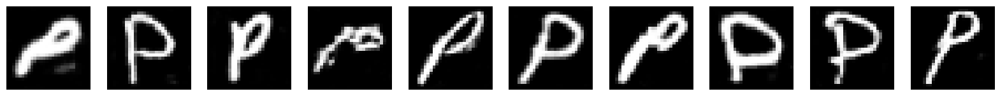

Epoch 400: D Accuracy = 0.8480
27/27 [==============================] - 1s 40ms/step - d_loss: 0.8509 - g_loss: 2.0488 - d_accuracy: 0.8346
Epoch 401/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8551 - g_loss: 2.0715 - d_accuracy: 0.8335
Epoch 402/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.8228 - g_loss: 2.0617 - d_accuracy: 0.8530
Epoch 403/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8558 - g_loss: 2.0357 - d_accuracy: 0.8351
Epoch 404/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8807 - g_loss: 2.1542 - d_accuracy: 0.8217
Epoch 405/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8139 - g_loss: 2.0378 - d_accuracy: 0.8587
Epoch 406/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8637 - g_loss: 2.1337 - d_accuracy: 0.8329
Epoch 407/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8729 - g_loss: 2.0964 - d_accuracy: 0.8311

27/27 [==============================] - 1s 35ms/step - d_loss: 0.8454 - g_loss: 2.2288 - d_accuracy: 0.8387
Epoch 433/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8296 - g_loss: 2.1302 - d_accuracy: 0.8500
Epoch 434/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8262 - g_loss: 2.1248 - d_accuracy: 0.8468
Epoch 435/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8710 - g_loss: 2.1256 - d_accuracy: 0.8239
Epoch 436/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8062 - g_loss: 2.1380 - d_accuracy: 0.8560
Epoch 437/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8151 - g_loss: 2.2000 - d_accuracy: 0.8512
Epoch 438/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8113 - g_loss: 2.2002 - d_accuracy: 0.8541
Epoch 439/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7986 - g_loss: 2.2332 - d_accuracy: 0.8581
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7599 - g_loss: 2.4020 - d_accuracy: 0.8731
Epoch 465/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7927 - g_loss: 2.2633 - d_accuracy: 0.8660
Epoch 466/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7624 - g_loss: 2.3046 - d_accuracy: 0.8723
Epoch 467/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7904 - g_loss: 2.3792 - d_accuracy: 0.8573
Epoch 468/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7752 - g_loss: 2.2940 - d_accuracy: 0.8716
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7704 - g_loss: 2.3492 - d_accuracy: 0.8695
Epoch 470/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8273 - g_loss: 2.2837 - d_accuracy: 0.8496
Epoch 471/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.7735 - g_loss: 2.3693 - d_accuracy: 0.8664
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7420 - g_loss: 2.3847 - d_accuracy: 0.8794
Epoch 497/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7548 - g_loss: 2.4147 - d_accuracy: 0.8740
Epoch 498/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7671 - g_loss: 2.4311 - d_accuracy: 0.8692
Epoch 499/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7429 - g_loss: 2.4004 - d_accuracy: 0.8813
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7568 - g_loss: 2.4521 - d_accuracy: 0.8709
Class 11 — Epoch 500 preview:


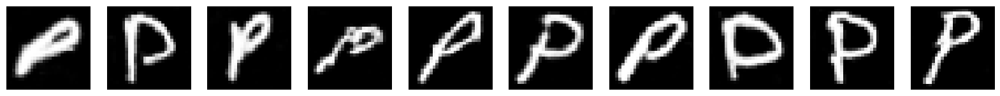

Epoch 500: D Accuracy = 0.9167
27/27 [==============================] - 1s 40ms/step - d_loss: 0.7533 - g_loss: 2.4542 - d_accuracy: 0.8725
Training DCGAN for class 12...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8882 - g_loss: 1.8474 - d_accuracy: 0.8396
Epoch 1: Generator loss improved from inf to 1.0031. Saving weights.
Epoch 1: D Accuracy = 0.7617
27/27 [==============================] - 2s 43ms/step - d_loss: 0.8968 - g_loss: 1.8173 - d_accuracy: 0.8368
Epoch 2/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9253 - g_loss: 2.2076 - d_accuracy: 0.8307
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1702 - g_loss: 1.4073 - d_accuracy: 0.7212
Epoch 4/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2051 - g_loss: 1.1947 - d_accuracy: 0.6972
Epoch 4: Generator loss improved from 1.0031 to 0.9042. Saving weights.
Epoch 4: D Accuracy = 0.6916
27/27 [==============================] - 1s 35m

Epoch 31/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0965 - g_loss: 1.3498 - d_accuracy: 0.7373
Epoch 32/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0902 - g_loss: 1.3674 - d_accuracy: 0.7337
Epoch 33/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1080 - g_loss: 1.4012 - d_accuracy: 0.7319
Epoch 34/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0668 - g_loss: 1.3762 - d_accuracy: 0.7555
Epoch 35/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1306 - g_loss: 1.3535 - d_accuracy: 0.7267
Epoch 36/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0847 - g_loss: 1.3352 - d_accuracy: 0.7456
Epoch 37/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0882 - g_loss: 1.3615 - d_accuracy: 0.7417
Epoch 38/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0911 - g_loss: 1.3580 - d_accuracy: 0.7376
Epoch 39/500
27/27 [====

27/27 [==============================] - 1s 36ms/step - d_loss: 1.1096 - g_loss: 1.3399 - d_accuracy: 0.7249
Epoch 64/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1125 - g_loss: 1.3496 - d_accuracy: 0.7284
Epoch 65/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1266 - g_loss: 1.3756 - d_accuracy: 0.7181
Epoch 66/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1113 - g_loss: 1.3228 - d_accuracy: 0.7287
Epoch 67/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1209 - g_loss: 1.3289 - d_accuracy: 0.7257
Epoch 68/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1160 - g_loss: 1.3190 - d_accuracy: 0.7222
Epoch 69/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1391 - g_loss: 1.3111 - d_accuracy: 0.7181
Epoch 70/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.0943 - g_loss: 1.3319 - d_accuracy: 0.7411
Epoch 71/500
27/27 [=================

27/27 [==============================] - 1s 35ms/step - d_loss: 1.0806 - g_loss: 1.3587 - d_accuracy: 0.7438
Epoch 96/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1086 - g_loss: 1.3788 - d_accuracy: 0.7258
Epoch 97/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1111 - g_loss: 1.3507 - d_accuracy: 0.7331
Epoch 98/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0994 - g_loss: 1.3916 - d_accuracy: 0.7342
Epoch 99/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1262 - g_loss: 1.3309 - d_accuracy: 0.7222
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0953 - g_loss: 1.3742 - d_accuracy: 0.7380
Class 12 — Epoch 100 preview:


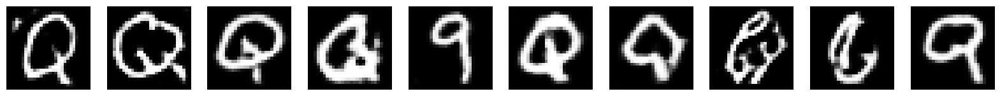

Epoch 100: D Accuracy = 0.7430
27/27 [==============================] - 1s 40ms/step - d_loss: 1.0975 - g_loss: 1.3553 - d_accuracy: 0.7382
Epoch 101/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0883 - g_loss: 1.3244 - d_accuracy: 0.7402
Epoch 102/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1353 - g_loss: 1.3640 - d_accuracy: 0.7138
Epoch 103/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1018 - g_loss: 1.3405 - d_accuracy: 0.7358
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1221 - g_loss: 1.3994 - d_accuracy: 0.7205
Epoch 105/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0767 - g_loss: 1.3290 - d_accuracy: 0.7476
Epoch 106/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0824 - g_loss: 1.3956 - d_accuracy: 0.7412
Epoch 107/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0752 - g_loss: 1.4036 - d_accuracy: 0.7401

27/27 [==============================] - 1s 37ms/step - d_loss: 1.1193 - g_loss: 1.4202 - d_accuracy: 0.7214
Epoch 133/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0143 - g_loss: 1.4473 - d_accuracy: 0.7762
Epoch 134/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0934 - g_loss: 1.4004 - d_accuracy: 0.7353
Epoch 135/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0583 - g_loss: 1.4295 - d_accuracy: 0.7540
Epoch 136/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0617 - g_loss: 1.4599 - d_accuracy: 0.7407
Epoch 137/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0410 - g_loss: 1.4602 - d_accuracy: 0.7616
Epoch 138/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0632 - g_loss: 1.4187 - d_accuracy: 0.7565
Epoch 139/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0640 - g_loss: 1.4388 - d_accuracy: 0.7478
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0616 - g_loss: 1.4621 - d_accuracy: 0.7514
Epoch 165/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0404 - g_loss: 1.5050 - d_accuracy: 0.7541
Epoch 166/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0263 - g_loss: 1.5161 - d_accuracy: 0.7646
Epoch 167/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0587 - g_loss: 1.4742 - d_accuracy: 0.7531
Epoch 168/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0348 - g_loss: 1.5776 - d_accuracy: 0.7640
Epoch 169/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0431 - g_loss: 1.4667 - d_accuracy: 0.7616
Epoch 170/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0548 - g_loss: 1.5373 - d_accuracy: 0.7507
Epoch 171/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0193 - g_loss: 1.5446 - d_accuracy: 0.7753
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9753 - g_loss: 1.5553 - d_accuracy: 0.7937
Epoch 197/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9596 - g_loss: 1.5947 - d_accuracy: 0.8005
Epoch 198/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0210 - g_loss: 1.6786 - d_accuracy: 0.7691
Epoch 199/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9761 - g_loss: 1.6155 - d_accuracy: 0.7901
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0125 - g_loss: 1.6339 - d_accuracy: 0.7699
Class 12 — Epoch 200 preview:


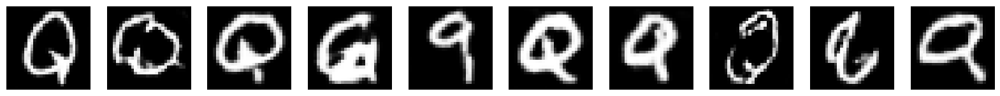

Epoch 200: D Accuracy = 0.8271
27/27 [==============================] - 1s 40ms/step - d_loss: 1.0095 - g_loss: 1.6280 - d_accuracy: 0.7720
Epoch 201/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0039 - g_loss: 1.6375 - d_accuracy: 0.7734
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0007 - g_loss: 1.6207 - d_accuracy: 0.7730
Epoch 203/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0041 - g_loss: 1.5984 - d_accuracy: 0.7752
Epoch 204/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0287 - g_loss: 1.6121 - d_accuracy: 0.7612
Epoch 205/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.9725 - g_loss: 1.5826 - d_accuracy: 0.7917
Epoch 206/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0037 - g_loss: 1.6102 - d_accuracy: 0.7723
Epoch 207/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0031 - g_loss: 1.6255 - d_accuracy: 0.7716

27/27 [==============================] - 1s 36ms/step - d_loss: 0.9382 - g_loss: 1.7148 - d_accuracy: 0.8020
Epoch 233/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9498 - g_loss: 1.7257 - d_accuracy: 0.7959
Epoch 234/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9463 - g_loss: 1.7223 - d_accuracy: 0.8030
Epoch 235/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9825 - g_loss: 1.7483 - d_accuracy: 0.7829
Epoch 236/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9471 - g_loss: 1.7048 - d_accuracy: 0.7977
Epoch 237/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9523 - g_loss: 1.7160 - d_accuracy: 0.7964
Epoch 238/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9842 - g_loss: 1.7557 - d_accuracy: 0.7767
Epoch 239/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9378 - g_loss: 1.7284 - d_accuracy: 0.8028
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9186 - g_loss: 1.7799 - d_accuracy: 0.8176
Epoch 265/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9033 - g_loss: 1.7901 - d_accuracy: 0.8209
Epoch 266/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.9635 - g_loss: 1.8049 - d_accuracy: 0.7849
Epoch 267/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9022 - g_loss: 1.7741 - d_accuracy: 0.8204
Epoch 268/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9163 - g_loss: 1.7824 - d_accuracy: 0.8156
Epoch 269/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9105 - g_loss: 1.8198 - d_accuracy: 0.8149
Epoch 270/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8993 - g_loss: 1.8053 - d_accuracy: 0.8212
Epoch 271/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9593 - g_loss: 1.8100 - d_accuracy: 0.7894
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9178 - g_loss: 1.9031 - d_accuracy: 0.8133
Epoch 297/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9207 - g_loss: 1.8692 - d_accuracy: 0.8080
Epoch 298/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9155 - g_loss: 1.9002 - d_accuracy: 0.8090
Epoch 299/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8681 - g_loss: 1.8601 - d_accuracy: 0.8336
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8984 - g_loss: 1.9625 - d_accuracy: 0.8165
Class 12 — Epoch 300 preview:


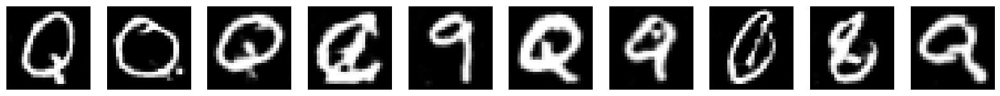

Epoch 300: D Accuracy = 0.7477
27/27 [==============================] - 1s 40ms/step - d_loss: 0.8998 - g_loss: 1.9746 - d_accuracy: 0.8140
Epoch 301/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8926 - g_loss: 1.9234 - d_accuracy: 0.8226
Epoch 302/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9340 - g_loss: 1.9118 - d_accuracy: 0.8070
Epoch 303/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8592 - g_loss: 1.9419 - d_accuracy: 0.8378
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9192 - g_loss: 1.9353 - d_accuracy: 0.8103
Epoch 305/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9074 - g_loss: 1.9225 - d_accuracy: 0.8151
Epoch 306/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9067 - g_loss: 1.8534 - d_accuracy: 0.8215
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8623 - g_loss: 1.9989 - d_accuracy: 0.8315

27/27 [==============================] - 1s 36ms/step - d_loss: 0.8430 - g_loss: 1.9802 - d_accuracy: 0.8417
Epoch 333/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8798 - g_loss: 2.0136 - d_accuracy: 0.8277
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8422 - g_loss: 2.0105 - d_accuracy: 0.8434
Epoch 335/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8474 - g_loss: 2.0064 - d_accuracy: 0.8397
Epoch 336/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8507 - g_loss: 2.0397 - d_accuracy: 0.8394
Epoch 337/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8895 - g_loss: 2.0163 - d_accuracy: 0.8221
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8998 - g_loss: 2.0558 - d_accuracy: 0.8132
Epoch 339/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8326 - g_loss: 1.9828 - d_accuracy: 0.8511
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8211 - g_loss: 2.1350 - d_accuracy: 0.8486
Epoch 365/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8201 - g_loss: 2.0842 - d_accuracy: 0.8547
Epoch 366/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8342 - g_loss: 2.1043 - d_accuracy: 0.8427
Epoch 367/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8308 - g_loss: 2.1759 - d_accuracy: 0.8403
Epoch 368/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8319 - g_loss: 2.1832 - d_accuracy: 0.8408
Epoch 369/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1615 - g_loss: 2.1770 - d_accuracy: 0.7721
Epoch 370/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8424 - g_loss: 2.0288 - d_accuracy: 0.8414
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8379 - g_loss: 2.0695 - d_accuracy: 0.8416
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8230 - g_loss: 2.2871 - d_accuracy: 0.8437
Epoch 397/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8070 - g_loss: 2.2056 - d_accuracy: 0.8559
Epoch 398/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8344 - g_loss: 2.2472 - d_accuracy: 0.8442
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8132 - g_loss: 2.1891 - d_accuracy: 0.8548
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8056 - g_loss: 2.2229 - d_accuracy: 0.8521
Class 12 — Epoch 400 preview:


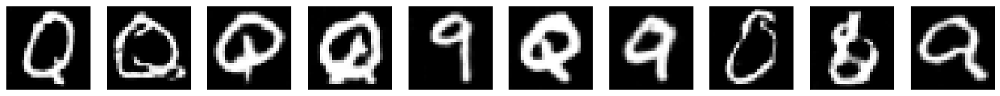

Epoch 400: D Accuracy = 0.8505
27/27 [==============================] - 1s 40ms/step - d_loss: 0.8079 - g_loss: 2.2008 - d_accuracy: 0.8520
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8492 - g_loss: 2.2625 - d_accuracy: 0.8313
Epoch 402/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7852 - g_loss: 2.2333 - d_accuracy: 0.8667
Epoch 403/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7833 - g_loss: 2.3031 - d_accuracy: 0.8677
Epoch 404/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8288 - g_loss: 2.1932 - d_accuracy: 0.8509
Epoch 405/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.8050 - g_loss: 2.2552 - d_accuracy: 0.8581
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8004 - g_loss: 2.2980 - d_accuracy: 0.8512
Epoch 407/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7922 - g_loss: 2.2394 - d_accuracy: 0.8633

27/27 [==============================] - 1s 35ms/step - d_loss: 0.8483 - g_loss: 2.3551 - d_accuracy: 0.8402
Epoch 433/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7649 - g_loss: 2.3436 - d_accuracy: 0.8648
Epoch 434/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7999 - g_loss: 2.3138 - d_accuracy: 0.8536
Epoch 435/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7542 - g_loss: 2.4031 - d_accuracy: 0.8745
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7608 - g_loss: 2.3748 - d_accuracy: 0.8727
Epoch 437/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7910 - g_loss: 2.3305 - d_accuracy: 0.8601
Epoch 438/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7698 - g_loss: 2.3965 - d_accuracy: 0.8682
Epoch 439/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7467 - g_loss: 2.3296 - d_accuracy: 0.8856
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7968 - g_loss: 2.3899 - d_accuracy: 0.8591
Epoch 465/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7300 - g_loss: 2.5030 - d_accuracy: 0.8876
Epoch 466/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7346 - g_loss: 2.4404 - d_accuracy: 0.8805
Epoch 467/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7327 - g_loss: 2.4623 - d_accuracy: 0.8801
Epoch 468/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7368 - g_loss: 2.4551 - d_accuracy: 0.8832
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7413 - g_loss: 2.4853 - d_accuracy: 0.8789
Epoch 470/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7822 - g_loss: 2.4342 - d_accuracy: 0.8657
Epoch 471/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7929 - g_loss: 2.4162 - d_accuracy: 0.8612
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7301 - g_loss: 2.6533 - d_accuracy: 0.8794
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7177 - g_loss: 2.5407 - d_accuracy: 0.8918
Epoch 498/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7516 - g_loss: 2.5591 - d_accuracy: 0.8750
Epoch 499/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7686 - g_loss: 2.6026 - d_accuracy: 0.8647
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.6934 - g_loss: 2.5738 - d_accuracy: 0.9005
Class 12 — Epoch 500 preview:


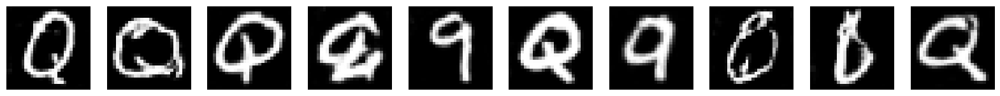

Epoch 500: D Accuracy = 0.9112
27/27 [==============================] - 1s 47ms/step - d_loss: 0.6917 - g_loss: 2.5850 - d_accuracy: 0.9009
Training DCGAN for class 13...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8286 - g_loss: 2.2104 - d_accuracy: 0.8594
Epoch 1: Generator loss improved from inf to 2.7542. Saving weights.
Epoch 1: D Accuracy = 0.9120
27/27 [==============================] - 2s 43ms/step - d_loss: 0.8243 - g_loss: 2.2298 - d_accuracy: 0.8613
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0819 - g_loss: 1.7710 - d_accuracy: 0.7656
Epoch 2: Generator loss improved from 2.7542 to 1.2114. Saving weights.
Epoch 2: D Accuracy = 0.7500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0835 - g_loss: 1.7510 - d_accuracy: 0.7651
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1115 - g_loss: 1.4324 - d_accuracy: 0.7449
Epoch 4/500
27/27 [==============================] - ETA: 0

27/27 [==============================] - 1s 37ms/step - d_loss: 1.0515 - g_loss: 1.4308 - d_accuracy: 0.7550
Epoch 31/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0837 - g_loss: 1.4537 - d_accuracy: 0.7381
Epoch 32/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0754 - g_loss: 1.4506 - d_accuracy: 0.7395
Epoch 33/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0698 - g_loss: 1.4526 - d_accuracy: 0.7479
Epoch 34/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0580 - g_loss: 1.3865 - d_accuracy: 0.7505
Epoch 35/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0838 - g_loss: 1.4320 - d_accuracy: 0.7412
Epoch 36/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0834 - g_loss: 1.3990 - d_accuracy: 0.7480
Epoch 37/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0867 - g_loss: 1.4304 - d_accuracy: 0.7392
Epoch 38/500
27/27 [=================

27/27 [==============================] - 1s 34ms/step - d_loss: 1.1307 - g_loss: 1.2980 - d_accuracy: 0.7230
Epoch 63/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1685 - g_loss: 1.2931 - d_accuracy: 0.7008
Epoch 64/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1563 - g_loss: 1.3194 - d_accuracy: 0.7079
Epoch 65/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1384 - g_loss: 1.2658 - d_accuracy: 0.7121
Epoch 66/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1547 - g_loss: 1.2838 - d_accuracy: 0.7057
Epoch 67/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1763 - g_loss: 1.2354 - d_accuracy: 0.6950
Epoch 68/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1526 - g_loss: 1.2449 - d_accuracy: 0.7015
Epoch 69/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1354 - g_loss: 1.2353 - d_accuracy: 0.7087
Epoch 70/500
27/27 [=================

Epoch 94/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1899 - g_loss: 1.1880 - d_accuracy: 0.6814
Epoch 95/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1858 - g_loss: 1.1813 - d_accuracy: 0.6800
Epoch 96/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1965 - g_loss: 1.1660 - d_accuracy: 0.6795
Epoch 97/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1906 - g_loss: 1.1698 - d_accuracy: 0.6789
Epoch 98/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1770 - g_loss: 1.1856 - d_accuracy: 0.6772
Epoch 99/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2135 - g_loss: 1.1654 - d_accuracy: 0.6782
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1993 - g_loss: 1.1796 - d_accuracy: 0.6808
Class 13 — Epoch 100 preview:


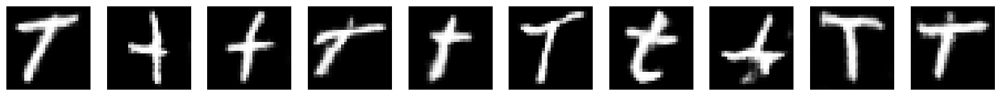

Epoch 100: D Accuracy = 0.6852
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2015 - g_loss: 1.1653 - d_accuracy: 0.6809
Epoch 101/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1846 - g_loss: 1.1735 - d_accuracy: 0.6872
Epoch 102/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2085 - g_loss: 1.1721 - d_accuracy: 0.6792
Epoch 103/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1927 - g_loss: 1.2075 - d_accuracy: 0.6815
Epoch 104/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1807 - g_loss: 1.1755 - d_accuracy: 0.6901
Epoch 105/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1969 - g_loss: 1.1875 - d_accuracy: 0.6786
Epoch 106/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1811 - g_loss: 1.1648 - d_accuracy: 0.6895
Epoch 107/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1751 - g_loss: 1.1780 - d_accuracy: 0.6892

27/27 [==============================] - 1s 34ms/step - d_loss: 1.1872 - g_loss: 1.2492 - d_accuracy: 0.6869
Epoch 133/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1777 - g_loss: 1.2194 - d_accuracy: 0.6978
Epoch 134/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1588 - g_loss: 1.2128 - d_accuracy: 0.6961
Epoch 135/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1558 - g_loss: 1.2203 - d_accuracy: 0.7070
Epoch 136/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1443 - g_loss: 1.2144 - d_accuracy: 0.7111
Epoch 137/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1624 - g_loss: 1.2465 - d_accuracy: 0.6982
Epoch 138/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1423 - g_loss: 1.2483 - d_accuracy: 0.7076
Epoch 139/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1765 - g_loss: 1.2459 - d_accuracy: 0.6881
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1212 - g_loss: 1.3588 - d_accuracy: 0.7125
Epoch 165/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0959 - g_loss: 1.3299 - d_accuracy: 0.7266
Epoch 166/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1207 - g_loss: 1.2762 - d_accuracy: 0.7283
Epoch 167/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1250 - g_loss: 1.3255 - d_accuracy: 0.7148
Epoch 168/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1290 - g_loss: 1.3238 - d_accuracy: 0.7135
Epoch 169/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1230 - g_loss: 1.3561 - d_accuracy: 0.7143
Epoch 170/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1189 - g_loss: 1.2927 - d_accuracy: 0.7214
Epoch 171/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1156 - g_loss: 1.3354 - d_accuracy: 0.7214
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0578 - g_loss: 1.4188 - d_accuracy: 0.7512
Epoch 197/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0604 - g_loss: 1.3965 - d_accuracy: 0.7510
Epoch 198/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0724 - g_loss: 1.4613 - d_accuracy: 0.7418
Epoch 199/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0518 - g_loss: 1.3973 - d_accuracy: 0.7549
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0651 - g_loss: 1.4584 - d_accuracy: 0.7428
Class 13 — Epoch 200 preview:


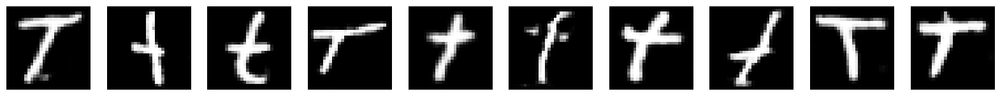

Epoch 200: D Accuracy = 0.8102
27/27 [==============================] - 1s 40ms/step - d_loss: 1.0628 - g_loss: 1.4532 - d_accuracy: 0.7452
Epoch 201/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0184 - g_loss: 1.5026 - d_accuracy: 0.7668
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0774 - g_loss: 1.4196 - d_accuracy: 0.7436
Epoch 203/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0556 - g_loss: 1.4419 - d_accuracy: 0.7558
Epoch 204/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0293 - g_loss: 1.4250 - d_accuracy: 0.7659
Epoch 205/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0410 - g_loss: 1.4738 - d_accuracy: 0.7606
Epoch 206/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0661 - g_loss: 1.4935 - d_accuracy: 0.7479
Epoch 207/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0285 - g_loss: 1.4966 - d_accuracy: 0.7634

27/27 [==============================] - 1s 34ms/step - d_loss: 0.9764 - g_loss: 1.5904 - d_accuracy: 0.7935
Epoch 233/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0190 - g_loss: 1.5670 - d_accuracy: 0.7654
Epoch 234/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9855 - g_loss: 1.5614 - d_accuracy: 0.7885
Epoch 235/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0069 - g_loss: 1.5747 - d_accuracy: 0.7775
Epoch 236/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0108 - g_loss: 1.5879 - d_accuracy: 0.7724
Epoch 237/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9854 - g_loss: 1.5629 - d_accuracy: 0.7839
Epoch 238/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9802 - g_loss: 1.6117 - d_accuracy: 0.7896
Epoch 239/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9902 - g_loss: 1.6106 - d_accuracy: 0.7837
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9399 - g_loss: 1.7031 - d_accuracy: 0.8067
Epoch 265/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9603 - g_loss: 1.7071 - d_accuracy: 0.7905
Epoch 266/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9544 - g_loss: 1.6687 - d_accuracy: 0.8013
Epoch 267/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9734 - g_loss: 1.6945 - d_accuracy: 0.7863
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9401 - g_loss: 1.6910 - d_accuracy: 0.8087
Epoch 269/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9354 - g_loss: 1.7480 - d_accuracy: 0.8051
Epoch 270/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9510 - g_loss: 1.7361 - d_accuracy: 0.8019
Epoch 271/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.9395 - g_loss: 1.7242 - d_accuracy: 0.8077
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8740 - g_loss: 1.8673 - d_accuracy: 0.8262
Epoch 297/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8717 - g_loss: 1.8308 - d_accuracy: 0.8365
Epoch 298/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9123 - g_loss: 1.9173 - d_accuracy: 0.8090
Epoch 299/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8945 - g_loss: 1.8447 - d_accuracy: 0.8239
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8739 - g_loss: 1.8605 - d_accuracy: 0.8333
Class 13 — Epoch 300 preview:


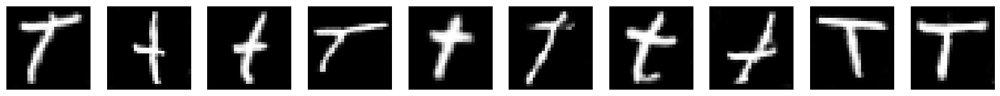

Epoch 300: D Accuracy = 0.7731
27/27 [==============================] - 1s 41ms/step - d_loss: 0.8759 - g_loss: 1.8728 - d_accuracy: 0.8312
Epoch 301/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8983 - g_loss: 1.8709 - d_accuracy: 0.8251
Epoch 302/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8684 - g_loss: 1.8822 - d_accuracy: 0.8358
Epoch 303/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8656 - g_loss: 1.9025 - d_accuracy: 0.8369
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8825 - g_loss: 1.8905 - d_accuracy: 0.8284
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9077 - g_loss: 1.9201 - d_accuracy: 0.8104
Epoch 306/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8643 - g_loss: 1.8614 - d_accuracy: 0.8380
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8540 - g_loss: 1.9379 - d_accuracy: 0.8378

27/27 [==============================] - 1s 35ms/step - d_loss: 0.9036 - g_loss: 2.0726 - d_accuracy: 0.8151
Epoch 333/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8427 - g_loss: 2.0293 - d_accuracy: 0.8402
Epoch 334/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.8164 - g_loss: 2.0450 - d_accuracy: 0.8560
Epoch 335/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8335 - g_loss: 2.1035 - d_accuracy: 0.8417
Epoch 336/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8738 - g_loss: 2.0516 - d_accuracy: 0.8287
Epoch 337/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8810 - g_loss: 1.9887 - d_accuracy: 0.8268
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8252 - g_loss: 2.0531 - d_accuracy: 0.8551
Epoch 339/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8390 - g_loss: 2.0550 - d_accuracy: 0.8489
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8285 - g_loss: 2.1640 - d_accuracy: 0.8456
Epoch 365/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8054 - g_loss: 2.2229 - d_accuracy: 0.8556
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8084 - g_loss: 2.2113 - d_accuracy: 0.8551
Epoch 367/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8120 - g_loss: 2.1722 - d_accuracy: 0.8491
Epoch 368/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7875 - g_loss: 2.2083 - d_accuracy: 0.8654
Epoch 369/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8015 - g_loss: 2.1792 - d_accuracy: 0.8600
Epoch 370/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8119 - g_loss: 2.1829 - d_accuracy: 0.8518
Epoch 371/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8048 - g_loss: 2.2603 - d_accuracy: 0.8462
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7501 - g_loss: 2.2887 - d_accuracy: 0.8832
Epoch 397/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7651 - g_loss: 2.3547 - d_accuracy: 0.8727
Epoch 398/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8211 - g_loss: 2.3510 - d_accuracy: 0.8487
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7767 - g_loss: 2.3229 - d_accuracy: 0.8652
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7593 - g_loss: 2.3019 - d_accuracy: 0.8683
Class 13 — Epoch 400 preview:


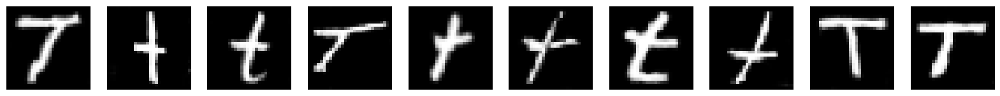

Epoch 400: D Accuracy = 0.8472
27/27 [==============================] - 1s 41ms/step - d_loss: 0.7594 - g_loss: 2.3081 - d_accuracy: 0.8676
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7706 - g_loss: 2.3319 - d_accuracy: 0.8701
Epoch 402/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7670 - g_loss: 2.3250 - d_accuracy: 0.8728
Epoch 403/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8153 - g_loss: 2.3994 - d_accuracy: 0.8466
Epoch 404/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7593 - g_loss: 2.3187 - d_accuracy: 0.8760
Epoch 405/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7695 - g_loss: 2.3592 - d_accuracy: 0.8697
Epoch 406/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.7519 - g_loss: 2.3552 - d_accuracy: 0.8756
Epoch 407/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7210 - g_loss: 2.4070 - d_accuracy: 0.8913

27/27 [==============================] - 1s 36ms/step - d_loss: 0.7350 - g_loss: 2.4837 - d_accuracy: 0.8852
Epoch 433/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7700 - g_loss: 2.5093 - d_accuracy: 0.8640
Epoch 434/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8031 - g_loss: 2.4256 - d_accuracy: 0.8558
Epoch 435/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7955 - g_loss: 2.4868 - d_accuracy: 0.8546
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7599 - g_loss: 2.4293 - d_accuracy: 0.8745
Epoch 437/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7242 - g_loss: 2.4833 - d_accuracy: 0.8843
Epoch 438/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7442 - g_loss: 2.5073 - d_accuracy: 0.8796
Epoch 439/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7747 - g_loss: 2.4401 - d_accuracy: 0.8684
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7080 - g_loss: 2.6036 - d_accuracy: 0.8921
Epoch 465/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7429 - g_loss: 2.5427 - d_accuracy: 0.8740
Epoch 466/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7419 - g_loss: 2.6105 - d_accuracy: 0.8768
Epoch 467/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7345 - g_loss: 2.6143 - d_accuracy: 0.8802
Epoch 468/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7407 - g_loss: 2.5197 - d_accuracy: 0.8790
Epoch 469/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.7131 - g_loss: 2.5917 - d_accuracy: 0.8934
Epoch 470/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7249 - g_loss: 2.5692 - d_accuracy: 0.8846
Epoch 471/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.6920 - g_loss: 2.6330 - d_accuracy: 0.8991
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.6718 - g_loss: 2.7392 - d_accuracy: 0.9022
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.6872 - g_loss: 2.6826 - d_accuracy: 0.9001
Epoch 498/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.6673 - g_loss: 2.7837 - d_accuracy: 0.9085
Epoch 499/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7006 - g_loss: 2.7930 - d_accuracy: 0.8955
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.6898 - g_loss: 2.7275 - d_accuracy: 0.8976
Class 13 — Epoch 500 preview:


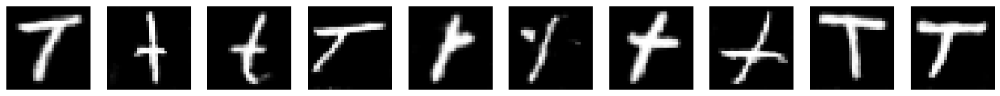

Epoch 500: D Accuracy = 0.9120
27/27 [==============================] - 1s 41ms/step - d_loss: 0.6893 - g_loss: 2.7239 - d_accuracy: 0.8982
Training DCGAN for class 14...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7021 - g_loss: 2.5655 - d_accuracy: 0.9056
Epoch 1: Generator loss improved from inf to 3.9383. Saving weights.
Epoch 1: D Accuracy = 0.8194
27/27 [==============================] - 2s 35ms/step - d_loss: 0.7038 - g_loss: 2.6145 - d_accuracy: 0.9026
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8725 - g_loss: 2.2687 - d_accuracy: 0.8503
Epoch 2: Generator loss improved from 3.9383 to 2.0622. Saving weights.
Epoch 2: D Accuracy = 0.9352
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8668 - g_loss: 2.2613 - d_accuracy: 0.8534
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.5472 - g_loss: 3.0837 - d_accuracy: 0.9566
Epoch 4/500
27/27 [==============================] - ETA: 0

Epoch 30/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1303 - g_loss: 1.3145 - d_accuracy: 0.7228
Epoch 31/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1118 - g_loss: 1.2870 - d_accuracy: 0.7314
Epoch 32/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1085 - g_loss: 1.3219 - d_accuracy: 0.7279
Epoch 33/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1212 - g_loss: 1.3251 - d_accuracy: 0.7339
Epoch 34/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1161 - g_loss: 1.3328 - d_accuracy: 0.7285
Epoch 35/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1048 - g_loss: 1.3081 - d_accuracy: 0.7343
Epoch 36/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0908 - g_loss: 1.3281 - d_accuracy: 0.7391
Epoch 37/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1243 - g_loss: 1.3117 - d_accuracy: 0.7294
Epoch 38/500
27/27 [====

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2240 - g_loss: 1.1498 - d_accuracy: 0.6704
Epoch 63/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2224 - g_loss: 1.1925 - d_accuracy: 0.6686
Epoch 64/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2033 - g_loss: 1.1445 - d_accuracy: 0.6774
Epoch 65/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2158 - g_loss: 1.1368 - d_accuracy: 0.6776
Epoch 66/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2000 - g_loss: 1.1253 - d_accuracy: 0.6795
Epoch 67/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2025 - g_loss: 1.1475 - d_accuracy: 0.6784
Epoch 68/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1982 - g_loss: 1.1467 - d_accuracy: 0.6772
Epoch 69/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2159 - g_loss: 1.1245 - d_accuracy: 0.6716
Epoch 70/500
27/27 [=================

27/27 [==============================] - 1s 36ms/step - d_loss: 1.2188 - g_loss: 1.1044 - d_accuracy: 0.6721
Epoch 95/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1988 - g_loss: 1.1302 - d_accuracy: 0.6806
Epoch 96/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2135 - g_loss: 1.1166 - d_accuracy: 0.6691
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1779 - g_loss: 1.1206 - d_accuracy: 0.6937
Epoch 98/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2324 - g_loss: 1.1234 - d_accuracy: 0.6595
Epoch 99/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2105 - g_loss: 1.1143 - d_accuracy: 0.6672
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1893 - g_loss: 1.1386 - d_accuracy: 0.6820
Class 14 — Epoch 100 preview:


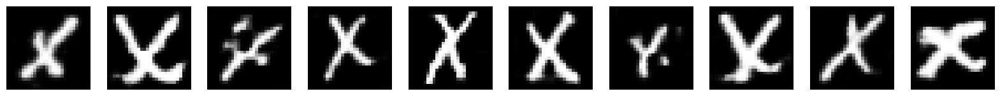

Epoch 100: D Accuracy = 0.6667
27/27 [==============================] - 1s 42ms/step - d_loss: 1.1899 - g_loss: 1.1411 - d_accuracy: 0.6814
Epoch 101/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2116 - g_loss: 1.1103 - d_accuracy: 0.6737
Epoch 102/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1773 - g_loss: 1.1538 - d_accuracy: 0.6861
Epoch 103/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2105 - g_loss: 1.1295 - d_accuracy: 0.6658
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2290 - g_loss: 1.1815 - d_accuracy: 0.6625
Epoch 105/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2000 - g_loss: 1.1070 - d_accuracy: 0.6788
Epoch 106/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2004 - g_loss: 1.1267 - d_accuracy: 0.6765
Epoch 107/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2088 - g_loss: 1.1609 - d_accuracy: 0.6760

27/27 [==============================] - 1s 35ms/step - d_loss: 1.1976 - g_loss: 1.1548 - d_accuracy: 0.6774
Epoch 133/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1675 - g_loss: 1.1614 - d_accuracy: 0.7004
Epoch 134/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1847 - g_loss: 1.1762 - d_accuracy: 0.6929
Epoch 135/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1621 - g_loss: 1.1494 - d_accuracy: 0.7023
Epoch 136/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1989 - g_loss: 1.1932 - d_accuracy: 0.6788
Epoch 137/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2002 - g_loss: 1.2204 - d_accuracy: 0.6720
Epoch 138/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1729 - g_loss: 1.1388 - d_accuracy: 0.6956
Epoch 139/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1853 - g_loss: 1.1606 - d_accuracy: 0.6855
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1643 - g_loss: 1.2233 - d_accuracy: 0.6971
Epoch 165/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1283 - g_loss: 1.2250 - d_accuracy: 0.7255
Epoch 166/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1144 - g_loss: 1.2488 - d_accuracy: 0.7237
Epoch 167/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1427 - g_loss: 1.3007 - d_accuracy: 0.7046
Epoch 168/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1452 - g_loss: 1.2518 - d_accuracy: 0.7069
Epoch 169/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1378 - g_loss: 1.2337 - d_accuracy: 0.7193
Epoch 170/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1096 - g_loss: 1.2677 - d_accuracy: 0.7344
Epoch 171/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1324 - g_loss: 1.2745 - d_accuracy: 0.7102
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1121 - g_loss: 1.3147 - d_accuracy: 0.7277
Epoch 197/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0494 - g_loss: 1.3857 - d_accuracy: 0.7583
Epoch 198/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0804 - g_loss: 1.3559 - d_accuracy: 0.7409
Epoch 199/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1094 - g_loss: 1.3791 - d_accuracy: 0.7245
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0542 - g_loss: 1.3861 - d_accuracy: 0.7496
Class 14 — Epoch 200 preview:


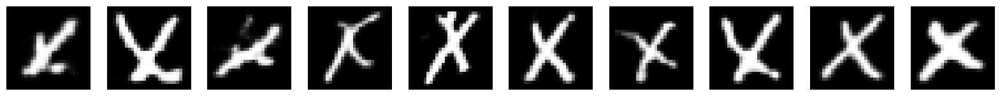

Epoch 200: D Accuracy = 0.7546
27/27 [==============================] - 1s 46ms/step - d_loss: 1.0561 - g_loss: 1.3732 - d_accuracy: 0.7498
Epoch 201/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0615 - g_loss: 1.4314 - d_accuracy: 0.7435
Epoch 202/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0630 - g_loss: 1.3671 - d_accuracy: 0.7553
Epoch 203/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0778 - g_loss: 1.4007 - d_accuracy: 0.7457
Epoch 204/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0697 - g_loss: 1.3547 - d_accuracy: 0.7520
Epoch 205/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0424 - g_loss: 1.4143 - d_accuracy: 0.7676
Epoch 206/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0810 - g_loss: 1.4609 - d_accuracy: 0.7417
Epoch 207/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0701 - g_loss: 1.3890 - d_accuracy: 0.7484

27/27 [==============================] - 1s 36ms/step - d_loss: 1.0227 - g_loss: 1.5586 - d_accuracy: 0.7600
Epoch 233/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0352 - g_loss: 1.4836 - d_accuracy: 0.7670
Epoch 234/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9975 - g_loss: 1.5521 - d_accuracy: 0.7858
Epoch 235/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9989 - g_loss: 1.5375 - d_accuracy: 0.7841
Epoch 236/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0239 - g_loss: 1.5497 - d_accuracy: 0.7620
Epoch 237/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9913 - g_loss: 1.5471 - d_accuracy: 0.7804
Epoch 238/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0290 - g_loss: 1.5318 - d_accuracy: 0.7661
Epoch 239/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9816 - g_loss: 1.5752 - d_accuracy: 0.7855
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9440 - g_loss: 1.6564 - d_accuracy: 0.7999
Epoch 265/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9749 - g_loss: 1.6584 - d_accuracy: 0.7858
Epoch 266/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9819 - g_loss: 1.6699 - d_accuracy: 0.7794
Epoch 267/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9357 - g_loss: 1.6779 - d_accuracy: 0.8117
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9527 - g_loss: 1.6807 - d_accuracy: 0.7954
Epoch 269/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9498 - g_loss: 1.7076 - d_accuracy: 0.7978
Epoch 270/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9677 - g_loss: 1.6624 - d_accuracy: 0.7977
Epoch 271/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9544 - g_loss: 1.6602 - d_accuracy: 0.7954
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9104 - g_loss: 1.7793 - d_accuracy: 0.8143
Epoch 297/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9185 - g_loss: 1.7952 - d_accuracy: 0.8114
Epoch 298/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9163 - g_loss: 1.8333 - d_accuracy: 0.8113
Epoch 299/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9029 - g_loss: 1.7508 - d_accuracy: 0.8229
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9472 - g_loss: 1.8663 - d_accuracy: 0.7985
Class 14 — Epoch 300 preview:


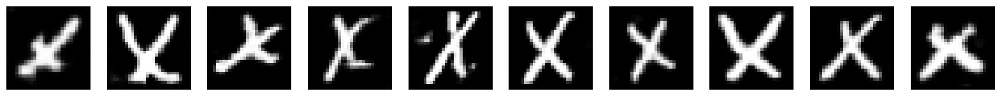

Epoch 300: D Accuracy = 0.7593
27/27 [==============================] - 1s 42ms/step - d_loss: 0.9461 - g_loss: 1.8694 - d_accuracy: 0.7971
Epoch 301/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9164 - g_loss: 1.7911 - d_accuracy: 0.8166
Epoch 302/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9485 - g_loss: 1.8285 - d_accuracy: 0.8014
Epoch 303/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9170 - g_loss: 1.8301 - d_accuracy: 0.8062
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8736 - g_loss: 1.8349 - d_accuracy: 0.8337
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9164 - g_loss: 1.8615 - d_accuracy: 0.8116
Epoch 306/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8960 - g_loss: 1.8256 - d_accuracy: 0.8270
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8901 - g_loss: 1.8890 - d_accuracy: 0.8250

27/27 [==============================] - 1s 35ms/step - d_loss: 0.8766 - g_loss: 1.9298 - d_accuracy: 0.8243
Epoch 333/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8583 - g_loss: 1.9418 - d_accuracy: 0.8405
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8581 - g_loss: 2.0385 - d_accuracy: 0.8374
Epoch 335/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8633 - g_loss: 1.9440 - d_accuracy: 0.8340
Epoch 336/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8475 - g_loss: 1.9596 - d_accuracy: 0.8426
Epoch 337/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8874 - g_loss: 1.9737 - d_accuracy: 0.8284
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8192 - g_loss: 2.0151 - d_accuracy: 0.8580
Epoch 339/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8786 - g_loss: 1.9860 - d_accuracy: 0.8275
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8268 - g_loss: 2.0746 - d_accuracy: 0.8506
Epoch 365/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8433 - g_loss: 2.1237 - d_accuracy: 0.8446
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8541 - g_loss: 2.1026 - d_accuracy: 0.8374
Epoch 367/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8494 - g_loss: 2.0965 - d_accuracy: 0.8372
Epoch 368/500
27/27 [==============================] - 1s 38ms/step - d_loss: 0.7999 - g_loss: 2.0930 - d_accuracy: 0.8651
Epoch 369/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7956 - g_loss: 2.1057 - d_accuracy: 0.8643
Epoch 370/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8329 - g_loss: 2.1609 - d_accuracy: 0.8411
Epoch 371/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8020 - g_loss: 2.0895 - d_accuracy: 0.8612
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7982 - g_loss: 2.2051 - d_accuracy: 0.8577
Epoch 397/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7877 - g_loss: 2.2294 - d_accuracy: 0.8675
Epoch 398/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8178 - g_loss: 2.2649 - d_accuracy: 0.8455
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7782 - g_loss: 2.2483 - d_accuracy: 0.8686
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8217 - g_loss: 2.2395 - d_accuracy: 0.8500
Class 14 — Epoch 400 preview:


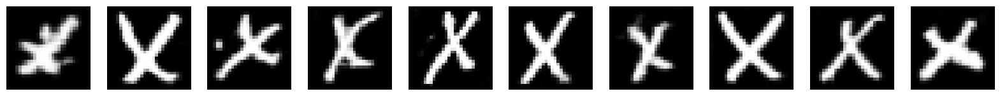

Epoch 400: D Accuracy = 0.7870
27/27 [==============================] - 1s 40ms/step - d_loss: 0.8255 - g_loss: 2.2203 - d_accuracy: 0.8478
Epoch 401/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7867 - g_loss: 2.2136 - d_accuracy: 0.8652
Epoch 402/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8218 - g_loss: 2.2563 - d_accuracy: 0.8493
Epoch 403/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7962 - g_loss: 2.2871 - d_accuracy: 0.8555
Epoch 404/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7779 - g_loss: 2.2394 - d_accuracy: 0.8727
Epoch 405/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7717 - g_loss: 2.2472 - d_accuracy: 0.8717
Epoch 406/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7798 - g_loss: 2.3626 - d_accuracy: 0.8646
Epoch 407/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7739 - g_loss: 2.3585 - d_accuracy: 0.8671

27/27 [==============================] - 1s 35ms/step - d_loss: 0.7564 - g_loss: 2.4248 - d_accuracy: 0.8710
Epoch 433/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7701 - g_loss: 2.3368 - d_accuracy: 0.8714
Epoch 434/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7396 - g_loss: 2.4109 - d_accuracy: 0.8837
Epoch 435/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7680 - g_loss: 2.4568 - d_accuracy: 0.8667
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7804 - g_loss: 2.3364 - d_accuracy: 0.8672
Epoch 437/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7766 - g_loss: 2.4236 - d_accuracy: 0.8670
Epoch 438/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7709 - g_loss: 2.3683 - d_accuracy: 0.8692
Epoch 439/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7188 - g_loss: 2.3694 - d_accuracy: 0.8927
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7707 - g_loss: 2.4707 - d_accuracy: 0.8657
Epoch 465/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7678 - g_loss: 2.4451 - d_accuracy: 0.8731
Epoch 466/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7846 - g_loss: 2.5245 - d_accuracy: 0.8602
Epoch 467/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7353 - g_loss: 2.4239 - d_accuracy: 0.8843
Epoch 468/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7389 - g_loss: 2.5259 - d_accuracy: 0.8777
Epoch 469/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7638 - g_loss: 2.4942 - d_accuracy: 0.8665
Epoch 470/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7594 - g_loss: 2.4920 - d_accuracy: 0.8720
Epoch 471/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.6870 - g_loss: 2.5272 - d_accuracy: 0.9062
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7613 - g_loss: 2.5838 - d_accuracy: 0.8710
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7067 - g_loss: 2.5367 - d_accuracy: 0.8936
Epoch 498/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.6976 - g_loss: 2.5856 - d_accuracy: 0.8994
Epoch 499/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7114 - g_loss: 2.6264 - d_accuracy: 0.8932
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7299 - g_loss: 2.5699 - d_accuracy: 0.8872
Class 14 — Epoch 500 preview:


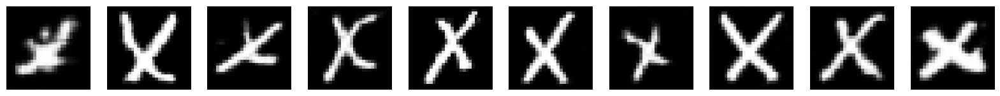

Epoch 500: D Accuracy = 0.9259
27/27 [==============================] - 1s 41ms/step - d_loss: 0.7254 - g_loss: 2.5903 - d_accuracy: 0.8885
Training DCGAN for class 15...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7855 - g_loss: 2.1492 - d_accuracy: 0.8757
Epoch 1: Generator loss improved from inf to 2.5944. Saving weights.
Epoch 1: D Accuracy = 0.8980
27/27 [==============================] - 2s 43ms/step - d_loss: 0.7847 - g_loss: 2.1651 - d_accuracy: 0.8765
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9159 - g_loss: 2.1902 - d_accuracy: 0.8473
Epoch 2: Generator loss improved from 2.5944 to 1.5809. Saving weights.
Epoch 2: D Accuracy = 0.8469
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9158 - g_loss: 2.1684 - d_accuracy: 0.8473
Epoch 3/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0913 - g_loss: 1.5381 - d_accuracy: 0.7526
Epoch 3: Generator loss improved from 1.5809 to 1.2865. Saving w

27/27 [==============================] - 1s 36ms/step - d_loss: 1.0927 - g_loss: 1.3560 - d_accuracy: 0.7392
Epoch 30/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1445 - g_loss: 1.3124 - d_accuracy: 0.7172
Epoch 31/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1282 - g_loss: 1.2737 - d_accuracy: 0.7186
Epoch 32/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1478 - g_loss: 1.2720 - d_accuracy: 0.7135
Epoch 33/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1569 - g_loss: 1.2549 - d_accuracy: 0.7031
Epoch 34/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1513 - g_loss: 1.2436 - d_accuracy: 0.7075
Epoch 35/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2030 - g_loss: 1.2044 - d_accuracy: 0.6848
Epoch 36/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1641 - g_loss: 1.1952 - d_accuracy: 0.7032
Epoch 37/500
27/27 [=================

Epoch 61/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2355 - g_loss: 1.0576 - d_accuracy: 0.6562
Epoch 62/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2566 - g_loss: 1.0469 - d_accuracy: 0.6492
Epoch 63/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2548 - g_loss: 1.0305 - d_accuracy: 0.6446
Epoch 64/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2539 - g_loss: 1.0448 - d_accuracy: 0.6509
Epoch 65/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2458 - g_loss: 1.0524 - d_accuracy: 0.6537
Epoch 66/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2403 - g_loss: 1.0574 - d_accuracy: 0.6503
Epoch 67/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2464 - g_loss: 1.0408 - d_accuracy: 0.6473
Epoch 68/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2389 - g_loss: 1.0689 - d_accuracy: 0.6614
Epoch 69/500
27/27 [====

27/27 [==============================] - 1s 36ms/step - d_loss: 1.2402 - g_loss: 1.0910 - d_accuracy: 0.6559
Epoch 94/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2092 - g_loss: 1.0944 - d_accuracy: 0.6797
Epoch 95/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2259 - g_loss: 1.0568 - d_accuracy: 0.6619
Epoch 96/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2194 - g_loss: 1.0690 - d_accuracy: 0.6640
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2258 - g_loss: 1.1104 - d_accuracy: 0.6626
Epoch 98/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2201 - g_loss: 1.0775 - d_accuracy: 0.6636
Epoch 99/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2115 - g_loss: 1.0688 - d_accuracy: 0.6676
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2269 - g_loss: 1.0887 - d_accuracy: 0.6664
Class 15 — Epoch 100 preview:


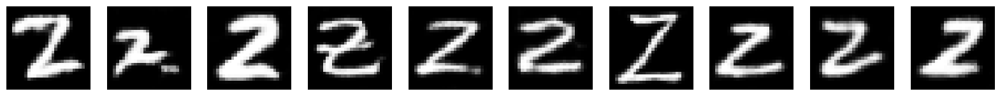

Epoch 100: D Accuracy = 0.7143
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2269 - g_loss: 1.0827 - d_accuracy: 0.6681
Epoch 101/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2285 - g_loss: 1.0840 - d_accuracy: 0.6609
Epoch 102/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2146 - g_loss: 1.0970 - d_accuracy: 0.6675
Epoch 103/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2053 - g_loss: 1.0873 - d_accuracy: 0.6798
Epoch 104/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2081 - g_loss: 1.1062 - d_accuracy: 0.6773
Epoch 104: Generator loss improved from 0.6339 to 0.6278. Saving weights.
Epoch 104: D Accuracy = 0.6429
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2132 - g_loss: 1.0892 - d_accuracy: 0.6761
Epoch 105/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2202 - g_loss: 1.1411 - d_accuracy: 0.6700
Epoch 106/500
27/27 [===============

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2019 - g_loss: 1.1725 - d_accuracy: 0.6744
Epoch 133/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1793 - g_loss: 1.1470 - d_accuracy: 0.6948
Epoch 134/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1952 - g_loss: 1.1334 - d_accuracy: 0.6821
Epoch 135/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1859 - g_loss: 1.1758 - d_accuracy: 0.6872
Epoch 136/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1821 - g_loss: 1.1725 - d_accuracy: 0.6834
Epoch 137/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1791 - g_loss: 1.1400 - d_accuracy: 0.6901
Epoch 138/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1858 - g_loss: 1.1471 - d_accuracy: 0.6884
Epoch 139/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1771 - g_loss: 1.1408 - d_accuracy: 0.6912
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1669 - g_loss: 1.2140 - d_accuracy: 0.6979
Epoch 165/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1476 - g_loss: 1.2085 - d_accuracy: 0.7042
Epoch 166/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1204 - g_loss: 1.2339 - d_accuracy: 0.7204
Epoch 167/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1242 - g_loss: 1.2089 - d_accuracy: 0.7225
Epoch 168/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1476 - g_loss: 1.2691 - d_accuracy: 0.7006
Epoch 169/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1157 - g_loss: 1.2680 - d_accuracy: 0.7196
Epoch 170/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1471 - g_loss: 1.2299 - d_accuracy: 0.7108
Epoch 171/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1156 - g_loss: 1.2560 - d_accuracy: 0.7247
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0785 - g_loss: 1.3384 - d_accuracy: 0.7432
Epoch 197/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1054 - g_loss: 1.3425 - d_accuracy: 0.7318
Epoch 198/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0637 - g_loss: 1.3367 - d_accuracy: 0.7550
Epoch 199/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0605 - g_loss: 1.3533 - d_accuracy: 0.7565
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0905 - g_loss: 1.3233 - d_accuracy: 0.7434
Class 15 — Epoch 200 preview:


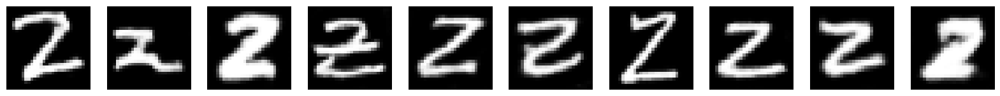

Epoch 200: D Accuracy = 0.7755
27/27 [==============================] - 1s 40ms/step - d_loss: 1.0891 - g_loss: 1.3168 - d_accuracy: 0.7446
Epoch 201/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0936 - g_loss: 1.3726 - d_accuracy: 0.7299
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0523 - g_loss: 1.3224 - d_accuracy: 0.7628
Epoch 203/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0668 - g_loss: 1.3421 - d_accuracy: 0.7521
Epoch 204/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0788 - g_loss: 1.3514 - d_accuracy: 0.7431
Epoch 205/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0797 - g_loss: 1.3331 - d_accuracy: 0.7481
Epoch 206/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0710 - g_loss: 1.3564 - d_accuracy: 0.7497
Epoch 207/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0710 - g_loss: 1.4082 - d_accuracy: 0.7465

27/27 [==============================] - 1s 34ms/step - d_loss: 1.0273 - g_loss: 1.5073 - d_accuracy: 0.7656
Epoch 233/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0143 - g_loss: 1.4512 - d_accuracy: 0.7736
Epoch 234/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0314 - g_loss: 1.4747 - d_accuracy: 0.7600
Epoch 235/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0207 - g_loss: 1.4567 - d_accuracy: 0.7722
Epoch 236/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0233 - g_loss: 1.5347 - d_accuracy: 0.7651
Epoch 237/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0161 - g_loss: 1.4732 - d_accuracy: 0.7718
Epoch 238/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.9978 - g_loss: 1.4702 - d_accuracy: 0.7875
Epoch 239/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0197 - g_loss: 1.4638 - d_accuracy: 0.7748
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9839 - g_loss: 1.5933 - d_accuracy: 0.7862
Epoch 265/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9865 - g_loss: 1.6112 - d_accuracy: 0.7812
Epoch 266/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9421 - g_loss: 1.6224 - d_accuracy: 0.8055
Epoch 267/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9671 - g_loss: 1.5824 - d_accuracy: 0.7984
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9615 - g_loss: 1.6685 - d_accuracy: 0.7909
Epoch 269/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9366 - g_loss: 1.6118 - d_accuracy: 0.8093
Epoch 270/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9510 - g_loss: 1.7004 - d_accuracy: 0.8000
Epoch 271/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9544 - g_loss: 1.5962 - d_accuracy: 0.7993
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9061 - g_loss: 1.7166 - d_accuracy: 0.8203
Epoch 297/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.9255 - g_loss: 1.7958 - d_accuracy: 0.8073
Epoch 298/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8945 - g_loss: 1.7654 - d_accuracy: 0.8269
Epoch 299/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8859 - g_loss: 1.7754 - d_accuracy: 0.8311
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9566 - g_loss: 1.7835 - d_accuracy: 0.7956
Class 15 — Epoch 300 preview:


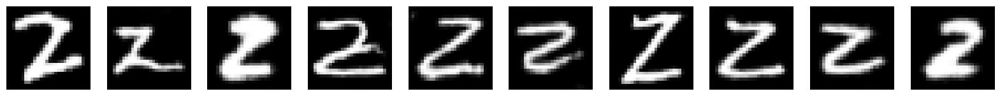

Epoch 300: D Accuracy = 0.7500
27/27 [==============================] - 1s 41ms/step - d_loss: 0.9593 - g_loss: 1.7838 - d_accuracy: 0.7939
Epoch 301/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9065 - g_loss: 1.7814 - d_accuracy: 0.8184
Epoch 302/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9172 - g_loss: 1.7448 - d_accuracy: 0.8190
Epoch 303/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9264 - g_loss: 1.8335 - d_accuracy: 0.8061
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9534 - g_loss: 1.7613 - d_accuracy: 0.7997
Epoch 305/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9022 - g_loss: 1.7616 - d_accuracy: 0.8229
Epoch 306/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9147 - g_loss: 1.7504 - d_accuracy: 0.8225
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.9321 - g_loss: 1.7890 - d_accuracy: 0.8034

27/27 [==============================] - 1s 35ms/step - d_loss: 0.8467 - g_loss: 1.9181 - d_accuracy: 0.8427
Epoch 333/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8886 - g_loss: 1.8724 - d_accuracy: 0.8263
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8843 - g_loss: 1.8964 - d_accuracy: 0.8265
Epoch 335/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1333 - g_loss: 2.0399 - d_accuracy: 0.7736
Epoch 336/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8948 - g_loss: 1.7949 - d_accuracy: 0.8278
Epoch 337/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8784 - g_loss: 1.8676 - d_accuracy: 0.8334
Epoch 338/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8591 - g_loss: 1.8758 - d_accuracy: 0.8404
Epoch 339/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8731 - g_loss: 1.8994 - d_accuracy: 0.8362
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8521 - g_loss: 2.0259 - d_accuracy: 0.8405
Epoch 365/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8160 - g_loss: 2.0108 - d_accuracy: 0.8633
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8464 - g_loss: 2.0106 - d_accuracy: 0.8424
Epoch 367/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8475 - g_loss: 2.1417 - d_accuracy: 0.8421
Epoch 368/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8420 - g_loss: 1.9978 - d_accuracy: 0.8461
Epoch 369/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8363 - g_loss: 1.9960 - d_accuracy: 0.8470
Epoch 370/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.8864 - g_loss: 2.0904 - d_accuracy: 0.8188
Epoch 371/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8735 - g_loss: 2.0265 - d_accuracy: 0.8277
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7981 - g_loss: 2.0204 - d_accuracy: 0.8679
Epoch 397/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8099 - g_loss: 2.0879 - d_accuracy: 0.8579
Epoch 398/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8026 - g_loss: 2.1081 - d_accuracy: 0.8622
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8174 - g_loss: 2.1248 - d_accuracy: 0.8527
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 0.7873 - g_loss: 2.1306 - d_accuracy: 0.8669
Class 15 — Epoch 400 preview:


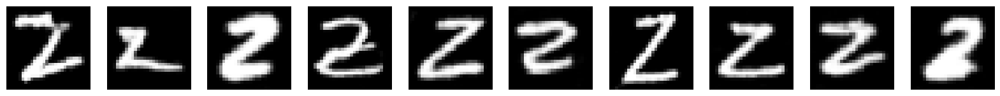

Epoch 400: D Accuracy = 0.8163
27/27 [==============================] - 1s 41ms/step - d_loss: 0.7872 - g_loss: 2.1510 - d_accuracy: 0.8651
Epoch 401/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8508 - g_loss: 2.0970 - d_accuracy: 0.8335
Epoch 402/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8251 - g_loss: 2.1257 - d_accuracy: 0.8465
Epoch 403/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8099 - g_loss: 2.1343 - d_accuracy: 0.8540
Epoch 404/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7789 - g_loss: 2.1773 - d_accuracy: 0.8696
Epoch 405/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8052 - g_loss: 2.1835 - d_accuracy: 0.8543
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8289 - g_loss: 2.1321 - d_accuracy: 0.8463
Epoch 407/500
27/27 [==============================] - 1s 38ms/step - d_loss: 0.7862 - g_loss: 2.2526 - d_accuracy: 0.8655

27/27 [==============================] - 1s 35ms/step - d_loss: 0.8316 - g_loss: 2.3144 - d_accuracy: 0.8392
Epoch 433/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7592 - g_loss: 2.2458 - d_accuracy: 0.8808
Epoch 434/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7903 - g_loss: 2.2298 - d_accuracy: 0.8608
Epoch 435/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7692 - g_loss: 2.2752 - d_accuracy: 0.8724
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7552 - g_loss: 2.2650 - d_accuracy: 0.8764
Epoch 437/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7818 - g_loss: 2.2521 - d_accuracy: 0.8696
Epoch 438/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.8115 - g_loss: 2.2794 - d_accuracy: 0.8498
Epoch 439/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7668 - g_loss: 2.2795 - d_accuracy: 0.8682
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.7855 - g_loss: 2.3140 - d_accuracy: 0.8631
Epoch 465/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7281 - g_loss: 2.3513 - d_accuracy: 0.8878
Epoch 466/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7734 - g_loss: 2.3503 - d_accuracy: 0.8697
Epoch 467/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.7611 - g_loss: 2.3449 - d_accuracy: 0.8719
Epoch 468/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7418 - g_loss: 2.3908 - d_accuracy: 0.8781
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7200 - g_loss: 2.3498 - d_accuracy: 0.8905
Epoch 470/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.7799 - g_loss: 2.4964 - d_accuracy: 0.8576
Epoch 471/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7394 - g_loss: 2.3926 - d_accuracy: 0.8823
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7172 - g_loss: 2.5097 - d_accuracy: 0.8900
Epoch 497/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7259 - g_loss: 2.5385 - d_accuracy: 0.8861
Epoch 498/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7416 - g_loss: 2.4576 - d_accuracy: 0.8830
Epoch 499/500
27/27 [==============================] - 1s 36ms/step - d_loss: 0.7437 - g_loss: 2.4915 - d_accuracy: 0.8829
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 0.6900 - g_loss: 2.5288 - d_accuracy: 0.9049
Class 15 — Epoch 500 preview:


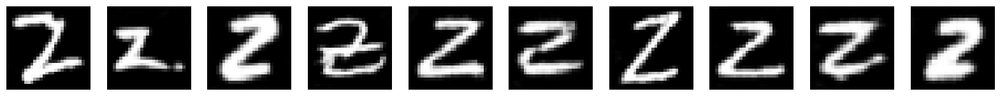

Epoch 500: D Accuracy = 0.9388
27/27 [==============================] - 1s 47ms/step - d_loss: 0.6890 - g_loss: 2.5168 - d_accuracy: 0.9061
Saved final generator weights for class 0 to 16Models_saved_generators_600epochs(last)\final_generator_class_0.h5
Saved final generator weights for class 1 to 16Models_saved_generators_600epochs(last)\final_generator_class_1.h5
Saved final generator weights for class 2 to 16Models_saved_generators_600epochs(last)\final_generator_class_2.h5
Saved final generator weights for class 3 to 16Models_saved_generators_600epochs(last)\final_generator_class_3.h5
Saved final generator weights for class 4 to 16Models_saved_generators_600epochs(last)\final_generator_class_4.h5
Saved final generator weights for class 5 to 16Models_saved_generators_600epochs(last)\final_generator_class_5.h5
Saved final generator weights for class 6 to 16Models_saved_generators_600epochs(last)\final_generator_class_6.h5
Saved final generator weights for class 7 to 16Models_saved_ge

In [28]:
# === Training ===

dcgan_models = {}
histories = {}

# Directory to save best weights
best_save_dir = "16Models_saved_generators_600epochs"
os.makedirs(best_save_dir, exist_ok=True)

for c in range(num_classes):
    print(f"Training DCGAN for class {c}...")

    generator = build_generator(latent_dim, channels=1)
    discriminator = build_discriminator(img_shape)

    dcgan = DCGANModel(generator, discriminator, latent_dim)
    dcgan.compile(
        g_optimizer=Adam(0.0002, beta_1=0.5),
        d_optimizer=Adam(0.0002, beta_1=0.5)
    )

    preview_callback = PrintImagesEveryN(class_index=c, latent_dim=latent_dim, interval=100)
    best_weight_path = os.path.join(best_save_dir, f"best_generator_class_{c}.h5")
    save_best_callback = SaveBestGenerator(save_path=best_weight_path)
    accuracy_callback = PrintAccuracy()  

    history = dcgan.fit(
        class_datasets[c],
        epochs=epochs,
        callbacks=[preview_callback, save_best_callback, accuracy_callback]
    )

    dcgan_models[c] = dcgan
    histories[c] = history

# === Save final generator weights for all 16 classes ===
final_save_dir = "16Models_saved_generators_600epochs(last)"
os.makedirs(final_save_dir, exist_ok=True)

for class_idx, dcgan in dcgan_models.items():
    gen = dcgan.generator
    weight_path = os.path.join(final_save_dir, f"final_generator_class_{class_idx}.h5")
    gen.save_weights(weight_path)
    print(f"Saved final generator weights for class {class_idx} to {weight_path}")




In [29]:
# === Final Save and Grid ===
def generate_and_save(dcgan_models, latent_dim=128, images_per_class=10, save_dir="16Models_DCGAN_600epochs_images"):
    os.makedirs(save_dir, exist_ok=True)
    num_classes = len(dcgan_models)
    all_images = []

    for class_idx, dcgan in dcgan_models.items():
        noise = np.random.normal(0, 1, (images_per_class, latent_dim))
        generated_images = dcgan.generator.predict(noise)
        generated_images = 0.5 * generated_images + 0.5

        class_dir = os.path.join(save_dir, f"class_{class_idx}")
        os.makedirs(class_dir, exist_ok=True)

        for i in range(images_per_class):
            img = generated_images[i, :, :, 0]
            all_images.append(img)
            plt.imsave(os.path.join(class_dir, f"img_{i+1}.png"), img, cmap='gray')

    # Save a grid of all generated images
    fig, axes = plt.subplots(num_classes, images_per_class, figsize=(images_per_class, num_classes))
    fig.suptitle("DCGAN Generated Samples per Class", fontsize=16)

    for i, ax in enumerate(axes.flat):
        ax.imshow(all_images[i], cmap='gray')
        ax.axis('off')

    grid_path = os.path.join(save_dir, "grid_160images_600epochs.png")
    plt.tight_layout()
    plt.savefig(grid_path)
    plt.show()
    print(f"Images saved to folder: {save_dir}")
    print(f"Grid saved as: {grid_path}")

def plot_loss_history(histories):
    for class_idx, history in histories.items():
        g_loss = history.history['g_loss']
        d_loss = history.history['d_loss']
        d_acc = history.history.get('d_accuracy', None)
        epochs_range = range(1, len(g_loss) + 1)

        plt.figure(figsize=(12, 4))

        plt.subplot(1, 2, 1)
        plt.plot(epochs_range, d_loss, label="Discriminator Loss")
        plt.plot(epochs_range, g_loss, label="Generator Loss")
        plt.title(f"Loss — Class {class_idx}")
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid(True)

        if d_acc is not None:
            plt.subplot(1, 2, 2)
            plt.plot(epochs_range, d_acc, label="Discriminator Accuracy", color='green')
            plt.title(f"Discriminator Accuracy — Class {class_idx}")
            plt.xlabel("Epochs")
            plt.ylabel("Accuracy")
            plt.grid(True)
            plt.legend()

        plt.tight_layout()
        plt.show()

        
for class_idx, dcgan in dcgan_models.items():
    gen = dcgan.generator
    weight_path = os.path.join(final_save_dir, f"final_generator_class_{class_idx}.h5")
    gen.save_weights(weight_path)
    print(f"Saved generator weights for class {class_idx} to {weight_path}")



Saved generator weights for class 0 to 16Models_saved_generators_600epochs(last)\final_generator_class_0.h5
Saved generator weights for class 1 to 16Models_saved_generators_600epochs(last)\final_generator_class_1.h5
Saved generator weights for class 2 to 16Models_saved_generators_600epochs(last)\final_generator_class_2.h5
Saved generator weights for class 3 to 16Models_saved_generators_600epochs(last)\final_generator_class_3.h5
Saved generator weights for class 4 to 16Models_saved_generators_600epochs(last)\final_generator_class_4.h5
Saved generator weights for class 5 to 16Models_saved_generators_600epochs(last)\final_generator_class_5.h5
Saved generator weights for class 6 to 16Models_saved_generators_600epochs(last)\final_generator_class_6.h5
Saved generator weights for class 7 to 16Models_saved_generators_600epochs(last)\final_generator_class_7.h5
Saved generator weights for class 8 to 16Models_saved_generators_600epochs(last)\final_generator_class_8.h5
Saved generator weights for 

1/1 [==============================] - 0s 89ms/step


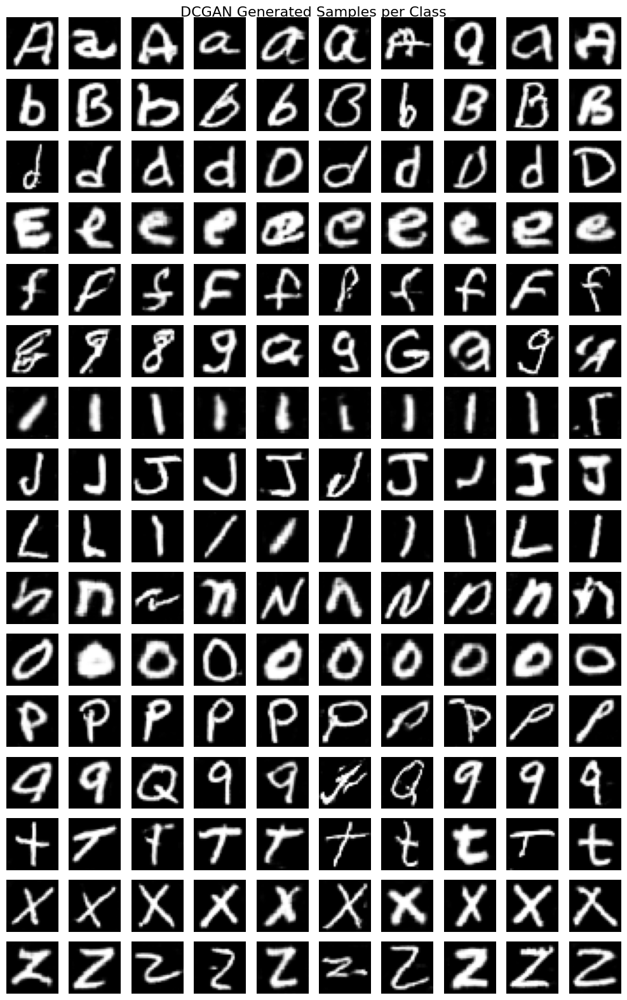

Images saved to folder: 16Models_DCGAN_600epochs_images
Grid saved as: 16Models_DCGAN_600epochs_images\grid_160images_600epochs.png


In [30]:
generate_and_save(dcgan_models, latent_dim=latent_dim, images_per_class=10)


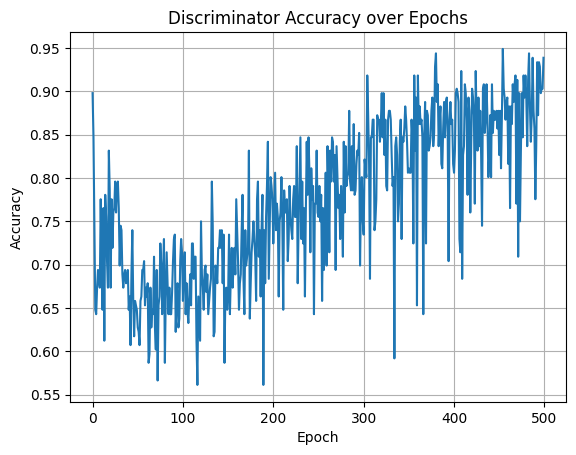

In [31]:
plt.plot(history.history['d_accuracy'])
plt.title("Discriminator Accuracy over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.grid(True)
plt.show()


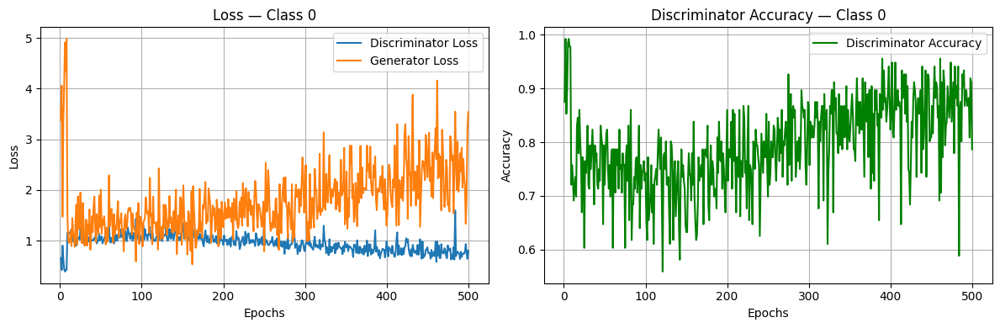

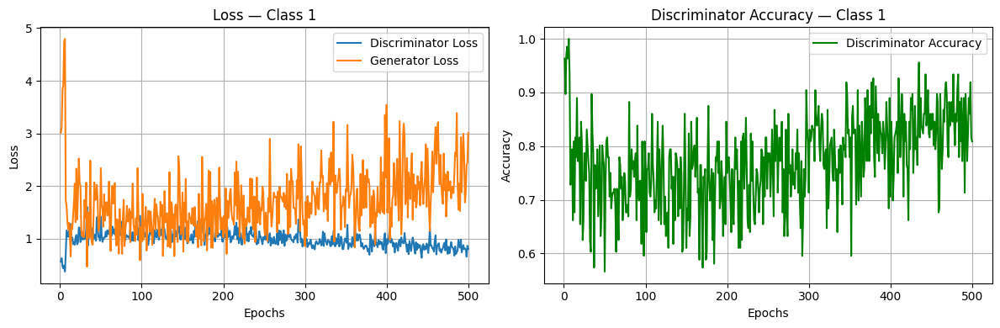

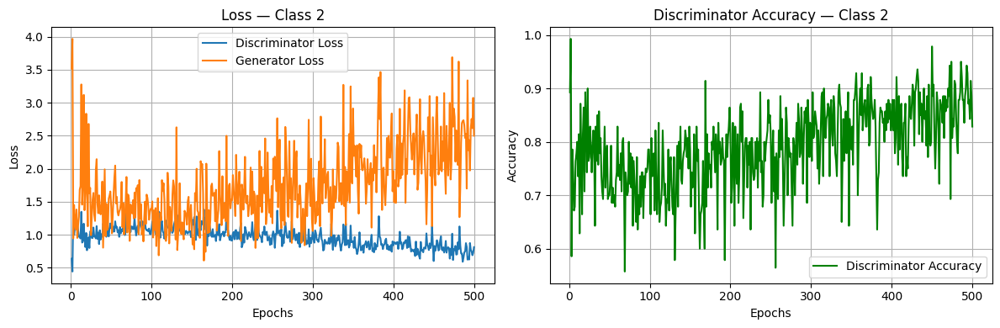

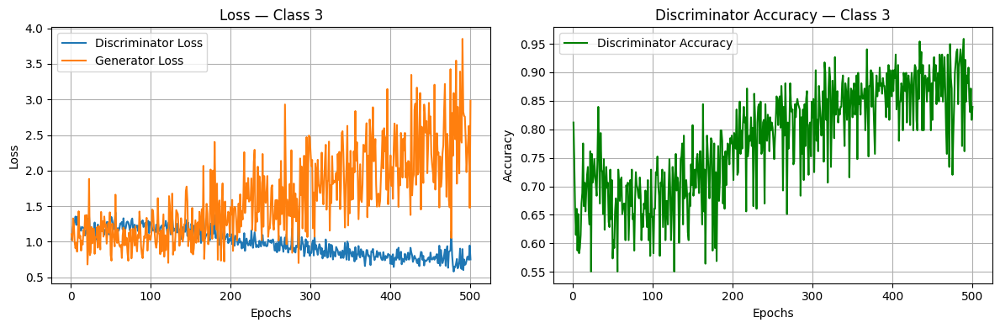

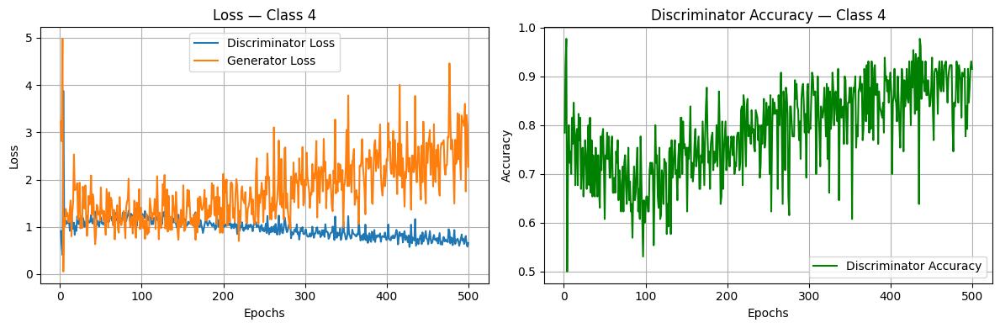

...

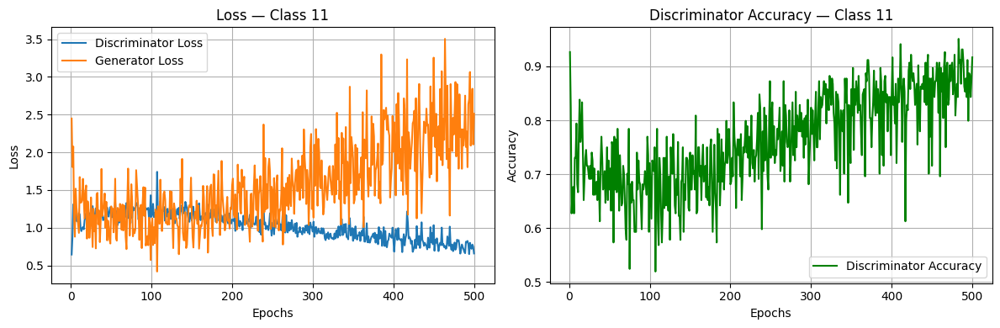

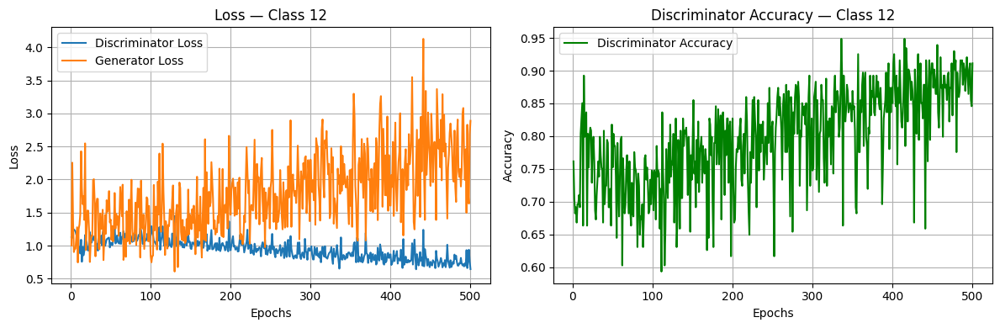

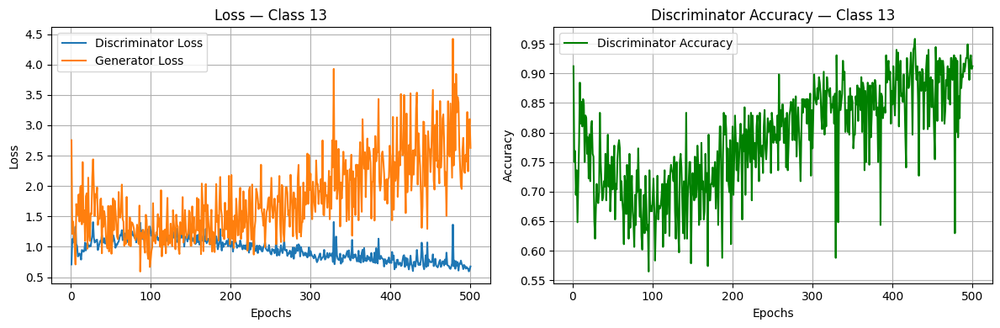

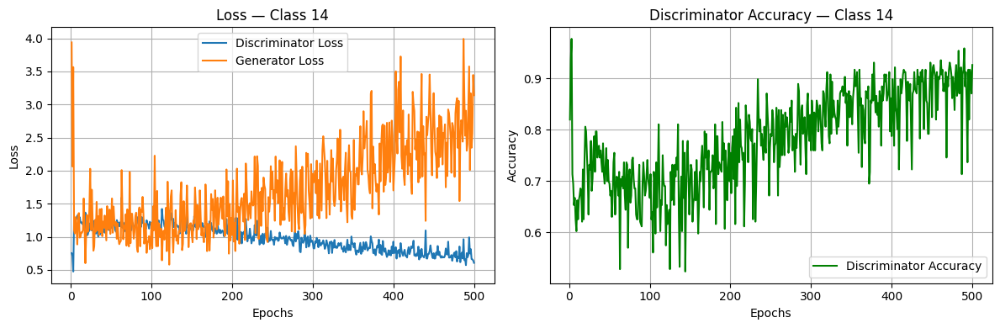

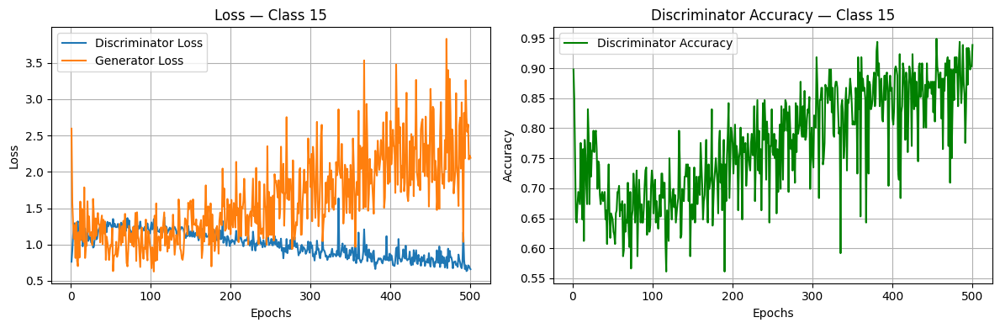

In [32]:


plot_loss_history(histories)


In [33]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Trained characters (16 letters, case-insensitive)
trained_letters = list("ABDEFGIJLNOPQTXZ")
label_to_index = {ch: idx for idx, ch in enumerate(trained_letters)}

def generate_word_from_models(dcgan_models, word, latent_dim=128):
    """
    Generate a word using DCGANs trained on 16 letters (A–Z, no case).
    Skips untrained letters.
    """
    word = word.upper()
    valid_letters = []
    valid_indices = []

    for ch in word:
        if ch in label_to_index:
            valid_letters.append(ch)
            valid_indices.append(label_to_index[ch])
        else:
            print(f"Skipping '{ch}' — not trained.")

    if not valid_letters:
        print("No valid letters to generate.")
        return

    noise = tf.random.normal((len(valid_letters), latent_dim))

    images = []
    for i, class_idx in enumerate(valid_indices):
        gen = dcgan_models[class_idx].generator
        img_tensor = gen(noise[i:i+1], training=False)
        img = (img_tensor[0, :, :, 0] * 0.5) + 0.5
        images.append(img.numpy())

    fig, axes = plt.subplots(1, len(images), figsize=(len(images)*1.5, 2))
    for ax, img, ch in zip(axes, images, valid_letters):
        ax.imshow(img, cmap='gray')
        ax.axis('off')
        ax.set_title(ch)
    plt.tight_layout()
    plt.show()


Skipping 'R' — not trained.


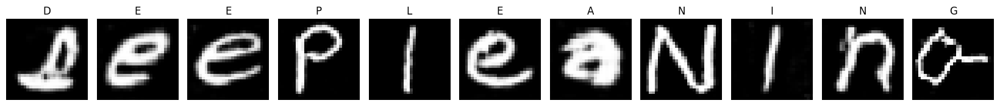

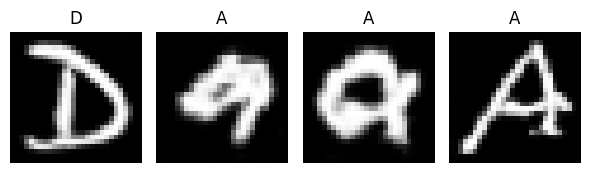

In [34]:
generate_word_from_models(dcgan_models, "DEEPLEARNING", latent_dim=128)
generate_word_from_models(dcgan_models, "DAAA", latent_dim=128)


In [35]:
def load_final_and_save_grid(final_save_dir, latent_dim=128, images_per_class=10, output_path="grid_final_160.png"):
    all_images = []

    for class_idx in range(16):
        generator = build_generator(latent_dim, channels=1)
        weight_path = os.path.join(final_save_dir, f"final_generator_class_{class_idx}.h5")
        generator.load_weights(weight_path)

        noise = np.random.normal(0, 1, (images_per_class, latent_dim))
        generated = generator.predict(noise)
        generated = 0.5 * generated + 0.5

        for i in range(images_per_class):
            all_images.append(generated[i, :, :, 0])

    fig, axes = plt.subplots(16, 10, figsize=(10, 16))
    for idx, ax in enumerate(axes.flat):
        ax.imshow(all_images[idx], cmap='gray')
        ax.axis('off')
    plt.tight_layout()
    plt.suptitle("Final Generator — 160 Images", fontsize=16)
    plt.subplots_adjust(top=0.95)
    plt.savefig(output_path)
    plt.show()
    print(f"Final 160-image grid saved as: {output_path}")


1/1 [==============================] - 0s 93ms/step


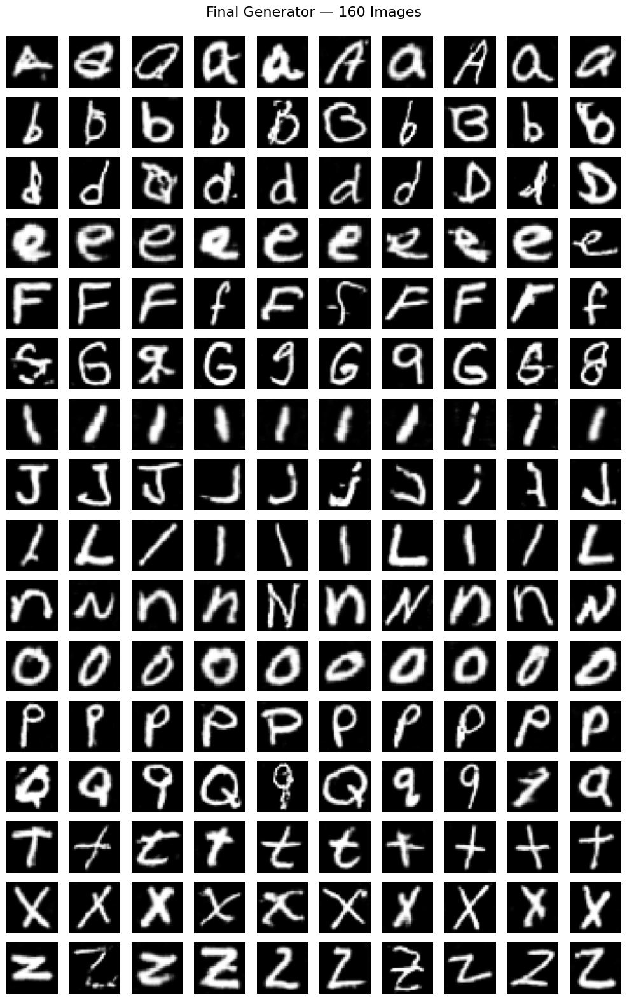

Final 160-image grid saved as: grid_final_160.png


In [36]:
load_final_and_save_grid("16Models_saved_generators_600epochs(last)", output_path="grid_final_160.png")


1/1 [==============================] - 0s 91ms/step


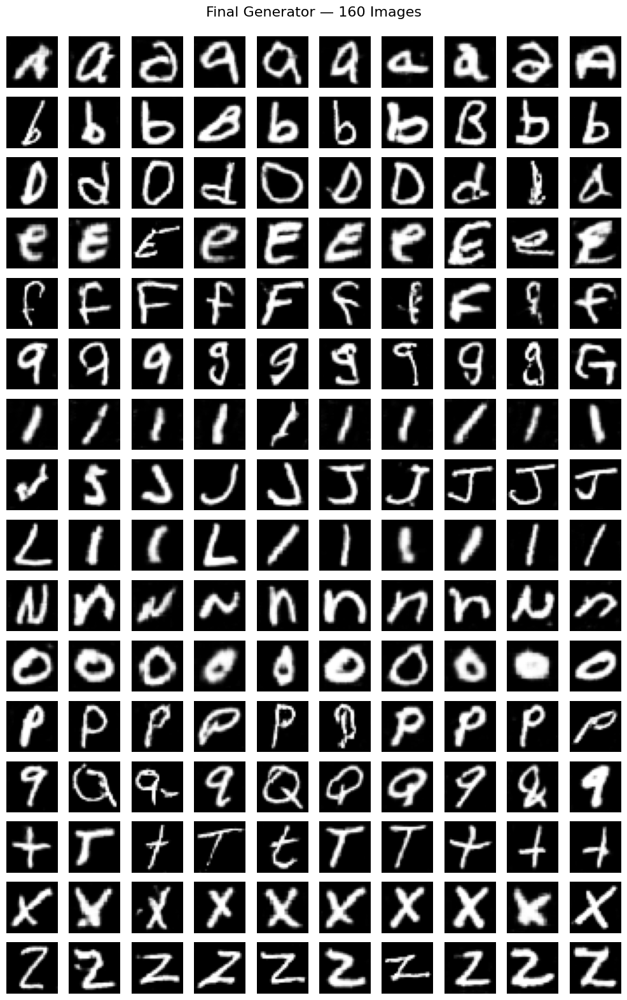

Final 160-image grid saved as: grid_final_160(2).png


In [37]:
load_final_and_save_grid("16Models_saved_generators_600epochs(last)", output_path="grid_final_160(2).png")


In [38]:
def load_best_and_save_grid(best_save_dir, latent_dim=128, images_per_class=10, output_path="grid_best_160.png"):
    all_images = []

    for class_idx in range(16):
        generator = build_generator(latent_dim, channels=1)
        weight_path = os.path.join(best_save_dir, f"best_generator_class_{class_idx}.h5")
        generator.load_weights(weight_path)

        noise = np.random.normal(0, 1, (images_per_class, latent_dim))
        generated = generator.predict(noise)
        generated = 0.5 * generated + 0.5

        for i in range(images_per_class):
            all_images.append(generated[i, :, :, 0])

    fig, axes = plt.subplots(16, 10, figsize=(10, 16))
    for idx, ax in enumerate(axes.flat):
        ax.imshow(all_images[idx], cmap='gray')
        ax.axis('off')
    plt.tight_layout()
    plt.suptitle("Best Generator — 160 Images", fontsize=16)
    plt.subplots_adjust(top=0.95)
    plt.savefig(output_path)
    plt.show()
    print(f"Best 160-image grid saved as: {output_path}")


In [42]:
def load_dcgan_models_from_weights(weight_dir, latent_dim=128):
    dcgan_models = {}
    for class_idx in range(16):
        generator = build_generator(latent_dim, channels=1)
        weight_path = os.path.join(weight_dir, f"best_generator_class_{class_idx}.h5")
        if not os.path.exists(weight_path):  # Try loading final weights if best not found
            weight_path = os.path.join(weight_dir, f"final_generator_class_{class_idx}.h5")
        generator.load_weights(weight_path)

        # Wrap inside dummy DCGAN model structure
        dcgan = tf.keras.models.Model()
        dcgan.generator = generator
        dcgan_models[class_idx] = dcgan
    return dcgan_models


In [57]:

# For final weights
dcgan_models_final = load_dcgan_models_from_weights("16Models_saved_generators_600epochs(last)")


Skipping ' ' — not trained.


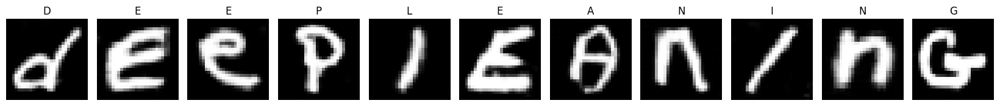

In [70]:
generate_word_from_models(dcgan_models_final, "DEEP LEANING")     # Final weights


Skipping ' ' — not trained.


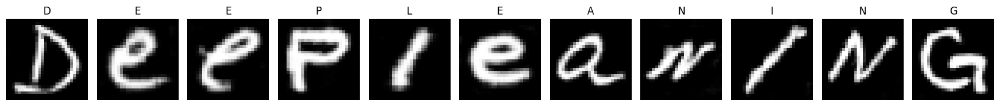

In [71]:
generate_word_from_models(dcgan_models_final, "DEEP LEANING")     # Final weights


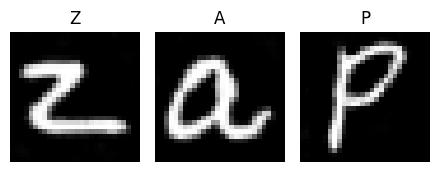

In [72]:
generate_word_from_models(dcgan_models_final, "ZAP")     # Final weights


Skipping ' ' — not trained.
Skipping ' ' — not trained.
Skipping ' ' — not trained.
Skipping ' ' — not trained.
Skipping ' ' — not trained.
Skipping ' ' — not trained.


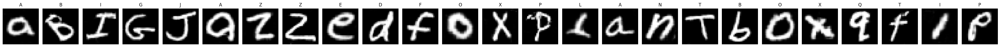

In [73]:
generate_word_from_models(dcgan_models_final, "A BIG JAZZED FOX PLANT BOX QTIP")     # Final weights


Skipping ' ' — not trained.
Skipping ' ' — not trained.


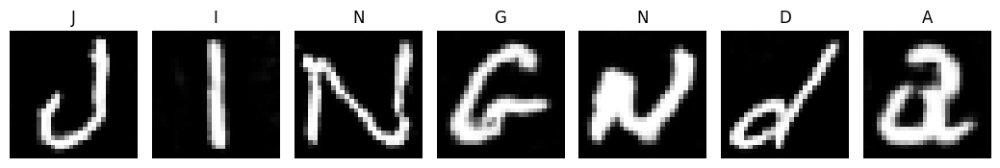

In [74]:
generate_word_from_models(dcgan_models_final, "JING N DA")     # Final weights


Skipping ' ' — not trained.
Skipping ' ' — not trained.


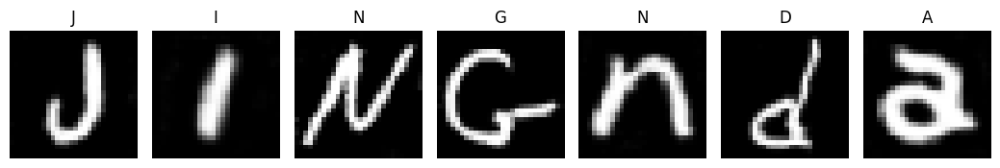

In [84]:
generate_word_from_models(dcgan_models_final, "JING N DA")     # Final weights


# Model Improvement 2

## Differences Between Generator Versions 1 and 2

| Aspect                      | Version 1                                             | Version 2                                               |
|----------------------------|-------------------------------------------------------|---------------------------------------------------------|
| **Final Layer Type**       | `Conv2D` (normal convolution)                         | `Conv2DTranspose` (transpose convolution)               |
| **Final Layer Kernel**     | 3×3 kernel                                            | 2×2 kernel                                              |
| **Final Layer Stride**     | Default stride = 1 (Conv2D)                           | stride = 1                                              |
| **Final Layer Activation** | Separate `Activation('tanh')` after Conv2D            | `'tanh'` integrated inside final `Conv2DTranspose`      |
| **Upsampling Layers**      | 3 × `Conv2DTranspose` + 1 Conv2D refinement layer     | 4 × `Conv2DTranspose` (last layer produces output)      |
| **Output Refinement**      | Final refinement via normal Conv2D                    | Refinement integrated into last `Conv2DTranspose`       |

---

## Training Settings (Applied to Both Versions)

| Setting                | Value / Choice                           | Why |
|------------------------|-------------------------------------------|-----|
| **Label Smoothing**    | Real labels = **0.9**, Fake = **0.0**     | Prevents D overconfidence; gives G better gradients when D gets strong |
| **G Optimizer**        | `Adam(lr=2e-4, beta_1=0.5)`               | Slightly faster G to keep up with D; DCGAN-standard β₁ stabilizes momentum |
| **D Optimizer**        | `Adam(lr=5e-5, beta_1=0.5)`               | Slower D to avoid dominating (keeps D-acc ~60–80% “healthy” range) |

**One-liner rationale:**  
Previous runs showed D accuracy drifting to ~95% (too strong), so we added **label smoothing** and set **G LR > D LR** to keep training competitive and improve generator gradients.


| Component       | Layer Type         | Parameters / Details                                                                                       |
|-----------------|--------------------|----------------------------------------------------------------------------------------------------------|
| **Generator**   | Dense              | 256 * 7 * 7 units, input dimension = `latent_dim`                                                        |
|                 | BatchNormalization | Default                                                                                                |
|                 | LeakyReLU          | Alpha = 0.2                                                                                            |
|                 | Reshape            | Output shape: (7, 7, 256)                                                                              |
|                 | Conv2DTranspose    | 128 filters, kernel size = 4, strides = 2, padding = 'same' → output 14x14                              |
|                 | BatchNormalization | Default                                                                                                |
|                 | LeakyReLU          | Alpha = 0.2                                                                                            |
|                 | Conv2DTranspose    | 64 filters, kernel size = 4, strides = 2, padding = 'same' → output 28x28                               |
|                 | BatchNormalization | Default                                                                                                |
|                 | LeakyReLU          | Alpha = 0.2                                                                                            |
|                 | Conv2DTranspose    | 32 filters, kernel size = 3, strides = 1, padding = 'same' (refinement layer)                           |
|                 | BatchNormalization | Default                                                                                                |
|                 | LeakyReLU          | Alpha = 0.2                                                                                            |
|                 | Conv2DTranspose    | `channels` filters, kernel size = 2, strides = 1, padding = 'same', activation = 'tanh' (output layer)  |
| **Discriminator**| Conv2D             | 64 filters, kernel size = 3, strides = 2, padding = 'same', input shape = `img_shape`                   |
|                 | LeakyReLU          | Alpha = 0.2                                                                                            |
|                 | Dropout            | Rate = 0.3                                                                                             |
|                 | Conv2D             | 128 filters, kernel size = 3, strides = 2, padding = 'same'                                            |
|                 | BatchNormalization | Default                                                                                                |
|                 | LeakyReLU          | Alpha = 0.2                                                                                            |
|                 | Dropout            | Rate = 0.3                                                                                             |
|                 | Conv2D             | 128 filters, kernel size = 3, strides = 1, padding = 'same'                                            |
|                 | BatchNormalization | Default                                                                                                |
|                 | LeakyReLU          | Alpha = 0.2                                                                                            |
|                 | Flatten            | -                                                                                                      |
|                 | Dense              | 64 units                                                                                              |
|                 | LeakyReLU          | Alpha = 0.2                                                                                            |
|                 | Dense              | 1 unit, activation = 'sigmoid' (output layer)                                                         |


In [40]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import (Input, Dense, Reshape, Conv2DTranspose, BatchNormalization,
                                     Activation, Conv2D, LeakyReLU, Dropout, Flatten)
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam

# === Generator ===
def build_generator(latent_dim, channels=1):
    model = Sequential([
        Dense(256 * 7 * 7, input_dim=latent_dim),
        BatchNormalization(),
        LeakyReLU(0.2),
        Reshape((7, 7, 256)),

        Conv2DTranspose(128, kernel_size=4, strides=2, padding='same'),  # → 14x14
        BatchNormalization(),
        LeakyReLU(0.2),

        Conv2DTranspose(64, kernel_size=4, strides=2, padding='same'),   # → 28x28
        BatchNormalization(),
        LeakyReLU(0.2),

        Conv2DTranspose(32, kernel_size=3, strides=1, padding='same'),   # refinement
        BatchNormalization(),
        LeakyReLU(0.2),

        Conv2DTranspose(channels, kernel_size=2, strides=1, padding='same', activation='tanh')
    ])

    noise = Input(shape=(latent_dim,))
    img = model(noise)
    return Model(noise, img)

# === Discriminator ===
def build_discriminator(img_shape):
    model = Sequential([
        # Block 1
        Conv2D(64, kernel_size=3, strides=2, padding='same', input_shape=img_shape),
        LeakyReLU(0.2),
        Dropout(0.3),

        # Block 2
        Conv2D(128, kernel_size=3, strides=2, padding='same'),
        BatchNormalization(),
        LeakyReLU(0.2),
        Dropout(0.3),

        # Block 3
        Conv2D(128, kernel_size=3, strides=1, padding='same'),
        BatchNormalization(),
        LeakyReLU(0.2),

        Flatten(),
        Dense(64),
        LeakyReLU(0.2),
        Dense(1, activation='sigmoid')
    ])

    img = Input(shape=img_shape)
    validity = model(img)
    return Model(img, validity)


In [41]:
latent_dim = 128
img_shape = (28, 28, 1)
batch_size = 128
epochs = 500
num_classes = 16

class_datasets = prepare_class_datasets(images, mapped_labels, batch_size=batch_size, num_classes=num_classes)

# Build models
generator = build_generator(latent_dim, channels=1)
discriminator = build_discriminator(img_shape)

# Print summaries
print("=== Generator Summary ===")
generator.summary()

print("\n=== Discriminator Summary ===")
discriminator.summary()


=== Generator Summary ===
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_39 (InputLayer)       [(None, 128)]             0         
                                                                 
 sequential_38 (Sequential)  (None, 28, 28, 1)         2343393   
                                                                 
Total params: 2,343,393
Trainable params: 2,317,857
Non-trainable params: 25,536
_________________________________________________________________

=== Discriminator Summary ===
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_40 (InputLayer)       [(None, 28, 28, 1)]       0         
                                                                 
 sequential_39 (Sequential)  (None, 1)                 624641    
                                      

In [125]:




# === DCGAN Model Class ===
class DCGANModel(tf.keras.Model):
    def __init__(self, generator, discriminator, latent_dim):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.loss_fn = tf.keras.losses.BinaryCrossentropy(from_logits=False)

    def compile(self, g_optimizer, d_optimizer):
        super().compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer

    def generator_loss(self, fake_output):
        return self.loss_fn(tf.ones_like(fake_output), fake_output)

    def discriminator_loss(self, real_output, fake_output):
        real_loss = self.loss_fn(tf.ones_like(real_output) * 0.9, real_output)  # label smoothing
        fake_loss = self.loss_fn(tf.zeros_like(fake_output), fake_output)
        return real_loss + fake_loss

    @tf.function
    def train_step(self, real_images):
        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal([batch_size, self.latent_dim])

        with tf.GradientTape() as disc_tape, tf.GradientTape() as gen_tape:
            generated_images = self.generator(noise, training=True)
            real_output = self.discriminator(real_images, training=True)
            fake_output = self.discriminator(generated_images, training=True)

            d_loss = self.discriminator_loss(real_output, fake_output)
            g_loss = self.generator_loss(fake_output)

        grads_d = disc_tape.gradient(d_loss, self.discriminator.trainable_variables)
        grads_g = gen_tape.gradient(g_loss, self.generator.trainable_variables)

        self.d_optimizer.apply_gradients(zip(grads_d, self.discriminator.trainable_variables))
        self.g_optimizer.apply_gradients(zip(grads_g, self.generator.trainable_variables))

        # === Compute discriminator accuracy ===
        real_preds = tf.cast(real_output > 0.5, tf.float32)
        fake_preds = tf.cast(fake_output < 0.5, tf.float32)

        real_accuracy = tf.reduce_mean(real_preds)
        fake_accuracy = tf.reduce_mean(fake_preds)
        d_accuracy = 0.5 * (real_accuracy + fake_accuracy)

        return {
            "d_loss": d_loss,
            "g_loss": g_loss,
            "d_accuracy": d_accuracy
        }



In [126]:

# === Callback to Save Best Generator ===
class SaveBestGenerator(tf.keras.callbacks.Callback):
    def __init__(self, save_path):
        super().__init__()
        self.save_path = save_path
        self.best_loss = float('inf')

    def on_epoch_end(self, epoch, logs=None):
        g_loss = logs.get('g_loss')
        if g_loss is not None and g_loss < self.best_loss:
            print(f"\nEpoch {epoch + 1}: Generator loss improved from {self.best_loss:.4f} to {g_loss:.4f}. Saving weights.")
            self.best_loss = g_loss
            self.model.generator.save_weights(self.save_path)

# === Callback to Print Images Every 250 Epochs ===
class PrintImagesEveryN(tf.keras.callbacks.Callback):
    def __init__(self, class_index, latent_dim, interval=250):
        super().__init__()
        self.class_index = class_index
        self.latent_dim = latent_dim
        self.interval = interval
        self.seed = tf.random.normal([10, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.interval == 0:
            generated_images = self.model.generator(self.seed, training=False)
            generated_images = 0.5 * generated_images + 0.5

            print(f"\nClass {self.class_index} — Epoch {epoch + 1} preview:")
            fig, axes = plt.subplots(1, 10, figsize=(20, 2))
            for i in range(10):
                ax = axes[i]
                ax.imshow(generated_images[i, :, :, 0], cmap='gray')
                ax.axis('off')
            plt.show()

# === Prepare Dataset Per Class ===
def prepare_class_datasets(images, labels, batch_size=128, num_classes=16):
    class_datasets = {}
    for c in range(num_classes):
        class_imgs = images[labels == c]
        dataset = tf.data.Dataset.from_tensor_slices(class_imgs) \
                               .shuffle(buffer_size=10000) \
                               .batch(batch_size) \
                               .prefetch(tf.data.AUTOTUNE)
        class_datasets[c] = dataset
    return class_datasets



class PrintAccuracy(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if logs and 'd_accuracy' in logs:
            print(f"Epoch {epoch + 1}: D Accuracy = {logs['d_accuracy']:.4f}")


Training DCGAN for class 0...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1475 - g_loss: 1.1655 - d_accuracy: 0.7217
Epoch 1: Generator loss improved from inf to 1.1482. Saving weights.
Epoch 1: D Accuracy = 0.7206
27/27 [==============================] - 2s 34ms/step - d_loss: 1.1496 - g_loss: 1.1648 - d_accuracy: 0.7217
Epoch 2/500
27/27 [==============================] - 1s 32ms/step - d_loss: 1.0771 - g_loss: 1.3171 - d_accuracy: 0.7757
Epoch 3/500
27/27 [==============================] - 1s 32ms/step - d_loss: 0.7436 - g_loss: 1.8519 - d_accuracy: 0.9062
Epoch 4/500
27/27 [==============================] - 1s 32ms/step - d_loss: 0.5278 - g_loss: 2.7931 - d_accuracy: 0.9644
Epoch 5/500
27/27 [==============================] - ETA: 0s - d_loss: 0.4939 - g_loss: 3.4929 - d_accuracy: 0.9685
Epoch 5: Generator loss improved from 1.1482 to 0.4685. Saving weights.
Epoch 5: D Accuracy = 0.5882
27/27 [==============================] - 1s 34ms/step - d_loss: 0.5

27/27 [==============================] - 1s 33ms/step - d_loss: 1.2188 - g_loss: 0.9992 - d_accuracy: 0.6765
Epoch 32/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2245 - g_loss: 1.0048 - d_accuracy: 0.6816
Epoch 33/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2277 - g_loss: 1.0022 - d_accuracy: 0.6743
Epoch 34/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2468 - g_loss: 0.9934 - d_accuracy: 0.6518
Epoch 35/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2429 - g_loss: 1.0048 - d_accuracy: 0.6662
Epoch 36/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2444 - g_loss: 1.0038 - d_accuracy: 0.6519
Epoch 37/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2309 - g_loss: 0.9994 - d_accuracy: 0.6677
Epoch 38/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2362 - g_loss: 1.0168 - d_accuracy: 0.6572
Epoch 39/500
27/27 [=================

27/27 [==============================] - 1s 33ms/step - d_loss: 1.2482 - g_loss: 0.9972 - d_accuracy: 0.6566
Epoch 64/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2565 - g_loss: 0.9914 - d_accuracy: 0.6472
Epoch 65/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2602 - g_loss: 0.9854 - d_accuracy: 0.6522
Epoch 66/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2631 - g_loss: 0.9944 - d_accuracy: 0.6403
Epoch 67/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2629 - g_loss: 0.9768 - d_accuracy: 0.6391
Epoch 68/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2593 - g_loss: 0.9894 - d_accuracy: 0.6412
Epoch 69/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2506 - g_loss: 0.9968 - d_accuracy: 0.6596
Epoch 70/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2609 - g_loss: 0.9833 - d_accuracy: 0.6447
Epoch 71/500
27/27 [=================

27/27 [==============================] - 1s 33ms/step - d_loss: 1.2798 - g_loss: 0.9674 - d_accuracy: 0.6316
Epoch 96/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2822 - g_loss: 0.9594 - d_accuracy: 0.6286
Epoch 97/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2753 - g_loss: 0.9714 - d_accuracy: 0.6403
Epoch 98/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2833 - g_loss: 0.9722 - d_accuracy: 0.6205
Epoch 99/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2770 - g_loss: 0.9651 - d_accuracy: 0.6319
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2795 - g_loss: 0.9704 - d_accuracy: 0.6342
Class 0 — Epoch 100 preview:


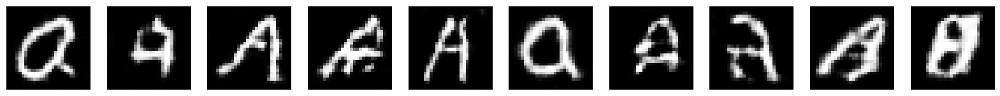

Epoch 100: D Accuracy = 0.5956
27/27 [==============================] - 1s 40ms/step - d_loss: 1.2809 - g_loss: 0.9724 - d_accuracy: 0.6328
Epoch 101/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2702 - g_loss: 0.9696 - d_accuracy: 0.6426
Epoch 102/500
27/27 [==============================] - 1s 33ms/step - d_loss: 1.2748 - g_loss: 0.9614 - d_accuracy: 0.6434
Epoch 103/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2844 - g_loss: 0.9464 - d_accuracy: 0.6271
Epoch 104/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2778 - g_loss: 0.9753 - d_accuracy: 0.6370
Epoch 105/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2893 - g_loss: 0.9451 - d_accuracy: 0.6296
Epoch 106/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2747 - g_loss: 0.9656 - d_accuracy: 0.6246
Epoch 107/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2899 - g_loss: 0.9527 - d_accuracy: 0.6207

27/27 [==============================] - 1s 34ms/step - d_loss: 1.2679 - g_loss: 0.9755 - d_accuracy: 0.6326
Epoch 133/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2807 - g_loss: 0.9569 - d_accuracy: 0.6271
Epoch 134/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2745 - g_loss: 0.9743 - d_accuracy: 0.6255
Epoch 135/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2794 - g_loss: 0.9537 - d_accuracy: 0.6259
Epoch 136/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2836 - g_loss: 0.9493 - d_accuracy: 0.6229
Epoch 137/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2851 - g_loss: 0.9633 - d_accuracy: 0.6263
Epoch 138/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2639 - g_loss: 0.9641 - d_accuracy: 0.6415
Epoch 139/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2905 - g_loss: 0.9590 - d_accuracy: 0.6156
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2685 - g_loss: 0.9598 - d_accuracy: 0.6309
Epoch 165/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2657 - g_loss: 0.9764 - d_accuracy: 0.6350
Epoch 166/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2623 - g_loss: 0.9672 - d_accuracy: 0.6487
Epoch 167/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2721 - g_loss: 0.9662 - d_accuracy: 0.6336
Epoch 168/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2791 - g_loss: 0.9561 - d_accuracy: 0.6310
Epoch 169/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2603 - g_loss: 0.9823 - d_accuracy: 0.6414
Epoch 170/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2750 - g_loss: 0.9592 - d_accuracy: 0.6378
Epoch 171/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2791 - g_loss: 0.9742 - d_accuracy: 0.6305
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2523 - g_loss: 0.9856 - d_accuracy: 0.6447
Epoch 197/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2640 - g_loss: 0.9768 - d_accuracy: 0.6364
Epoch 198/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2524 - g_loss: 0.9836 - d_accuracy: 0.6458
Epoch 199/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2423 - g_loss: 1.0011 - d_accuracy: 0.6516
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2674 - g_loss: 0.9766 - d_accuracy: 0.6384
Class 0 — Epoch 200 preview:


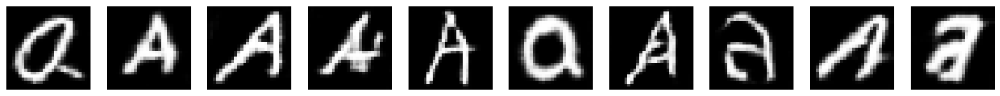

Epoch 200: D Accuracy = 0.6471
27/27 [==============================] - 1s 40ms/step - d_loss: 1.2669 - g_loss: 0.9800 - d_accuracy: 0.6387
Epoch 201/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2682 - g_loss: 0.9647 - d_accuracy: 0.6380
Epoch 202/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2571 - g_loss: 0.9723 - d_accuracy: 0.6435
Epoch 203/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2532 - g_loss: 0.9917 - d_accuracy: 0.6455
Epoch 204/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2524 - g_loss: 0.9827 - d_accuracy: 0.6475
Epoch 205/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2485 - g_loss: 0.9916 - d_accuracy: 0.6537
Epoch 206/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2552 - g_loss: 0.9783 - d_accuracy: 0.6494
Epoch 207/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2605 - g_loss: 0.9850 - d_accuracy: 0.6407

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2576 - g_loss: 0.9813 - d_accuracy: 0.6452
Epoch 233/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2483 - g_loss: 0.9841 - d_accuracy: 0.6536
Epoch 234/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2550 - g_loss: 0.9817 - d_accuracy: 0.6452
Epoch 235/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2501 - g_loss: 1.0034 - d_accuracy: 0.6510
Epoch 236/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2476 - g_loss: 0.9846 - d_accuracy: 0.6504
Epoch 237/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2418 - g_loss: 0.9992 - d_accuracy: 0.6519
Epoch 238/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2491 - g_loss: 0.9906 - d_accuracy: 0.6444
Epoch 239/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2482 - g_loss: 0.9808 - d_accuracy: 0.6511
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2422 - g_loss: 1.0077 - d_accuracy: 0.6573
Epoch 265/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2320 - g_loss: 1.0078 - d_accuracy: 0.6645
Epoch 266/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2554 - g_loss: 0.9794 - d_accuracy: 0.6530
Epoch 267/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2405 - g_loss: 0.9882 - d_accuracy: 0.6586
Epoch 268/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2339 - g_loss: 1.0196 - d_accuracy: 0.6631
Epoch 269/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2490 - g_loss: 1.0026 - d_accuracy: 0.6446
Epoch 270/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2464 - g_loss: 0.9941 - d_accuracy: 0.6492
Epoch 271/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2397 - g_loss: 0.9999 - d_accuracy: 0.6588
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2356 - g_loss: 1.0059 - d_accuracy: 0.6643
Epoch 297/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2261 - g_loss: 1.0203 - d_accuracy: 0.6646
Epoch 298/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2312 - g_loss: 1.0173 - d_accuracy: 0.6602
Epoch 299/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2214 - g_loss: 1.0128 - d_accuracy: 0.6652
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2406 - g_loss: 1.0046 - d_accuracy: 0.6538
Class 0 — Epoch 300 preview:


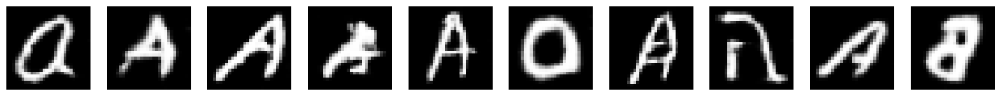

Epoch 300: D Accuracy = 0.6029
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2428 - g_loss: 0.9994 - d_accuracy: 0.6520
Epoch 301/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2328 - g_loss: 1.0135 - d_accuracy: 0.6536
Epoch 302/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2327 - g_loss: 1.0080 - d_accuracy: 0.6618
Epoch 303/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2404 - g_loss: 1.0055 - d_accuracy: 0.6557
Epoch 304/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2219 - g_loss: 1.0203 - d_accuracy: 0.6711
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2354 - g_loss: 1.0086 - d_accuracy: 0.6633
Epoch 306/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2255 - g_loss: 1.0201 - d_accuracy: 0.6683
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2254 - g_loss: 1.0146 - d_accuracy: 0.6647

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2270 - g_loss: 1.0322 - d_accuracy: 0.6597
Epoch 333/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2194 - g_loss: 1.0200 - d_accuracy: 0.6752
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2198 - g_loss: 1.0311 - d_accuracy: 0.6666
Epoch 335/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2290 - g_loss: 1.0196 - d_accuracy: 0.6554
Epoch 336/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2170 - g_loss: 1.0233 - d_accuracy: 0.6699
Epoch 337/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2298 - g_loss: 1.0234 - d_accuracy: 0.6586
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2348 - g_loss: 1.0233 - d_accuracy: 0.6550
Epoch 339/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2305 - g_loss: 1.0244 - d_accuracy: 0.6575
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2031 - g_loss: 1.0522 - d_accuracy: 0.6780
Epoch 365/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2132 - g_loss: 1.0396 - d_accuracy: 0.6737
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2093 - g_loss: 1.0367 - d_accuracy: 0.6811
Epoch 367/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2060 - g_loss: 1.0541 - d_accuracy: 0.6785
Epoch 368/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2075 - g_loss: 1.0417 - d_accuracy: 0.6811
Epoch 369/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2103 - g_loss: 1.0571 - d_accuracy: 0.6752
Epoch 370/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2171 - g_loss: 1.0342 - d_accuracy: 0.6711
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2044 - g_loss: 1.0452 - d_accuracy: 0.6809
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2007 - g_loss: 1.0569 - d_accuracy: 0.6852
Epoch 397/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1926 - g_loss: 1.0626 - d_accuracy: 0.6849
Epoch 398/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.1958 - g_loss: 1.0687 - d_accuracy: 0.6854
Epoch 399/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1966 - g_loss: 1.0465 - d_accuracy: 0.6917
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1852 - g_loss: 1.0725 - d_accuracy: 0.6932
Class 0 — Epoch 400 preview:


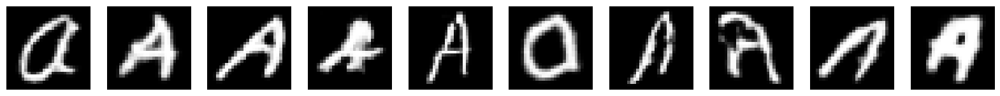

Epoch 400: D Accuracy = 0.6471
27/27 [==============================] - 1s 41ms/step - d_loss: 1.1861 - g_loss: 1.0723 - d_accuracy: 0.6916
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1875 - g_loss: 1.0714 - d_accuracy: 0.6927
Epoch 402/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1976 - g_loss: 1.0650 - d_accuracy: 0.6810
Epoch 403/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1951 - g_loss: 1.0715 - d_accuracy: 0.6841
Epoch 404/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1839 - g_loss: 1.0757 - d_accuracy: 0.6962
Epoch 405/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1971 - g_loss: 1.0532 - d_accuracy: 0.6775
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2006 - g_loss: 1.0670 - d_accuracy: 0.6775
Epoch 407/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1906 - g_loss: 1.0520 - d_accuracy: 0.6950

27/27 [==============================] - 1s 35ms/step - d_loss: 1.1880 - g_loss: 1.0766 - d_accuracy: 0.6809
Epoch 433/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1805 - g_loss: 1.0809 - d_accuracy: 0.6919
Epoch 434/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1875 - g_loss: 1.0821 - d_accuracy: 0.6866
Epoch 435/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1805 - g_loss: 1.0850 - d_accuracy: 0.6998
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1835 - g_loss: 1.0851 - d_accuracy: 0.6910
Epoch 437/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1763 - g_loss: 1.0801 - d_accuracy: 0.6937
Epoch 438/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1885 - g_loss: 1.0866 - d_accuracy: 0.6877
Epoch 439/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1581 - g_loss: 1.1016 - d_accuracy: 0.7121
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1659 - g_loss: 1.0983 - d_accuracy: 0.7063
Epoch 465/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1719 - g_loss: 1.1016 - d_accuracy: 0.7008
Epoch 466/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1688 - g_loss: 1.1002 - d_accuracy: 0.6999
Epoch 467/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.1802 - g_loss: 1.0978 - d_accuracy: 0.6954
Epoch 468/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.1566 - g_loss: 1.1028 - d_accuracy: 0.7094
Epoch 469/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.1761 - g_loss: 1.0978 - d_accuracy: 0.6932
Epoch 470/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1729 - g_loss: 1.0866 - d_accuracy: 0.7006
Epoch 471/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1684 - g_loss: 1.1061 - d_accuracy: 0.7074
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1554 - g_loss: 1.1212 - d_accuracy: 0.7049
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1496 - g_loss: 1.1293 - d_accuracy: 0.7042
Epoch 498/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1529 - g_loss: 1.1200 - d_accuracy: 0.7129
Epoch 499/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1535 - g_loss: 1.1355 - d_accuracy: 0.7099
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1407 - g_loss: 1.1289 - d_accuracy: 0.7228
Class 0 — Epoch 500 preview:


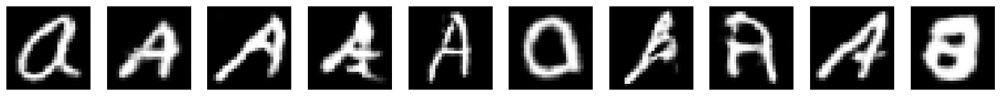

Epoch 500: D Accuracy = 0.7426
27/27 [==============================] - 1s 41ms/step - d_loss: 1.1382 - g_loss: 1.1327 - d_accuracy: 0.7235
Training DCGAN for class 1...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2309 - g_loss: 1.1177 - d_accuracy: 0.6914
Epoch 1: Generator loss improved from inf to 1.2485. Saving weights.
Epoch 1: D Accuracy = 0.6985
27/27 [==============================] - 2s 35ms/step - d_loss: 1.2304 - g_loss: 1.1223 - d_accuracy: 0.6916
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2536 - g_loss: 1.1807 - d_accuracy: 0.7056
Epoch 2: Generator loss improved from 1.2485 to 0.9366. Saving weights.
Epoch 2: D Accuracy = 0.6029
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2622 - g_loss: 1.1720 - d_accuracy: 0.7020
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3407 - g_loss: 1.0101 - d_accuracy: 0.6246
Epoch 4/500
27/27 [==============================] - ETA: 0s

27/27 [==============================] - 1s 34ms/step - d_loss: 1.2243 - g_loss: 0.9978 - d_accuracy: 0.6807
Epoch 31/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2180 - g_loss: 1.0048 - d_accuracy: 0.6868
Epoch 32/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2219 - g_loss: 1.0068 - d_accuracy: 0.6794
Epoch 33/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2199 - g_loss: 1.0067 - d_accuracy: 0.6869
Epoch 34/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2004 - g_loss: 1.0487 - d_accuracy: 0.6886
Epoch 35/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2124 - g_loss: 1.0229 - d_accuracy: 0.6825
Epoch 36/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2012 - g_loss: 1.0507 - d_accuracy: 0.6877
Epoch 37/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2059 - g_loss: 1.0334 - d_accuracy: 0.6893
Epoch 38/500
27/27 [=================

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2988 - g_loss: 0.9670 - d_accuracy: 0.6097
Epoch 63/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2928 - g_loss: 0.9557 - d_accuracy: 0.6160
Epoch 64/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2978 - g_loss: 0.9548 - d_accuracy: 0.6149
Epoch 65/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2917 - g_loss: 0.9520 - d_accuracy: 0.6249
Epoch 66/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2926 - g_loss: 0.9477 - d_accuracy: 0.6176
Epoch 67/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2951 - g_loss: 0.9559 - d_accuracy: 0.6184
Epoch 68/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2929 - g_loss: 0.9469 - d_accuracy: 0.6261
Epoch 69/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2982 - g_loss: 0.9538 - d_accuracy: 0.6152
Epoch 70/500
27/27 [=================

27/27 [==============================] - 1s 37ms/step - d_loss: 1.3036 - g_loss: 0.9299 - d_accuracy: 0.6087
Epoch 95/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3083 - g_loss: 0.9221 - d_accuracy: 0.5983
Epoch 96/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3014 - g_loss: 0.9329 - d_accuracy: 0.6057
Epoch 97/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3055 - g_loss: 0.9245 - d_accuracy: 0.6065
Epoch 98/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3099 - g_loss: 0.9245 - d_accuracy: 0.5986
Epoch 99/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3151 - g_loss: 0.9187 - d_accuracy: 0.6014
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3076 - g_loss: 0.9210 - d_accuracy: 0.6075
Class 1 — Epoch 100 preview:


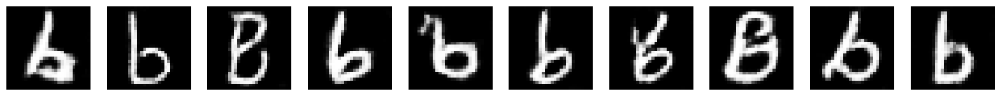

Epoch 100: D Accuracy = 0.5147
27/27 [==============================] - 1s 43ms/step - d_loss: 1.3113 - g_loss: 0.9190 - d_accuracy: 0.6041
Epoch 101/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3059 - g_loss: 0.9280 - d_accuracy: 0.6020
Epoch 102/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3094 - g_loss: 0.9200 - d_accuracy: 0.5941
Epoch 103/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3174 - g_loss: 0.9167 - d_accuracy: 0.5926
Epoch 104/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3127 - g_loss: 0.9190 - d_accuracy: 0.6038
Epoch 105/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3039 - g_loss: 0.9205 - d_accuracy: 0.6036
Epoch 106/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2923 - g_loss: 0.9377 - d_accuracy: 0.6142
Epoch 107/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3116 - g_loss: 0.9171 - d_accuracy: 0.6033

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2922 - g_loss: 0.9351 - d_accuracy: 0.6221
Epoch 133/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3010 - g_loss: 0.9234 - d_accuracy: 0.6020
Epoch 134/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2960 - g_loss: 0.9290 - d_accuracy: 0.6112
Epoch 135/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3061 - g_loss: 0.9135 - d_accuracy: 0.6045
Epoch 136/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3063 - g_loss: 0.9229 - d_accuracy: 0.6008
Epoch 137/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2923 - g_loss: 0.9251 - d_accuracy: 0.6162
Epoch 138/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2888 - g_loss: 0.9396 - d_accuracy: 0.6168
Epoch 139/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3064 - g_loss: 0.9204 - d_accuracy: 0.6076
Epoch 139: Generator loss improved 

Epoch 164/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2885 - g_loss: 0.9323 - d_accuracy: 0.6191
Epoch 165/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3008 - g_loss: 0.9215 - d_accuracy: 0.6064
Epoch 166/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2965 - g_loss: 0.9319 - d_accuracy: 0.6148
Epoch 167/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2944 - g_loss: 0.9271 - d_accuracy: 0.6162
Epoch 168/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2953 - g_loss: 0.9360 - d_accuracy: 0.6098
Epoch 169/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2869 - g_loss: 0.9313 - d_accuracy: 0.6217
Epoch 170/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3009 - g_loss: 0.9260 - d_accuracy: 0.6006
Epoch 171/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2977 - g_loss: 0.9223 - d_accuracy: 0.6125
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2739 - g_loss: 0.9415 - d_accuracy: 0.6312
Epoch 197/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2968 - g_loss: 0.9299 - d_accuracy: 0.6106
Epoch 198/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2869 - g_loss: 0.9443 - d_accuracy: 0.6178
Epoch 199/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2687 - g_loss: 0.9506 - d_accuracy: 0.6325
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2961 - g_loss: 0.9329 - d_accuracy: 0.6177
Class 1 — Epoch 200 preview:


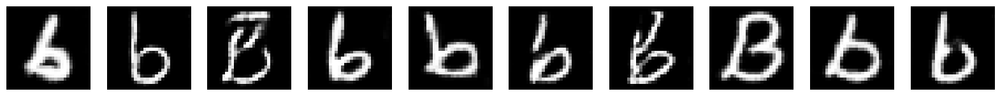

Epoch 200: D Accuracy = 0.5956
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2963 - g_loss: 0.9307 - d_accuracy: 0.6169
Epoch 201/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2880 - g_loss: 0.9433 - d_accuracy: 0.6137
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2873 - g_loss: 0.9385 - d_accuracy: 0.6152
Epoch 203/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2859 - g_loss: 0.9334 - d_accuracy: 0.6165
Epoch 204/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2705 - g_loss: 0.9486 - d_accuracy: 0.6325
Epoch 205/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2928 - g_loss: 0.9411 - d_accuracy: 0.6121
Epoch 206/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2800 - g_loss: 0.9415 - d_accuracy: 0.6254
Epoch 207/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2857 - g_loss: 0.9404 - d_accuracy: 0.6211

27/27 [==============================] - 1s 34ms/step - d_loss: 1.2732 - g_loss: 0.9482 - d_accuracy: 0.6252
Epoch 233/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2722 - g_loss: 0.9525 - d_accuracy: 0.6321
Epoch 234/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2623 - g_loss: 0.9640 - d_accuracy: 0.6357
Epoch 235/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2770 - g_loss: 0.9543 - d_accuracy: 0.6233
Epoch 236/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2757 - g_loss: 0.9616 - d_accuracy: 0.6352
Epoch 237/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2782 - g_loss: 0.9408 - d_accuracy: 0.6300
Epoch 238/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2688 - g_loss: 0.9647 - d_accuracy: 0.6371
Epoch 239/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2646 - g_loss: 0.9605 - d_accuracy: 0.6348
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2743 - g_loss: 0.9515 - d_accuracy: 0.6273
Epoch 265/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2568 - g_loss: 0.9766 - d_accuracy: 0.6403
Epoch 266/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2622 - g_loss: 0.9684 - d_accuracy: 0.6412
Epoch 267/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2569 - g_loss: 0.9705 - d_accuracy: 0.6456
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2512 - g_loss: 0.9768 - d_accuracy: 0.6481
Epoch 269/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2619 - g_loss: 0.9718 - d_accuracy: 0.6459
Epoch 270/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2666 - g_loss: 0.9598 - d_accuracy: 0.6403
Epoch 271/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2594 - g_loss: 0.9624 - d_accuracy: 0.6372
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2384 - g_loss: 0.9893 - d_accuracy: 0.6554
Epoch 297/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2450 - g_loss: 0.9842 - d_accuracy: 0.6526
Epoch 298/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2443 - g_loss: 0.9777 - d_accuracy: 0.6432
Epoch 299/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2429 - g_loss: 0.9904 - d_accuracy: 0.6577
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2341 - g_loss: 0.9936 - d_accuracy: 0.6558
Class 1 — Epoch 300 preview:


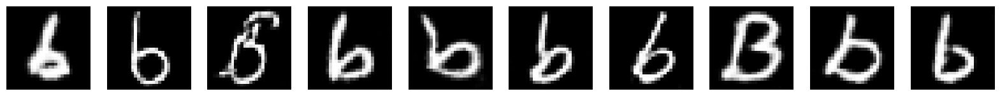

Epoch 300: D Accuracy = 0.7132
27/27 [==============================] - 1s 40ms/step - d_loss: 1.2327 - g_loss: 0.9944 - d_accuracy: 0.6578
Epoch 301/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2462 - g_loss: 0.9951 - d_accuracy: 0.6439
Epoch 302/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2380 - g_loss: 0.9883 - d_accuracy: 0.6517
Epoch 303/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2474 - g_loss: 0.9899 - d_accuracy: 0.6438
Epoch 304/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2378 - g_loss: 0.9883 - d_accuracy: 0.6590
Epoch 305/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2467 - g_loss: 0.9902 - d_accuracy: 0.6470
Epoch 306/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2451 - g_loss: 0.9864 - d_accuracy: 0.6499
Epoch 307/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2445 - g_loss: 0.9861 - d_accuracy: 0.6509

27/27 [==============================] - 1s 36ms/step - d_loss: 1.2268 - g_loss: 1.0022 - d_accuracy: 0.6594
Epoch 333/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2325 - g_loss: 1.0098 - d_accuracy: 0.6600
Epoch 334/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2267 - g_loss: 1.0042 - d_accuracy: 0.6586
Epoch 335/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2304 - g_loss: 1.0023 - d_accuracy: 0.6543
Epoch 336/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2275 - g_loss: 1.0084 - d_accuracy: 0.6688
Epoch 337/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2390 - g_loss: 0.9962 - d_accuracy: 0.6581
Epoch 338/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2228 - g_loss: 1.0038 - d_accuracy: 0.6705
Epoch 339/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2324 - g_loss: 1.0138 - d_accuracy: 0.6637
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2109 - g_loss: 1.0303 - d_accuracy: 0.6707
Epoch 365/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2204 - g_loss: 1.0209 - d_accuracy: 0.6710
Epoch 366/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2029 - g_loss: 1.0320 - d_accuracy: 0.6786
Epoch 367/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2134 - g_loss: 1.0371 - d_accuracy: 0.6706
Epoch 368/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2180 - g_loss: 1.0302 - d_accuracy: 0.6668
Epoch 369/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2117 - g_loss: 1.0319 - d_accuracy: 0.6718
Epoch 370/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2069 - g_loss: 1.0276 - d_accuracy: 0.6757
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2241 - g_loss: 1.0180 - d_accuracy: 0.6623
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2089 - g_loss: 1.0467 - d_accuracy: 0.6767
Epoch 397/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1975 - g_loss: 1.0437 - d_accuracy: 0.6760
Epoch 398/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2039 - g_loss: 1.0565 - d_accuracy: 0.6718
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1998 - g_loss: 1.0450 - d_accuracy: 0.6806
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1991 - g_loss: 1.0533 - d_accuracy: 0.6803
Class 1 — Epoch 400 preview:


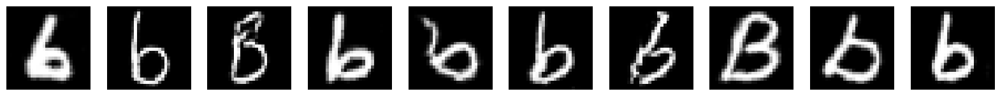

Epoch 400: D Accuracy = 0.6618
27/27 [==============================] - 1s 48ms/step - d_loss: 1.2012 - g_loss: 1.0494 - d_accuracy: 0.6797
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2054 - g_loss: 1.0584 - d_accuracy: 0.6776
Epoch 402/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1975 - g_loss: 1.0463 - d_accuracy: 0.6772
Epoch 403/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2015 - g_loss: 1.0537 - d_accuracy: 0.6778
Epoch 404/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1992 - g_loss: 1.0451 - d_accuracy: 0.6772
Epoch 405/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2039 - g_loss: 1.0526 - d_accuracy: 0.6747
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1981 - g_loss: 1.0452 - d_accuracy: 0.6835
Epoch 407/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2159 - g_loss: 1.0432 - d_accuracy: 0.6682

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2027 - g_loss: 1.0598 - d_accuracy: 0.6789
Epoch 433/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1799 - g_loss: 1.0731 - d_accuracy: 0.6914
Epoch 434/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1810 - g_loss: 1.0769 - d_accuracy: 0.6864
Epoch 435/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1826 - g_loss: 1.0717 - d_accuracy: 0.6916
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1822 - g_loss: 1.0724 - d_accuracy: 0.6897
Epoch 437/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1831 - g_loss: 1.0839 - d_accuracy: 0.6847
Epoch 438/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1970 - g_loss: 1.0616 - d_accuracy: 0.6806
Epoch 439/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1902 - g_loss: 1.0762 - d_accuracy: 0.6859
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1823 - g_loss: 1.0718 - d_accuracy: 0.6941
Epoch 465/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1658 - g_loss: 1.0984 - d_accuracy: 0.7034
Epoch 466/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1709 - g_loss: 1.0966 - d_accuracy: 0.7007
Epoch 467/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1743 - g_loss: 1.1022 - d_accuracy: 0.6865
Epoch 468/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1692 - g_loss: 1.0939 - d_accuracy: 0.6993
Epoch 469/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1686 - g_loss: 1.1094 - d_accuracy: 0.6945
Epoch 470/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1668 - g_loss: 1.1061 - d_accuracy: 0.7003
Epoch 471/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1724 - g_loss: 1.0883 - d_accuracy: 0.6976
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1532 - g_loss: 1.1345 - d_accuracy: 0.7047
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1599 - g_loss: 1.1235 - d_accuracy: 0.7001
Epoch 498/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1609 - g_loss: 1.1140 - d_accuracy: 0.7053
Epoch 499/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1666 - g_loss: 1.1090 - d_accuracy: 0.6985
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1526 - g_loss: 1.1186 - d_accuracy: 0.7095
Class 1 — Epoch 500 preview:


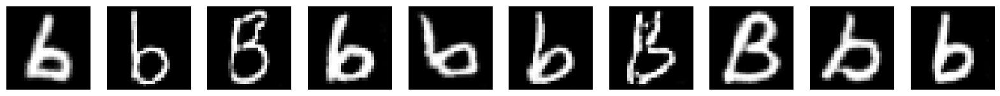

Epoch 500: D Accuracy = 0.7279
27/27 [==============================] - 1s 41ms/step - d_loss: 1.1530 - g_loss: 1.1165 - d_accuracy: 0.7102
Training DCGAN for class 2...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0894 - g_loss: 1.2750 - d_accuracy: 0.7545
Epoch 1: Generator loss improved from inf to 1.5355. Saving weights.
Epoch 1: D Accuracy = 0.8786
27/27 [==============================] - 2s 36ms/step - d_loss: 1.0801 - g_loss: 1.2843 - d_accuracy: 0.7589
Epoch 2/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.6348 - g_loss: 2.2465 - d_accuracy: 0.9352
Epoch 3/500
27/27 [==============================] - ETA: 0s - d_loss: 0.6287 - g_loss: 2.9021 - d_accuracy: 0.9183
Epoch 3: Generator loss improved from 1.5355 to 1.3840. Saving weights.
Epoch 3: D Accuracy = 0.7429
27/27 [==============================] - 1s 35ms/step - d_loss: 0.6477 - g_loss: 2.8478 - d_accuracy: 0.9120
Epoch 4/500
27/27 [==============================] - 1s 34ms

27/27 [==============================] - 1s 37ms/step - d_loss: 1.0945 - g_loss: 1.2472 - d_accuracy: 0.7433
Epoch 31/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0949 - g_loss: 1.2572 - d_accuracy: 0.7385
Epoch 32/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1031 - g_loss: 1.2494 - d_accuracy: 0.7377
Epoch 33/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1021 - g_loss: 1.2546 - d_accuracy: 0.7404
Epoch 34/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1159 - g_loss: 1.2838 - d_accuracy: 0.7174
Epoch 35/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1041 - g_loss: 1.2525 - d_accuracy: 0.7374
Epoch 36/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1219 - g_loss: 1.2333 - d_accuracy: 0.7354
Epoch 37/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1295 - g_loss: 1.2397 - d_accuracy: 0.7207
Epoch 38/500
27/27 [=================

27/27 [==============================] - 1s 34ms/step - d_loss: 1.2590 - g_loss: 1.0349 - d_accuracy: 0.6477
Epoch 63/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2480 - g_loss: 1.0355 - d_accuracy: 0.6496
Epoch 64/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2528 - g_loss: 1.0407 - d_accuracy: 0.6537
Epoch 65/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2552 - g_loss: 1.0384 - d_accuracy: 0.6460
Epoch 66/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2631 - g_loss: 1.0209 - d_accuracy: 0.6439
Epoch 67/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2627 - g_loss: 1.0211 - d_accuracy: 0.6483
Epoch 68/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2649 - g_loss: 1.0128 - d_accuracy: 0.6485
Epoch 69/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2750 - g_loss: 1.0040 - d_accuracy: 0.6361
Epoch 70/500
27/27 [=================

Epoch 94/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2879 - g_loss: 0.9650 - d_accuracy: 0.6298
Epoch 95/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2881 - g_loss: 0.9788 - d_accuracy: 0.6156
Epoch 96/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2928 - g_loss: 0.9764 - d_accuracy: 0.6200
Epoch 97/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2833 - g_loss: 0.9760 - d_accuracy: 0.6251
Epoch 98/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2939 - g_loss: 0.9631 - d_accuracy: 0.6163
Epoch 99/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3044 - g_loss: 0.9579 - d_accuracy: 0.6109
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2876 - g_loss: 0.9760 - d_accuracy: 0.6216
Class 2 — Epoch 100 preview:


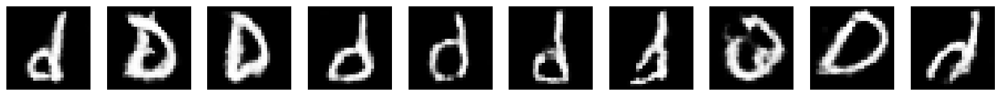

Epoch 100: D Accuracy = 0.6571
27/27 [==============================] - 1s 45ms/step - d_loss: 1.2871 - g_loss: 0.9740 - d_accuracy: 0.6228
Epoch 101/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2780 - g_loss: 0.9753 - d_accuracy: 0.6322
Epoch 102/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2975 - g_loss: 0.9660 - d_accuracy: 0.6183
Epoch 103/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2891 - g_loss: 0.9714 - d_accuracy: 0.6217
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2894 - g_loss: 0.9662 - d_accuracy: 0.6170
Epoch 105/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2859 - g_loss: 0.9782 - d_accuracy: 0.6269
Epoch 106/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.2971 - g_loss: 0.9593 - d_accuracy: 0.6166
Epoch 107/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2773 - g_loss: 0.9786 - d_accuracy: 0.6300

27/27 [==============================] - 1s 36ms/step - d_loss: 1.2931 - g_loss: 0.9578 - d_accuracy: 0.6190
Epoch 133/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2837 - g_loss: 0.9624 - d_accuracy: 0.6175
Epoch 134/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2898 - g_loss: 0.9541 - d_accuracy: 0.6212
Epoch 135/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3032 - g_loss: 0.9518 - d_accuracy: 0.6120
Epoch 136/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3009 - g_loss: 0.9534 - d_accuracy: 0.6066
Epoch 137/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2917 - g_loss: 0.9576 - d_accuracy: 0.6158
Epoch 138/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3013 - g_loss: 0.9536 - d_accuracy: 0.6136
Epoch 139/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3035 - g_loss: 0.9472 - d_accuracy: 0.6090
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3013 - g_loss: 0.9390 - d_accuracy: 0.6109
Epoch 165/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2940 - g_loss: 0.9477 - d_accuracy: 0.6147
Epoch 166/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2831 - g_loss: 0.9578 - d_accuracy: 0.6197
Epoch 167/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2994 - g_loss: 0.9492 - d_accuracy: 0.6137
Epoch 168/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2942 - g_loss: 0.9500 - d_accuracy: 0.6134
Epoch 169/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2923 - g_loss: 0.9593 - d_accuracy: 0.6176
Epoch 170/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2901 - g_loss: 0.9486 - d_accuracy: 0.6156
Epoch 171/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2925 - g_loss: 0.9550 - d_accuracy: 0.6175
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2870 - g_loss: 0.9580 - d_accuracy: 0.6266
Epoch 197/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2718 - g_loss: 0.9733 - d_accuracy: 0.6261
Epoch 198/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2739 - g_loss: 0.9652 - d_accuracy: 0.6275
Epoch 199/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2820 - g_loss: 0.9624 - d_accuracy: 0.6297
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2802 - g_loss: 0.9615 - d_accuracy: 0.6215
Class 2 — Epoch 200 preview:


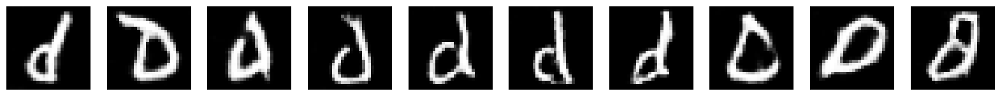

Epoch 200: D Accuracy = 0.5929
27/27 [==============================] - 1s 44ms/step - d_loss: 1.2811 - g_loss: 0.9620 - d_accuracy: 0.6205
Epoch 201/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2970 - g_loss: 0.9454 - d_accuracy: 0.6165
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2932 - g_loss: 0.9493 - d_accuracy: 0.6155
Epoch 203/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2807 - g_loss: 0.9642 - d_accuracy: 0.6200
Epoch 204/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2803 - g_loss: 0.9663 - d_accuracy: 0.6260
Epoch 205/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2725 - g_loss: 0.9635 - d_accuracy: 0.6298
Epoch 206/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2839 - g_loss: 0.9586 - d_accuracy: 0.6236
Epoch 207/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2779 - g_loss: 0.9607 - d_accuracy: 0.6262

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2537 - g_loss: 0.9853 - d_accuracy: 0.6470
Epoch 233/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2681 - g_loss: 0.9702 - d_accuracy: 0.6342
Epoch 234/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2531 - g_loss: 0.9911 - d_accuracy: 0.6395
Epoch 235/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2650 - g_loss: 0.9801 - d_accuracy: 0.6336
Epoch 236/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2664 - g_loss: 0.9812 - d_accuracy: 0.6346
Epoch 237/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2751 - g_loss: 0.9723 - d_accuracy: 0.6275
Epoch 238/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2730 - g_loss: 0.9607 - d_accuracy: 0.6310
Epoch 239/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2613 - g_loss: 0.9801 - d_accuracy: 0.6404
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2677 - g_loss: 0.9842 - d_accuracy: 0.6320
Epoch 265/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2494 - g_loss: 0.9976 - d_accuracy: 0.6473
Epoch 266/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2472 - g_loss: 1.0102 - d_accuracy: 0.6446
Epoch 267/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2553 - g_loss: 0.9959 - d_accuracy: 0.6415
Epoch 268/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2441 - g_loss: 0.9917 - d_accuracy: 0.6554
Epoch 269/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2464 - g_loss: 1.0040 - d_accuracy: 0.6459
Epoch 270/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2488 - g_loss: 0.9950 - d_accuracy: 0.6487
Epoch 271/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2395 - g_loss: 0.9939 - d_accuracy: 0.6548
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2392 - g_loss: 1.0126 - d_accuracy: 0.6549
Epoch 297/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2544 - g_loss: 0.9996 - d_accuracy: 0.6380
Epoch 298/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2484 - g_loss: 0.9983 - d_accuracy: 0.6522
Epoch 299/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2500 - g_loss: 0.9910 - d_accuracy: 0.6451
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2441 - g_loss: 1.0122 - d_accuracy: 0.6436
Class 2 — Epoch 300 preview:


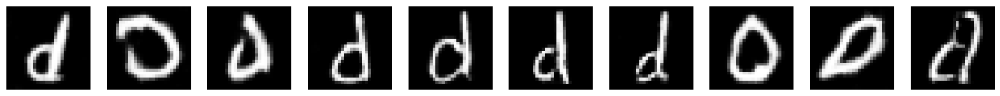

Epoch 300: D Accuracy = 0.6357
27/27 [==============================] - 1s 40ms/step - d_loss: 1.2427 - g_loss: 1.0193 - d_accuracy: 0.6433
Epoch 301/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2410 - g_loss: 1.0045 - d_accuracy: 0.6540
Epoch 302/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2447 - g_loss: 0.9977 - d_accuracy: 0.6486
Epoch 303/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2300 - g_loss: 1.0172 - d_accuracy: 0.6637
Epoch 304/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2231 - g_loss: 1.0294 - d_accuracy: 0.6656
Epoch 305/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2465 - g_loss: 1.0051 - d_accuracy: 0.6499
Epoch 306/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2344 - g_loss: 1.0046 - d_accuracy: 0.6649
Epoch 307/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2407 - g_loss: 0.9999 - d_accuracy: 0.6551

27/27 [==============================] - 1s 37ms/step - d_loss: 1.2287 - g_loss: 1.0335 - d_accuracy: 0.6674
Epoch 333/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2312 - g_loss: 1.0230 - d_accuracy: 0.6559
Epoch 334/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2164 - g_loss: 1.0306 - d_accuracy: 0.6699
Epoch 335/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2178 - g_loss: 1.0357 - d_accuracy: 0.6724
Epoch 336/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2019 - g_loss: 1.0357 - d_accuracy: 0.6783
Epoch 337/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2069 - g_loss: 1.0404 - d_accuracy: 0.6772
Epoch 338/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2350 - g_loss: 1.0313 - d_accuracy: 0.6585
Epoch 339/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2383 - g_loss: 1.0161 - d_accuracy: 0.6572
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2153 - g_loss: 1.0469 - d_accuracy: 0.6693
Epoch 365/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2091 - g_loss: 1.0419 - d_accuracy: 0.6744
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1998 - g_loss: 1.0607 - d_accuracy: 0.6803
Epoch 367/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2157 - g_loss: 1.0339 - d_accuracy: 0.6726
Epoch 368/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2133 - g_loss: 1.0499 - d_accuracy: 0.6769
Epoch 369/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2129 - g_loss: 1.0390 - d_accuracy: 0.6734
Epoch 370/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2048 - g_loss: 1.0499 - d_accuracy: 0.6791
Epoch 371/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2077 - g_loss: 1.0576 - d_accuracy: 0.6710
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1964 - g_loss: 1.0584 - d_accuracy: 0.6842
Epoch 397/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1999 - g_loss: 1.0618 - d_accuracy: 0.6722
Epoch 398/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1912 - g_loss: 1.0691 - d_accuracy: 0.6898
Epoch 399/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2086 - g_loss: 1.0584 - d_accuracy: 0.6759
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2088 - g_loss: 1.0516 - d_accuracy: 0.6744
Class 2 — Epoch 400 preview:


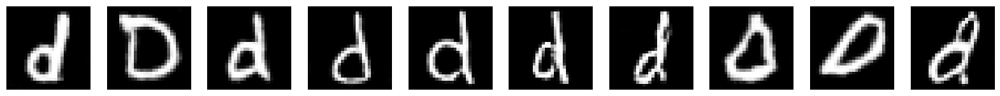

Epoch 400: D Accuracy = 0.6357
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2109 - g_loss: 1.0468 - d_accuracy: 0.6731
Epoch 401/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2106 - g_loss: 1.0575 - d_accuracy: 0.6671
Epoch 402/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2017 - g_loss: 1.0736 - d_accuracy: 0.6773
Epoch 403/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2000 - g_loss: 1.0547 - d_accuracy: 0.6765
Epoch 404/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1920 - g_loss: 1.0832 - d_accuracy: 0.6816
Epoch 405/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1916 - g_loss: 1.0641 - d_accuracy: 0.6851
Epoch 406/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1904 - g_loss: 1.0750 - d_accuracy: 0.6857
Epoch 407/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1944 - g_loss: 1.0821 - d_accuracy: 0.6802

27/27 [==============================] - 1s 36ms/step - d_loss: 1.1828 - g_loss: 1.0711 - d_accuracy: 0.6939
Epoch 433/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1753 - g_loss: 1.0867 - d_accuracy: 0.6912
Epoch 434/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1920 - g_loss: 1.0941 - d_accuracy: 0.6817
Epoch 435/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1793 - g_loss: 1.0804 - d_accuracy: 0.6936
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1892 - g_loss: 1.0799 - d_accuracy: 0.6912
Epoch 437/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1753 - g_loss: 1.1005 - d_accuracy: 0.6937
Epoch 438/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1776 - g_loss: 1.1020 - d_accuracy: 0.6854
Epoch 439/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1811 - g_loss: 1.0850 - d_accuracy: 0.6948
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1676 - g_loss: 1.1141 - d_accuracy: 0.6925
Epoch 465/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1697 - g_loss: 1.0970 - d_accuracy: 0.6952
Epoch 466/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1706 - g_loss: 1.1022 - d_accuracy: 0.6963
Epoch 467/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1753 - g_loss: 1.0964 - d_accuracy: 0.6912
Epoch 468/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1710 - g_loss: 1.1090 - d_accuracy: 0.7019
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1720 - g_loss: 1.1004 - d_accuracy: 0.6972
Epoch 470/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1679 - g_loss: 1.1178 - d_accuracy: 0.6994
Epoch 471/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1649 - g_loss: 1.1058 - d_accuracy: 0.7041
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1583 - g_loss: 1.1216 - d_accuracy: 0.7057
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1674 - g_loss: 1.1136 - d_accuracy: 0.7001
Epoch 498/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1620 - g_loss: 1.1196 - d_accuracy: 0.7067
Epoch 499/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1592 - g_loss: 1.1214 - d_accuracy: 0.7069
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1539 - g_loss: 1.1385 - d_accuracy: 0.7088
Class 2 — Epoch 500 preview:


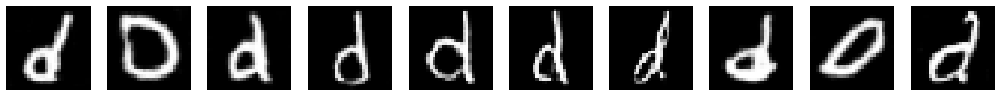

Epoch 500: D Accuracy = 0.6071
27/27 [==============================] - 1s 48ms/step - d_loss: 1.1564 - g_loss: 1.1519 - d_accuracy: 0.7052
Training DCGAN for class 3...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0844 - g_loss: 1.3002 - d_accuracy: 0.7607
Epoch 1: Generator loss improved from inf to 1.6538. Saving weights.
Epoch 1: D Accuracy = 0.8211
27/27 [==============================] - 2s 36ms/step - d_loss: 1.0776 - g_loss: 1.3128 - d_accuracy: 0.7629
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1493 - g_loss: 1.3162 - d_accuracy: 0.7449
Epoch 2: Generator loss improved from 1.6538 to 1.2958. Saving weights.
Epoch 2: D Accuracy = 0.7018
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1506 - g_loss: 1.3155 - d_accuracy: 0.7434
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0755 - g_loss: 1.3719 - d_accuracy: 0.7656
Epoch 4/500
27/27 [==============================] - 1s 34ms

Epoch 31/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3159 - g_loss: 0.9041 - d_accuracy: 0.5951
Epoch 32/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3082 - g_loss: 0.9106 - d_accuracy: 0.6023
Epoch 33/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3125 - g_loss: 0.9053 - d_accuracy: 0.6059
Epoch 34/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3071 - g_loss: 0.9114 - d_accuracy: 0.6041
Epoch 35/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3154 - g_loss: 0.9062 - d_accuracy: 0.6007
Epoch 36/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3082 - g_loss: 0.9118 - d_accuracy: 0.6100
Epoch 37/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3173 - g_loss: 0.9095 - d_accuracy: 0.6026
Epoch 38/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3180 - g_loss: 0.9083 - d_accuracy: 0.5996
Epoch 39/500
27/27 [====

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3290 - g_loss: 0.8860 - d_accuracy: 0.5950
Epoch 64/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3275 - g_loss: 0.8907 - d_accuracy: 0.5910
Epoch 65/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3181 - g_loss: 0.8957 - d_accuracy: 0.5990
Epoch 66/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3217 - g_loss: 0.8945 - d_accuracy: 0.5882
Epoch 67/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3232 - g_loss: 0.8866 - d_accuracy: 0.5910
Epoch 68/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3195 - g_loss: 0.9014 - d_accuracy: 0.5952
Epoch 69/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3218 - g_loss: 0.8936 - d_accuracy: 0.5954
Epoch 70/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3263 - g_loss: 0.8921 - d_accuracy: 0.5852
Epoch 71/500
27/27 [=================

Epoch 95/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3415 - g_loss: 0.8650 - d_accuracy: 0.5650
Epoch 96/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3458 - g_loss: 0.8698 - d_accuracy: 0.5623
Epoch 97/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3378 - g_loss: 0.8664 - d_accuracy: 0.5730
Epoch 98/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3387 - g_loss: 0.8646 - d_accuracy: 0.5750
Epoch 99/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3527 - g_loss: 0.8649 - d_accuracy: 0.5581
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3477 - g_loss: 0.8618 - d_accuracy: 0.5653
Class 3 — Epoch 100 preview:


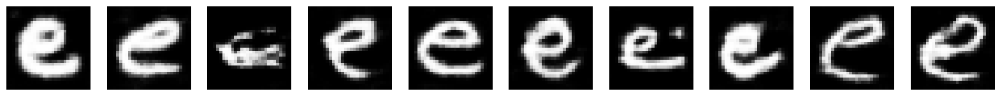

Epoch 100: D Accuracy = 0.5183
27/27 [==============================] - 1s 42ms/step - d_loss: 1.3486 - g_loss: 0.8609 - d_accuracy: 0.5637
Epoch 101/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3452 - g_loss: 0.8616 - d_accuracy: 0.5707
Epoch 102/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3501 - g_loss: 0.8596 - d_accuracy: 0.5585
Epoch 103/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3493 - g_loss: 0.8590 - d_accuracy: 0.5642
Epoch 104/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3509 - g_loss: 0.8553 - d_accuracy: 0.5629
Epoch 105/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3472 - g_loss: 0.8601 - d_accuracy: 0.5644
Epoch 106/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3491 - g_loss: 0.8579 - d_accuracy: 0.5660
Epoch 107/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3550 - g_loss: 0.8560 - d_accuracy: 0.5549

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3508 - g_loss: 0.8508 - d_accuracy: 0.5471
Epoch 133/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3486 - g_loss: 0.8548 - d_accuracy: 0.5568
Epoch 134/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3517 - g_loss: 0.8540 - d_accuracy: 0.5524
Epoch 135/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3521 - g_loss: 0.8477 - d_accuracy: 0.5566
Epoch 136/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3535 - g_loss: 0.8487 - d_accuracy: 0.5552
Epoch 137/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3434 - g_loss: 0.8598 - d_accuracy: 0.5673
Epoch 138/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3475 - g_loss: 0.8543 - d_accuracy: 0.5626
Epoch 139/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3522 - g_loss: 0.8526 - d_accuracy: 0.5536
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3454 - g_loss: 0.8555 - d_accuracy: 0.5604
Epoch 165/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3461 - g_loss: 0.8543 - d_accuracy: 0.5615
Epoch 166/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3451 - g_loss: 0.8530 - d_accuracy: 0.5620
Epoch 167/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3360 - g_loss: 0.8649 - d_accuracy: 0.5659
Epoch 168/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3462 - g_loss: 0.8543 - d_accuracy: 0.5614
Epoch 169/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3453 - g_loss: 0.8569 - d_accuracy: 0.5588
Epoch 170/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3482 - g_loss: 0.8545 - d_accuracy: 0.5575
Epoch 171/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3388 - g_loss: 0.8614 - d_accuracy: 0.5695
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3401 - g_loss: 0.8609 - d_accuracy: 0.5638
Epoch 197/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3410 - g_loss: 0.8608 - d_accuracy: 0.5608
Epoch 198/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3432 - g_loss: 0.8612 - d_accuracy: 0.5688
Epoch 199/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3387 - g_loss: 0.8618 - d_accuracy: 0.5639
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3419 - g_loss: 0.8596 - d_accuracy: 0.5598
Class 3 — Epoch 200 preview:


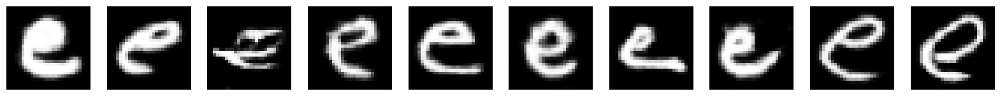

Epoch 200: D Accuracy = 0.5688
27/27 [==============================] - 1s 40ms/step - d_loss: 1.3420 - g_loss: 0.8605 - d_accuracy: 0.5602
Epoch 201/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3351 - g_loss: 0.8616 - d_accuracy: 0.5712
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3390 - g_loss: 0.8635 - d_accuracy: 0.5647
Epoch 203/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3421 - g_loss: 0.8591 - d_accuracy: 0.5655
Epoch 204/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3387 - g_loss: 0.8604 - d_accuracy: 0.5746
Epoch 205/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3354 - g_loss: 0.8637 - d_accuracy: 0.5698
Epoch 206/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3387 - g_loss: 0.8637 - d_accuracy: 0.5627
Epoch 207/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3358 - g_loss: 0.8647 - d_accuracy: 0.5716

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3331 - g_loss: 0.8669 - d_accuracy: 0.5712
Epoch 233/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3298 - g_loss: 0.8722 - d_accuracy: 0.5741
Epoch 234/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3362 - g_loss: 0.8641 - d_accuracy: 0.5650
Epoch 235/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3328 - g_loss: 0.8649 - d_accuracy: 0.5687
Epoch 236/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3285 - g_loss: 0.8685 - d_accuracy: 0.5746
Epoch 237/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3267 - g_loss: 0.8721 - d_accuracy: 0.5805
Epoch 238/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3278 - g_loss: 0.8718 - d_accuracy: 0.5722
Epoch 239/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3257 - g_loss: 0.8770 - d_accuracy: 0.5704
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3270 - g_loss: 0.8760 - d_accuracy: 0.5807
Epoch 265/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3184 - g_loss: 0.8783 - d_accuracy: 0.5912
Epoch 266/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3188 - g_loss: 0.8776 - d_accuracy: 0.5834
Epoch 267/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3194 - g_loss: 0.8838 - d_accuracy: 0.5866
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3230 - g_loss: 0.8758 - d_accuracy: 0.5808
Epoch 269/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3197 - g_loss: 0.8789 - d_accuracy: 0.5833
Epoch 270/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3152 - g_loss: 0.8877 - d_accuracy: 0.5949
Epoch 271/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3249 - g_loss: 0.8767 - d_accuracy: 0.5733
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3068 - g_loss: 0.8889 - d_accuracy: 0.5999
Epoch 297/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3151 - g_loss: 0.8876 - d_accuracy: 0.5869
Epoch 298/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3182 - g_loss: 0.8827 - d_accuracy: 0.5859
Epoch 299/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3164 - g_loss: 0.8861 - d_accuracy: 0.5938
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3069 - g_loss: 0.8910 - d_accuracy: 0.6000
Class 3 — Epoch 300 preview:


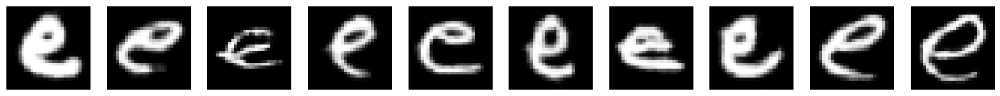

Epoch 300: D Accuracy = 0.5826
27/27 [==============================] - 1s 41ms/step - d_loss: 1.3078 - g_loss: 0.8901 - d_accuracy: 0.5994
Epoch 301/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3082 - g_loss: 0.8984 - d_accuracy: 0.5964
Epoch 302/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3095 - g_loss: 0.8901 - d_accuracy: 0.5948
Epoch 303/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3053 - g_loss: 0.8972 - d_accuracy: 0.5902
Epoch 304/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3129 - g_loss: 0.8936 - d_accuracy: 0.5916
Epoch 305/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3121 - g_loss: 0.8845 - d_accuracy: 0.5949
Epoch 306/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3159 - g_loss: 0.8915 - d_accuracy: 0.5895
Epoch 307/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3078 - g_loss: 0.8922 - d_accuracy: 0.5910

27/27 [==============================] - 1s 38ms/step - d_loss: 1.3042 - g_loss: 0.9044 - d_accuracy: 0.6010
Epoch 333/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2988 - g_loss: 0.9051 - d_accuracy: 0.6020
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3006 - g_loss: 0.9008 - d_accuracy: 0.6097
Epoch 335/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3029 - g_loss: 0.8984 - d_accuracy: 0.5946
Epoch 336/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2963 - g_loss: 0.9061 - d_accuracy: 0.6060
Epoch 337/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2972 - g_loss: 0.9130 - d_accuracy: 0.5987
Epoch 338/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2988 - g_loss: 0.9025 - d_accuracy: 0.6014
Epoch 339/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2981 - g_loss: 0.9084 - d_accuracy: 0.6046
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2925 - g_loss: 0.9109 - d_accuracy: 0.6083
Epoch 365/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2941 - g_loss: 0.9110 - d_accuracy: 0.6087
Epoch 366/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2855 - g_loss: 0.9165 - d_accuracy: 0.6169
Epoch 367/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2849 - g_loss: 0.9206 - d_accuracy: 0.6182
Epoch 368/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2914 - g_loss: 0.9171 - d_accuracy: 0.6128
Epoch 369/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2874 - g_loss: 0.9165 - d_accuracy: 0.6226
Epoch 370/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2855 - g_loss: 0.9257 - d_accuracy: 0.6153
Epoch 371/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2913 - g_loss: 0.9174 - d_accuracy: 0.6095
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2656 - g_loss: 0.9434 - d_accuracy: 0.6348
Epoch 397/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2680 - g_loss: 0.9342 - d_accuracy: 0.6325
Epoch 398/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2695 - g_loss: 0.9375 - d_accuracy: 0.6341
Epoch 399/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2723 - g_loss: 0.9400 - d_accuracy: 0.6244
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2770 - g_loss: 0.9342 - d_accuracy: 0.6208
Class 3 — Epoch 400 preview:


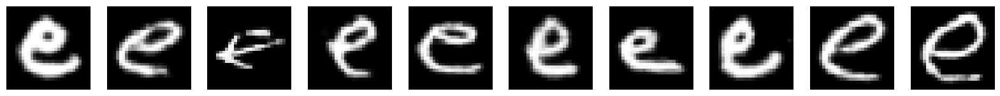

Epoch 400: D Accuracy = 0.6101
27/27 [==============================] - 1s 43ms/step - d_loss: 1.2769 - g_loss: 0.9352 - d_accuracy: 0.6204
Epoch 401/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2782 - g_loss: 0.9298 - d_accuracy: 0.6157
Epoch 402/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2663 - g_loss: 0.9411 - d_accuracy: 0.6317
Epoch 403/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2704 - g_loss: 0.9403 - d_accuracy: 0.6263
Epoch 404/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2667 - g_loss: 0.9441 - d_accuracy: 0.6322
Epoch 405/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2727 - g_loss: 0.9351 - d_accuracy: 0.6264
Epoch 406/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2646 - g_loss: 0.9412 - d_accuracy: 0.6304
Epoch 407/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2608 - g_loss: 0.9490 - d_accuracy: 0.6336

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2593 - g_loss: 0.9544 - d_accuracy: 0.6360
Epoch 433/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2447 - g_loss: 0.9665 - d_accuracy: 0.6469
Epoch 434/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2544 - g_loss: 0.9645 - d_accuracy: 0.6372
Epoch 435/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2497 - g_loss: 0.9700 - d_accuracy: 0.6463
Epoch 436/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2540 - g_loss: 0.9577 - d_accuracy: 0.6335
Epoch 437/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2537 - g_loss: 0.9594 - d_accuracy: 0.6485
Epoch 438/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2565 - g_loss: 0.9603 - d_accuracy: 0.6330
Epoch 439/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2479 - g_loss: 0.9648 - d_accuracy: 0.6470
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2390 - g_loss: 0.9848 - d_accuracy: 0.6509
Epoch 465/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2349 - g_loss: 0.9808 - d_accuracy: 0.6612
Epoch 466/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2354 - g_loss: 0.9853 - d_accuracy: 0.6565
Epoch 467/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2320 - g_loss: 0.9856 - d_accuracy: 0.6587
Epoch 468/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2343 - g_loss: 0.9936 - d_accuracy: 0.6561
Epoch 469/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2308 - g_loss: 0.9798 - d_accuracy: 0.6615
Epoch 470/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2386 - g_loss: 0.9922 - d_accuracy: 0.6476
Epoch 471/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2367 - g_loss: 0.9833 - d_accuracy: 0.6561
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2244 - g_loss: 0.9999 - d_accuracy: 0.6633
Epoch 497/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2237 - g_loss: 1.0000 - d_accuracy: 0.6623
Epoch 498/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2165 - g_loss: 1.0130 - d_accuracy: 0.6667
Epoch 499/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2108 - g_loss: 1.0075 - d_accuracy: 0.6755
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2188 - g_loss: 1.0087 - d_accuracy: 0.6688
Class 3 — Epoch 500 preview:


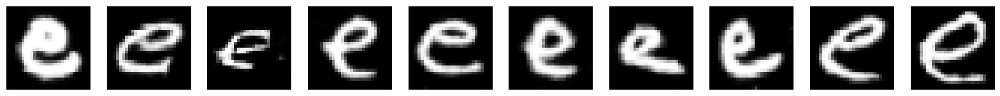

Epoch 500: D Accuracy = 0.6422
27/27 [==============================] - 1s 42ms/step - d_loss: 1.2195 - g_loss: 1.0061 - d_accuracy: 0.6678
Training DCGAN for class 4...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0362 - g_loss: 1.3425 - d_accuracy: 0.7783
Epoch 1: Generator loss improved from inf to 1.7600. Saving weights.
Epoch 1: D Accuracy = 0.8923
27/27 [==============================] - 2s 36ms/step - d_loss: 1.0279 - g_loss: 1.3574 - d_accuracy: 0.7823
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9990 - g_loss: 1.5217 - d_accuracy: 0.8069
Epoch 2: Generator loss improved from 1.7600 to 1.3721. Saving weights.
Epoch 2: D Accuracy = 0.6769
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0090 - g_loss: 1.5164 - d_accuracy: 0.8023
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9357 - g_loss: 1.5975 - d_accuracy: 0.8244
Epoch 4/500
27/27 [==============================] - 1s 34ms

Epoch 31/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0699 - g_loss: 1.2724 - d_accuracy: 0.7590
Epoch 32/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0779 - g_loss: 1.2603 - d_accuracy: 0.7611
Epoch 33/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0859 - g_loss: 1.2763 - d_accuracy: 0.7424
Epoch 34/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.0731 - g_loss: 1.3038 - d_accuracy: 0.7466
Epoch 35/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0928 - g_loss: 1.2496 - d_accuracy: 0.7409
Epoch 36/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1112 - g_loss: 1.2623 - d_accuracy: 0.7368
Epoch 37/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1361 - g_loss: 1.2170 - d_accuracy: 0.7175
Epoch 38/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1616 - g_loss: 1.1974 - d_accuracy: 0.7139
Epoch 39/500
27/27 [====

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2605 - g_loss: 1.0296 - d_accuracy: 0.6490
Epoch 64/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2586 - g_loss: 1.0147 - d_accuracy: 0.6474
Epoch 65/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2706 - g_loss: 1.0169 - d_accuracy: 0.6347
Epoch 66/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2714 - g_loss: 1.0014 - d_accuracy: 0.6389
Epoch 67/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2583 - g_loss: 1.0198 - d_accuracy: 0.6493
Epoch 68/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2784 - g_loss: 1.0083 - d_accuracy: 0.6296
Epoch 69/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2786 - g_loss: 0.9936 - d_accuracy: 0.6397
Epoch 70/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2799 - g_loss: 1.0071 - d_accuracy: 0.6297
Epoch 71/500
27/27 [=================

27/27 [==============================] - 1s 36ms/step - d_loss: 1.3027 - g_loss: 0.9474 - d_accuracy: 0.6118
Epoch 96/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3121 - g_loss: 0.9412 - d_accuracy: 0.6084
Epoch 97/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2932 - g_loss: 0.9575 - d_accuracy: 0.6269
Epoch 98/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3028 - g_loss: 0.9545 - d_accuracy: 0.6147
Epoch 99/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3117 - g_loss: 0.9434 - d_accuracy: 0.6004
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3138 - g_loss: 0.9419 - d_accuracy: 0.6063
Class 4 — Epoch 100 preview:


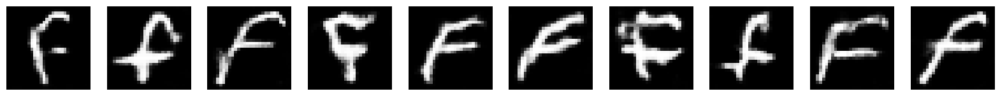

Epoch 100: D Accuracy = 0.5462
27/27 [==============================] - 1s 49ms/step - d_loss: 1.3168 - g_loss: 0.9398 - d_accuracy: 0.6042
Epoch 101/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3101 - g_loss: 0.9392 - d_accuracy: 0.6090
Epoch 102/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2985 - g_loss: 0.9426 - d_accuracy: 0.6195
Epoch 103/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3016 - g_loss: 0.9479 - d_accuracy: 0.6126
Epoch 104/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3191 - g_loss: 0.9374 - d_accuracy: 0.5946
Epoch 105/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3027 - g_loss: 0.9464 - d_accuracy: 0.6112
Epoch 106/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3092 - g_loss: 0.9411 - d_accuracy: 0.6072
Epoch 107/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3127 - g_loss: 0.9398 - d_accuracy: 0.6055

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3147 - g_loss: 0.9307 - d_accuracy: 0.5987
Epoch 133/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3113 - g_loss: 0.9436 - d_accuracy: 0.6033
Epoch 134/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3262 - g_loss: 0.9176 - d_accuracy: 0.5943
Epoch 135/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3202 - g_loss: 0.9180 - d_accuracy: 0.5967
Epoch 136/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3128 - g_loss: 0.9146 - d_accuracy: 0.6039
Epoch 137/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3152 - g_loss: 0.9182 - d_accuracy: 0.6006
Epoch 138/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3096 - g_loss: 0.9291 - d_accuracy: 0.6073
Epoch 139/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3146 - g_loss: 0.9204 - d_accuracy: 0.6059
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3055 - g_loss: 0.9190 - d_accuracy: 0.6071
Epoch 165/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3149 - g_loss: 0.9162 - d_accuracy: 0.5960
Epoch 166/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3165 - g_loss: 0.9177 - d_accuracy: 0.5978
Epoch 167/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3053 - g_loss: 0.9126 - d_accuracy: 0.6136
Epoch 168/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3065 - g_loss: 0.9253 - d_accuracy: 0.6039
Epoch 169/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3120 - g_loss: 0.9243 - d_accuracy: 0.5985
Epoch 170/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3078 - g_loss: 0.9161 - d_accuracy: 0.6020
Epoch 171/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3172 - g_loss: 0.9126 - d_accuracy: 0.5932
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3015 - g_loss: 0.9222 - d_accuracy: 0.6075
Epoch 197/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2969 - g_loss: 0.9184 - d_accuracy: 0.6127
Epoch 198/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3030 - g_loss: 0.9316 - d_accuracy: 0.6068
Epoch 199/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3087 - g_loss: 0.9166 - d_accuracy: 0.6041
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3046 - g_loss: 0.9178 - d_accuracy: 0.6080
Class 4 — Epoch 200 preview:


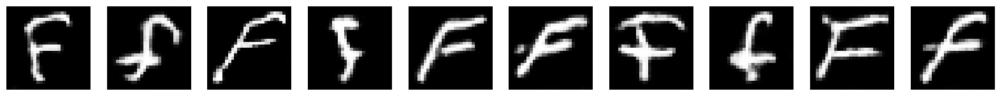

Epoch 200: D Accuracy = 0.6000
27/27 [==============================] - 1s 41ms/step - d_loss: 1.3055 - g_loss: 0.9155 - d_accuracy: 0.6077
Epoch 201/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3001 - g_loss: 0.9205 - d_accuracy: 0.6103
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3010 - g_loss: 0.9184 - d_accuracy: 0.6127
Epoch 203/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3041 - g_loss: 0.9256 - d_accuracy: 0.5965
Epoch 204/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2977 - g_loss: 0.9229 - d_accuracy: 0.6106
Epoch 205/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3062 - g_loss: 0.9195 - d_accuracy: 0.6116
Epoch 206/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3079 - g_loss: 0.9199 - d_accuracy: 0.6094
Epoch 207/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3103 - g_loss: 0.9134 - d_accuracy: 0.6059

27/27 [==============================] - 1s 34ms/step - d_loss: 1.2936 - g_loss: 0.9274 - d_accuracy: 0.6147
Epoch 233/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2896 - g_loss: 0.9381 - d_accuracy: 0.6217
Epoch 234/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2975 - g_loss: 0.9269 - d_accuracy: 0.6129
Epoch 235/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3004 - g_loss: 0.9220 - d_accuracy: 0.6156
Epoch 236/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3010 - g_loss: 0.9336 - d_accuracy: 0.6086
Epoch 237/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2924 - g_loss: 0.9229 - d_accuracy: 0.6215
Epoch 238/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2812 - g_loss: 0.9396 - d_accuracy: 0.6253
Epoch 239/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2841 - g_loss: 0.9408 - d_accuracy: 0.6254
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2788 - g_loss: 0.9432 - d_accuracy: 0.6300
Epoch 265/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2824 - g_loss: 0.9443 - d_accuracy: 0.6226
Epoch 266/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2944 - g_loss: 0.9402 - d_accuracy: 0.6173
Epoch 267/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2717 - g_loss: 0.9470 - d_accuracy: 0.6355
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2827 - g_loss: 0.9418 - d_accuracy: 0.6282
Epoch 269/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2644 - g_loss: 0.9600 - d_accuracy: 0.6375
Epoch 270/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2786 - g_loss: 0.9535 - d_accuracy: 0.6313
Epoch 271/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2780 - g_loss: 0.9390 - d_accuracy: 0.6268
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2677 - g_loss: 0.9546 - d_accuracy: 0.6324
Epoch 297/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2746 - g_loss: 0.9516 - d_accuracy: 0.6299
Epoch 298/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2659 - g_loss: 0.9675 - d_accuracy: 0.6403
Epoch 299/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2673 - g_loss: 0.9509 - d_accuracy: 0.6414
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2660 - g_loss: 0.9595 - d_accuracy: 0.6352
Class 4 — Epoch 300 preview:


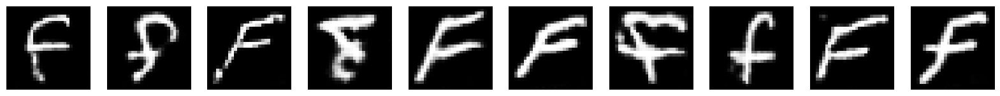

Epoch 300: D Accuracy = 0.7000
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2640 - g_loss: 0.9550 - d_accuracy: 0.6375
Epoch 301/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2808 - g_loss: 0.9637 - d_accuracy: 0.6259
Epoch 302/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2601 - g_loss: 0.9658 - d_accuracy: 0.6396
Epoch 303/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2723 - g_loss: 0.9658 - d_accuracy: 0.6416
Epoch 304/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2611 - g_loss: 0.9635 - d_accuracy: 0.6427
Epoch 305/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2633 - g_loss: 0.9632 - d_accuracy: 0.6372
Epoch 306/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2539 - g_loss: 0.9791 - d_accuracy: 0.6402
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2725 - g_loss: 0.9630 - d_accuracy: 0.6296

27/27 [==============================] - 1s 34ms/step - d_loss: 1.2434 - g_loss: 0.9916 - d_accuracy: 0.6587
Epoch 333/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2575 - g_loss: 0.9786 - d_accuracy: 0.6427
Epoch 334/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2388 - g_loss: 0.9840 - d_accuracy: 0.6598
Epoch 335/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2424 - g_loss: 0.9863 - d_accuracy: 0.6503
Epoch 336/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2478 - g_loss: 0.9736 - d_accuracy: 0.6589
Epoch 337/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2444 - g_loss: 0.9927 - d_accuracy: 0.6493
Epoch 338/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2423 - g_loss: 0.9883 - d_accuracy: 0.6608
Epoch 339/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2573 - g_loss: 0.9694 - d_accuracy: 0.6525
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2281 - g_loss: 0.9951 - d_accuracy: 0.6646
Epoch 365/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2343 - g_loss: 1.0056 - d_accuracy: 0.6525
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2553 - g_loss: 0.9799 - d_accuracy: 0.6391
Epoch 367/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2445 - g_loss: 0.9865 - d_accuracy: 0.6479
Epoch 368/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2355 - g_loss: 1.0123 - d_accuracy: 0.6500
Epoch 369/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2302 - g_loss: 1.0067 - d_accuracy: 0.6693
Epoch 370/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2291 - g_loss: 0.9998 - d_accuracy: 0.6673
Epoch 371/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2260 - g_loss: 1.0184 - d_accuracy: 0.6678
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2041 - g_loss: 1.0295 - d_accuracy: 0.6823
Epoch 397/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2221 - g_loss: 1.0136 - d_accuracy: 0.6669
Epoch 398/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2118 - g_loss: 1.0379 - d_accuracy: 0.6775
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2257 - g_loss: 1.0179 - d_accuracy: 0.6619
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2101 - g_loss: 1.0394 - d_accuracy: 0.6791
Class 4 — Epoch 400 preview:


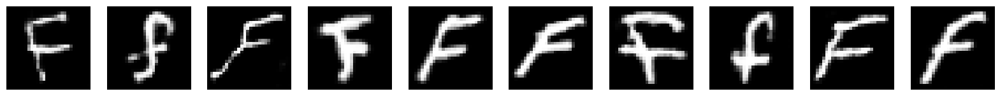

Epoch 400: D Accuracy = 0.5692
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2123 - g_loss: 1.0477 - d_accuracy: 0.6751
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2226 - g_loss: 1.0281 - d_accuracy: 0.6733
Epoch 402/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2147 - g_loss: 1.0204 - d_accuracy: 0.6747
Epoch 403/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2102 - g_loss: 1.0315 - d_accuracy: 0.6751
Epoch 404/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2233 - g_loss: 1.0166 - d_accuracy: 0.6681
Epoch 405/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2051 - g_loss: 1.0303 - d_accuracy: 0.6762
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2103 - g_loss: 1.0235 - d_accuracy: 0.6797
Epoch 407/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2168 - g_loss: 1.0211 - d_accuracy: 0.6762

27/27 [==============================] - 1s 34ms/step - d_loss: 1.2233 - g_loss: 1.0251 - d_accuracy: 0.6714
Epoch 433/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1907 - g_loss: 1.0447 - d_accuracy: 0.6904
Epoch 434/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1866 - g_loss: 1.0488 - d_accuracy: 0.6922
Epoch 435/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2049 - g_loss: 1.0589 - d_accuracy: 0.6767
Epoch 436/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2011 - g_loss: 1.0398 - d_accuracy: 0.6875
Epoch 437/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2088 - g_loss: 1.0358 - d_accuracy: 0.6786
Epoch 438/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1990 - g_loss: 1.0441 - d_accuracy: 0.6840
Epoch 439/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1988 - g_loss: 1.0455 - d_accuracy: 0.6770
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1797 - g_loss: 1.0723 - d_accuracy: 0.6951
Epoch 465/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1757 - g_loss: 1.0873 - d_accuracy: 0.6927
Epoch 466/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1848 - g_loss: 1.0602 - d_accuracy: 0.7011
Epoch 467/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1779 - g_loss: 1.0824 - d_accuracy: 0.6955
Epoch 468/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1795 - g_loss: 1.0679 - d_accuracy: 0.7020
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1899 - g_loss: 1.0647 - d_accuracy: 0.6865
Epoch 470/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1858 - g_loss: 1.0543 - d_accuracy: 0.6982
Epoch 471/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1693 - g_loss: 1.0736 - d_accuracy: 0.7103
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1716 - g_loss: 1.0885 - d_accuracy: 0.6972
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1651 - g_loss: 1.0956 - d_accuracy: 0.7085
Epoch 498/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1660 - g_loss: 1.0940 - d_accuracy: 0.7064
Epoch 499/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1647 - g_loss: 1.0906 - d_accuracy: 0.7112
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1705 - g_loss: 1.0967 - d_accuracy: 0.6993
Class 4 — Epoch 500 preview:


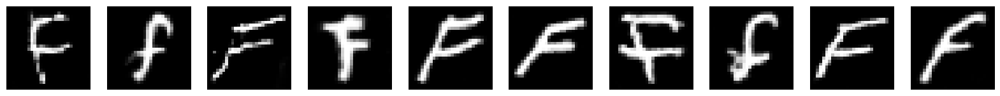

Epoch 500: D Accuracy = 0.8000
27/27 [==============================] - 1s 41ms/step - d_loss: 1.1665 - g_loss: 1.0980 - d_accuracy: 0.7029
Training DCGAN for class 5...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1305 - g_loss: 1.1839 - d_accuracy: 0.7388
Epoch 1: Generator loss improved from inf to 1.1926. Saving weights.
Epoch 1: D Accuracy = 0.7982
27/27 [==============================] - 2s 35ms/step - d_loss: 1.1274 - g_loss: 1.1843 - d_accuracy: 0.7409
Epoch 2/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.0689 - g_loss: 1.3490 - d_accuracy: 0.7797
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.8152 - g_loss: 1.7158 - d_accuracy: 0.8772
Epoch 4/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.5511 - g_loss: 2.5653 - d_accuracy: 0.9633
Epoch 5/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.4551 - g_loss: 3.4223 - d_accuracy: 0.9807
Epoch 6/500
27/27 [====

27/27 [==============================] - 1s 35ms/step - d_loss: 1.1697 - g_loss: 1.1162 - d_accuracy: 0.7108
Epoch 31/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1491 - g_loss: 1.1550 - d_accuracy: 0.7088
Epoch 32/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1275 - g_loss: 1.1739 - d_accuracy: 0.7300
Epoch 33/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1140 - g_loss: 1.2003 - d_accuracy: 0.7313
Epoch 34/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1203 - g_loss: 1.2296 - d_accuracy: 0.7335
Epoch 35/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1186 - g_loss: 1.2387 - d_accuracy: 0.7272
Epoch 36/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1519 - g_loss: 1.1881 - d_accuracy: 0.7071
Epoch 37/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1729 - g_loss: 1.1697 - d_accuracy: 0.7020
Epoch 38/500
27/27 [=================

Epoch 62/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2356 - g_loss: 1.0766 - d_accuracy: 0.6551
Epoch 63/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2329 - g_loss: 1.0516 - d_accuracy: 0.6710
Epoch 64/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2499 - g_loss: 1.0419 - d_accuracy: 0.6474
Epoch 65/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2318 - g_loss: 1.0516 - d_accuracy: 0.6632
Epoch 66/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2463 - g_loss: 1.0441 - d_accuracy: 0.6564
Epoch 67/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2380 - g_loss: 1.0500 - d_accuracy: 0.6596
Epoch 68/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2363 - g_loss: 1.0386 - d_accuracy: 0.6673
Epoch 69/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2395 - g_loss: 1.0369 - d_accuracy: 0.6683
Epoch 70/500
27/27 [====

Epoch 94/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2898 - g_loss: 0.9880 - d_accuracy: 0.6292
Epoch 95/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2819 - g_loss: 0.9883 - d_accuracy: 0.6322
Epoch 96/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2901 - g_loss: 0.9766 - d_accuracy: 0.6266
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2833 - g_loss: 0.9853 - d_accuracy: 0.6349
Epoch 98/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2707 - g_loss: 1.0041 - d_accuracy: 0.6395
Epoch 99/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2800 - g_loss: 0.9880 - d_accuracy: 0.6338
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2695 - g_loss: 0.9916 - d_accuracy: 0.6358
Class 5 — Epoch 100 preview:


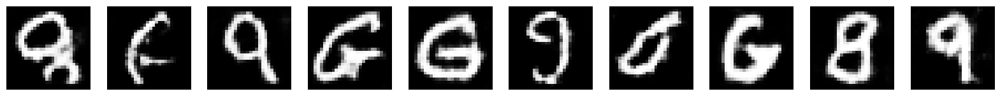

Epoch 100: D Accuracy = 0.7456
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2662 - g_loss: 0.9917 - d_accuracy: 0.6398
Epoch 101/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2867 - g_loss: 0.9827 - d_accuracy: 0.6282
Epoch 102/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2803 - g_loss: 0.9788 - d_accuracy: 0.6278
Epoch 103/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2918 - g_loss: 0.9777 - d_accuracy: 0.6192
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2997 - g_loss: 0.9695 - d_accuracy: 0.6195
Epoch 105/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2914 - g_loss: 0.9668 - d_accuracy: 0.6208
Epoch 106/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2967 - g_loss: 0.9773 - d_accuracy: 0.6099
Epoch 107/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2919 - g_loss: 0.9694 - d_accuracy: 0.6241

Epoch 132/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2901 - g_loss: 0.9566 - d_accuracy: 0.6170
Epoch 133/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3088 - g_loss: 0.9416 - d_accuracy: 0.6087
Epoch 134/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3016 - g_loss: 0.9543 - d_accuracy: 0.6068
Epoch 135/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2893 - g_loss: 0.9412 - d_accuracy: 0.6292
Epoch 136/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2923 - g_loss: 0.9577 - d_accuracy: 0.6202
Epoch 137/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3027 - g_loss: 0.9411 - d_accuracy: 0.6135
Epoch 138/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2870 - g_loss: 0.9676 - d_accuracy: 0.6225
Epoch 139/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2841 - g_loss: 0.9583 - d_accuracy: 0.6286
Epoch 140/500
27

Epoch 164/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2768 - g_loss: 0.9626 - d_accuracy: 0.6306
Epoch 165/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2764 - g_loss: 0.9688 - d_accuracy: 0.6349
Epoch 166/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2754 - g_loss: 0.9595 - d_accuracy: 0.6354
Epoch 167/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2758 - g_loss: 0.9683 - d_accuracy: 0.6340
Epoch 168/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2885 - g_loss: 0.9474 - d_accuracy: 0.6210
Epoch 169/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2778 - g_loss: 0.9605 - d_accuracy: 0.6299
Epoch 170/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2735 - g_loss: 0.9731 - d_accuracy: 0.6338
Epoch 171/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2810 - g_loss: 0.9527 - d_accuracy: 0.6237
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2705 - g_loss: 0.9728 - d_accuracy: 0.6368
Epoch 197/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2821 - g_loss: 0.9625 - d_accuracy: 0.6311
Epoch 198/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2610 - g_loss: 0.9693 - d_accuracy: 0.6448
Epoch 199/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2608 - g_loss: 0.9767 - d_accuracy: 0.6353
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2666 - g_loss: 0.9666 - d_accuracy: 0.6352
Class 5 — Epoch 200 preview:


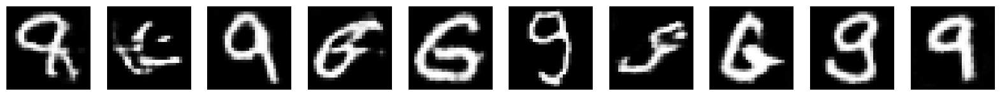

Epoch 200: D Accuracy = 0.6579
27/27 [==============================] - 1s 40ms/step - d_loss: 1.2669 - g_loss: 0.9645 - d_accuracy: 0.6360
Epoch 201/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2635 - g_loss: 0.9801 - d_accuracy: 0.6342
Epoch 202/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2745 - g_loss: 0.9599 - d_accuracy: 0.6354
Epoch 203/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2775 - g_loss: 0.9650 - d_accuracy: 0.6287
Epoch 204/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2685 - g_loss: 0.9685 - d_accuracy: 0.6423
Epoch 205/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2632 - g_loss: 0.9689 - d_accuracy: 0.6405
Epoch 206/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2743 - g_loss: 0.9691 - d_accuracy: 0.6312
Epoch 207/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2637 - g_loss: 0.9725 - d_accuracy: 0.6444

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2562 - g_loss: 0.9803 - d_accuracy: 0.6464
Epoch 233/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2469 - g_loss: 0.9878 - d_accuracy: 0.6617
Epoch 234/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2562 - g_loss: 0.9738 - d_accuracy: 0.6453
Epoch 235/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2543 - g_loss: 0.9773 - d_accuracy: 0.6393
Epoch 236/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2500 - g_loss: 0.9862 - d_accuracy: 0.6470
Epoch 237/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2585 - g_loss: 0.9824 - d_accuracy: 0.6482
Epoch 238/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2597 - g_loss: 0.9843 - d_accuracy: 0.6404
Epoch 239/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2557 - g_loss: 0.9901 - d_accuracy: 0.6434
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2559 - g_loss: 0.9833 - d_accuracy: 0.6433
Epoch 265/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2443 - g_loss: 1.0088 - d_accuracy: 0.6478
Epoch 266/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2469 - g_loss: 1.0091 - d_accuracy: 0.6464
Epoch 267/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2555 - g_loss: 0.9812 - d_accuracy: 0.6454
Epoch 268/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2417 - g_loss: 0.9960 - d_accuracy: 0.6621
Epoch 269/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2648 - g_loss: 0.9776 - d_accuracy: 0.6358
Epoch 270/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2503 - g_loss: 0.9957 - d_accuracy: 0.6502
Epoch 271/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2409 - g_loss: 0.9956 - d_accuracy: 0.6565
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2389 - g_loss: 0.9948 - d_accuracy: 0.6557
Epoch 297/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2334 - g_loss: 1.0092 - d_accuracy: 0.6570
Epoch 298/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2382 - g_loss: 0.9958 - d_accuracy: 0.6546
Epoch 299/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2266 - g_loss: 1.0224 - d_accuracy: 0.6583
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2316 - g_loss: 1.0076 - d_accuracy: 0.6651
Class 5 — Epoch 300 preview:


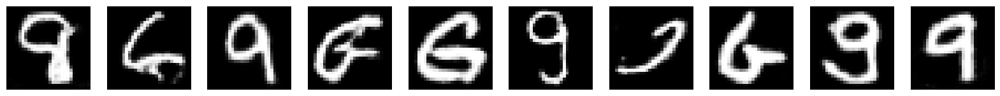

Epoch 300: D Accuracy = 0.6404
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2328 - g_loss: 1.0083 - d_accuracy: 0.6642
Epoch 301/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2260 - g_loss: 1.0190 - d_accuracy: 0.6657
Epoch 302/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2324 - g_loss: 1.0042 - d_accuracy: 0.6682
Epoch 303/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2396 - g_loss: 1.0069 - d_accuracy: 0.6549
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2468 - g_loss: 0.9952 - d_accuracy: 0.6472
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2309 - g_loss: 1.0190 - d_accuracy: 0.6567
Epoch 306/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2412 - g_loss: 0.9915 - d_accuracy: 0.6539
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2289 - g_loss: 1.0095 - d_accuracy: 0.6613

27/27 [==============================] - 1s 34ms/step - d_loss: 1.2242 - g_loss: 1.0338 - d_accuracy: 0.6640
Epoch 333/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2282 - g_loss: 1.0238 - d_accuracy: 0.6561
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2132 - g_loss: 1.0247 - d_accuracy: 0.6752
Epoch 335/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2291 - g_loss: 1.0225 - d_accuracy: 0.6558
Epoch 336/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2172 - g_loss: 1.0190 - d_accuracy: 0.6730
Epoch 337/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2244 - g_loss: 1.0254 - d_accuracy: 0.6654
Epoch 338/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2302 - g_loss: 1.0150 - d_accuracy: 0.6624
Epoch 339/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2177 - g_loss: 1.0274 - d_accuracy: 0.6716
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2160 - g_loss: 1.0410 - d_accuracy: 0.6696
Epoch 365/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2163 - g_loss: 1.0244 - d_accuracy: 0.6749
Epoch 366/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2108 - g_loss: 1.0375 - d_accuracy: 0.6728
Epoch 367/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2071 - g_loss: 1.0510 - d_accuracy: 0.6774
Epoch 368/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2118 - g_loss: 1.0445 - d_accuracy: 0.6769
Epoch 369/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2005 - g_loss: 1.0439 - d_accuracy: 0.6842
Epoch 370/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2160 - g_loss: 1.0357 - d_accuracy: 0.6659
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2133 - g_loss: 1.0343 - d_accuracy: 0.6728
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2086 - g_loss: 1.0446 - d_accuracy: 0.6784
Epoch 397/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1996 - g_loss: 1.0604 - d_accuracy: 0.6758
Epoch 398/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2050 - g_loss: 1.0387 - d_accuracy: 0.6777
Epoch 399/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1928 - g_loss: 1.0653 - d_accuracy: 0.6823
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2141 - g_loss: 1.0345 - d_accuracy: 0.6777
Class 5 — Epoch 400 preview:


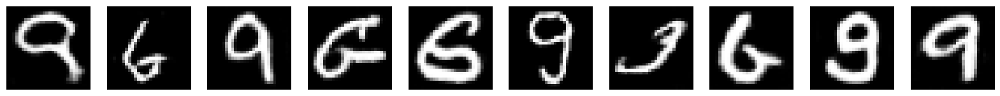

Epoch 400: D Accuracy = 0.6930
27/27 [==============================] - 1s 49ms/step - d_loss: 1.2144 - g_loss: 1.0321 - d_accuracy: 0.6783
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2024 - g_loss: 1.0413 - d_accuracy: 0.6805
Epoch 402/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1871 - g_loss: 1.0618 - d_accuracy: 0.6947
Epoch 403/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1958 - g_loss: 1.0593 - d_accuracy: 0.6811
Epoch 404/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2103 - g_loss: 1.0440 - d_accuracy: 0.6752
Epoch 405/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2045 - g_loss: 1.0595 - d_accuracy: 0.6749
Epoch 406/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1912 - g_loss: 1.0542 - d_accuracy: 0.6905
Epoch 407/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2102 - g_loss: 1.0452 - d_accuracy: 0.6806

27/27 [==============================] - 1s 35ms/step - d_loss: 1.1890 - g_loss: 1.0630 - d_accuracy: 0.6910
Epoch 433/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1825 - g_loss: 1.0565 - d_accuracy: 0.6940
Epoch 434/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1855 - g_loss: 1.0830 - d_accuracy: 0.6947
Epoch 435/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2070 - g_loss: 1.0466 - d_accuracy: 0.6751
Epoch 436/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1865 - g_loss: 1.0787 - d_accuracy: 0.6890
Epoch 437/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1776 - g_loss: 1.0749 - d_accuracy: 0.6951
Epoch 438/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1963 - g_loss: 1.0643 - d_accuracy: 0.6868
Epoch 439/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1875 - g_loss: 1.0768 - d_accuracy: 0.6882
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1656 - g_loss: 1.0926 - d_accuracy: 0.7040
Epoch 465/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1836 - g_loss: 1.0938 - d_accuracy: 0.6919
Epoch 466/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1917 - g_loss: 1.0740 - d_accuracy: 0.6840
Epoch 467/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1720 - g_loss: 1.0995 - d_accuracy: 0.6949
Epoch 468/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1745 - g_loss: 1.0765 - d_accuracy: 0.6960
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1848 - g_loss: 1.0800 - d_accuracy: 0.6924
Epoch 470/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1729 - g_loss: 1.0875 - d_accuracy: 0.6950
Epoch 471/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1724 - g_loss: 1.0963 - d_accuracy: 0.6912
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1777 - g_loss: 1.0988 - d_accuracy: 0.6969
Epoch 497/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1750 - g_loss: 1.1009 - d_accuracy: 0.6911
Epoch 498/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1750 - g_loss: 1.0994 - d_accuracy: 0.6982
Epoch 499/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1627 - g_loss: 1.1057 - d_accuracy: 0.7039
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1603 - g_loss: 1.1043 - d_accuracy: 0.7028
Class 5 — Epoch 500 preview:


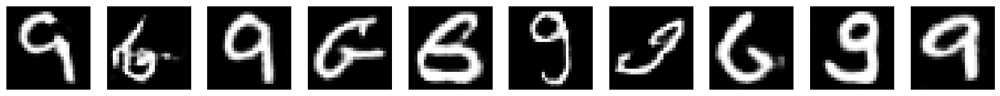

Epoch 500: D Accuracy = 0.7105
27/27 [==============================] - 1s 40ms/step - d_loss: 1.1598 - g_loss: 1.1047 - d_accuracy: 0.7031
Training DCGAN for class 6...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9329 - g_loss: 1.4222 - d_accuracy: 0.8281
Epoch 1: Generator loss improved from inf to 1.9509. Saving weights.
Epoch 1: D Accuracy = 0.9100
27/27 [==============================] - 2s 35ms/step - d_loss: 0.9271 - g_loss: 1.4411 - d_accuracy: 0.8310
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 0.8463 - g_loss: 1.7769 - d_accuracy: 0.8774
Epoch 2: Generator loss improved from 1.9509 to 1.7418. Saving weights.
Epoch 2: D Accuracy = 0.8650
27/27 [==============================] - 1s 35ms/step - d_loss: 0.8468 - g_loss: 1.7757 - d_accuracy: 0.8769
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.6207 - g_loss: 2.3695 - d_accuracy: 0.9422
Epoch 4/500
27/27 [==============================] - 1s 34ms

27/27 [==============================] - 1s 37ms/step - d_loss: 1.2775 - g_loss: 0.9770 - d_accuracy: 0.6259
Epoch 30/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2679 - g_loss: 0.9698 - d_accuracy: 0.6478
Epoch 31/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2609 - g_loss: 0.9905 - d_accuracy: 0.6435
Epoch 32/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2615 - g_loss: 0.9786 - d_accuracy: 0.6505
Epoch 33/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2552 - g_loss: 0.9898 - d_accuracy: 0.6530
Epoch 34/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2522 - g_loss: 0.9915 - d_accuracy: 0.6524
Epoch 35/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2648 - g_loss: 0.9783 - d_accuracy: 0.6465
Epoch 36/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2544 - g_loss: 0.9953 - d_accuracy: 0.6509
Epoch 37/500
27/27 [=================

Epoch 61/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2995 - g_loss: 0.9501 - d_accuracy: 0.5978
Epoch 62/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3034 - g_loss: 0.9380 - d_accuracy: 0.5988
Epoch 63/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3038 - g_loss: 0.9481 - d_accuracy: 0.6021
Epoch 64/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3069 - g_loss: 0.9308 - d_accuracy: 0.5952
Epoch 65/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3082 - g_loss: 0.9328 - d_accuracy: 0.6004
Epoch 66/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3049 - g_loss: 0.9317 - d_accuracy: 0.6004
Epoch 67/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3063 - g_loss: 0.9412 - d_accuracy: 0.6050
Epoch 68/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3113 - g_loss: 0.9295 - d_accuracy: 0.5937
Epoch 69/500
27/27 [====

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3291 - g_loss: 0.9031 - d_accuracy: 0.5788
Epoch 94/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3275 - g_loss: 0.8964 - d_accuracy: 0.5780
Epoch 95/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3250 - g_loss: 0.9123 - d_accuracy: 0.5823
Epoch 96/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3203 - g_loss: 0.9026 - d_accuracy: 0.5734
Epoch 97/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3432 - g_loss: 0.8886 - d_accuracy: 0.5618
Epoch 98/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3269 - g_loss: 0.8971 - d_accuracy: 0.5782
Epoch 99/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3276 - g_loss: 0.8984 - d_accuracy: 0.5730
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3431 - g_loss: 0.8816 - d_accuracy: 0.5635
Class 6 — Epoch 100 preview:


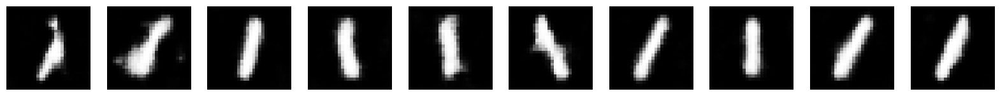

Epoch 100: D Accuracy = 0.5700
27/27 [==============================] - 1s 41ms/step - d_loss: 1.3439 - g_loss: 0.8796 - d_accuracy: 0.5637
Epoch 101/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3232 - g_loss: 0.8945 - d_accuracy: 0.5819
Epoch 102/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3341 - g_loss: 0.8859 - d_accuracy: 0.5692
Epoch 102: Generator loss improved from 0.8225 to 0.8175. Saving weights.
Epoch 102: D Accuracy = 0.6000
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3339 - g_loss: 0.8834 - d_accuracy: 0.5703
Epoch 103/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3254 - g_loss: 0.9023 - d_accuracy: 0.5764
Epoch 104/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3344 - g_loss: 0.8902 - d_accuracy: 0.5679
Epoch 105/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3411 - g_loss: 0.8810 - d_accuracy: 0.5636
Epoch 106/500
27/27 [===============

Epoch 132/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3361 - g_loss: 0.8797 - d_accuracy: 0.5614
Epoch 133/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3316 - g_loss: 0.8891 - d_accuracy: 0.5719
Epoch 134/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3309 - g_loss: 0.8876 - d_accuracy: 0.5723
Epoch 135/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3368 - g_loss: 0.8875 - d_accuracy: 0.5614
Epoch 136/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3415 - g_loss: 0.8776 - d_accuracy: 0.5639
Epoch 137/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3379 - g_loss: 0.8855 - d_accuracy: 0.5636
Epoch 138/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3464 - g_loss: 0.8760 - d_accuracy: 0.5572
Epoch 139/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3372 - g_loss: 0.8754 - d_accuracy: 0.5636
Epoch 140/500
27

Epoch 164/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3247 - g_loss: 0.8862 - d_accuracy: 0.5731
Epoch 164: Generator loss improved from 0.7852 to 0.7843. Saving weights.
Epoch 164: D Accuracy = 0.5600
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3256 - g_loss: 0.8826 - d_accuracy: 0.5726
Epoch 165/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3317 - g_loss: 0.8889 - d_accuracy: 0.5663
Epoch 166/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3457 - g_loss: 0.8749 - d_accuracy: 0.5553
Epoch 167/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3382 - g_loss: 0.8754 - d_accuracy: 0.5608
Epoch 168/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3274 - g_loss: 0.8867 - d_accuracy: 0.5702
Epoch 169/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3271 - g_loss: 0.8870 - d_accuracy: 0.5653
Epoch 170/500
27/27 [==============================] 

27/27 [==============================] - 1s 38ms/step - d_loss: 1.3292 - g_loss: 0.8867 - d_accuracy: 0.5682
Epoch 196/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3310 - g_loss: 0.8858 - d_accuracy: 0.5717
Epoch 197/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3284 - g_loss: 0.8846 - d_accuracy: 0.5680
Epoch 198/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3249 - g_loss: 0.8952 - d_accuracy: 0.5728
Epoch 199/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3301 - g_loss: 0.8854 - d_accuracy: 0.5670
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3266 - g_loss: 0.8838 - d_accuracy: 0.5743
Class 6 — Epoch 200 preview:


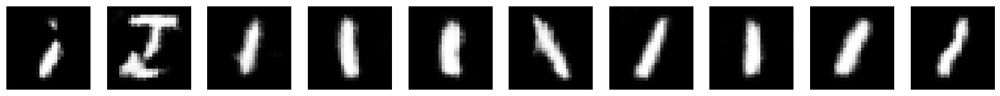

Epoch 200: D Accuracy = 0.5050
27/27 [==============================] - 1s 41ms/step - d_loss: 1.3275 - g_loss: 0.8819 - d_accuracy: 0.5718
Epoch 201/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3226 - g_loss: 0.8923 - d_accuracy: 0.5806
Epoch 202/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3282 - g_loss: 0.8889 - d_accuracy: 0.5703
Epoch 203/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3265 - g_loss: 0.8903 - d_accuracy: 0.5693
Epoch 204/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3263 - g_loss: 0.8827 - d_accuracy: 0.5725
Epoch 205/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3318 - g_loss: 0.8866 - d_accuracy: 0.5633
Epoch 206/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3177 - g_loss: 0.8978 - d_accuracy: 0.5828
Epoch 207/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3287 - g_loss: 0.8829 - d_accuracy: 0.5672

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3140 - g_loss: 0.9058 - d_accuracy: 0.5846
Epoch 233/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3286 - g_loss: 0.8982 - d_accuracy: 0.5664
Epoch 234/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3273 - g_loss: 0.8941 - d_accuracy: 0.5678
Epoch 235/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3206 - g_loss: 0.8959 - d_accuracy: 0.5749
Epoch 236/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3172 - g_loss: 0.9031 - d_accuracy: 0.5783
Epoch 237/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3255 - g_loss: 0.8958 - d_accuracy: 0.5709
Epoch 238/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3275 - g_loss: 0.8942 - d_accuracy: 0.5698
Epoch 239/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3127 - g_loss: 0.8992 - d_accuracy: 0.5842
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3122 - g_loss: 0.9013 - d_accuracy: 0.5833
Epoch 265/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.3188 - g_loss: 0.9045 - d_accuracy: 0.5740
Epoch 266/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3257 - g_loss: 0.8928 - d_accuracy: 0.5707
Epoch 267/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3165 - g_loss: 0.9020 - d_accuracy: 0.5740
Epoch 268/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3102 - g_loss: 0.9086 - d_accuracy: 0.5865
Epoch 269/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3106 - g_loss: 0.9065 - d_accuracy: 0.5870
Epoch 270/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3154 - g_loss: 0.9068 - d_accuracy: 0.5840
Epoch 271/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3304 - g_loss: 0.8986 - d_accuracy: 0.5654
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3138 - g_loss: 0.9016 - d_accuracy: 0.5826
Epoch 296: Generator loss improved from 0.7654 to 0.7608. Saving weights.
Epoch 296: D Accuracy = 0.5850
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3140 - g_loss: 0.8965 - d_accuracy: 0.5827
Epoch 297/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3024 - g_loss: 0.9202 - d_accuracy: 0.5854
Epoch 298/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3081 - g_loss: 0.9077 - d_accuracy: 0.5909
Epoch 299/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3019 - g_loss: 0.9159 - d_accuracy: 0.6003
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3061 - g_loss: 0.9153 - d_accuracy: 0.5832
Class 6 — Epoch 300 preview:


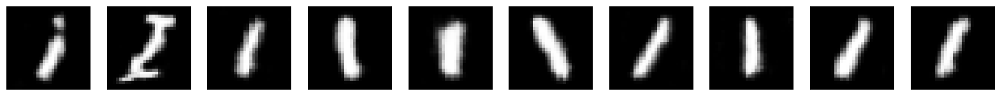

Epoch 300: D Accuracy = 0.5950
27/27 [==============================] - 1s 41ms/step - d_loss: 1.3038 - g_loss: 0.9206 - d_accuracy: 0.5837
Epoch 301/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2952 - g_loss: 0.9242 - d_accuracy: 0.6050
Epoch 302/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3140 - g_loss: 0.9058 - d_accuracy: 0.5837
Epoch 302: Generator loss improved from 0.7608 to 0.7455. Saving weights.
Epoch 302: D Accuracy = 0.5300
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3161 - g_loss: 0.9001 - d_accuracy: 0.5818
Epoch 303/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3145 - g_loss: 0.9165 - d_accuracy: 0.5739
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3130 - g_loss: 0.9035 - d_accuracy: 0.5875
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3107 - g_loss: 0.9140 - d_accuracy: 0.5858
Epoch 306/500
27/27 [===============

27/27 [==============================] - 1s 34ms/step - d_loss: 1.3029 - g_loss: 0.9095 - d_accuracy: 0.5959
Epoch 333/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2977 - g_loss: 0.9253 - d_accuracy: 0.5974
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3034 - g_loss: 0.9190 - d_accuracy: 0.5934
Epoch 335/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.3087 - g_loss: 0.9198 - d_accuracy: 0.5849
Epoch 336/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3026 - g_loss: 0.9154 - d_accuracy: 0.5913
Epoch 337/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3033 - g_loss: 0.9293 - d_accuracy: 0.5922
Epoch 338/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2996 - g_loss: 0.9266 - d_accuracy: 0.5911
Epoch 339/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3088 - g_loss: 0.9075 - d_accuracy: 0.5843
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3012 - g_loss: 0.9262 - d_accuracy: 0.5894
Epoch 365/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2943 - g_loss: 0.9327 - d_accuracy: 0.6041
Epoch 366/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2778 - g_loss: 0.9404 - d_accuracy: 0.6205
Epoch 367/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3049 - g_loss: 0.9323 - d_accuracy: 0.5877
Epoch 368/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2979 - g_loss: 0.9266 - d_accuracy: 0.5996
Epoch 369/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2883 - g_loss: 0.9368 - d_accuracy: 0.6031
Epoch 370/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2836 - g_loss: 0.9505 - d_accuracy: 0.6059
Epoch 371/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2906 - g_loss: 0.9338 - d_accuracy: 0.6048
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2875 - g_loss: 0.9539 - d_accuracy: 0.5998
Epoch 397/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2796 - g_loss: 0.9411 - d_accuracy: 0.6157
Epoch 398/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2779 - g_loss: 0.9418 - d_accuracy: 0.6150
Epoch 399/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2757 - g_loss: 0.9540 - d_accuracy: 0.6182
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2888 - g_loss: 0.9411 - d_accuracy: 0.6013
Class 6 — Epoch 400 preview:


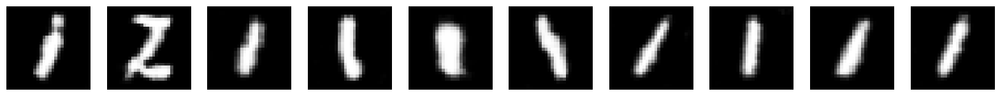

Epoch 400: D Accuracy = 0.5800
27/27 [==============================] - 1s 43ms/step - d_loss: 1.2887 - g_loss: 0.9452 - d_accuracy: 0.6006
Epoch 401/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2860 - g_loss: 0.9361 - d_accuracy: 0.6086
Epoch 402/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2857 - g_loss: 0.9479 - d_accuracy: 0.6069
Epoch 403/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2791 - g_loss: 0.9464 - d_accuracy: 0.6093
Epoch 404/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2798 - g_loss: 0.9606 - d_accuracy: 0.6064
Epoch 405/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2895 - g_loss: 0.9349 - d_accuracy: 0.6063
Epoch 406/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.2806 - g_loss: 0.9505 - d_accuracy: 0.6088
Epoch 407/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2875 - g_loss: 0.9587 - d_accuracy: 0.6038

27/27 [==============================] - 1s 36ms/step - d_loss: 1.2702 - g_loss: 0.9621 - d_accuracy: 0.6212
Epoch 433/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2825 - g_loss: 0.9579 - d_accuracy: 0.6071
Epoch 434/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2716 - g_loss: 0.9615 - d_accuracy: 0.6132
Epoch 435/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2784 - g_loss: 0.9637 - d_accuracy: 0.6130
Epoch 436/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2841 - g_loss: 0.9514 - d_accuracy: 0.6091
Epoch 437/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2689 - g_loss: 0.9551 - d_accuracy: 0.6276
Epoch 438/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2603 - g_loss: 0.9743 - d_accuracy: 0.6242
Epoch 439/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2665 - g_loss: 0.9567 - d_accuracy: 0.6357
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2599 - g_loss: 0.9784 - d_accuracy: 0.6319
Epoch 465/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2514 - g_loss: 0.9716 - d_accuracy: 0.6403
Epoch 466/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2698 - g_loss: 0.9786 - d_accuracy: 0.6259
Epoch 467/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2596 - g_loss: 0.9846 - d_accuracy: 0.6311
Epoch 468/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2655 - g_loss: 0.9804 - d_accuracy: 0.6295
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2594 - g_loss: 0.9868 - d_accuracy: 0.6299
Epoch 470/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2506 - g_loss: 0.9783 - d_accuracy: 0.6339
Epoch 471/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2812 - g_loss: 0.9570 - d_accuracy: 0.6149
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2283 - g_loss: 1.0029 - d_accuracy: 0.6503
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2588 - g_loss: 1.0031 - d_accuracy: 0.6225
Epoch 498/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2425 - g_loss: 0.9915 - d_accuracy: 0.6530
Epoch 499/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2566 - g_loss: 0.9750 - d_accuracy: 0.6296
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2457 - g_loss: 0.9955 - d_accuracy: 0.6409
Class 6 — Epoch 500 preview:


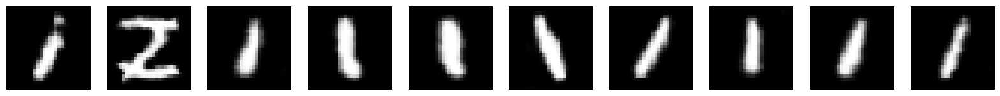

Epoch 500: D Accuracy = 0.5500
27/27 [==============================] - 1s 43ms/step - d_loss: 1.2491 - g_loss: 0.9940 - d_accuracy: 0.6376
Training DCGAN for class 7...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2599 - g_loss: 1.1259 - d_accuracy: 0.6753
Epoch 1: Generator loss improved from inf to 1.3413. Saving weights.
Epoch 1: D Accuracy = 0.7905
27/27 [==============================] - 2s 36ms/step - d_loss: 1.2517 - g_loss: 1.1336 - d_accuracy: 0.6794
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2018 - g_loss: 1.1969 - d_accuracy: 0.7243
Epoch 2: Generator loss improved from 1.3413 to 1.0557. Saving weights.
Epoch 2: D Accuracy = 0.6351
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2057 - g_loss: 1.1918 - d_accuracy: 0.7211
Epoch 3/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1678 - g_loss: 1.1658 - d_accuracy: 0.7196
Epoch 4/500
27/27 [==============================] - 1s 34ms

Epoch 30/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2394 - g_loss: 1.0511 - d_accuracy: 0.6624
Epoch 31/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2412 - g_loss: 1.0453 - d_accuracy: 0.6599
Epoch 32/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2361 - g_loss: 1.0523 - d_accuracy: 0.6613
Epoch 33/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2443 - g_loss: 1.0422 - d_accuracy: 0.6612
Epoch 34/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2502 - g_loss: 1.0414 - d_accuracy: 0.6553
Epoch 35/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2608 - g_loss: 1.0219 - d_accuracy: 0.6510
Epoch 36/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2572 - g_loss: 1.0280 - d_accuracy: 0.6422
Epoch 37/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2509 - g_loss: 1.0217 - d_accuracy: 0.6542
Epoch 38/500
27/27 [====

Epoch 62/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3133 - g_loss: 0.9256 - d_accuracy: 0.6039
Epoch 63/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3137 - g_loss: 0.9207 - d_accuracy: 0.6005
Epoch 64/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3108 - g_loss: 0.9281 - d_accuracy: 0.6080
Epoch 65/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3237 - g_loss: 0.9062 - d_accuracy: 0.5931
Epoch 66/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3125 - g_loss: 0.9174 - d_accuracy: 0.6088
Epoch 67/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3300 - g_loss: 0.9097 - d_accuracy: 0.5905
Epoch 68/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3223 - g_loss: 0.9081 - d_accuracy: 0.6006
Epoch 69/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3177 - g_loss: 0.9130 - d_accuracy: 0.5949
Epoch 70/500
27/27 [====

Epoch 94/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3325 - g_loss: 0.8845 - d_accuracy: 0.5792
Epoch 95/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3382 - g_loss: 0.8797 - d_accuracy: 0.5830
Epoch 96/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3412 - g_loss: 0.8792 - d_accuracy: 0.5701
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3426 - g_loss: 0.8788 - d_accuracy: 0.5717
Epoch 98/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3413 - g_loss: 0.8768 - d_accuracy: 0.5714
Epoch 99/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3390 - g_loss: 0.8787 - d_accuracy: 0.5704
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3413 - g_loss: 0.8797 - d_accuracy: 0.5696
Class 7 — Epoch 100 preview:


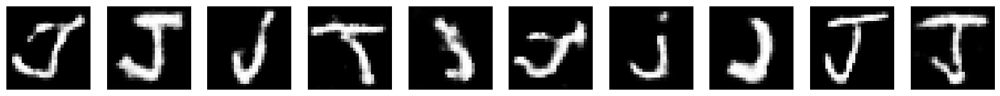

Epoch 100: D Accuracy = 0.5270
27/27 [==============================] - 1s 49ms/step - d_loss: 1.3430 - g_loss: 0.8818 - d_accuracy: 0.5681
Epoch 101/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3377 - g_loss: 0.8768 - d_accuracy: 0.5800
Epoch 102/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3454 - g_loss: 0.8742 - d_accuracy: 0.5672
Epoch 103/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3364 - g_loss: 0.8765 - d_accuracy: 0.5758
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3382 - g_loss: 0.8762 - d_accuracy: 0.5757
Epoch 105/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3374 - g_loss: 0.8761 - d_accuracy: 0.5738
Epoch 106/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3348 - g_loss: 0.8763 - d_accuracy: 0.5751
Epoch 107/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3416 - g_loss: 0.8722 - d_accuracy: 0.5773

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3332 - g_loss: 0.8704 - d_accuracy: 0.5841
Epoch 133/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3373 - g_loss: 0.8686 - d_accuracy: 0.5729
Epoch 134/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3366 - g_loss: 0.8805 - d_accuracy: 0.5682
Epoch 135/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3288 - g_loss: 0.8781 - d_accuracy: 0.5870
Epoch 136/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3347 - g_loss: 0.8745 - d_accuracy: 0.5769
Epoch 137/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3360 - g_loss: 0.8684 - d_accuracy: 0.5807
Epoch 138/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3347 - g_loss: 0.8792 - d_accuracy: 0.5755
Epoch 139/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3299 - g_loss: 0.8738 - d_accuracy: 0.5776
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3244 - g_loss: 0.8807 - d_accuracy: 0.5896
Epoch 165/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3266 - g_loss: 0.8791 - d_accuracy: 0.5834
Epoch 166/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3274 - g_loss: 0.8740 - d_accuracy: 0.5802
Epoch 167/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3287 - g_loss: 0.8849 - d_accuracy: 0.5803
Epoch 168/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3248 - g_loss: 0.8830 - d_accuracy: 0.5806
Epoch 169/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3253 - g_loss: 0.8791 - d_accuracy: 0.5829
Epoch 170/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3293 - g_loss: 0.8749 - d_accuracy: 0.5776
Epoch 171/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3222 - g_loss: 0.8827 - d_accuracy: 0.5899
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3087 - g_loss: 0.8961 - d_accuracy: 0.5994
Epoch 197/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3199 - g_loss: 0.8856 - d_accuracy: 0.5909
Epoch 198/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3182 - g_loss: 0.8897 - d_accuracy: 0.5927
Epoch 199/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3097 - g_loss: 0.8914 - d_accuracy: 0.5962
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3101 - g_loss: 0.8934 - d_accuracy: 0.6018
Class 7 — Epoch 200 preview:


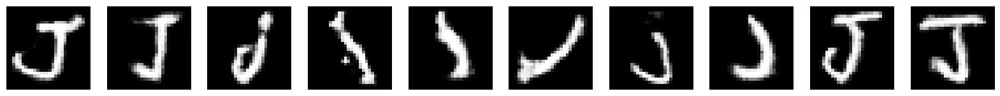

Epoch 200: D Accuracy = 0.6081
27/27 [==============================] - 1s 41ms/step - d_loss: 1.3092 - g_loss: 0.8965 - d_accuracy: 0.6020
Epoch 201/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3196 - g_loss: 0.8879 - d_accuracy: 0.5923
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3085 - g_loss: 0.8974 - d_accuracy: 0.5961
Epoch 203/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3175 - g_loss: 0.8952 - d_accuracy: 0.5904
Epoch 204/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3161 - g_loss: 0.8921 - d_accuracy: 0.5917
Epoch 205/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3176 - g_loss: 0.8856 - d_accuracy: 0.5878
Epoch 206/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3136 - g_loss: 0.8910 - d_accuracy: 0.5930
Epoch 207/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3181 - g_loss: 0.8924 - d_accuracy: 0.5928

27/27 [==============================] - 1s 36ms/step - d_loss: 1.3061 - g_loss: 0.9006 - d_accuracy: 0.5954
Epoch 233/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3134 - g_loss: 0.8962 - d_accuracy: 0.5972
Epoch 234/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3146 - g_loss: 0.8947 - d_accuracy: 0.5938
Epoch 235/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3161 - g_loss: 0.8914 - d_accuracy: 0.5909
Epoch 236/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3050 - g_loss: 0.8993 - d_accuracy: 0.5993
Epoch 237/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3035 - g_loss: 0.9039 - d_accuracy: 0.6025
Epoch 238/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3031 - g_loss: 0.9067 - d_accuracy: 0.5980
Epoch 239/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2967 - g_loss: 0.9060 - d_accuracy: 0.6179
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2943 - g_loss: 0.9169 - d_accuracy: 0.6057
Epoch 265/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2960 - g_loss: 0.9154 - d_accuracy: 0.6085
Epoch 266/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2945 - g_loss: 0.9110 - d_accuracy: 0.6134
Epoch 267/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3000 - g_loss: 0.9082 - d_accuracy: 0.6131
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2854 - g_loss: 0.9189 - d_accuracy: 0.6189
Epoch 269/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2885 - g_loss: 0.9199 - d_accuracy: 0.6188
Epoch 270/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2870 - g_loss: 0.9256 - d_accuracy: 0.6142
Epoch 271/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2944 - g_loss: 0.9154 - d_accuracy: 0.6141
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2853 - g_loss: 0.9288 - d_accuracy: 0.6219
Epoch 297/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2857 - g_loss: 0.9247 - d_accuracy: 0.6144
Epoch 298/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2998 - g_loss: 0.9159 - d_accuracy: 0.6041
Epoch 299/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2949 - g_loss: 0.9148 - d_accuracy: 0.6184
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2963 - g_loss: 0.9184 - d_accuracy: 0.6063
Class 7 — Epoch 300 preview:


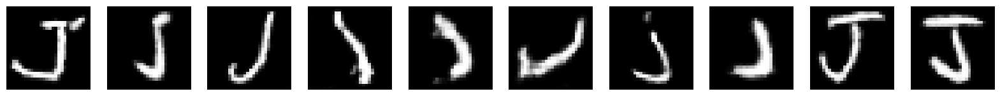

Epoch 300: D Accuracy = 0.6081
27/27 [==============================] - 1s 43ms/step - d_loss: 1.2966 - g_loss: 0.9198 - d_accuracy: 0.6064
Epoch 301/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2829 - g_loss: 0.9244 - d_accuracy: 0.6237
Epoch 302/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2804 - g_loss: 0.9310 - d_accuracy: 0.6189
Epoch 303/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2865 - g_loss: 0.9260 - d_accuracy: 0.6171
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2800 - g_loss: 0.9284 - d_accuracy: 0.6246
Epoch 305/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2858 - g_loss: 0.9215 - d_accuracy: 0.6149
Epoch 306/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2844 - g_loss: 0.9244 - d_accuracy: 0.6197
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2878 - g_loss: 0.9231 - d_accuracy: 0.6189

27/27 [==============================] - 1s 34ms/step - d_loss: 1.2708 - g_loss: 0.9422 - d_accuracy: 0.6250
Epoch 333/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2798 - g_loss: 0.9359 - d_accuracy: 0.6286
Epoch 334/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2717 - g_loss: 0.9375 - d_accuracy: 0.6299
Epoch 335/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2678 - g_loss: 0.9434 - d_accuracy: 0.6349
Epoch 336/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2812 - g_loss: 0.9381 - d_accuracy: 0.6217
Epoch 337/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2654 - g_loss: 0.9441 - d_accuracy: 0.6333
Epoch 338/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2755 - g_loss: 0.9369 - d_accuracy: 0.6309
Epoch 339/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2725 - g_loss: 0.9401 - d_accuracy: 0.6299
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2635 - g_loss: 0.9565 - d_accuracy: 0.6319
Epoch 365/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2570 - g_loss: 0.9541 - d_accuracy: 0.6436
Epoch 366/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2593 - g_loss: 0.9505 - d_accuracy: 0.6432
Epoch 367/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2681 - g_loss: 0.9517 - d_accuracy: 0.6345
Epoch 368/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2565 - g_loss: 0.9666 - d_accuracy: 0.6425
Epoch 369/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2641 - g_loss: 0.9529 - d_accuracy: 0.6386
Epoch 370/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2562 - g_loss: 0.9639 - d_accuracy: 0.6385
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2595 - g_loss: 0.9612 - d_accuracy: 0.6384
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2468 - g_loss: 0.9811 - d_accuracy: 0.6452
Epoch 397/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2400 - g_loss: 0.9773 - d_accuracy: 0.6576
Epoch 398/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2485 - g_loss: 0.9713 - d_accuracy: 0.6520
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2388 - g_loss: 0.9837 - d_accuracy: 0.6561
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2400 - g_loss: 0.9790 - d_accuracy: 0.6501
Class 7 — Epoch 400 preview:


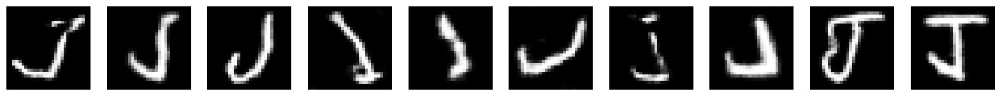

Epoch 400: D Accuracy = 0.6689
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2384 - g_loss: 0.9791 - d_accuracy: 0.6507
Epoch 401/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2421 - g_loss: 0.9758 - d_accuracy: 0.6562
Epoch 402/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2475 - g_loss: 0.9749 - d_accuracy: 0.6510
Epoch 403/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2413 - g_loss: 0.9747 - d_accuracy: 0.6532
Epoch 404/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2345 - g_loss: 0.9818 - d_accuracy: 0.6541
Epoch 405/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2413 - g_loss: 0.9773 - d_accuracy: 0.6551
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2445 - g_loss: 0.9788 - d_accuracy: 0.6466
Epoch 407/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2398 - g_loss: 0.9844 - d_accuracy: 0.6491

27/27 [==============================] - ETA: 0s - d_loss: 1.2274 - g_loss: 0.9931 - d_accuracy: 0.6646
Epoch 432: Generator loss improved from 0.7540 to 0.7461. Saving weights.
Epoch 432: D Accuracy = 0.6757
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2289 - g_loss: 0.9843 - d_accuracy: 0.6650
Epoch 433/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2230 - g_loss: 1.0099 - d_accuracy: 0.6697
Epoch 434/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2320 - g_loss: 0.9975 - d_accuracy: 0.6585
Epoch 435/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2346 - g_loss: 0.9969 - d_accuracy: 0.6581
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2313 - g_loss: 0.9924 - d_accuracy: 0.6633
Epoch 437/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2305 - g_loss: 0.9923 - d_accuracy: 0.6589
Epoch 438/500
27/27 [==============================] - 1s 36ms/step

Epoch 464/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2102 - g_loss: 1.0188 - d_accuracy: 0.6760
Epoch 465/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2055 - g_loss: 1.0234 - d_accuracy: 0.6812
Epoch 466/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2016 - g_loss: 1.0244 - d_accuracy: 0.6801
Epoch 467/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2121 - g_loss: 1.0239 - d_accuracy: 0.6770
Epoch 468/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2095 - g_loss: 1.0203 - d_accuracy: 0.6816
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2085 - g_loss: 1.0259 - d_accuracy: 0.6747
Epoch 470/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2096 - g_loss: 1.0252 - d_accuracy: 0.6743
Epoch 471/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2006 - g_loss: 1.0271 - d_accuracy: 0.6866
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1937 - g_loss: 1.0534 - d_accuracy: 0.6841
Epoch 497/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1889 - g_loss: 1.0511 - d_accuracy: 0.6895
Epoch 498/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2020 - g_loss: 1.0435 - d_accuracy: 0.6738
Epoch 499/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1919 - g_loss: 1.0421 - d_accuracy: 0.6851
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1975 - g_loss: 1.0456 - d_accuracy: 0.6823
Class 7 — Epoch 500 preview:


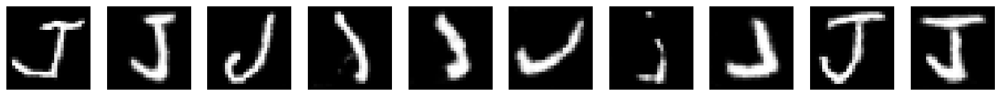

Epoch 500: D Accuracy = 0.7230
27/27 [==============================] - 1s 41ms/step - d_loss: 1.1966 - g_loss: 1.0446 - d_accuracy: 0.6838
Training DCGAN for class 8...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1903 - g_loss: 1.1372 - d_accuracy: 0.7139
Epoch 1: Generator loss improved from inf to 1.3874. Saving weights.
Epoch 1: D Accuracy = 0.8218
27/27 [==============================] - 2s 35ms/step - d_loss: 1.1833 - g_loss: 1.1461 - d_accuracy: 0.7177
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1861 - g_loss: 1.2367 - d_accuracy: 0.7262
Epoch 2: Generator loss improved from 1.3874 to 1.0183. Saving weights.
Epoch 2: D Accuracy = 0.6322
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1927 - g_loss: 1.2289 - d_accuracy: 0.7229
Epoch 3/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2942 - g_loss: 1.0412 - d_accuracy: 0.6407
Epoch 3: Generator loss improved from 1.0183 to 0.9906. Saving we

27/27 [==============================] - 1s 36ms/step - d_loss: 1.2327 - g_loss: 1.0575 - d_accuracy: 0.6599
Epoch 31/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2435 - g_loss: 1.0436 - d_accuracy: 0.6549
Epoch 32/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2471 - g_loss: 1.0428 - d_accuracy: 0.6516
Epoch 33/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2606 - g_loss: 1.0384 - d_accuracy: 0.6414
Epoch 34/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2636 - g_loss: 1.0126 - d_accuracy: 0.6367
Epoch 35/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2623 - g_loss: 1.0302 - d_accuracy: 0.6360
Epoch 36/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2657 - g_loss: 1.0077 - d_accuracy: 0.6398
Epoch 36: Generator loss improved from 0.8616 to 0.8220. Saving weights.
Epoch 36: D Accuracy = 0.7011
27/27 [==============================] - 1s 36ms/step - d_los

Epoch 62/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3197 - g_loss: 0.9218 - d_accuracy: 0.5843
Epoch 63/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3311 - g_loss: 0.9219 - d_accuracy: 0.5703
Epoch 64/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3287 - g_loss: 0.9088 - d_accuracy: 0.5861
Epoch 65/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3329 - g_loss: 0.9266 - d_accuracy: 0.5828
Epoch 66/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3273 - g_loss: 0.9147 - d_accuracy: 0.5795
Epoch 67/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3419 - g_loss: 0.9127 - d_accuracy: 0.5706
Epoch 68/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.3369 - g_loss: 0.9092 - d_accuracy: 0.5702
Epoch 69/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3299 - g_loss: 0.9065 - d_accuracy: 0.5780
Epoch 69: Generator loss impr

Epoch 94/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3516 - g_loss: 0.8748 - d_accuracy: 0.5583
Epoch 95/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3414 - g_loss: 0.8760 - d_accuracy: 0.5686
Epoch 96/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3570 - g_loss: 0.8691 - d_accuracy: 0.5526
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3519 - g_loss: 0.8710 - d_accuracy: 0.5492
Epoch 98/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3537 - g_loss: 0.8708 - d_accuracy: 0.5559
Epoch 98: Generator loss improved from 0.8039 to 0.7959. Saving weights.
Epoch 98: D Accuracy = 0.4655
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3559 - g_loss: 0.8681 - d_accuracy: 0.5526
Epoch 99/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3426 - g_loss: 0.8807 - d_accuracy: 0.5634
Epoch 100/500
27/27 [==============================] - ETA: 0

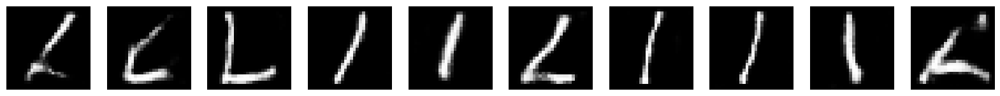

Epoch 100: D Accuracy = 0.5805
27/27 [==============================] - 1s 41ms/step - d_loss: 1.3471 - g_loss: 0.8706 - d_accuracy: 0.5613
Epoch 101/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3425 - g_loss: 0.8756 - d_accuracy: 0.5593
Epoch 102/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3495 - g_loss: 0.8676 - d_accuracy: 0.5552
Epoch 103/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3503 - g_loss: 0.8706 - d_accuracy: 0.5599
Epoch 104/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3601 - g_loss: 0.8656 - d_accuracy: 0.5464
Epoch 105/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3546 - g_loss: 0.8713 - d_accuracy: 0.5523
Epoch 106/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3552 - g_loss: 0.8686 - d_accuracy: 0.5459
Epoch 107/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3467 - g_loss: 0.8683 - d_accuracy: 0.5539

Epoch 132/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3531 - g_loss: 0.8624 - d_accuracy: 0.5488
Epoch 132: Generator loss improved from 0.7874 to 0.7860. Saving weights.
Epoch 132: D Accuracy = 0.4655
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3553 - g_loss: 0.8596 - d_accuracy: 0.5458
Epoch 133/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3490 - g_loss: 0.8660 - d_accuracy: 0.5566
Epoch 134/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3421 - g_loss: 0.8684 - d_accuracy: 0.5684
Epoch 135/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3526 - g_loss: 0.8620 - d_accuracy: 0.5577
Epoch 136/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3500 - g_loss: 0.8631 - d_accuracy: 0.5569
Epoch 137/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3500 - g_loss: 0.8615 - d_accuracy: 0.5525
Epoch 138/500
27/27 [==============================] 

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3418 - g_loss: 0.8659 - d_accuracy: 0.5536
Epoch 164/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3499 - g_loss: 0.8646 - d_accuracy: 0.5546
Epoch 165/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3392 - g_loss: 0.8684 - d_accuracy: 0.5633
Epoch 166/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3476 - g_loss: 0.8616 - d_accuracy: 0.5489
Epoch 167/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3407 - g_loss: 0.8625 - d_accuracy: 0.5678
Epoch 168/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3407 - g_loss: 0.8718 - d_accuracy: 0.5660
Epoch 168: Generator loss improved from 0.7824 to 0.7790. Saving weights.
Epoch 168: D Accuracy = 0.6034
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3413 - g_loss: 0.8685 - d_accuracy: 0.5674
Epoch 169/500
27/27 [==============================] - 1s 36ms/step

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3392 - g_loss: 0.8680 - d_accuracy: 0.5653
Epoch 195/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3351 - g_loss: 0.8712 - d_accuracy: 0.5707
Epoch 196/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.3445 - g_loss: 0.8619 - d_accuracy: 0.5614
Epoch 197/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3360 - g_loss: 0.8730 - d_accuracy: 0.5619
Epoch 198/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3411 - g_loss: 0.8708 - d_accuracy: 0.5629
Epoch 199/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3385 - g_loss: 0.8699 - d_accuracy: 0.5709
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3362 - g_loss: 0.8725 - d_accuracy: 0.5644
Class 8 — Epoch 200 preview:


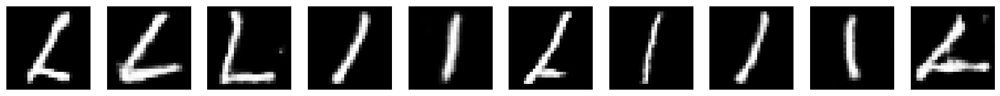

Epoch 200: D Accuracy = 0.5172
27/27 [==============================] - 1s 40ms/step - d_loss: 1.3376 - g_loss: 0.8711 - d_accuracy: 0.5628
Epoch 201/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3392 - g_loss: 0.8683 - d_accuracy: 0.5622
Epoch 202/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3378 - g_loss: 0.8699 - d_accuracy: 0.5719
Epoch 203/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3437 - g_loss: 0.8695 - d_accuracy: 0.5564
Epoch 204/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3416 - g_loss: 0.8734 - d_accuracy: 0.5610
Epoch 205/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3387 - g_loss: 0.8731 - d_accuracy: 0.5662
Epoch 206/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3351 - g_loss: 0.8713 - d_accuracy: 0.5599
Epoch 207/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3398 - g_loss: 0.8670 - d_accuracy: 0.5759

27/27 [==============================] - 1s 37ms/step - d_loss: 1.3361 - g_loss: 0.8741 - d_accuracy: 0.5656
Epoch 233/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3342 - g_loss: 0.8719 - d_accuracy: 0.5725
Epoch 234/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3375 - g_loss: 0.8694 - d_accuracy: 0.5605
Epoch 235/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3267 - g_loss: 0.8738 - d_accuracy: 0.5713
Epoch 236/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3329 - g_loss: 0.8767 - d_accuracy: 0.5674
Epoch 237/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3373 - g_loss: 0.8695 - d_accuracy: 0.5621
Epoch 238/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3380 - g_loss: 0.8689 - d_accuracy: 0.5689
Epoch 239/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3369 - g_loss: 0.8646 - d_accuracy: 0.5641
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3292 - g_loss: 0.8805 - d_accuracy: 0.5647
Epoch 265/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3308 - g_loss: 0.8766 - d_accuracy: 0.5671
Epoch 266/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3344 - g_loss: 0.8748 - d_accuracy: 0.5653
Epoch 267/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3264 - g_loss: 0.8798 - d_accuracy: 0.5837
Epoch 268/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3263 - g_loss: 0.8785 - d_accuracy: 0.5832
Epoch 269/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3330 - g_loss: 0.8838 - d_accuracy: 0.5673
Epoch 270/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3357 - g_loss: 0.8709 - d_accuracy: 0.5658
Epoch 271/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3348 - g_loss: 0.8800 - d_accuracy: 0.5654
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3188 - g_loss: 0.8892 - d_accuracy: 0.5755
Epoch 297/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3240 - g_loss: 0.8900 - d_accuracy: 0.5715
Epoch 298/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3235 - g_loss: 0.8889 - d_accuracy: 0.5799
Epoch 299/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3168 - g_loss: 0.8784 - d_accuracy: 0.5822
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3215 - g_loss: 0.8959 - d_accuracy: 0.5730
Class 8 — Epoch 300 preview:


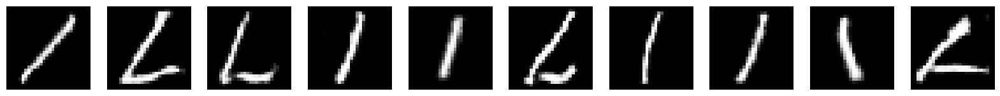

Epoch 300: D Accuracy = 0.4828
27/27 [==============================] - 1s 42ms/step - d_loss: 1.3227 - g_loss: 0.8977 - d_accuracy: 0.5698
Epoch 301/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3208 - g_loss: 0.8789 - d_accuracy: 0.5787
Epoch 302/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3211 - g_loss: 0.8878 - d_accuracy: 0.5772
Epoch 303/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3089 - g_loss: 0.8992 - d_accuracy: 0.5903
Epoch 304/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3259 - g_loss: 0.8858 - d_accuracy: 0.5775
Epoch 305/500
27/27 [==============================] - 1s 42ms/step - d_loss: 1.3196 - g_loss: 0.8891 - d_accuracy: 0.5758
Epoch 306/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3155 - g_loss: 0.8956 - d_accuracy: 0.5833
Epoch 307/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3253 - g_loss: 0.8802 - d_accuracy: 0.5793

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3071 - g_loss: 0.8925 - d_accuracy: 0.5971
Epoch 333/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3187 - g_loss: 0.8961 - d_accuracy: 0.5766
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3061 - g_loss: 0.8960 - d_accuracy: 0.5953
Epoch 335/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3137 - g_loss: 0.8987 - d_accuracy: 0.5880
Epoch 336/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3193 - g_loss: 0.8879 - d_accuracy: 0.5856
Epoch 337/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3079 - g_loss: 0.9026 - d_accuracy: 0.5896
Epoch 338/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3115 - g_loss: 0.9012 - d_accuracy: 0.5866
Epoch 339/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3150 - g_loss: 0.8905 - d_accuracy: 0.5849
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3009 - g_loss: 0.9109 - d_accuracy: 0.5982
Epoch 365/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3039 - g_loss: 0.9021 - d_accuracy: 0.6022
Epoch 366/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2997 - g_loss: 0.9058 - d_accuracy: 0.6051
Epoch 367/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3094 - g_loss: 0.8992 - d_accuracy: 0.5978
Epoch 368/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2941 - g_loss: 0.9157 - d_accuracy: 0.6015
Epoch 369/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2983 - g_loss: 0.9173 - d_accuracy: 0.6003
Epoch 370/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3081 - g_loss: 0.9034 - d_accuracy: 0.5876
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3029 - g_loss: 0.9114 - d_accuracy: 0.5929
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2923 - g_loss: 0.9164 - d_accuracy: 0.6046
Epoch 397/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2938 - g_loss: 0.9201 - d_accuracy: 0.6009
Epoch 398/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3012 - g_loss: 0.9149 - d_accuracy: 0.5931
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2869 - g_loss: 0.9245 - d_accuracy: 0.6106
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2909 - g_loss: 0.9238 - d_accuracy: 0.6034
Class 8 — Epoch 400 preview:


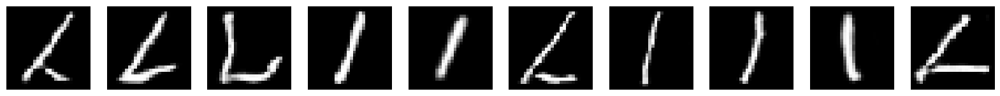

Epoch 400: D Accuracy = 0.6092
27/27 [==============================] - 1s 40ms/step - d_loss: 1.2903 - g_loss: 0.9256 - d_accuracy: 0.6036
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2857 - g_loss: 0.9212 - d_accuracy: 0.6193
Epoch 402/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2860 - g_loss: 0.9259 - d_accuracy: 0.6068
Epoch 403/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3040 - g_loss: 0.9199 - d_accuracy: 0.5925
Epoch 404/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2926 - g_loss: 0.9188 - d_accuracy: 0.6031
Epoch 405/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2867 - g_loss: 0.9204 - d_accuracy: 0.6095
Epoch 406/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2903 - g_loss: 0.9332 - d_accuracy: 0.6068
Epoch 407/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2898 - g_loss: 0.9226 - d_accuracy: 0.6083

27/27 [==============================] - 1s 36ms/step - d_loss: 1.2747 - g_loss: 0.9451 - d_accuracy: 0.6183
Epoch 433/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2714 - g_loss: 0.9406 - d_accuracy: 0.6323
Epoch 434/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2929 - g_loss: 0.9311 - d_accuracy: 0.5960
Epoch 435/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2879 - g_loss: 0.9284 - d_accuracy: 0.6109
Epoch 436/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2869 - g_loss: 0.9272 - d_accuracy: 0.6136
Epoch 437/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2820 - g_loss: 0.9350 - d_accuracy: 0.6137
Epoch 438/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2737 - g_loss: 0.9403 - d_accuracy: 0.6211
Epoch 439/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2834 - g_loss: 0.9397 - d_accuracy: 0.6104
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2654 - g_loss: 0.9487 - d_accuracy: 0.6294
Epoch 465/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.2698 - g_loss: 0.9502 - d_accuracy: 0.6257
Epoch 466/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2751 - g_loss: 0.9428 - d_accuracy: 0.6178
Epoch 467/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2769 - g_loss: 0.9423 - d_accuracy: 0.6180
Epoch 468/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2682 - g_loss: 0.9514 - d_accuracy: 0.6181
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2755 - g_loss: 0.9502 - d_accuracy: 0.6158
Epoch 470/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2777 - g_loss: 0.9544 - d_accuracy: 0.6124
Epoch 471/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2727 - g_loss: 0.9440 - d_accuracy: 0.6221
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2657 - g_loss: 0.9672 - d_accuracy: 0.6200
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2700 - g_loss: 0.9582 - d_accuracy: 0.6306
Epoch 498/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2634 - g_loss: 0.9755 - d_accuracy: 0.6314
Epoch 499/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2718 - g_loss: 0.9591 - d_accuracy: 0.6164
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2472 - g_loss: 0.9813 - d_accuracy: 0.6389
Class 8 — Epoch 500 preview:


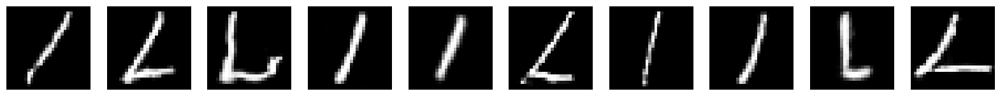

Epoch 500: D Accuracy = 0.5977
27/27 [==============================] - 1s 50ms/step - d_loss: 1.2479 - g_loss: 0.9816 - d_accuracy: 0.6374
Training DCGAN for class 9...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2721 - g_loss: 1.0496 - d_accuracy: 0.6658
Epoch 1: Generator loss improved from inf to 1.1904. Saving weights.
Epoch 1: D Accuracy = 0.7432
27/27 [==============================] - 2s 35ms/step - d_loss: 1.2687 - g_loss: 1.0547 - d_accuracy: 0.6686
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3375 - g_loss: 1.0460 - d_accuracy: 0.6454
Epoch 2: Generator loss improved from 1.1904 to 0.9706. Saving weights.
Epoch 2: D Accuracy = 0.5541
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3389 - g_loss: 1.0433 - d_accuracy: 0.6421
Epoch 3/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3889 - g_loss: 0.9233 - d_accuracy: 0.5697
Epoch 3: Generator loss improved from 0.9706 to 0.8154. Saving we

27/27 [==============================] - 1s 36ms/step - d_loss: 1.2763 - g_loss: 0.9393 - d_accuracy: 0.6306
Epoch 31/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2661 - g_loss: 0.9522 - d_accuracy: 0.6391
Epoch 32/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2677 - g_loss: 0.9511 - d_accuracy: 0.6408
Epoch 33/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2723 - g_loss: 0.9530 - d_accuracy: 0.6403
Epoch 34/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2568 - g_loss: 0.9680 - d_accuracy: 0.6542
Epoch 35/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2542 - g_loss: 0.9723 - d_accuracy: 0.6503
Epoch 36/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2599 - g_loss: 0.9789 - d_accuracy: 0.6463
Epoch 37/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2588 - g_loss: 0.9754 - d_accuracy: 0.6473
Epoch 38/500
27/27 [=================

27/27 [==============================] - 1s 34ms/step - d_loss: 1.2910 - g_loss: 0.9594 - d_accuracy: 0.6166
Epoch 63/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2756 - g_loss: 0.9707 - d_accuracy: 0.6349
Epoch 64/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2908 - g_loss: 0.9528 - d_accuracy: 0.6237
Epoch 65/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3033 - g_loss: 0.9435 - d_accuracy: 0.6132
Epoch 66/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2988 - g_loss: 0.9391 - d_accuracy: 0.6086
Epoch 67/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3015 - g_loss: 0.9462 - d_accuracy: 0.6162
Epoch 68/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3032 - g_loss: 0.9356 - d_accuracy: 0.6208
Epoch 69/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3060 - g_loss: 0.9396 - d_accuracy: 0.6050
Epoch 70/500
27/27 [=================

27/27 [==============================] - ETA: 0s - d_loss: 1.3298 - g_loss: 0.8918 - d_accuracy: 0.5866
Epoch 94: Generator loss improved from 0.7850 to 0.7841. Saving weights.
Epoch 94: D Accuracy = 0.5405
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3326 - g_loss: 0.8880 - d_accuracy: 0.5849
Epoch 95/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3339 - g_loss: 0.8965 - d_accuracy: 0.5801
Epoch 96/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3315 - g_loss: 0.8879 - d_accuracy: 0.5873
Epoch 96: Generator loss improved from 0.7841 to 0.7504. Saving weights.
Epoch 96: D Accuracy = 0.5405
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3331 - g_loss: 0.8830 - d_accuracy: 0.5856
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3327 - g_loss: 0.8878 - d_accuracy: 0.5811
Epoch 98/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3362 - g_loss: 0.8929 - d_accura

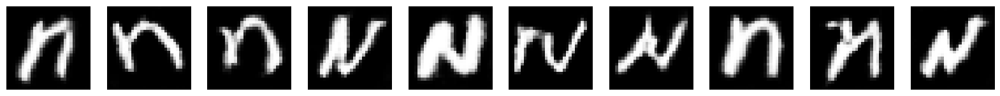

Epoch 100: D Accuracy = 0.5270
27/27 [==============================] - 1s 42ms/step - d_loss: 1.3396 - g_loss: 0.8836 - d_accuracy: 0.5720
Epoch 101/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3311 - g_loss: 0.8906 - d_accuracy: 0.5755
Epoch 102/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3283 - g_loss: 0.8873 - d_accuracy: 0.5828
Epoch 103/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3309 - g_loss: 0.8889 - d_accuracy: 0.5772
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3281 - g_loss: 0.8859 - d_accuracy: 0.5871
Epoch 105/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3274 - g_loss: 0.8857 - d_accuracy: 0.5840
Epoch 106/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3165 - g_loss: 0.9024 - d_accuracy: 0.5961
Epoch 107/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3355 - g_loss: 0.8862 - d_accuracy: 0.5808

27/27 [==============================] - 1s 34ms/step - d_loss: 1.3238 - g_loss: 0.8936 - d_accuracy: 0.5881
Epoch 133/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3228 - g_loss: 0.8893 - d_accuracy: 0.5862
Epoch 134/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3317 - g_loss: 0.8751 - d_accuracy: 0.5738
Epoch 135/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3289 - g_loss: 0.8877 - d_accuracy: 0.5766
Epoch 136/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3278 - g_loss: 0.8832 - d_accuracy: 0.5827
Epoch 137/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3297 - g_loss: 0.8794 - d_accuracy: 0.5842
Epoch 138/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3184 - g_loss: 0.8885 - d_accuracy: 0.5967
Epoch 139/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3246 - g_loss: 0.8883 - d_accuracy: 0.5930
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3209 - g_loss: 0.8905 - d_accuracy: 0.5880
Epoch 165/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3293 - g_loss: 0.8789 - d_accuracy: 0.5821
Epoch 166/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3120 - g_loss: 0.8969 - d_accuracy: 0.5926
Epoch 167/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3274 - g_loss: 0.8920 - d_accuracy: 0.5812
Epoch 168/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3205 - g_loss: 0.8824 - d_accuracy: 0.5947
Epoch 169/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3215 - g_loss: 0.8987 - d_accuracy: 0.5819
Epoch 170/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3258 - g_loss: 0.8825 - d_accuracy: 0.5806
Epoch 171/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3214 - g_loss: 0.8875 - d_accuracy: 0.5925
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3070 - g_loss: 0.9037 - d_accuracy: 0.5991
Epoch 197/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3184 - g_loss: 0.8942 - d_accuracy: 0.5913
Epoch 198/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3127 - g_loss: 0.8997 - d_accuracy: 0.5906
Epoch 199/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3094 - g_loss: 0.9055 - d_accuracy: 0.6035
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3107 - g_loss: 0.8985 - d_accuracy: 0.6004
Class 9 — Epoch 200 preview:


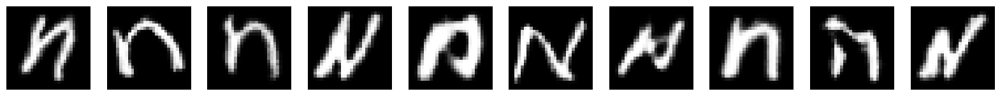

Epoch 200: D Accuracy = 0.5541
27/27 [==============================] - 1s 42ms/step - d_loss: 1.3103 - g_loss: 0.8997 - d_accuracy: 0.5987
Epoch 201/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3045 - g_loss: 0.9061 - d_accuracy: 0.5935
Epoch 202/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3147 - g_loss: 0.8926 - d_accuracy: 0.5866
Epoch 203/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3188 - g_loss: 0.8888 - d_accuracy: 0.5941
Epoch 204/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3157 - g_loss: 0.8996 - d_accuracy: 0.5920
Epoch 205/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3145 - g_loss: 0.8889 - d_accuracy: 0.5995
Epoch 206/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3113 - g_loss: 0.9023 - d_accuracy: 0.5965
Epoch 207/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3128 - g_loss: 0.8962 - d_accuracy: 0.5902

27/27 [==============================] - 1s 34ms/step - d_loss: 1.3090 - g_loss: 0.9050 - d_accuracy: 0.5940
Epoch 233/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3039 - g_loss: 0.9029 - d_accuracy: 0.6033
Epoch 234/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3142 - g_loss: 0.8941 - d_accuracy: 0.5943
Epoch 235/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2985 - g_loss: 0.9138 - d_accuracy: 0.6044
Epoch 236/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3056 - g_loss: 0.9043 - d_accuracy: 0.6042
Epoch 237/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3044 - g_loss: 0.8996 - d_accuracy: 0.6045
Epoch 238/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3000 - g_loss: 0.9098 - d_accuracy: 0.6125
Epoch 239/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3100 - g_loss: 0.9022 - d_accuracy: 0.6012
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3060 - g_loss: 0.9080 - d_accuracy: 0.6021
Epoch 265/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3002 - g_loss: 0.9112 - d_accuracy: 0.6090
Epoch 266/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2957 - g_loss: 0.9215 - d_accuracy: 0.6015
Epoch 267/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2917 - g_loss: 0.9162 - d_accuracy: 0.6148
Epoch 268/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2879 - g_loss: 0.9152 - d_accuracy: 0.6171
Epoch 269/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2865 - g_loss: 0.9223 - d_accuracy: 0.6211
Epoch 270/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2911 - g_loss: 0.9207 - d_accuracy: 0.6166
Epoch 271/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2929 - g_loss: 0.9187 - d_accuracy: 0.6072
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2842 - g_loss: 0.9271 - d_accuracy: 0.6252
Epoch 297/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2793 - g_loss: 0.9333 - d_accuracy: 0.6200
Epoch 298/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2941 - g_loss: 0.9179 - d_accuracy: 0.6070
Epoch 299/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2888 - g_loss: 0.9297 - d_accuracy: 0.6198
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2738 - g_loss: 0.9323 - d_accuracy: 0.6264
Class 9 — Epoch 300 preview:


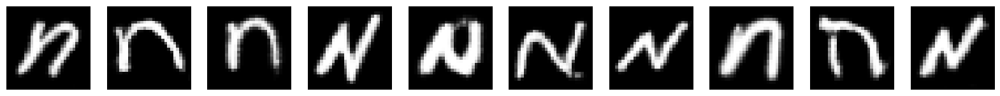

Epoch 300: D Accuracy = 0.6892
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2707 - g_loss: 0.9338 - d_accuracy: 0.6286
Epoch 301/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2834 - g_loss: 0.9348 - d_accuracy: 0.6214
Epoch 302/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2818 - g_loss: 0.9284 - d_accuracy: 0.6229
Epoch 303/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2924 - g_loss: 0.9197 - d_accuracy: 0.6128
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2877 - g_loss: 0.9225 - d_accuracy: 0.6200
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2788 - g_loss: 0.9379 - d_accuracy: 0.6186
Epoch 306/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2720 - g_loss: 0.9349 - d_accuracy: 0.6374
Epoch 307/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2766 - g_loss: 0.9279 - d_accuracy: 0.6321

27/27 [==============================] - 1s 37ms/step - d_loss: 1.2778 - g_loss: 0.9392 - d_accuracy: 0.6282
Epoch 333/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2678 - g_loss: 0.9490 - d_accuracy: 0.6407
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2693 - g_loss: 0.9369 - d_accuracy: 0.6330
Epoch 335/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2596 - g_loss: 0.9568 - d_accuracy: 0.6468
Epoch 336/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2654 - g_loss: 0.9529 - d_accuracy: 0.6360
Epoch 337/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2818 - g_loss: 0.9462 - d_accuracy: 0.6210
Epoch 338/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2659 - g_loss: 0.9469 - d_accuracy: 0.6380
Epoch 339/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2539 - g_loss: 0.9594 - d_accuracy: 0.6439
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2582 - g_loss: 0.9624 - d_accuracy: 0.6433
Epoch 365/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2516 - g_loss: 0.9618 - d_accuracy: 0.6449
Epoch 366/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2636 - g_loss: 0.9667 - d_accuracy: 0.6367
Epoch 367/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2622 - g_loss: 0.9544 - d_accuracy: 0.6389
Epoch 368/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2635 - g_loss: 0.9608 - d_accuracy: 0.6334
Epoch 369/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2518 - g_loss: 0.9627 - d_accuracy: 0.6562
Epoch 370/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2573 - g_loss: 0.9560 - d_accuracy: 0.6413
Epoch 371/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2541 - g_loss: 0.9732 - d_accuracy: 0.6444
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2405 - g_loss: 0.9893 - d_accuracy: 0.6511
Epoch 397/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2332 - g_loss: 0.9784 - d_accuracy: 0.6678
Epoch 398/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2288 - g_loss: 0.9934 - d_accuracy: 0.6593
Epoch 399/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2473 - g_loss: 0.9778 - d_accuracy: 0.6458
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2466 - g_loss: 0.9785 - d_accuracy: 0.6487
Class 9 — Epoch 400 preview:


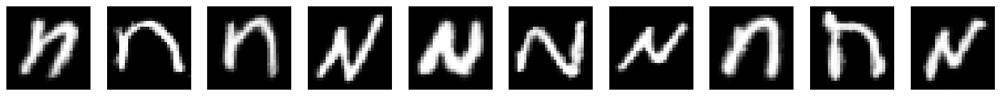

Epoch 400: D Accuracy = 0.6081
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2477 - g_loss: 0.9823 - d_accuracy: 0.6472
Epoch 401/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2416 - g_loss: 0.9851 - d_accuracy: 0.6581
Epoch 402/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2326 - g_loss: 0.9857 - d_accuracy: 0.6575
Epoch 403/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2338 - g_loss: 1.0008 - d_accuracy: 0.6515
Epoch 404/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2531 - g_loss: 0.9863 - d_accuracy: 0.6413
Epoch 405/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2421 - g_loss: 0.9890 - d_accuracy: 0.6556
Epoch 406/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2387 - g_loss: 0.9824 - d_accuracy: 0.6586
Epoch 407/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2304 - g_loss: 0.9951 - d_accuracy: 0.6575

27/27 [==============================] - 1s 34ms/step - d_loss: 1.2245 - g_loss: 0.9993 - d_accuracy: 0.6647
Epoch 433/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2142 - g_loss: 1.0006 - d_accuracy: 0.6739
Epoch 434/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2283 - g_loss: 1.0084 - d_accuracy: 0.6603
Epoch 435/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2260 - g_loss: 1.0021 - d_accuracy: 0.6630
Epoch 436/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2271 - g_loss: 0.9972 - d_accuracy: 0.6613
Epoch 437/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2174 - g_loss: 1.0218 - d_accuracy: 0.6658
Epoch 438/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2148 - g_loss: 1.0161 - d_accuracy: 0.6784
Epoch 439/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2155 - g_loss: 1.0127 - d_accuracy: 0.6771
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2053 - g_loss: 1.0294 - d_accuracy: 0.6834
Epoch 465/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2173 - g_loss: 1.0158 - d_accuracy: 0.6680
Epoch 466/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2034 - g_loss: 1.0284 - d_accuracy: 0.6793
Epoch 467/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2149 - g_loss: 1.0199 - d_accuracy: 0.6739
Epoch 468/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2048 - g_loss: 1.0249 - d_accuracy: 0.6819
Epoch 469/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2038 - g_loss: 1.0236 - d_accuracy: 0.6866
Epoch 470/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2143 - g_loss: 1.0321 - d_accuracy: 0.6672
Epoch 471/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2050 - g_loss: 1.0239 - d_accuracy: 0.6727
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2057 - g_loss: 1.0556 - d_accuracy: 0.6833
Epoch 497/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1895 - g_loss: 1.0439 - d_accuracy: 0.6935
Epoch 498/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1736 - g_loss: 1.0644 - d_accuracy: 0.6984
Epoch 499/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1841 - g_loss: 1.0503 - d_accuracy: 0.6929
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1947 - g_loss: 1.0656 - d_accuracy: 0.6739
Class 9 — Epoch 500 preview:


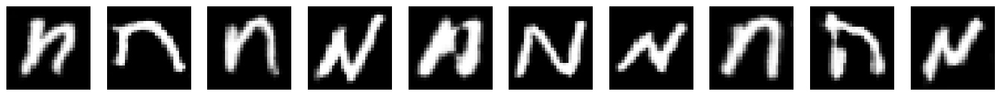

Epoch 500: D Accuracy = 0.6216
27/27 [==============================] - 1s 42ms/step - d_loss: 1.1950 - g_loss: 1.0728 - d_accuracy: 0.6721
Training DCGAN for class 10...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2000 - g_loss: 1.0870 - d_accuracy: 0.7083
Epoch 1: Generator loss improved from inf to 1.4928. Saving weights.
Epoch 1: D Accuracy = 0.8188
27/27 [==============================] - 2s 36ms/step - d_loss: 1.1934 - g_loss: 1.1015 - d_accuracy: 0.7122
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1586 - g_loss: 1.2524 - d_accuracy: 0.7532
Epoch 2: Generator loss improved from 1.4928 to 1.1573. Saving weights.
Epoch 2: D Accuracy = 0.6562
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1632 - g_loss: 1.2490 - d_accuracy: 0.7497
Epoch 3/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3165 - g_loss: 1.0363 - d_accuracy: 0.6269
Epoch 3: Generator loss improved from 1.1573 to 1.1123. Saving w

27/27 [==============================] - 1s 37ms/step - d_loss: 1.3326 - g_loss: 0.8783 - d_accuracy: 0.5811
Epoch 31/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3481 - g_loss: 0.8775 - d_accuracy: 0.5682
Epoch 32/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3294 - g_loss: 0.8841 - d_accuracy: 0.5771
Epoch 33/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3427 - g_loss: 0.8808 - d_accuracy: 0.5766
Epoch 34/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3432 - g_loss: 0.8714 - d_accuracy: 0.5775
Epoch 34: Generator loss improved from 0.8234 to 0.8052. Saving weights.
Epoch 34: D Accuracy = 0.5625
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3434 - g_loss: 0.8690 - d_accuracy: 0.5770
Epoch 35/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3323 - g_loss: 0.8924 - d_accuracy: 0.5844
Epoch 36/500
27/27 [==============================] - 1s 35ms/step - d_los

Epoch 62/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3601 - g_loss: 0.8461 - d_accuracy: 0.5511
Epoch 63/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3531 - g_loss: 0.8506 - d_accuracy: 0.5585
Epoch 64/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3577 - g_loss: 0.8495 - d_accuracy: 0.5498
Epoch 65/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3597 - g_loss: 0.8461 - d_accuracy: 0.5535
Epoch 66/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3562 - g_loss: 0.8481 - d_accuracy: 0.5590
Epoch 67/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3599 - g_loss: 0.8458 - d_accuracy: 0.5518
Epoch 68/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3568 - g_loss: 0.8463 - d_accuracy: 0.5644
Epoch 69/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3565 - g_loss: 0.8502 - d_accuracy: 0.5459
Epoch 70/500
27/27 [====

Epoch 94/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3607 - g_loss: 0.8338 - d_accuracy: 0.5467
Epoch 95/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3649 - g_loss: 0.8301 - d_accuracy: 0.5417
Epoch 96/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3601 - g_loss: 0.8388 - d_accuracy: 0.5468
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3645 - g_loss: 0.8323 - d_accuracy: 0.5415
Epoch 98/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3647 - g_loss: 0.8382 - d_accuracy: 0.5396
Epoch 99/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3594 - g_loss: 0.8354 - d_accuracy: 0.5463
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3676 - g_loss: 0.8315 - d_accuracy: 0.5401
Class 10 — Epoch 100 preview:


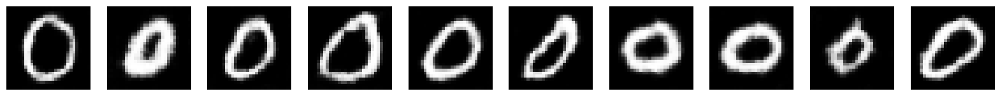

Epoch 100: D Accuracy = 0.5000
27/27 [==============================] - 1s 41ms/step - d_loss: 1.3684 - g_loss: 0.8311 - d_accuracy: 0.5386
Epoch 101/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3690 - g_loss: 0.8311 - d_accuracy: 0.5338
Epoch 102/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3715 - g_loss: 0.8305 - d_accuracy: 0.5319
Epoch 103/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3679 - g_loss: 0.8256 - d_accuracy: 0.5340
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3669 - g_loss: 0.8338 - d_accuracy: 0.5343
Epoch 105/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3655 - g_loss: 0.8317 - d_accuracy: 0.5383
Epoch 106/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3699 - g_loss: 0.8288 - d_accuracy: 0.5341
Epoch 107/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3682 - g_loss: 0.8302 - d_accuracy: 0.5319

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3677 - g_loss: 0.8243 - d_accuracy: 0.5256
Epoch 133/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3657 - g_loss: 0.8257 - d_accuracy: 0.5291
Epoch 134/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3734 - g_loss: 0.8197 - d_accuracy: 0.5186
Epoch 135/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3748 - g_loss: 0.8187 - d_accuracy: 0.5240
Epoch 136/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3622 - g_loss: 0.8238 - d_accuracy: 0.5384
Epoch 137/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3708 - g_loss: 0.8251 - d_accuracy: 0.5309
Epoch 138/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3686 - g_loss: 0.8208 - d_accuracy: 0.5261
Epoch 139/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3716 - g_loss: 0.8188 - d_accuracy: 0.5234
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3683 - g_loss: 0.8241 - d_accuracy: 0.5295
Epoch 165/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3683 - g_loss: 0.8227 - d_accuracy: 0.5275
Epoch 166/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3728 - g_loss: 0.8221 - d_accuracy: 0.5182
Epoch 167/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3658 - g_loss: 0.8230 - d_accuracy: 0.5242
Epoch 168/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3721 - g_loss: 0.8207 - d_accuracy: 0.5244
Epoch 169/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3673 - g_loss: 0.8208 - d_accuracy: 0.5281
Epoch 170/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3730 - g_loss: 0.8180 - d_accuracy: 0.5172
Epoch 171/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3641 - g_loss: 0.8229 - d_accuracy: 0.5319
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3668 - g_loss: 0.8221 - d_accuracy: 0.5254
Epoch 197/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3683 - g_loss: 0.8212 - d_accuracy: 0.5227
Epoch 198/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3720 - g_loss: 0.8180 - d_accuracy: 0.5221
Epoch 199/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3670 - g_loss: 0.8249 - d_accuracy: 0.5248
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3651 - g_loss: 0.8251 - d_accuracy: 0.5315
Class 10 — Epoch 200 preview:


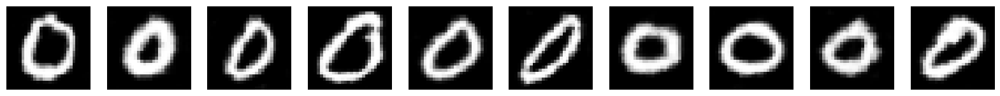

Epoch 200: D Accuracy = 0.4750
27/27 [==============================] - 1s 49ms/step - d_loss: 1.3667 - g_loss: 0.8238 - d_accuracy: 0.5295
Epoch 201/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3675 - g_loss: 0.8218 - d_accuracy: 0.5225
Epoch 202/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3741 - g_loss: 0.8195 - d_accuracy: 0.5243
Epoch 203/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3718 - g_loss: 0.8204 - d_accuracy: 0.5247
Epoch 204/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3700 - g_loss: 0.8191 - d_accuracy: 0.5229
Epoch 205/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3678 - g_loss: 0.8227 - d_accuracy: 0.5306
Epoch 206/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3625 - g_loss: 0.8264 - d_accuracy: 0.5347
Epoch 207/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3625 - g_loss: 0.8247 - d_accuracy: 0.5419

27/27 [==============================] - 1s 36ms/step - d_loss: 1.3701 - g_loss: 0.8179 - d_accuracy: 0.5246
Epoch 233/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3642 - g_loss: 0.8236 - d_accuracy: 0.5283
Epoch 234/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3686 - g_loss: 0.8212 - d_accuracy: 0.5238
Epoch 235/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3652 - g_loss: 0.8193 - d_accuracy: 0.5276
Epoch 236/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3669 - g_loss: 0.8217 - d_accuracy: 0.5224
Epoch 237/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3659 - g_loss: 0.8192 - d_accuracy: 0.5238
Epoch 238/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3598 - g_loss: 0.8285 - d_accuracy: 0.5366
Epoch 239/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3636 - g_loss: 0.8259 - d_accuracy: 0.5347
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3613 - g_loss: 0.8265 - d_accuracy: 0.5298
Epoch 265/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3591 - g_loss: 0.8265 - d_accuracy: 0.5253
Epoch 266/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3653 - g_loss: 0.8246 - d_accuracy: 0.5270
Epoch 267/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3623 - g_loss: 0.8230 - d_accuracy: 0.5344
Epoch 268/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3605 - g_loss: 0.8260 - d_accuracy: 0.5415
Epoch 269/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3560 - g_loss: 0.8304 - d_accuracy: 0.5406
Epoch 270/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3659 - g_loss: 0.8223 - d_accuracy: 0.5301
Epoch 271/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3637 - g_loss: 0.8216 - d_accuracy: 0.5307
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3567 - g_loss: 0.8341 - d_accuracy: 0.5415
Epoch 297/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3514 - g_loss: 0.8352 - d_accuracy: 0.5465
Epoch 298/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3528 - g_loss: 0.8324 - d_accuracy: 0.5450
Epoch 299/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3551 - g_loss: 0.8288 - d_accuracy: 0.5397
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3617 - g_loss: 0.8276 - d_accuracy: 0.5377
Class 10 — Epoch 300 preview:


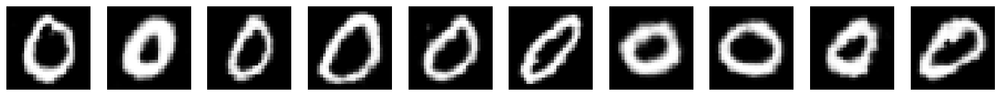

Epoch 300: D Accuracy = 0.5250
27/27 [==============================] - 1s 45ms/step - d_loss: 1.3614 - g_loss: 0.8282 - d_accuracy: 0.5372
Epoch 301/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3548 - g_loss: 0.8333 - d_accuracy: 0.5438
Epoch 302/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3544 - g_loss: 0.8319 - d_accuracy: 0.5426
Epoch 303/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3563 - g_loss: 0.8260 - d_accuracy: 0.5441
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3533 - g_loss: 0.8359 - d_accuracy: 0.5417
Epoch 305/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3530 - g_loss: 0.8363 - d_accuracy: 0.5444
Epoch 306/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3563 - g_loss: 0.8323 - d_accuracy: 0.5374
Epoch 307/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3560 - g_loss: 0.8353 - d_accuracy: 0.5396

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3465 - g_loss: 0.8394 - d_accuracy: 0.5405
Epoch 333/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3497 - g_loss: 0.8403 - d_accuracy: 0.5398
Epoch 334/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.3503 - g_loss: 0.8380 - d_accuracy: 0.5508
Epoch 335/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3476 - g_loss: 0.8392 - d_accuracy: 0.5462
Epoch 336/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3530 - g_loss: 0.8326 - d_accuracy: 0.5433
Epoch 337/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3479 - g_loss: 0.8365 - d_accuracy: 0.5562
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3488 - g_loss: 0.8393 - d_accuracy: 0.5463
Epoch 339/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3475 - g_loss: 0.8401 - d_accuracy: 0.5528
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3484 - g_loss: 0.8425 - d_accuracy: 0.5473
Epoch 365/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3445 - g_loss: 0.8440 - d_accuracy: 0.5507
Epoch 366/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3475 - g_loss: 0.8382 - d_accuracy: 0.5449
Epoch 367/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3457 - g_loss: 0.8415 - d_accuracy: 0.5503
Epoch 368/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3443 - g_loss: 0.8479 - d_accuracy: 0.5563
Epoch 369/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3459 - g_loss: 0.8430 - d_accuracy: 0.5537
Epoch 370/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3446 - g_loss: 0.8409 - d_accuracy: 0.5564
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3473 - g_loss: 0.8401 - d_accuracy: 0.5526
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3399 - g_loss: 0.8534 - d_accuracy: 0.5610
Epoch 397/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3385 - g_loss: 0.8514 - d_accuracy: 0.5606
Epoch 398/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3395 - g_loss: 0.8508 - d_accuracy: 0.5557
Epoch 399/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3390 - g_loss: 0.8481 - d_accuracy: 0.5557
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3425 - g_loss: 0.8443 - d_accuracy: 0.5513
Class 10 — Epoch 400 preview:


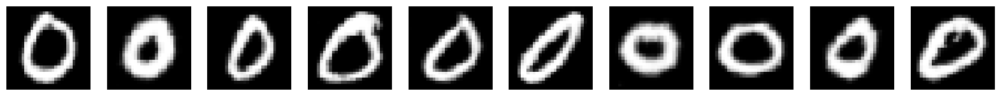

Epoch 400: D Accuracy = 0.5500
27/27 [==============================] - 1s 41ms/step - d_loss: 1.3425 - g_loss: 0.8444 - d_accuracy: 0.5513
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3375 - g_loss: 0.8520 - d_accuracy: 0.5592
Epoch 402/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3379 - g_loss: 0.8512 - d_accuracy: 0.5586
Epoch 403/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3362 - g_loss: 0.8454 - d_accuracy: 0.5734
Epoch 404/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3328 - g_loss: 0.8525 - d_accuracy: 0.5641
Epoch 405/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3383 - g_loss: 0.8486 - d_accuracy: 0.5566
Epoch 406/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3314 - g_loss: 0.8566 - d_accuracy: 0.5701
Epoch 407/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3318 - g_loss: 0.8555 - d_accuracy: 0.5638

27/27 [==============================] - 1s 38ms/step - d_loss: 1.3323 - g_loss: 0.8582 - d_accuracy: 0.5667
Epoch 433/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3284 - g_loss: 0.8565 - d_accuracy: 0.5712
Epoch 434/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3291 - g_loss: 0.8575 - d_accuracy: 0.5726
Epoch 435/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3295 - g_loss: 0.8576 - d_accuracy: 0.5675
Epoch 436/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3247 - g_loss: 0.8622 - d_accuracy: 0.5779
Epoch 437/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3294 - g_loss: 0.8577 - d_accuracy: 0.5729
Epoch 438/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3259 - g_loss: 0.8626 - d_accuracy: 0.5700
Epoch 439/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3332 - g_loss: 0.8554 - d_accuracy: 0.5651
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3200 - g_loss: 0.8690 - d_accuracy: 0.5826
Epoch 465/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3153 - g_loss: 0.8745 - d_accuracy: 0.5792
Epoch 466/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3219 - g_loss: 0.8741 - d_accuracy: 0.5783
Epoch 467/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3200 - g_loss: 0.8666 - d_accuracy: 0.5830
Epoch 468/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3249 - g_loss: 0.8695 - d_accuracy: 0.5801
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3244 - g_loss: 0.8668 - d_accuracy: 0.5699
Epoch 470/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3247 - g_loss: 0.8664 - d_accuracy: 0.5713
Epoch 471/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3231 - g_loss: 0.8688 - d_accuracy: 0.5704
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3096 - g_loss: 0.8763 - d_accuracy: 0.5860
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3153 - g_loss: 0.8760 - d_accuracy: 0.5799
Epoch 498/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3132 - g_loss: 0.8815 - d_accuracy: 0.5851
Epoch 499/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3105 - g_loss: 0.8834 - d_accuracy: 0.5886
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3090 - g_loss: 0.8815 - d_accuracy: 0.5891
Class 10 — Epoch 500 preview:


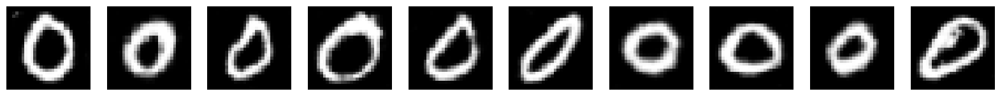

Epoch 500: D Accuracy = 0.5812
27/27 [==============================] - 1s 42ms/step - d_loss: 1.3097 - g_loss: 0.8797 - d_accuracy: 0.5888
Training DCGAN for class 11...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9437 - g_loss: 1.3541 - d_accuracy: 0.8265
Epoch 1: Generator loss improved from inf to 1.8622. Saving weights.
Epoch 1: D Accuracy = 0.9510
27/27 [==============================] - 2s 36ms/step - d_loss: 0.9338 - g_loss: 1.3722 - d_accuracy: 0.8309
Epoch 2/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.6140 - g_loss: 2.2301 - d_accuracy: 0.9470
Epoch 3/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.5264 - g_loss: 2.7783 - d_accuracy: 0.9648
Epoch 4/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.4668 - g_loss: 3.3542 - d_accuracy: 0.9789
Epoch 5/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.4535 - g_loss: 3.5359 - d_accuracy: 0.9805
Epoch 6/500
27/27 [===

27/27 [==============================] - 1s 36ms/step - d_loss: 0.3517 - g_loss: 6.1955 - d_accuracy: 0.9989
Epoch 32/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.3490 - g_loss: 6.2071 - d_accuracy: 0.9993
Epoch 33/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.3485 - g_loss: 6.2616 - d_accuracy: 0.9991
Epoch 34/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.3483 - g_loss: 6.2995 - d_accuracy: 0.9987
Epoch 35/500
27/27 [==============================] - 1s 38ms/step - d_loss: 0.3462 - g_loss: 6.3387 - d_accuracy: 0.9994
Epoch 36/500
27/27 [==============================] - 1s 38ms/step - d_loss: 0.3460 - g_loss: 6.4013 - d_accuracy: 0.9996
Epoch 37/500
27/27 [==============================] - 1s 37ms/step - d_loss: 0.3444 - g_loss: 6.5078 - d_accuracy: 0.9996
Epoch 38/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.3441 - g_loss: 6.4850 - d_accuracy: 0.9994
Epoch 39/500
27/27 [=================

Epoch 63/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1887 - g_loss: 1.1142 - d_accuracy: 0.6931
Epoch 64/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1956 - g_loss: 1.1074 - d_accuracy: 0.6848
Epoch 65/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2015 - g_loss: 1.1081 - d_accuracy: 0.6771
Epoch 66/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2177 - g_loss: 1.0909 - d_accuracy: 0.6710
Epoch 67/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2315 - g_loss: 1.0705 - d_accuracy: 0.6663
Epoch 67: Generator loss improved from 0.8963 to 0.8592. Saving weights.
Epoch 67: D Accuracy = 0.6863
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2318 - g_loss: 1.0630 - d_accuracy: 0.6670
Epoch 68/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2270 - g_loss: 1.0675 - d_accuracy: 0.6588
Epoch 69/500
27/27 [==============================] - 1s 36ms

Epoch 95/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2958 - g_loss: 0.9633 - d_accuracy: 0.6155
Epoch 96/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2871 - g_loss: 0.9643 - d_accuracy: 0.6250
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2930 - g_loss: 0.9616 - d_accuracy: 0.6137
Epoch 98/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2828 - g_loss: 0.9615 - d_accuracy: 0.6229
Epoch 99/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2920 - g_loss: 0.9665 - d_accuracy: 0.6135
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2957 - g_loss: 0.9499 - d_accuracy: 0.6152
Class 11 — Epoch 100 preview:


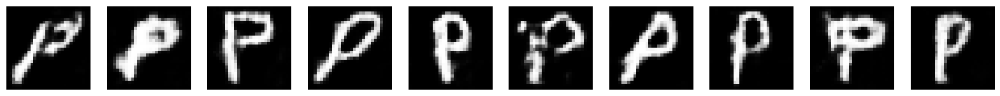

Epoch 100: D Accuracy = 0.6373
27/27 [==============================] - 1s 44ms/step - d_loss: 1.2949 - g_loss: 0.9472 - d_accuracy: 0.6160
Epoch 101/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2869 - g_loss: 0.9550 - d_accuracy: 0.6207
Epoch 102/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2965 - g_loss: 0.9536 - d_accuracy: 0.6182
Epoch 103/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2854 - g_loss: 0.9630 - d_accuracy: 0.6174
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2952 - g_loss: 0.9499 - d_accuracy: 0.6212
Epoch 105/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3058 - g_loss: 0.9446 - d_accuracy: 0.6028
Epoch 106/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3049 - g_loss: 0.9447 - d_accuracy: 0.6077
Epoch 106: Generator loss improved from 0.8386 to 0.8085. Saving weights.
Epoch 106: D Accuracy = 0.6275
27/27 [===============

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3206 - g_loss: 0.9121 - d_accuracy: 0.5899
Epoch 133/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3295 - g_loss: 0.9038 - d_accuracy: 0.5913
Epoch 134/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3291 - g_loss: 0.9017 - d_accuracy: 0.5942
Epoch 134: Generator loss improved from 0.8085 to 0.7745. Saving weights.
Epoch 134: D Accuracy = 0.5931
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3307 - g_loss: 0.8971 - d_accuracy: 0.5941
Epoch 135/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3336 - g_loss: 0.9052 - d_accuracy: 0.5782
Epoch 136/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3320 - g_loss: 0.8938 - d_accuracy: 0.5849
Epoch 137/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3356 - g_loss: 0.9025 - d_accuracy: 0.5830
Epoch 138/500
27/27 [==============================] - 1s 35ms/step

Epoch 164/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3263 - g_loss: 0.8944 - d_accuracy: 0.5884
Epoch 165/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3330 - g_loss: 0.9035 - d_accuracy: 0.5892
Epoch 166/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3276 - g_loss: 0.8915 - d_accuracy: 0.5867
Epoch 167/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3300 - g_loss: 0.8963 - d_accuracy: 0.5831
Epoch 168/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3212 - g_loss: 0.8946 - d_accuracy: 0.5924
Epoch 169/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3345 - g_loss: 0.8944 - d_accuracy: 0.5851
Epoch 170/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3399 - g_loss: 0.8905 - d_accuracy: 0.5777
Epoch 171/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3257 - g_loss: 0.8947 - d_accuracy: 0.5911
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3239 - g_loss: 0.8969 - d_accuracy: 0.5855
Epoch 197/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3299 - g_loss: 0.8855 - d_accuracy: 0.5852
Epoch 198/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3324 - g_loss: 0.8931 - d_accuracy: 0.5826
Epoch 199/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3302 - g_loss: 0.8839 - d_accuracy: 0.5907
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3312 - g_loss: 0.8942 - d_accuracy: 0.5828
Class 11 — Epoch 200 preview:


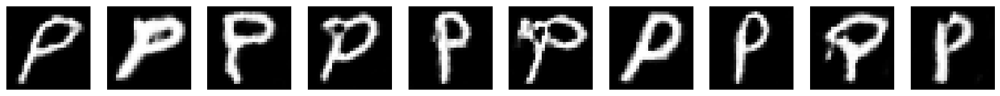

Epoch 200: D Accuracy = 0.5686
27/27 [==============================] - 1s 44ms/step - d_loss: 1.3319 - g_loss: 0.8937 - d_accuracy: 0.5823
Epoch 201/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3294 - g_loss: 0.8928 - d_accuracy: 0.5777
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3218 - g_loss: 0.8899 - d_accuracy: 0.5927
Epoch 203/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3300 - g_loss: 0.8859 - d_accuracy: 0.5735
Epoch 204/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3180 - g_loss: 0.8961 - d_accuracy: 0.5972
Epoch 205/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3357 - g_loss: 0.8862 - d_accuracy: 0.5740
Epoch 206/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.3299 - g_loss: 0.8927 - d_accuracy: 0.5867
Epoch 207/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3276 - g_loss: 0.8937 - d_accuracy: 0.5837

27/27 [==============================] - 1s 36ms/step - d_loss: 1.3198 - g_loss: 0.8998 - d_accuracy: 0.5905
Epoch 233/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.3180 - g_loss: 0.8936 - d_accuracy: 0.5908
Epoch 234/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3299 - g_loss: 0.8858 - d_accuracy: 0.5802
Epoch 235/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3235 - g_loss: 0.8935 - d_accuracy: 0.5902
Epoch 236/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3178 - g_loss: 0.9012 - d_accuracy: 0.5899
Epoch 237/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3237 - g_loss: 0.8902 - d_accuracy: 0.5872
Epoch 238/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3265 - g_loss: 0.8907 - d_accuracy: 0.5892
Epoch 239/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3300 - g_loss: 0.8929 - d_accuracy: 0.5828
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3233 - g_loss: 0.8973 - d_accuracy: 0.5842
Epoch 265/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3226 - g_loss: 0.8938 - d_accuracy: 0.5876
Epoch 266/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3169 - g_loss: 0.8975 - d_accuracy: 0.5906
Epoch 267/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3215 - g_loss: 0.8904 - d_accuracy: 0.5842
Epoch 268/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3208 - g_loss: 0.8896 - d_accuracy: 0.5883
Epoch 269/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3215 - g_loss: 0.8931 - d_accuracy: 0.5915
Epoch 270/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3228 - g_loss: 0.8918 - d_accuracy: 0.5846
Epoch 271/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3230 - g_loss: 0.9008 - d_accuracy: 0.5864
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3221 - g_loss: 0.8940 - d_accuracy: 0.5896
Epoch 297/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3102 - g_loss: 0.8982 - d_accuracy: 0.5895
Epoch 298/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3083 - g_loss: 0.9029 - d_accuracy: 0.6021
Epoch 299/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3150 - g_loss: 0.8965 - d_accuracy: 0.5929
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3180 - g_loss: 0.8914 - d_accuracy: 0.5936
Class 11 — Epoch 300 preview:


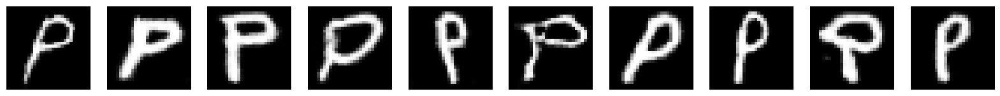

Epoch 300: D Accuracy = 0.6275
27/27 [==============================] - 1s 42ms/step - d_loss: 1.3177 - g_loss: 0.8895 - d_accuracy: 0.5948
Epoch 301/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3065 - g_loss: 0.8989 - d_accuracy: 0.5953
Epoch 302/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3164 - g_loss: 0.8984 - d_accuracy: 0.5888
Epoch 303/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3170 - g_loss: 0.8928 - d_accuracy: 0.5890
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3190 - g_loss: 0.8999 - d_accuracy: 0.5852
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3055 - g_loss: 0.9010 - d_accuracy: 0.6040
Epoch 306/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3197 - g_loss: 0.8936 - d_accuracy: 0.5948
Epoch 307/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3123 - g_loss: 0.8978 - d_accuracy: 0.5929

27/27 [==============================] - 1s 39ms/step - d_loss: 1.3125 - g_loss: 0.9009 - d_accuracy: 0.5964
Epoch 333/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3075 - g_loss: 0.9061 - d_accuracy: 0.5947
Epoch 334/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3100 - g_loss: 0.9008 - d_accuracy: 0.6027
Epoch 335/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3073 - g_loss: 0.9132 - d_accuracy: 0.5980
Epoch 336/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3057 - g_loss: 0.9068 - d_accuracy: 0.5920
Epoch 337/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3118 - g_loss: 0.9020 - d_accuracy: 0.5967
Epoch 338/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.2966 - g_loss: 0.9099 - d_accuracy: 0.6074
Epoch 339/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3044 - g_loss: 0.9080 - d_accuracy: 0.6054
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3033 - g_loss: 0.9115 - d_accuracy: 0.6033
Epoch 365/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3014 - g_loss: 0.9068 - d_accuracy: 0.6042
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3182 - g_loss: 0.8959 - d_accuracy: 0.5895
Epoch 367/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3047 - g_loss: 0.9095 - d_accuracy: 0.6053
Epoch 368/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2990 - g_loss: 0.9144 - d_accuracy: 0.6038
Epoch 369/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3065 - g_loss: 0.9074 - d_accuracy: 0.5995
Epoch 370/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2872 - g_loss: 0.9242 - d_accuracy: 0.6217
Epoch 371/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3043 - g_loss: 0.9090 - d_accuracy: 0.6046
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2888 - g_loss: 0.9259 - d_accuracy: 0.6245
Epoch 397/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2902 - g_loss: 0.9212 - d_accuracy: 0.6104
Epoch 398/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2879 - g_loss: 0.9255 - d_accuracy: 0.6120
Epoch 399/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2889 - g_loss: 0.9305 - d_accuracy: 0.6102
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2853 - g_loss: 0.9226 - d_accuracy: 0.6197
Class 11 — Epoch 400 preview:


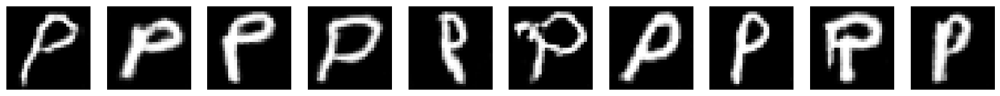

Epoch 400: D Accuracy = 0.5833
27/27 [==============================] - 1s 42ms/step - d_loss: 1.2871 - g_loss: 0.9194 - d_accuracy: 0.6184
Epoch 401/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2849 - g_loss: 0.9300 - d_accuracy: 0.6141
Epoch 402/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2967 - g_loss: 0.9251 - d_accuracy: 0.6118
Epoch 403/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2861 - g_loss: 0.9347 - d_accuracy: 0.6167
Epoch 404/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2952 - g_loss: 0.9186 - d_accuracy: 0.6149
Epoch 405/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2811 - g_loss: 0.9287 - d_accuracy: 0.6237
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2771 - g_loss: 0.9370 - d_accuracy: 0.6243
Epoch 407/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2935 - g_loss: 0.9225 - d_accuracy: 0.6117

27/27 [==============================] - 1s 37ms/step - d_loss: 1.2645 - g_loss: 0.9462 - d_accuracy: 0.6330
Epoch 433/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2748 - g_loss: 0.9418 - d_accuracy: 0.6258
Epoch 434/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2726 - g_loss: 0.9403 - d_accuracy: 0.6290
Epoch 435/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2802 - g_loss: 0.9343 - d_accuracy: 0.6217
Epoch 436/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2750 - g_loss: 0.9462 - d_accuracy: 0.6301
Epoch 437/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2706 - g_loss: 0.9570 - d_accuracy: 0.6286
Epoch 438/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2670 - g_loss: 0.9485 - d_accuracy: 0.6347
Epoch 439/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2738 - g_loss: 0.9432 - d_accuracy: 0.6293
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2697 - g_loss: 0.9512 - d_accuracy: 0.6307
Epoch 465/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2619 - g_loss: 0.9507 - d_accuracy: 0.6361
Epoch 466/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2707 - g_loss: 0.9442 - d_accuracy: 0.6237
Epoch 467/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2627 - g_loss: 0.9631 - d_accuracy: 0.6372
Epoch 468/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2643 - g_loss: 0.9612 - d_accuracy: 0.6323
Epoch 469/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2627 - g_loss: 0.9475 - d_accuracy: 0.6395
Epoch 470/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2610 - g_loss: 0.9687 - d_accuracy: 0.6296
Epoch 471/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2712 - g_loss: 0.9504 - d_accuracy: 0.6266
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2424 - g_loss: 0.9735 - d_accuracy: 0.6508
Epoch 497/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2497 - g_loss: 0.9787 - d_accuracy: 0.6499
Epoch 498/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2568 - g_loss: 0.9798 - d_accuracy: 0.6366
Epoch 499/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2485 - g_loss: 0.9703 - d_accuracy: 0.6523
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2467 - g_loss: 0.9798 - d_accuracy: 0.6513
Class 11 — Epoch 500 preview:


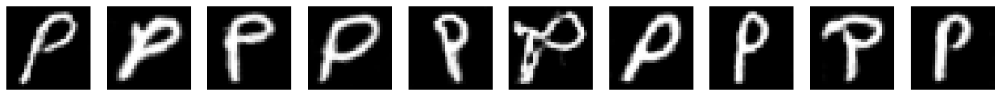

Epoch 500: D Accuracy = 0.7059
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2466 - g_loss: 0.9766 - d_accuracy: 0.6532
Training DCGAN for class 12...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2931 - g_loss: 0.9863 - d_accuracy: 0.6502
Epoch 1: Generator loss improved from inf to 1.0554. Saving weights.
Epoch 1: D Accuracy = 0.6916
27/27 [==============================] - 2s 36ms/step - d_loss: 1.2931 - g_loss: 0.9888 - d_accuracy: 0.6517
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3290 - g_loss: 0.9824 - d_accuracy: 0.6504
Epoch 2: Generator loss improved from 1.0554 to 0.9676. Saving weights.
Epoch 2: D Accuracy = 0.6776
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3275 - g_loss: 0.9818 - d_accuracy: 0.6514
Epoch 3/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2267 - g_loss: 1.0474 - d_accuracy: 0.6892
Epoch 4/500
27/27 [==============================] - ETA: 0

Epoch 31/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2201 - g_loss: 1.0010 - d_accuracy: 0.6787
Epoch 32/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2196 - g_loss: 1.0105 - d_accuracy: 0.6786
Epoch 33/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2003 - g_loss: 1.0343 - d_accuracy: 0.6994
Epoch 34/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1992 - g_loss: 1.0372 - d_accuracy: 0.6925
Epoch 35/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2097 - g_loss: 1.0402 - d_accuracy: 0.6915
Epoch 36/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.2181 - g_loss: 1.0212 - d_accuracy: 0.6793
Epoch 37/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2291 - g_loss: 1.0248 - d_accuracy: 0.6638
Epoch 38/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2499 - g_loss: 1.0095 - d_accuracy: 0.6521
Epoch 39/500
27/27 [====

27/27 [==============================] - 1s 38ms/step - d_loss: 1.3031 - g_loss: 0.9313 - d_accuracy: 0.6200
Epoch 64/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3073 - g_loss: 0.9266 - d_accuracy: 0.6121
Epoch 65/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3052 - g_loss: 0.9257 - d_accuracy: 0.6156
Epoch 66/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3059 - g_loss: 0.9208 - d_accuracy: 0.6078
Epoch 67/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2970 - g_loss: 0.9309 - d_accuracy: 0.6145
Epoch 68/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2995 - g_loss: 0.9225 - d_accuracy: 0.6217
Epoch 69/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3067 - g_loss: 0.9187 - d_accuracy: 0.6113
Epoch 70/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2994 - g_loss: 0.9244 - d_accuracy: 0.6125
Epoch 71/500
27/27 [=================

Epoch 95/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2978 - g_loss: 0.9379 - d_accuracy: 0.6137
Epoch 96/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2974 - g_loss: 0.9267 - d_accuracy: 0.6143
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3007 - g_loss: 0.9380 - d_accuracy: 0.6104
Epoch 98/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3003 - g_loss: 0.9306 - d_accuracy: 0.6156
Epoch 99/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2876 - g_loss: 0.9419 - d_accuracy: 0.6154
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2874 - g_loss: 0.9437 - d_accuracy: 0.6212
Class 12 — Epoch 100 preview:


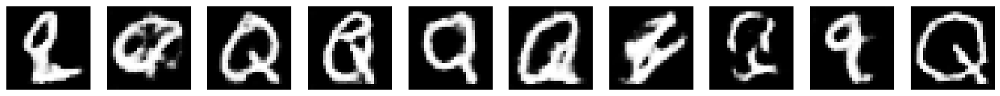

Epoch 100: D Accuracy = 0.6075
27/27 [==============================] - 1s 51ms/step - d_loss: 1.2875 - g_loss: 0.9444 - d_accuracy: 0.6207
Epoch 101/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2928 - g_loss: 0.9390 - d_accuracy: 0.6233
Epoch 102/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2912 - g_loss: 0.9434 - d_accuracy: 0.6207
Epoch 103/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2927 - g_loss: 0.9365 - d_accuracy: 0.6188
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2865 - g_loss: 0.9373 - d_accuracy: 0.6240
Epoch 105/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3004 - g_loss: 0.9293 - d_accuracy: 0.6108
Epoch 106/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2919 - g_loss: 0.9326 - d_accuracy: 0.6212
Epoch 107/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2873 - g_loss: 0.9392 - d_accuracy: 0.6243

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2855 - g_loss: 0.9503 - d_accuracy: 0.6258
Epoch 133/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2898 - g_loss: 0.9441 - d_accuracy: 0.6222
Epoch 134/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2885 - g_loss: 0.9402 - d_accuracy: 0.6280
Epoch 135/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.2816 - g_loss: 0.9409 - d_accuracy: 0.6230
Epoch 136/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2793 - g_loss: 0.9455 - d_accuracy: 0.6277
Epoch 137/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2778 - g_loss: 0.9448 - d_accuracy: 0.6324
Epoch 138/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2733 - g_loss: 0.9556 - d_accuracy: 0.6358
Epoch 139/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2689 - g_loss: 0.9531 - d_accuracy: 0.6418
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2635 - g_loss: 0.9702 - d_accuracy: 0.6356
Epoch 165/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2631 - g_loss: 0.9698 - d_accuracy: 0.6472
Epoch 166/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2672 - g_loss: 0.9670 - d_accuracy: 0.6400
Epoch 167/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2643 - g_loss: 0.9647 - d_accuracy: 0.6427
Epoch 168/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2682 - g_loss: 0.9627 - d_accuracy: 0.6353
Epoch 169/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2583 - g_loss: 0.9705 - d_accuracy: 0.6467
Epoch 170/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2699 - g_loss: 0.9624 - d_accuracy: 0.6351
Epoch 171/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2617 - g_loss: 0.9734 - d_accuracy: 0.6463
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2519 - g_loss: 0.9873 - d_accuracy: 0.6480
Epoch 197/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2591 - g_loss: 0.9767 - d_accuracy: 0.6397
Epoch 198/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2459 - g_loss: 0.9913 - d_accuracy: 0.6478
Epoch 199/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2474 - g_loss: 0.9803 - d_accuracy: 0.6513
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2364 - g_loss: 0.9995 - d_accuracy: 0.6597
Class 12 — Epoch 200 preview:


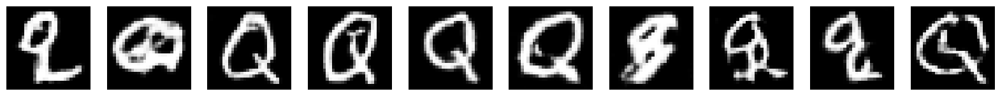

Epoch 200: D Accuracy = 0.6215
27/27 [==============================] - 1s 42ms/step - d_loss: 1.2366 - g_loss: 1.0012 - d_accuracy: 0.6584
Epoch 201/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2478 - g_loss: 0.9909 - d_accuracy: 0.6451
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2493 - g_loss: 0.9963 - d_accuracy: 0.6497
Epoch 203/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2428 - g_loss: 1.0044 - d_accuracy: 0.6473
Epoch 204/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2448 - g_loss: 0.9898 - d_accuracy: 0.6540
Epoch 205/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2458 - g_loss: 0.9950 - d_accuracy: 0.6494
Epoch 206/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2405 - g_loss: 0.9965 - d_accuracy: 0.6553
Epoch 207/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2392 - g_loss: 1.0021 - d_accuracy: 0.6542

27/27 [==============================] - 1s 37ms/step - d_loss: 1.2308 - g_loss: 1.0038 - d_accuracy: 0.6647
Epoch 233/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2382 - g_loss: 1.0023 - d_accuracy: 0.6608
Epoch 234/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2265 - g_loss: 1.0061 - d_accuracy: 0.6654
Epoch 235/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2290 - g_loss: 1.0131 - d_accuracy: 0.6612
Epoch 236/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2218 - g_loss: 1.0149 - d_accuracy: 0.6693
Epoch 237/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2198 - g_loss: 1.0217 - d_accuracy: 0.6740
Epoch 238/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2364 - g_loss: 1.0034 - d_accuracy: 0.6581
Epoch 239/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2460 - g_loss: 0.9987 - d_accuracy: 0.6551
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2143 - g_loss: 1.0322 - d_accuracy: 0.6619
Epoch 265/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2147 - g_loss: 1.0250 - d_accuracy: 0.6755
Epoch 266/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2014 - g_loss: 1.0417 - d_accuracy: 0.6855
Epoch 267/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2066 - g_loss: 1.0445 - d_accuracy: 0.6803
Epoch 268/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2123 - g_loss: 1.0256 - d_accuracy: 0.6700
Epoch 269/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2056 - g_loss: 1.0357 - d_accuracy: 0.6865
Epoch 270/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2202 - g_loss: 1.0288 - d_accuracy: 0.6716
Epoch 271/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2187 - g_loss: 1.0307 - d_accuracy: 0.6684
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.1872 - g_loss: 1.0542 - d_accuracy: 0.6931
Epoch 297/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2045 - g_loss: 1.0519 - d_accuracy: 0.6769
Epoch 298/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2105 - g_loss: 1.0528 - d_accuracy: 0.6680
Epoch 299/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2041 - g_loss: 1.0542 - d_accuracy: 0.6772
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1944 - g_loss: 1.0512 - d_accuracy: 0.6888
Class 12 — Epoch 300 preview:


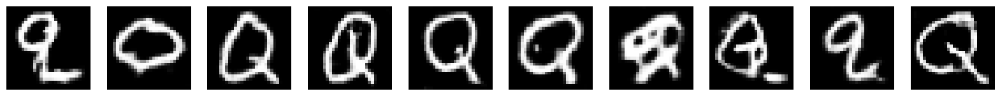

Epoch 300: D Accuracy = 0.6168
27/27 [==============================] - 1s 41ms/step - d_loss: 1.1972 - g_loss: 1.0505 - d_accuracy: 0.6862
Epoch 301/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2116 - g_loss: 1.0320 - d_accuracy: 0.6802
Epoch 302/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2019 - g_loss: 1.0587 - d_accuracy: 0.6781
Epoch 303/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.1978 - g_loss: 1.0426 - d_accuracy: 0.6838
Epoch 304/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2116 - g_loss: 1.0484 - d_accuracy: 0.6724
Epoch 305/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2039 - g_loss: 1.0385 - d_accuracy: 0.6845
Epoch 306/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1984 - g_loss: 1.0634 - d_accuracy: 0.6840
Epoch 307/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2115 - g_loss: 1.0424 - d_accuracy: 0.6748

27/27 [==============================] - 1s 36ms/step - d_loss: 1.1765 - g_loss: 1.0861 - d_accuracy: 0.6924
Epoch 333/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1928 - g_loss: 1.0588 - d_accuracy: 0.6852
Epoch 334/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1794 - g_loss: 1.0753 - d_accuracy: 0.6953
Epoch 335/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1833 - g_loss: 1.0786 - d_accuracy: 0.6918
Epoch 336/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1907 - g_loss: 1.0673 - d_accuracy: 0.6908
Epoch 337/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1736 - g_loss: 1.0851 - d_accuracy: 0.6954
Epoch 338/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1898 - g_loss: 1.0742 - d_accuracy: 0.6848
Epoch 339/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1862 - g_loss: 1.0772 - d_accuracy: 0.6955
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1555 - g_loss: 1.1094 - d_accuracy: 0.7084
Epoch 365/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1620 - g_loss: 1.1048 - d_accuracy: 0.7046
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1601 - g_loss: 1.1060 - d_accuracy: 0.7032
Epoch 367/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1897 - g_loss: 1.0712 - d_accuracy: 0.6912
Epoch 368/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.1773 - g_loss: 1.0993 - d_accuracy: 0.6967
Epoch 369/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1771 - g_loss: 1.0854 - d_accuracy: 0.6984
Epoch 370/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1653 - g_loss: 1.0969 - d_accuracy: 0.7067
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1699 - g_loss: 1.0905 - d_accuracy: 0.6957
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1522 - g_loss: 1.1248 - d_accuracy: 0.7148
Epoch 397/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1587 - g_loss: 1.1322 - d_accuracy: 0.7076
Epoch 398/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1479 - g_loss: 1.1209 - d_accuracy: 0.7137
Epoch 399/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1509 - g_loss: 1.1200 - d_accuracy: 0.7141
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1567 - g_loss: 1.1266 - d_accuracy: 0.7036
Class 12 — Epoch 400 preview:


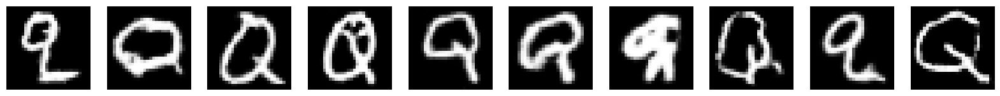

Epoch 400: D Accuracy = 0.7009
27/27 [==============================] - 1s 43ms/step - d_loss: 1.1584 - g_loss: 1.1206 - d_accuracy: 0.7035
Epoch 401/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1573 - g_loss: 1.1303 - d_accuracy: 0.7099
Epoch 402/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1439 - g_loss: 1.1293 - d_accuracy: 0.7170
Epoch 403/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1532 - g_loss: 1.1289 - d_accuracy: 0.7125
Epoch 404/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1658 - g_loss: 1.1294 - d_accuracy: 0.7011
Epoch 405/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1517 - g_loss: 1.1262 - d_accuracy: 0.7126
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1464 - g_loss: 1.1239 - d_accuracy: 0.7200
Epoch 407/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1632 - g_loss: 1.1176 - d_accuracy: 0.6976

27/27 [==============================] - 1s 37ms/step - d_loss: 1.1331 - g_loss: 1.1516 - d_accuracy: 0.7262
Epoch 433/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1479 - g_loss: 1.1561 - d_accuracy: 0.7118
Epoch 434/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1386 - g_loss: 1.1345 - d_accuracy: 0.7249
Epoch 435/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1467 - g_loss: 1.1347 - d_accuracy: 0.7203
Epoch 436/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1384 - g_loss: 1.1529 - d_accuracy: 0.7109
Epoch 437/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1376 - g_loss: 1.1402 - d_accuracy: 0.7213
Epoch 438/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1315 - g_loss: 1.1638 - d_accuracy: 0.7160
Epoch 439/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1386 - g_loss: 1.1547 - d_accuracy: 0.7225
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1125 - g_loss: 1.1870 - d_accuracy: 0.7291
Epoch 465/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1172 - g_loss: 1.1859 - d_accuracy: 0.7307
Epoch 466/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.1183 - g_loss: 1.1706 - d_accuracy: 0.7312
Epoch 467/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1116 - g_loss: 1.1931 - d_accuracy: 0.7313
Epoch 468/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1166 - g_loss: 1.1839 - d_accuracy: 0.7278
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1074 - g_loss: 1.1968 - d_accuracy: 0.7323
Epoch 470/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1025 - g_loss: 1.1918 - d_accuracy: 0.7408
Epoch 471/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1141 - g_loss: 1.2062 - d_accuracy: 0.7319
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.0981 - g_loss: 1.2148 - d_accuracy: 0.7390
Epoch 497/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1087 - g_loss: 1.1875 - d_accuracy: 0.7347
Epoch 498/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0978 - g_loss: 1.2133 - d_accuracy: 0.7383
Epoch 499/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.0888 - g_loss: 1.2167 - d_accuracy: 0.7444
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1102 - g_loss: 1.1990 - d_accuracy: 0.7359
Class 12 — Epoch 500 preview:


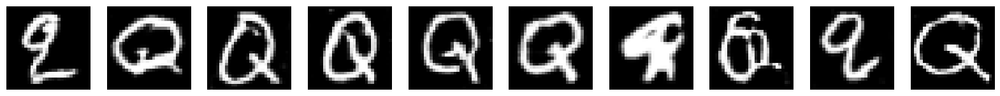

Epoch 500: D Accuracy = 0.7056
27/27 [==============================] - 1s 41ms/step - d_loss: 1.1116 - g_loss: 1.1956 - d_accuracy: 0.7348
Training DCGAN for class 13...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2273 - g_loss: 1.1243 - d_accuracy: 0.6962
Epoch 1: Generator loss improved from inf to 1.2622. Saving weights.
Epoch 1: D Accuracy = 0.7361
27/27 [==============================] - 2s 36ms/step - d_loss: 1.2241 - g_loss: 1.1292 - d_accuracy: 0.6977
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1116 - g_loss: 1.2835 - d_accuracy: 0.7558
Epoch 2: Generator loss improved from 1.2622 to 1.1683. Saving weights.
Epoch 2: D Accuracy = 0.7315
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1129 - g_loss: 1.2794 - d_accuracy: 0.7550
Epoch 3/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1852 - g_loss: 1.1683 - d_accuracy: 0.6987
Epoch 4/500
27/27 [==============================] - 1s 35m

27/27 [==============================] - 1s 37ms/step - d_loss: 1.1615 - g_loss: 1.1413 - d_accuracy: 0.7081
Epoch 30/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1486 - g_loss: 1.1910 - d_accuracy: 0.7101
Epoch 31/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.1275 - g_loss: 1.1954 - d_accuracy: 0.7338
Epoch 32/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1297 - g_loss: 1.2032 - d_accuracy: 0.7217
Epoch 33/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.1401 - g_loss: 1.2012 - d_accuracy: 0.7126
Epoch 34/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1420 - g_loss: 1.2119 - d_accuracy: 0.7165
Epoch 35/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.1835 - g_loss: 1.1553 - d_accuracy: 0.7049
Epoch 36/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1863 - g_loss: 1.1671 - d_accuracy: 0.6929
Epoch 37/500
27/27 [=================

Epoch 61/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2573 - g_loss: 1.0208 - d_accuracy: 0.6472
Epoch 62/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2536 - g_loss: 1.0201 - d_accuracy: 0.6492
Epoch 63/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2585 - g_loss: 1.0197 - d_accuracy: 0.6388
Epoch 64/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2543 - g_loss: 1.0169 - d_accuracy: 0.6427
Epoch 65/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2650 - g_loss: 1.0116 - d_accuracy: 0.6317
Epoch 66/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2614 - g_loss: 1.0079 - d_accuracy: 0.6394
Epoch 67/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2597 - g_loss: 1.0115 - d_accuracy: 0.6433
Epoch 68/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2634 - g_loss: 1.0053 - d_accuracy: 0.6430
Epoch 69/500
27/27 [====

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2897 - g_loss: 0.9589 - d_accuracy: 0.6216
Epoch 94/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3020 - g_loss: 0.9510 - d_accuracy: 0.6086
Epoch 94: Generator loss improved from 0.8504 to 0.8001. Saving weights.
Epoch 94: D Accuracy = 0.6667
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3016 - g_loss: 0.9457 - d_accuracy: 0.6107
Epoch 95/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3134 - g_loss: 0.9447 - d_accuracy: 0.5949
Epoch 96/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2955 - g_loss: 0.9511 - d_accuracy: 0.6140
Epoch 97/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3020 - g_loss: 0.9459 - d_accuracy: 0.6072
Epoch 98/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3048 - g_loss: 0.9386 - d_accuracy: 0.6038
Epoch 99/500
27/27 [==============================] - 1s 36ms/step - d_los

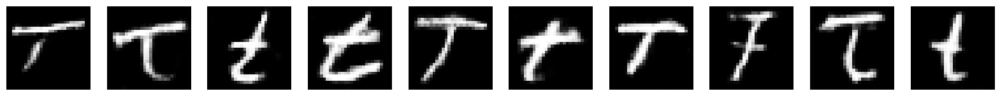

Epoch 100: D Accuracy = 0.5833
27/27 [==============================] - 1s 41ms/step - d_loss: 1.3075 - g_loss: 0.9407 - d_accuracy: 0.6024
Epoch 101/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3012 - g_loss: 0.9358 - d_accuracy: 0.6075
Epoch 102/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3082 - g_loss: 0.9382 - d_accuracy: 0.6048
Epoch 103/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3082 - g_loss: 0.9423 - d_accuracy: 0.6035
Epoch 104/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3062 - g_loss: 0.9406 - d_accuracy: 0.6055
Epoch 105/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3077 - g_loss: 0.9360 - d_accuracy: 0.6015
Epoch 106/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3087 - g_loss: 0.9369 - d_accuracy: 0.6167
Epoch 107/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3092 - g_loss: 0.9385 - d_accuracy: 0.6022

27/27 [==============================] - 1s 38ms/step - d_loss: 1.3286 - g_loss: 0.9078 - d_accuracy: 0.5837
Epoch 133/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3194 - g_loss: 0.9109 - d_accuracy: 0.5950
Epoch 134/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3242 - g_loss: 0.9110 - d_accuracy: 0.5868
Epoch 135/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3182 - g_loss: 0.9105 - d_accuracy: 0.5881
Epoch 136/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3210 - g_loss: 0.9103 - d_accuracy: 0.5886
Epoch 137/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3287 - g_loss: 0.9053 - d_accuracy: 0.5843
Epoch 138/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3163 - g_loss: 0.9098 - d_accuracy: 0.5929
Epoch 139/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3232 - g_loss: 0.9074 - d_accuracy: 0.5919
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3215 - g_loss: 0.9000 - d_accuracy: 0.5862
Epoch 165/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.3221 - g_loss: 0.9022 - d_accuracy: 0.5913
Epoch 166/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3245 - g_loss: 0.8956 - d_accuracy: 0.5850
Epoch 166: Generator loss improved from 0.8001 to 0.7939. Saving weights.
Epoch 166: D Accuracy = 0.5602
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3257 - g_loss: 0.8920 - d_accuracy: 0.5841
Epoch 167/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3327 - g_loss: 0.8953 - d_accuracy: 0.5786
Epoch 168/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3307 - g_loss: 0.8976 - d_accuracy: 0.5728
Epoch 169/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3200 - g_loss: 0.9012 - d_accuracy: 0.5794
Epoch 170/500
27/27 [==============================] 

27/27 [==============================] - 1s 34ms/step - d_loss: 1.3143 - g_loss: 0.9075 - d_accuracy: 0.5984
Epoch 196/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3183 - g_loss: 0.9037 - d_accuracy: 0.5936
Epoch 197/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3173 - g_loss: 0.9037 - d_accuracy: 0.5912
Epoch 198/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3170 - g_loss: 0.9062 - d_accuracy: 0.5918
Epoch 199/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.3172 - g_loss: 0.9027 - d_accuracy: 0.5953
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3194 - g_loss: 0.8963 - d_accuracy: 0.5923
Class 13 — Epoch 200 preview:


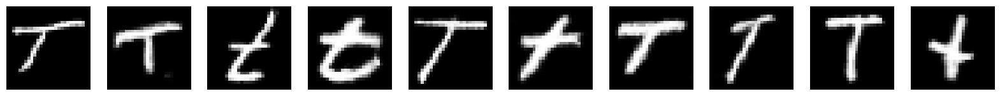

Epoch 200: D Accuracy = 0.5787
27/27 [==============================] - 1s 44ms/step - d_loss: 1.3202 - g_loss: 0.8948 - d_accuracy: 0.5918
Epoch 201/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3108 - g_loss: 0.9095 - d_accuracy: 0.6004
Epoch 202/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3264 - g_loss: 0.8942 - d_accuracy: 0.5843
Epoch 203/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3117 - g_loss: 0.9078 - d_accuracy: 0.5996
Epoch 204/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3232 - g_loss: 0.8928 - d_accuracy: 0.5877
Epoch 205/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3135 - g_loss: 0.9081 - d_accuracy: 0.5931
Epoch 206/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.3259 - g_loss: 0.8942 - d_accuracy: 0.5854
Epoch 207/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3173 - g_loss: 0.8991 - d_accuracy: 0.5938

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3188 - g_loss: 0.9098 - d_accuracy: 0.5977
Epoch 233/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3107 - g_loss: 0.8999 - d_accuracy: 0.5930
Epoch 234/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2966 - g_loss: 0.9166 - d_accuracy: 0.6042
Epoch 235/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3088 - g_loss: 0.9063 - d_accuracy: 0.5953
Epoch 236/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3069 - g_loss: 0.9109 - d_accuracy: 0.5947
Epoch 237/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3204 - g_loss: 0.9019 - d_accuracy: 0.5922
Epoch 238/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3022 - g_loss: 0.9123 - d_accuracy: 0.6060
Epoch 239/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3018 - g_loss: 0.9193 - d_accuracy: 0.6064
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.2951 - g_loss: 0.9299 - d_accuracy: 0.6107
Epoch 265/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3020 - g_loss: 0.9200 - d_accuracy: 0.6090
Epoch 266/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2972 - g_loss: 0.9202 - d_accuracy: 0.6091
Epoch 267/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2958 - g_loss: 0.9294 - d_accuracy: 0.6091
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2962 - g_loss: 0.9262 - d_accuracy: 0.6098
Epoch 269/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2998 - g_loss: 0.9184 - d_accuracy: 0.6103
Epoch 270/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2981 - g_loss: 0.9242 - d_accuracy: 0.6110
Epoch 271/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2915 - g_loss: 0.9202 - d_accuracy: 0.6187
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2780 - g_loss: 0.9363 - d_accuracy: 0.6345
Epoch 297/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2894 - g_loss: 0.9258 - d_accuracy: 0.6117
Epoch 298/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2687 - g_loss: 0.9420 - d_accuracy: 0.6368
Epoch 299/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.2852 - g_loss: 0.9356 - d_accuracy: 0.6280
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2806 - g_loss: 0.9397 - d_accuracy: 0.6249
Class 13 — Epoch 300 preview:


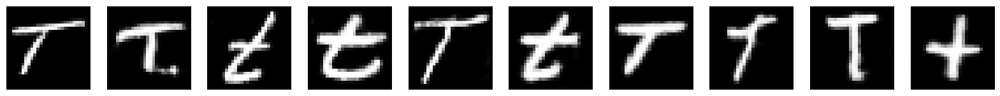

Epoch 300: D Accuracy = 0.6111
27/27 [==============================] - 1s 43ms/step - d_loss: 1.2821 - g_loss: 0.9402 - d_accuracy: 0.6244
Epoch 301/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2807 - g_loss: 0.9421 - d_accuracy: 0.6180
Epoch 302/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2735 - g_loss: 0.9430 - d_accuracy: 0.6317
Epoch 303/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2780 - g_loss: 0.9449 - d_accuracy: 0.6245
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2850 - g_loss: 0.9281 - d_accuracy: 0.6186
Epoch 305/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2936 - g_loss: 0.9275 - d_accuracy: 0.6113
Epoch 306/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2781 - g_loss: 0.9428 - d_accuracy: 0.6236
Epoch 307/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2813 - g_loss: 0.9318 - d_accuracy: 0.6216

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2699 - g_loss: 0.9523 - d_accuracy: 0.6275
Epoch 333/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2698 - g_loss: 0.9539 - d_accuracy: 0.6280
Epoch 334/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2654 - g_loss: 0.9552 - d_accuracy: 0.6319
Epoch 335/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.2595 - g_loss: 0.9604 - d_accuracy: 0.6408
Epoch 336/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2665 - g_loss: 0.9594 - d_accuracy: 0.6311
Epoch 337/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2631 - g_loss: 0.9530 - d_accuracy: 0.6374
Epoch 338/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2662 - g_loss: 0.9585 - d_accuracy: 0.6339
Epoch 339/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2683 - g_loss: 0.9528 - d_accuracy: 0.6326
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2660 - g_loss: 0.9597 - d_accuracy: 0.6302
Epoch 365/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2535 - g_loss: 0.9663 - d_accuracy: 0.6446
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2551 - g_loss: 0.9727 - d_accuracy: 0.6454
Epoch 367/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2530 - g_loss: 0.9739 - d_accuracy: 0.6407
Epoch 368/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2514 - g_loss: 0.9759 - d_accuracy: 0.6489
Epoch 369/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2586 - g_loss: 0.9676 - d_accuracy: 0.6425
Epoch 370/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2553 - g_loss: 0.9776 - d_accuracy: 0.6441
Epoch 371/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2477 - g_loss: 0.9755 - d_accuracy: 0.6518
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2311 - g_loss: 0.9965 - d_accuracy: 0.6598
Epoch 397/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2358 - g_loss: 0.9962 - d_accuracy: 0.6551
Epoch 398/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2364 - g_loss: 0.9953 - d_accuracy: 0.6614
Epoch 399/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2374 - g_loss: 0.9949 - d_accuracy: 0.6517
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2331 - g_loss: 0.9974 - d_accuracy: 0.6621
Class 13 — Epoch 400 preview:


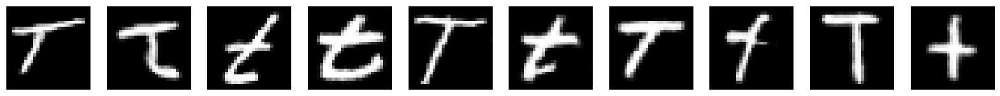

Epoch 400: D Accuracy = 0.6852
27/27 [==============================] - 1s 42ms/step - d_loss: 1.2318 - g_loss: 1.0009 - d_accuracy: 0.6629
Epoch 401/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2327 - g_loss: 0.9914 - d_accuracy: 0.6611
Epoch 402/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2349 - g_loss: 0.9904 - d_accuracy: 0.6587
Epoch 403/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2399 - g_loss: 0.9977 - d_accuracy: 0.6560
Epoch 404/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2402 - g_loss: 1.0001 - d_accuracy: 0.6546
Epoch 405/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2389 - g_loss: 0.9930 - d_accuracy: 0.6560
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2240 - g_loss: 1.0057 - d_accuracy: 0.6715
Epoch 407/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2401 - g_loss: 0.9988 - d_accuracy: 0.6542

27/27 [==============================] - 1s 36ms/step - d_loss: 1.2212 - g_loss: 1.0110 - d_accuracy: 0.6728
Epoch 433/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2152 - g_loss: 1.0244 - d_accuracy: 0.6702
Epoch 434/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2186 - g_loss: 1.0218 - d_accuracy: 0.6661
Epoch 435/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2032 - g_loss: 1.0239 - d_accuracy: 0.6835
Epoch 436/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2198 - g_loss: 1.0226 - d_accuracy: 0.6708
Epoch 437/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2323 - g_loss: 1.0008 - d_accuracy: 0.6577
Epoch 438/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2157 - g_loss: 1.0230 - d_accuracy: 0.6708
Epoch 439/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2194 - g_loss: 1.0151 - d_accuracy: 0.6704
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2010 - g_loss: 1.0423 - d_accuracy: 0.6850
Epoch 465/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2052 - g_loss: 1.0415 - d_accuracy: 0.6812
Epoch 466/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.1974 - g_loss: 1.0593 - d_accuracy: 0.6825
Epoch 467/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1917 - g_loss: 1.0532 - d_accuracy: 0.6884
Epoch 468/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2004 - g_loss: 1.0351 - d_accuracy: 0.6821
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1958 - g_loss: 1.0484 - d_accuracy: 0.6839
Epoch 470/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2018 - g_loss: 1.0509 - d_accuracy: 0.6788
Epoch 471/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2016 - g_loss: 1.0417 - d_accuracy: 0.6815
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.1855 - g_loss: 1.0561 - d_accuracy: 0.6890
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1909 - g_loss: 1.0591 - d_accuracy: 0.6801
Epoch 498/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1704 - g_loss: 1.0772 - d_accuracy: 0.7003
Epoch 499/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.1777 - g_loss: 1.0735 - d_accuracy: 0.6964
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.1864 - g_loss: 1.0650 - d_accuracy: 0.6926
Class 13 — Epoch 500 preview:


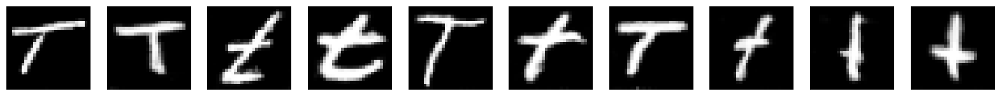

Epoch 500: D Accuracy = 0.7037
27/27 [==============================] - 1s 42ms/step - d_loss: 1.1846 - g_loss: 1.0698 - d_accuracy: 0.6930
Training DCGAN for class 14...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0247 - g_loss: 1.2530 - d_accuracy: 0.8006
Epoch 1: Generator loss improved from inf to 1.4580. Saving weights.
Epoch 1: D Accuracy = 0.8380
27/27 [==============================] - 2s 36ms/step - d_loss: 1.0208 - g_loss: 1.2603 - d_accuracy: 0.8019
Epoch 2/500
27/27 [==============================] - ETA: 0s - d_loss: 0.9580 - g_loss: 1.4406 - d_accuracy: 0.8387
Epoch 2: Generator loss improved from 1.4580 to 1.3067. Saving weights.
Epoch 2: D Accuracy = 0.7963
27/27 [==============================] - 1s 35ms/step - d_loss: 0.9596 - g_loss: 1.4358 - d_accuracy: 0.8372
Epoch 3/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.6687 - g_loss: 2.1243 - d_accuracy: 0.9293
Epoch 4/500
27/27 [==============================] - 1s 35m

27/27 [==============================] - 1s 37ms/step - d_loss: 1.3172 - g_loss: 0.8948 - d_accuracy: 0.5952
Epoch 30/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3127 - g_loss: 0.8923 - d_accuracy: 0.6097
Epoch 31/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3106 - g_loss: 0.8958 - d_accuracy: 0.6077
Epoch 32/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3051 - g_loss: 0.8986 - d_accuracy: 0.6102
Epoch 33/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3058 - g_loss: 0.9072 - d_accuracy: 0.6080
Epoch 34/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3038 - g_loss: 0.9162 - d_accuracy: 0.6058
Epoch 35/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2978 - g_loss: 0.9167 - d_accuracy: 0.6213
Epoch 36/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3053 - g_loss: 0.9155 - d_accuracy: 0.6062
Epoch 37/500
27/27 [=================

Epoch 61/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2857 - g_loss: 0.9409 - d_accuracy: 0.6226
Epoch 62/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2865 - g_loss: 0.9467 - d_accuracy: 0.6216
Epoch 63/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2698 - g_loss: 0.9498 - d_accuracy: 0.6389
Epoch 64/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2729 - g_loss: 0.9458 - d_accuracy: 0.6355
Epoch 65/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2800 - g_loss: 0.9413 - d_accuracy: 0.6284
Epoch 66/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2814 - g_loss: 0.9476 - d_accuracy: 0.6336
Epoch 67/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2829 - g_loss: 0.9422 - d_accuracy: 0.6309
Epoch 68/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2735 - g_loss: 0.9504 - d_accuracy: 0.6370
Epoch 69/500
27/27 [====

27/27 [==============================] - 1s 38ms/step - d_loss: 1.3229 - g_loss: 0.8976 - d_accuracy: 0.5903
Epoch 94/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3236 - g_loss: 0.8962 - d_accuracy: 0.5876
Epoch 95/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3341 - g_loss: 0.9006 - d_accuracy: 0.5861
Epoch 96/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3291 - g_loss: 0.8872 - d_accuracy: 0.5889
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3259 - g_loss: 0.8927 - d_accuracy: 0.5979
Epoch 98/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3279 - g_loss: 0.8916 - d_accuracy: 0.5948
Epoch 99/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3212 - g_loss: 0.8866 - d_accuracy: 0.5913
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3315 - g_loss: 0.8853 - d_accuracy: 0.5795
Class 14 — Epoch 100 preview:


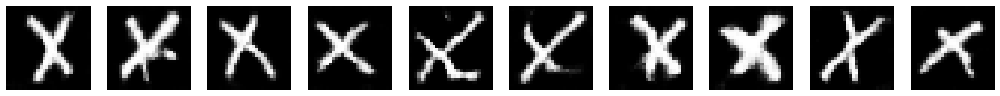

Epoch 100: D Accuracy = 0.5694
27/27 [==============================] - 1s 44ms/step - d_loss: 1.3319 - g_loss: 0.8835 - d_accuracy: 0.5792
Epoch 101/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3303 - g_loss: 0.8910 - d_accuracy: 0.5887
Epoch 102/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3322 - g_loss: 0.8837 - d_accuracy: 0.5836
Epoch 103/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3354 - g_loss: 0.8919 - d_accuracy: 0.5867
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3221 - g_loss: 0.8931 - d_accuracy: 0.5849
Epoch 105/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3365 - g_loss: 0.8827 - d_accuracy: 0.5829
Epoch 106/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3331 - g_loss: 0.8827 - d_accuracy: 0.5797
Epoch 107/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3320 - g_loss: 0.8826 - d_accuracy: 0.5822

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3374 - g_loss: 0.8715 - d_accuracy: 0.5721
Epoch 133/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3394 - g_loss: 0.8659 - d_accuracy: 0.5685
Epoch 134/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3467 - g_loss: 0.8618 - d_accuracy: 0.5646
Epoch 135/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3395 - g_loss: 0.8667 - d_accuracy: 0.5699
Epoch 136/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3422 - g_loss: 0.8641 - d_accuracy: 0.5679
Epoch 137/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3418 - g_loss: 0.8680 - d_accuracy: 0.5596
Epoch 138/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3376 - g_loss: 0.8694 - d_accuracy: 0.5710
Epoch 139/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3410 - g_loss: 0.8640 - d_accuracy: 0.5641
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3338 - g_loss: 0.8695 - d_accuracy: 0.5724
Epoch 165/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3434 - g_loss: 0.8624 - d_accuracy: 0.5675
Epoch 166/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3457 - g_loss: 0.8591 - d_accuracy: 0.5642
Epoch 167/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3390 - g_loss: 0.8662 - d_accuracy: 0.5617
Epoch 168/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3344 - g_loss: 0.8690 - d_accuracy: 0.5752
Epoch 169/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3434 - g_loss: 0.8589 - d_accuracy: 0.5636
Epoch 170/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3412 - g_loss: 0.8577 - d_accuracy: 0.5635
Epoch 171/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3346 - g_loss: 0.8642 - d_accuracy: 0.5692
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3343 - g_loss: 0.8659 - d_accuracy: 0.5695
Epoch 197/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3374 - g_loss: 0.8630 - d_accuracy: 0.5652
Epoch 198/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3363 - g_loss: 0.8629 - d_accuracy: 0.5722
Epoch 199/500
27/27 [==============================] - 1s 40ms/step - d_loss: 1.3396 - g_loss: 0.8600 - d_accuracy: 0.5742
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3315 - g_loss: 0.8629 - d_accuracy: 0.5739
Class 14 — Epoch 200 preview:


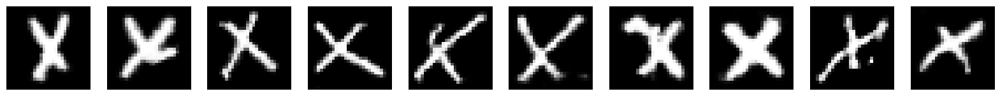

Epoch 200: D Accuracy = 0.5370
27/27 [==============================] - 1s 43ms/step - d_loss: 1.3320 - g_loss: 0.8641 - d_accuracy: 0.5725
Epoch 201/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3329 - g_loss: 0.8671 - d_accuracy: 0.5667
Epoch 202/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3333 - g_loss: 0.8637 - d_accuracy: 0.5755
Epoch 203/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3351 - g_loss: 0.8635 - d_accuracy: 0.5759
Epoch 204/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3384 - g_loss: 0.8619 - d_accuracy: 0.5627
Epoch 205/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3364 - g_loss: 0.8593 - d_accuracy: 0.5670
Epoch 206/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3363 - g_loss: 0.8654 - d_accuracy: 0.5687
Epoch 207/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3379 - g_loss: 0.8578 - d_accuracy: 0.5634

27/27 [==============================] - 1s 36ms/step - d_loss: 1.3232 - g_loss: 0.8774 - d_accuracy: 0.5709
Epoch 233/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3234 - g_loss: 0.8726 - d_accuracy: 0.5858
Epoch 234/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3360 - g_loss: 0.8631 - d_accuracy: 0.5635
Epoch 235/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3320 - g_loss: 0.8673 - d_accuracy: 0.5691
Epoch 236/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3333 - g_loss: 0.8677 - d_accuracy: 0.5712
Epoch 237/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3272 - g_loss: 0.8668 - d_accuracy: 0.5752
Epoch 238/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3309 - g_loss: 0.8678 - d_accuracy: 0.5702
Epoch 239/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3293 - g_loss: 0.8667 - d_accuracy: 0.5796
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3143 - g_loss: 0.8778 - d_accuracy: 0.5888
Epoch 265/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3231 - g_loss: 0.8749 - d_accuracy: 0.5843
Epoch 266/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3205 - g_loss: 0.8812 - d_accuracy: 0.5799
Epoch 267/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3216 - g_loss: 0.8758 - d_accuracy: 0.5828
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3218 - g_loss: 0.8756 - d_accuracy: 0.5783
Epoch 269/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3233 - g_loss: 0.8766 - d_accuracy: 0.5813
Epoch 270/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3245 - g_loss: 0.8759 - d_accuracy: 0.5775
Epoch 271/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3166 - g_loss: 0.8808 - d_accuracy: 0.5851
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3160 - g_loss: 0.8824 - d_accuracy: 0.5834
Epoch 297/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3115 - g_loss: 0.8872 - d_accuracy: 0.5850
Epoch 298/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3150 - g_loss: 0.8885 - d_accuracy: 0.5835
Epoch 299/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.3125 - g_loss: 0.8868 - d_accuracy: 0.5885
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3065 - g_loss: 0.8919 - d_accuracy: 0.5918
Class 14 — Epoch 300 preview:


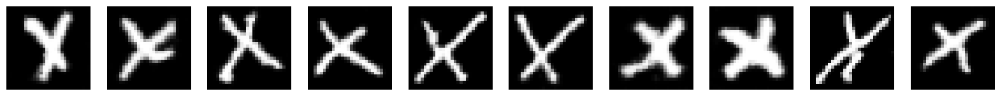

Epoch 300: D Accuracy = 0.6296
27/27 [==============================] - 1s 45ms/step - d_loss: 1.3059 - g_loss: 0.8925 - d_accuracy: 0.5931
Epoch 301/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3137 - g_loss: 0.8874 - d_accuracy: 0.5867
Epoch 302/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3128 - g_loss: 0.8883 - d_accuracy: 0.5871
Epoch 303/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3079 - g_loss: 0.8907 - d_accuracy: 0.5942
Epoch 304/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3085 - g_loss: 0.8927 - d_accuracy: 0.5911
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3030 - g_loss: 0.8952 - d_accuracy: 0.5972
Epoch 306/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3045 - g_loss: 0.8942 - d_accuracy: 0.6008
Epoch 307/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3104 - g_loss: 0.8920 - d_accuracy: 0.5898

27/27 [==============================] - 1s 35ms/step - d_loss: 1.2985 - g_loss: 0.9049 - d_accuracy: 0.6005
Epoch 333/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2935 - g_loss: 0.9060 - d_accuracy: 0.6034
Epoch 334/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3022 - g_loss: 0.8987 - d_accuracy: 0.5976
Epoch 335/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2979 - g_loss: 0.8981 - d_accuracy: 0.6034
Epoch 336/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2908 - g_loss: 0.9140 - d_accuracy: 0.6080
Epoch 337/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2867 - g_loss: 0.9125 - d_accuracy: 0.6135
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2882 - g_loss: 0.9144 - d_accuracy: 0.6117
Epoch 339/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2969 - g_loss: 0.9091 - d_accuracy: 0.6056
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2758 - g_loss: 0.9290 - d_accuracy: 0.6198
Epoch 365/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2846 - g_loss: 0.9221 - d_accuracy: 0.6157
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2799 - g_loss: 0.9185 - d_accuracy: 0.6165
Epoch 367/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2821 - g_loss: 0.9301 - d_accuracy: 0.6149
Epoch 368/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2812 - g_loss: 0.9192 - d_accuracy: 0.6183
Epoch 369/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2793 - g_loss: 0.9240 - d_accuracy: 0.6179
Epoch 370/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2883 - g_loss: 0.9218 - d_accuracy: 0.6104
Epoch 371/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2729 - g_loss: 0.9284 - d_accuracy: 0.6285
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2612 - g_loss: 0.9456 - d_accuracy: 0.6302
Epoch 397/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2708 - g_loss: 0.9458 - d_accuracy: 0.6235
Epoch 398/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2659 - g_loss: 0.9486 - d_accuracy: 0.6262
Epoch 399/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2712 - g_loss: 0.9298 - d_accuracy: 0.6283
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2619 - g_loss: 0.9464 - d_accuracy: 0.6314
Class 14 — Epoch 400 preview:


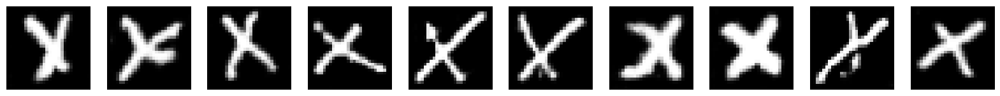

Epoch 400: D Accuracy = 0.6852
27/27 [==============================] - 1s 43ms/step - d_loss: 1.2607 - g_loss: 0.9465 - d_accuracy: 0.6333
Epoch 401/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2628 - g_loss: 0.9461 - d_accuracy: 0.6383
Epoch 402/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2682 - g_loss: 0.9434 - d_accuracy: 0.6271
Epoch 403/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2641 - g_loss: 0.9487 - d_accuracy: 0.6300
Epoch 404/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2619 - g_loss: 0.9485 - d_accuracy: 0.6364
Epoch 405/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2607 - g_loss: 0.9489 - d_accuracy: 0.6314
Epoch 406/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2569 - g_loss: 0.9509 - d_accuracy: 0.6373
Epoch 407/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2706 - g_loss: 0.9497 - d_accuracy: 0.6251

27/27 [==============================] - 1s 36ms/step - d_loss: 1.2385 - g_loss: 0.9727 - d_accuracy: 0.6548
Epoch 433/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2509 - g_loss: 0.9645 - d_accuracy: 0.6453
Epoch 434/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2486 - g_loss: 0.9609 - d_accuracy: 0.6466
Epoch 435/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2493 - g_loss: 0.9604 - d_accuracy: 0.6374
Epoch 436/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2446 - g_loss: 0.9744 - d_accuracy: 0.6500
Epoch 437/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2487 - g_loss: 0.9669 - d_accuracy: 0.6339
Epoch 438/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2475 - g_loss: 0.9662 - d_accuracy: 0.6438
Epoch 439/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2516 - g_loss: 0.9633 - d_accuracy: 0.6372
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2317 - g_loss: 0.9810 - d_accuracy: 0.6609
Epoch 465/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2328 - g_loss: 0.9871 - d_accuracy: 0.6643
Epoch 466/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2333 - g_loss: 0.9853 - d_accuracy: 0.6578
Epoch 467/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2341 - g_loss: 0.9883 - d_accuracy: 0.6576
Epoch 468/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2269 - g_loss: 0.9888 - d_accuracy: 0.6558
Epoch 469/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2284 - g_loss: 0.9887 - d_accuracy: 0.6538
Epoch 470/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2244 - g_loss: 0.9961 - d_accuracy: 0.6660
Epoch 471/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2146 - g_loss: 1.0094 - d_accuracy: 0.6704
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2042 - g_loss: 1.0220 - d_accuracy: 0.6761
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2118 - g_loss: 1.0202 - d_accuracy: 0.6665
Epoch 498/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2118 - g_loss: 1.0171 - d_accuracy: 0.6656
Epoch 499/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2097 - g_loss: 1.0214 - d_accuracy: 0.6670
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2150 - g_loss: 1.0139 - d_accuracy: 0.6622
Class 14 — Epoch 500 preview:


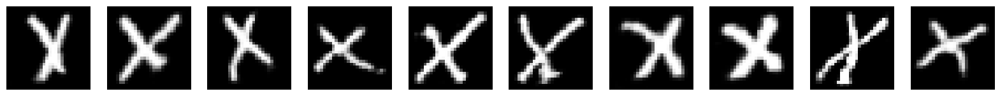

Epoch 500: D Accuracy = 0.6204
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2157 - g_loss: 1.0162 - d_accuracy: 0.6607
Training DCGAN for class 15...
Epoch 1/500
27/27 [==============================] - ETA: 0s - d_loss: 1.0354 - g_loss: 1.2422 - d_accuracy: 0.7901
Epoch 1: Generator loss improved from inf to 1.5169. Saving weights.
Epoch 1: D Accuracy = 0.8367
27/27 [==============================] - 2s 36ms/step - d_loss: 1.0315 - g_loss: 1.2520 - d_accuracy: 0.7918
Epoch 2/500
27/27 [==============================] - 1s 34ms/step - d_loss: 0.9469 - g_loss: 1.5633 - d_accuracy: 0.8292
Epoch 3/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.6853 - g_loss: 2.0867 - d_accuracy: 0.9242
Epoch 4/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.4810 - g_loss: 3.0899 - d_accuracy: 0.9774
Epoch 5/500
27/27 [==============================] - 1s 35ms/step - d_loss: 0.4717 - g_loss: 3.4875 - d_accuracy: 0.9703
Epoch 6/500
27/27 [===

Epoch 30/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2765 - g_loss: 1.0023 - d_accuracy: 0.6325
Epoch 31/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2889 - g_loss: 0.9989 - d_accuracy: 0.6298
Epoch 32/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2870 - g_loss: 0.9894 - d_accuracy: 0.6268
Epoch 33/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2610 - g_loss: 1.0024 - d_accuracy: 0.6494
Epoch 34/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2684 - g_loss: 0.9985 - d_accuracy: 0.6381
Epoch 35/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2675 - g_loss: 1.0085 - d_accuracy: 0.6398
Epoch 36/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2591 - g_loss: 1.0024 - d_accuracy: 0.6488
Epoch 37/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2646 - g_loss: 1.0035 - d_accuracy: 0.6490
Epoch 38/500
27/27 [====

Epoch 62/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2879 - g_loss: 0.9804 - d_accuracy: 0.6242
Epoch 63/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2894 - g_loss: 0.9743 - d_accuracy: 0.6168
Epoch 64/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2899 - g_loss: 0.9723 - d_accuracy: 0.6207
Epoch 65/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2997 - g_loss: 0.9640 - d_accuracy: 0.6231
Epoch 66/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3016 - g_loss: 0.9672 - d_accuracy: 0.6151
Epoch 67/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3012 - g_loss: 0.9556 - d_accuracy: 0.6174
Epoch 67: Generator loss improved from 0.8377 to 0.8326. Saving weights.
Epoch 67: D Accuracy = 0.6429
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3017 - g_loss: 0.9512 - d_accuracy: 0.6183
Epoch 68/500
27/27 [==============================] - ETA: 0s

27/27 [==============================] - 1s 35ms/step - d_loss: 1.3445 - g_loss: 0.8860 - d_accuracy: 0.5669
Epoch 94/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3336 - g_loss: 0.8923 - d_accuracy: 0.5812
Epoch 95/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.3577 - g_loss: 0.8761 - d_accuracy: 0.5593
Epoch 96/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3475 - g_loss: 0.8771 - d_accuracy: 0.5663
Epoch 97/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3532 - g_loss: 0.8777 - d_accuracy: 0.5511
Epoch 98/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3545 - g_loss: 0.8688 - d_accuracy: 0.5602
Epoch 99/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3533 - g_loss: 0.8717 - d_accuracy: 0.5640
Epoch 100/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3532 - g_loss: 0.8737 - d_accuracy: 0.5631
Class 15 — Epoch 100 preview:


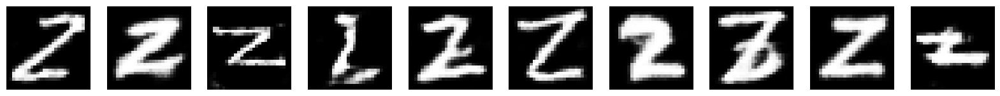

Epoch 100: D Accuracy = 0.4847
27/27 [==============================] - 1s 41ms/step - d_loss: 1.3562 - g_loss: 0.8718 - d_accuracy: 0.5603
Epoch 101/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3469 - g_loss: 0.8785 - d_accuracy: 0.5641
Epoch 102/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3401 - g_loss: 0.8756 - d_accuracy: 0.5749
Epoch 103/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3474 - g_loss: 0.8715 - d_accuracy: 0.5699
Epoch 104/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3453 - g_loss: 0.8793 - d_accuracy: 0.5750
Epoch 105/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3489 - g_loss: 0.8739 - d_accuracy: 0.5665
Epoch 106/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3496 - g_loss: 0.8771 - d_accuracy: 0.5584
Epoch 107/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3423 - g_loss: 0.8735 - d_accuracy: 0.5691

27/27 [==============================] - 1s 37ms/step - d_loss: 1.3425 - g_loss: 0.8742 - d_accuracy: 0.5667
Epoch 133/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3557 - g_loss: 0.8628 - d_accuracy: 0.5541
Epoch 134/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3529 - g_loss: 0.8593 - d_accuracy: 0.5541
Epoch 135/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3465 - g_loss: 0.8625 - d_accuracy: 0.5629
Epoch 136/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3474 - g_loss: 0.8655 - d_accuracy: 0.5640
Epoch 137/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3509 - g_loss: 0.8651 - d_accuracy: 0.5639
Epoch 138/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3436 - g_loss: 0.8632 - d_accuracy: 0.5643
Epoch 139/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3502 - g_loss: 0.8617 - d_accuracy: 0.5619
Epoch 140/500
27/27 [=========

Epoch 164/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3346 - g_loss: 0.8708 - d_accuracy: 0.5746
Epoch 165/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3450 - g_loss: 0.8646 - d_accuracy: 0.5616
Epoch 166/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3470 - g_loss: 0.8608 - d_accuracy: 0.5580
Epoch 167/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3437 - g_loss: 0.8566 - d_accuracy: 0.5643
Epoch 168/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3443 - g_loss: 0.8648 - d_accuracy: 0.5642
Epoch 169/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3450 - g_loss: 0.8680 - d_accuracy: 0.5673
Epoch 170/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3517 - g_loss: 0.8571 - d_accuracy: 0.5585
Epoch 171/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3497 - g_loss: 0.8572 - d_accuracy: 0.5596
Epoch 172/500
27

Epoch 196/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3339 - g_loss: 0.8672 - d_accuracy: 0.5739
Epoch 197/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3417 - g_loss: 0.8689 - d_accuracy: 0.5649
Epoch 198/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3377 - g_loss: 0.8727 - d_accuracy: 0.5730
Epoch 199/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3448 - g_loss: 0.8649 - d_accuracy: 0.5639
Epoch 200/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3361 - g_loss: 0.8691 - d_accuracy: 0.5735
Class 15 — Epoch 200 preview:


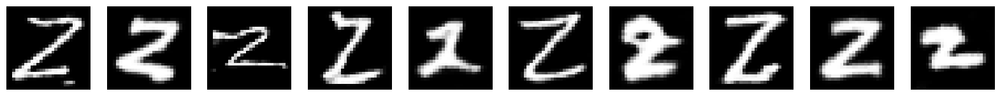

Epoch 200: D Accuracy = 0.5867
27/27 [==============================] - 1s 41ms/step - d_loss: 1.3354 - g_loss: 0.8691 - d_accuracy: 0.5740
Epoch 201/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3404 - g_loss: 0.8693 - d_accuracy: 0.5673
Epoch 202/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3339 - g_loss: 0.8686 - d_accuracy: 0.5743
Epoch 203/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3406 - g_loss: 0.8650 - d_accuracy: 0.5687
Epoch 204/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3387 - g_loss: 0.8708 - d_accuracy: 0.5696
Epoch 205/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3334 - g_loss: 0.8718 - d_accuracy: 0.5720
Epoch 206/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3403 - g_loss: 0.8615 - d_accuracy: 0.5642
Epoch 207/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3355 - g_loss: 0.8724 - d_accuracy: 0.5806

27/27 [==============================] - 1s 37ms/step - d_loss: 1.3256 - g_loss: 0.8809 - d_accuracy: 0.5828
Epoch 233/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3293 - g_loss: 0.8769 - d_accuracy: 0.5844
Epoch 234/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3358 - g_loss: 0.8723 - d_accuracy: 0.5683
Epoch 235/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3390 - g_loss: 0.8680 - d_accuracy: 0.5658
Epoch 236/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3242 - g_loss: 0.8802 - d_accuracy: 0.5837
Epoch 237/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3274 - g_loss: 0.8738 - d_accuracy: 0.5807
Epoch 238/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3291 - g_loss: 0.8785 - d_accuracy: 0.5791
Epoch 239/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3265 - g_loss: 0.8776 - d_accuracy: 0.5824
Epoch 240/500
27/27 [=========

Epoch 264/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3159 - g_loss: 0.8843 - d_accuracy: 0.5892
Epoch 265/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3154 - g_loss: 0.8873 - d_accuracy: 0.5996
Epoch 266/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3151 - g_loss: 0.8852 - d_accuracy: 0.5913
Epoch 267/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.3176 - g_loss: 0.8857 - d_accuracy: 0.5832
Epoch 268/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3268 - g_loss: 0.8825 - d_accuracy: 0.5819
Epoch 269/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3194 - g_loss: 0.8859 - d_accuracy: 0.5818
Epoch 270/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3211 - g_loss: 0.8812 - d_accuracy: 0.5828
Epoch 271/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3188 - g_loss: 0.8906 - d_accuracy: 0.5900
Epoch 272/500
27

Epoch 296/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3068 - g_loss: 0.8931 - d_accuracy: 0.5988
Epoch 297/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3234 - g_loss: 0.8883 - d_accuracy: 0.5840
Epoch 298/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3042 - g_loss: 0.8995 - d_accuracy: 0.5931
Epoch 299/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3113 - g_loss: 0.8973 - d_accuracy: 0.5901
Epoch 300/500
27/27 [==============================] - ETA: 0s - d_loss: 1.3118 - g_loss: 0.8909 - d_accuracy: 0.5934
Class 15 — Epoch 300 preview:


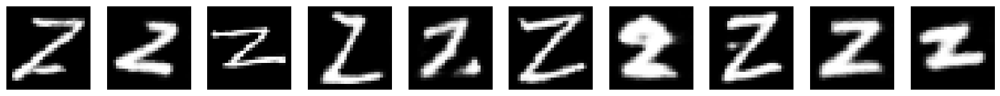

Epoch 300: D Accuracy = 0.5561
27/27 [==============================] - 1s 43ms/step - d_loss: 1.3120 - g_loss: 0.8921 - d_accuracy: 0.5920
Epoch 301/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3060 - g_loss: 0.8949 - d_accuracy: 0.5991
Epoch 302/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3104 - g_loss: 0.8926 - d_accuracy: 0.5980
Epoch 303/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3018 - g_loss: 0.9021 - d_accuracy: 0.6013
Epoch 304/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3102 - g_loss: 0.8913 - d_accuracy: 0.5973
Epoch 305/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3102 - g_loss: 0.8992 - d_accuracy: 0.5928
Epoch 306/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3091 - g_loss: 0.8974 - d_accuracy: 0.5982
Epoch 307/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.3068 - g_loss: 0.8930 - d_accuracy: 0.5997

27/27 [==============================] - 1s 36ms/step - d_loss: 1.2921 - g_loss: 0.9076 - d_accuracy: 0.6104
Epoch 333/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.3026 - g_loss: 0.9053 - d_accuracy: 0.6036
Epoch 334/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2919 - g_loss: 0.9068 - d_accuracy: 0.6096
Epoch 335/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.3027 - g_loss: 0.9091 - d_accuracy: 0.5938
Epoch 336/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.3068 - g_loss: 0.9002 - d_accuracy: 0.5952
Epoch 337/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2888 - g_loss: 0.9141 - d_accuracy: 0.6070
Epoch 338/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2887 - g_loss: 0.9114 - d_accuracy: 0.6172
Epoch 339/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2987 - g_loss: 0.9150 - d_accuracy: 0.5996
Epoch 340/500
27/27 [=========

Epoch 364/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2904 - g_loss: 0.9212 - d_accuracy: 0.6154
Epoch 365/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2827 - g_loss: 0.9206 - d_accuracy: 0.6140
Epoch 366/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2833 - g_loss: 0.9302 - d_accuracy: 0.6227
Epoch 367/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2804 - g_loss: 0.9227 - d_accuracy: 0.6238
Epoch 368/500
27/27 [==============================] - 1s 38ms/step - d_loss: 1.2803 - g_loss: 0.9268 - d_accuracy: 0.6227
Epoch 369/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2871 - g_loss: 0.9210 - d_accuracy: 0.6138
Epoch 370/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2909 - g_loss: 0.9177 - d_accuracy: 0.6135
Epoch 371/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2881 - g_loss: 0.9237 - d_accuracy: 0.6167
Epoch 372/500
27

Epoch 396/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2716 - g_loss: 0.9384 - d_accuracy: 0.6285
Epoch 397/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2713 - g_loss: 0.9422 - d_accuracy: 0.6233
Epoch 398/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2775 - g_loss: 0.9338 - d_accuracy: 0.6192
Epoch 399/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2709 - g_loss: 0.9338 - d_accuracy: 0.6324
Epoch 400/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2702 - g_loss: 0.9417 - d_accuracy: 0.6341
Class 15 — Epoch 400 preview:


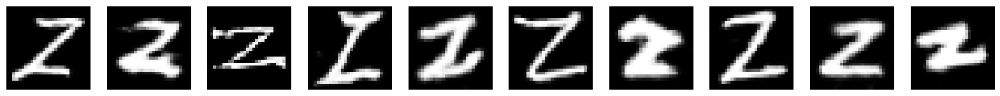

Epoch 400: D Accuracy = 0.6122
27/27 [==============================] - 1s 41ms/step - d_loss: 1.2714 - g_loss: 0.9453 - d_accuracy: 0.6333
Epoch 401/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2742 - g_loss: 0.9333 - d_accuracy: 0.6299
Epoch 402/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2660 - g_loss: 0.9527 - d_accuracy: 0.6317
Epoch 403/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2702 - g_loss: 0.9379 - d_accuracy: 0.6285
Epoch 404/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2567 - g_loss: 0.9471 - d_accuracy: 0.6383
Epoch 405/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2685 - g_loss: 0.9422 - d_accuracy: 0.6326
Epoch 406/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2720 - g_loss: 0.9450 - d_accuracy: 0.6244
Epoch 407/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2683 - g_loss: 0.9441 - d_accuracy: 0.6294

27/27 [==============================] - 1s 38ms/step - d_loss: 1.2556 - g_loss: 0.9617 - d_accuracy: 0.6362
Epoch 433/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2546 - g_loss: 0.9626 - d_accuracy: 0.6408
Epoch 434/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2565 - g_loss: 0.9593 - d_accuracy: 0.6342
Epoch 435/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2554 - g_loss: 0.9576 - d_accuracy: 0.6434
Epoch 436/500
27/27 [==============================] - 1s 34ms/step - d_loss: 1.2562 - g_loss: 0.9613 - d_accuracy: 0.6416
Epoch 437/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2575 - g_loss: 0.9563 - d_accuracy: 0.6404
Epoch 438/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2518 - g_loss: 0.9634 - d_accuracy: 0.6376
Epoch 439/500
27/27 [==============================] - 1s 39ms/step - d_loss: 1.2571 - g_loss: 0.9615 - d_accuracy: 0.6343
Epoch 440/500
27/27 [=========

Epoch 464/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2276 - g_loss: 0.9909 - d_accuracy: 0.6611
Epoch 465/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2411 - g_loss: 0.9840 - d_accuracy: 0.6465
Epoch 466/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2401 - g_loss: 0.9787 - d_accuracy: 0.6480
Epoch 467/500
27/27 [==============================] - 1s 37ms/step - d_loss: 1.2381 - g_loss: 0.9845 - d_accuracy: 0.6541
Epoch 468/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2304 - g_loss: 0.9834 - d_accuracy: 0.6614
Epoch 469/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2339 - g_loss: 0.9859 - d_accuracy: 0.6535
Epoch 470/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2382 - g_loss: 0.9885 - d_accuracy: 0.6506
Epoch 471/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2367 - g_loss: 0.9834 - d_accuracy: 0.6579
Epoch 472/500
27

Epoch 496/500
27/27 [==============================] - 1s 36ms/step - d_loss: 1.2224 - g_loss: 1.0027 - d_accuracy: 0.6656
Epoch 497/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2212 - g_loss: 0.9944 - d_accuracy: 0.6724
Epoch 498/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2276 - g_loss: 1.0129 - d_accuracy: 0.6534
Epoch 499/500
27/27 [==============================] - 1s 35ms/step - d_loss: 1.2237 - g_loss: 0.9915 - d_accuracy: 0.6645
Epoch 500/500
27/27 [==============================] - ETA: 0s - d_loss: 1.2279 - g_loss: 1.0020 - d_accuracy: 0.6645
Class 15 — Epoch 500 preview:


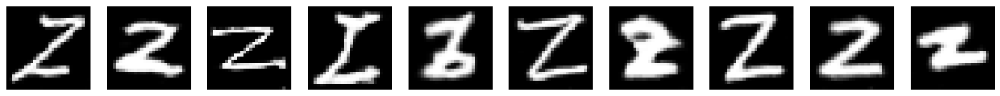

Epoch 500: D Accuracy = 0.6378
27/27 [==============================] - 1s 42ms/step - d_loss: 1.2274 - g_loss: 1.0086 - d_accuracy: 0.6636
Saved final generator weights for class 0 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_0.h5
Saved final generator weights for class 1 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_1.h5
Saved final generator weights for class 2 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_2.h5
Saved final generator weights for class 3 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_3.h5
Saved final generator weights for class 4 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_4.h5
Saved final generator weights for class 5 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_5.h5
Saved final generator weights for class 6 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_6.h5
Saved final generator weights for class 7

In [128]:
# === Training ===

dcgan_models = {}
histories = {}

# Directory to save best weights
best_save_dir = "(2)16Models_saved_generators_epochs"
os.makedirs(best_save_dir, exist_ok=True)

for c in range(num_classes):
    print(f"Training DCGAN for class {c}...")

    generator = build_generator(latent_dim, channels=1)
    discriminator = build_discriminator(img_shape)

    dcgan = DCGANModel(generator, discriminator, latent_dim)
    dcgan.compile(
            g_optimizer=Adam(0.0002, beta_1=0.5),   # faster
            d_optimizer=Adam(0.00005, beta_1=0.5)   # slower
        )


    preview_callback = PrintImagesEveryN(class_index=c, latent_dim=latent_dim, interval=100)
    best_weight_path = os.path.join(best_save_dir, f"(2)best_generator_class_{c}.h5")
    save_best_callback = SaveBestGenerator(save_path=best_weight_path)
    accuracy_callback = PrintAccuracy()  

    history = dcgan.fit(
        class_datasets[c],
        epochs=epochs,
        callbacks=[preview_callback, save_best_callback, accuracy_callback]
    )

    dcgan_models[c] = dcgan
    histories[c] = history

# === Save final generator weights for all 16 classes ===
final_save_dir = "(2)16Models_saved_generators_epochs(last)"
os.makedirs(final_save_dir, exist_ok=True)

for class_idx, dcgan in dcgan_models.items():
    gen = dcgan.generator
    weight_path = os.path.join(final_save_dir, f"(2)final_generator_class_{class_idx}.h5")
    gen.save_weights(weight_path)
    print(f"Saved final generator weights for class {class_idx} to {weight_path}")




In [129]:
# === Final Save and Grid ===
def generate_and_save_grid_only(weights_dir, latent_dim=128, images_per_class=10, save_dir="(2)Generated_Grid_160_Final"):
    os.makedirs(save_dir, exist_ok=True)
    all_images = []

    num_classes = 16  # You can change if needed

    for class_idx in range(num_classes):
        print(f"Loading generator weights for class {class_idx}...")

        # Rebuild the generator and load its weights
        generator = build_generator(latent_dim, channels=1)
        weight_path = os.path.join(weights_dir, f"(2)final_generator_class_{class_idx}.h5")
        generator.load_weights(weight_path)

        # Generate images
        noise = np.random.normal(0, 1, (images_per_class, latent_dim))
        generated_images = generator.predict(noise)
        generated_images = 0.5 * generated_images + 0.5  # Rescale to [0,1]

        for i in range(images_per_class):
            img = generated_images[i, :, :, 0]
            all_images.append(img)

    # Save a grid of all generated images
    fig, axes = plt.subplots(num_classes, images_per_class, figsize=(images_per_class, num_classes))
    fig.suptitle("DCGAN Generated Grid (Final or Best Weights)", fontsize=16)

    for i, ax in enumerate(axes.flat):
        ax.imshow(all_images[i], cmap='gray')
        ax.axis('off')

    grid_path = os.path.join(save_dir, "(2)new_grid_160images.png")
    plt.tight_layout()
    plt.savefig(grid_path)
    plt.show()

    print(f"Grid of 160 images saved at: {grid_path}")


def plot_loss_history(histories):
    for class_idx, history in histories.items():
        g_loss = history.history['g_loss']
        d_loss = history.history['d_loss']
        d_acc = history.history.get('d_accuracy', None)
        epochs_range = range(1, len(g_loss) + 1)

        plt.figure(figsize=(12, 4))

        plt.subplot(1, 2, 1)
        plt.plot(epochs_range, d_loss, label="Discriminator Loss")
        plt.plot(epochs_range, g_loss, label="Generator Loss")
        plt.title(f"Loss — Class {class_idx}")
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid(True)

        if d_acc is not None:
            plt.subplot(1, 2, 2)
            plt.plot(epochs_range, d_acc, label="Discriminator Accuracy", color='green')
            plt.title(f"Discriminator Accuracy — Class {class_idx}")
            plt.xlabel("Epochs")
            plt.ylabel("Accuracy")
            plt.grid(True)
            plt.legend()

        plt.tight_layout()
        plt.show()

        
for class_idx, dcgan in dcgan_models.items():
    gen = dcgan.generator
    weight_path = os.path.join(final_save_dir, f"(2)final_generator_class_{class_idx}.h5")
    gen.save_weights(weight_path)
    print(f"Saved generator weights for class {class_idx} to {weight_path}")



Saved generator weights for class 0 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_0.h5
Saved generator weights for class 1 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_1.h5
Saved generator weights for class 2 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_2.h5
Saved generator weights for class 3 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_3.h5
Saved generator weights for class 4 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_4.h5
Saved generator weights for class 5 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_5.h5
Saved generator weights for class 6 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_6.h5
Saved generator weights for class 7 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_7.h5
Saved generator weights for class 8 to (2)16Models_saved_generators_epochs(last)\(2)final_generator_class_8.h5
S

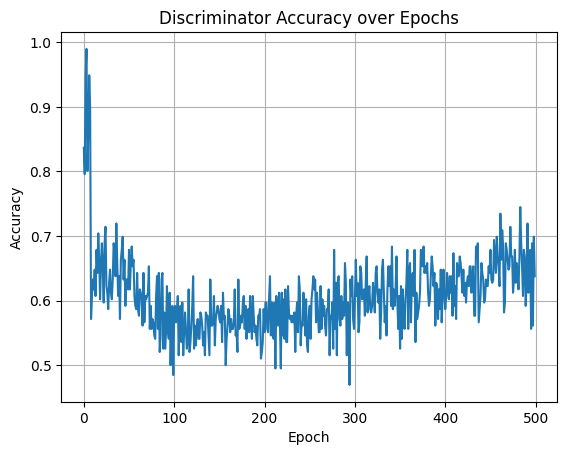

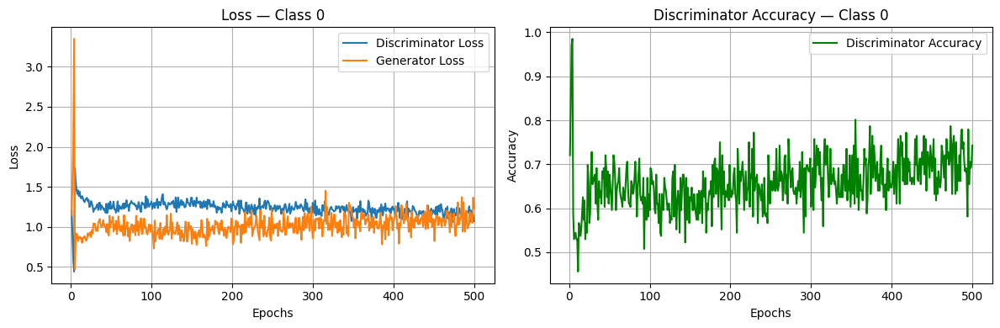

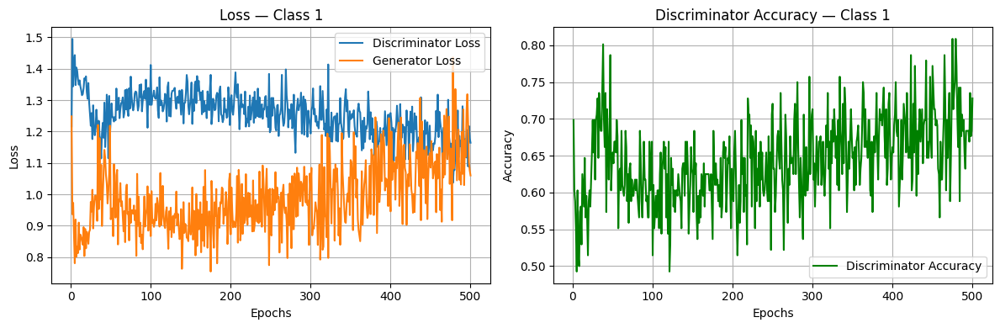

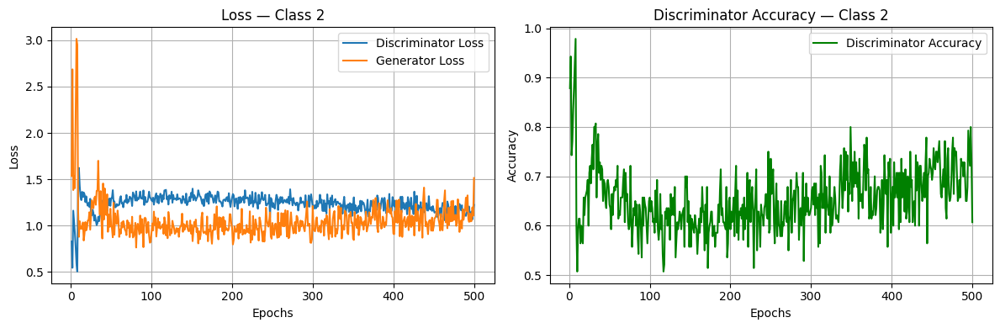

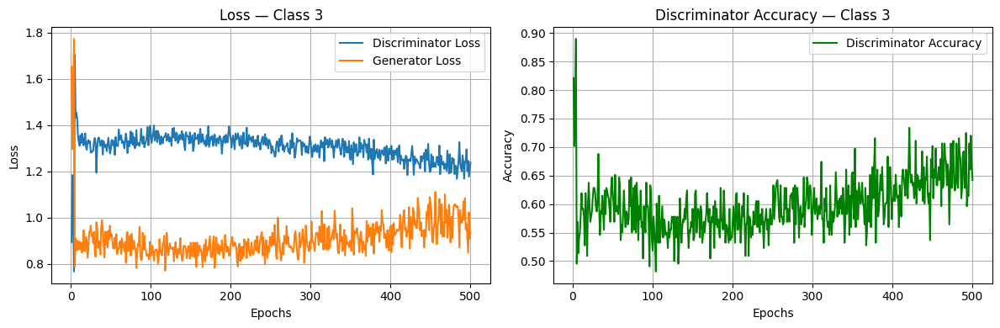

...

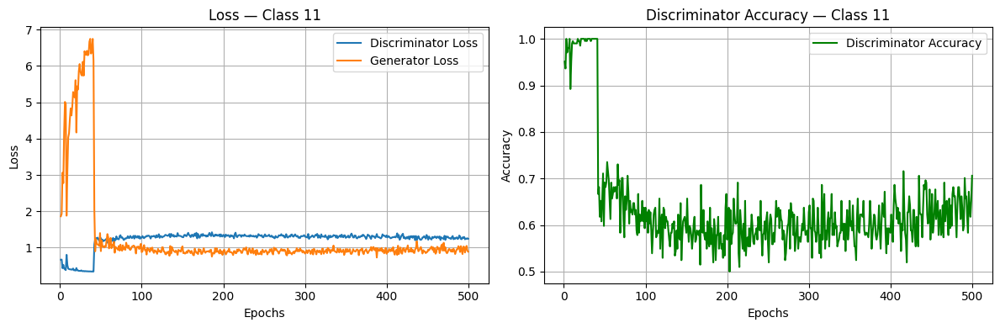

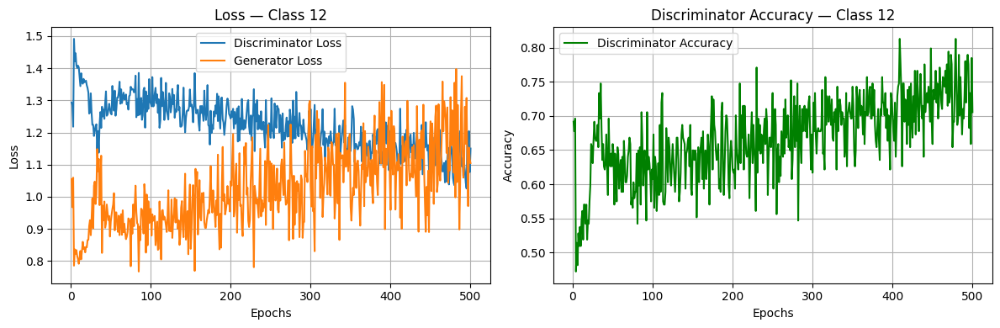

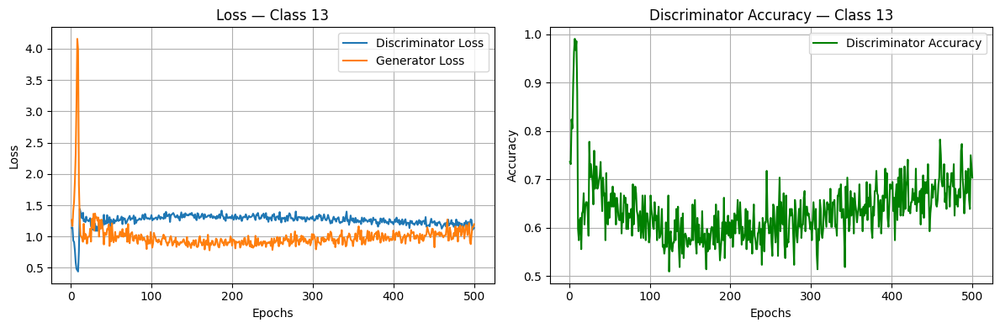

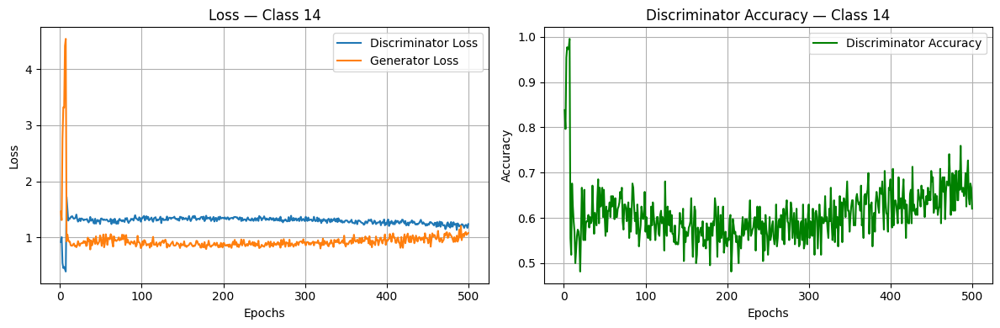

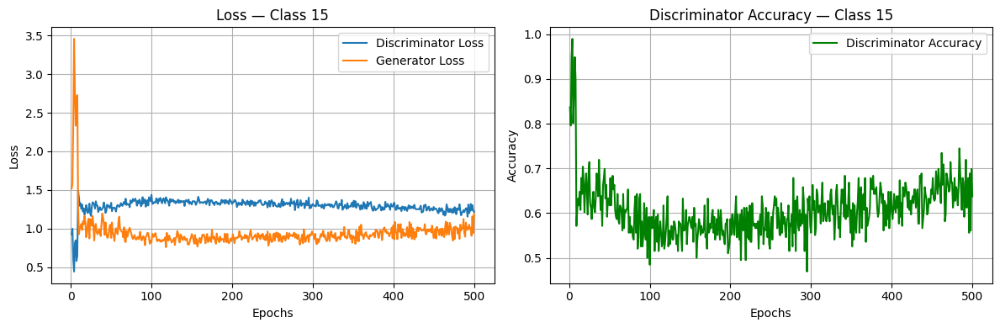

In [130]:

plt.plot(history.history['d_accuracy'])
plt.title("Discriminator Accuracy over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.grid(True)
plt.show()

plot_loss_history(histories)


Loading generator weights for class 0...
1/1 [==============================] - 0s 106ms/step
Loading generator weights for class 1...
1/1 [==============================] - 0s 105ms/step
Loading generator weights for class 2...
1/1 [==============================] - 0s 109ms/step
Loading generator weights for class 3...
1/1 [==============================] - 0s 135ms/step
Loading generator weights for class 4...
1/1 [==============================] - 0s 108ms/step
Loading generator weights for class 5...
1/1 [==============================] - 0s 127ms/step
Loading generator weights for class 6...
1/1 [==============================] - 0s 118ms/step
Loading generator weights for class 7...
1/1 [==============================] - 0s 104ms/step
Loading generator weights for class 8...
1/1 [==============================] - 0s 107ms/step
Loading generator weights for class 9...
1/1 [==============================] - 0s 103ms/step
Loading generator weights for class 10...
1/1 [=============

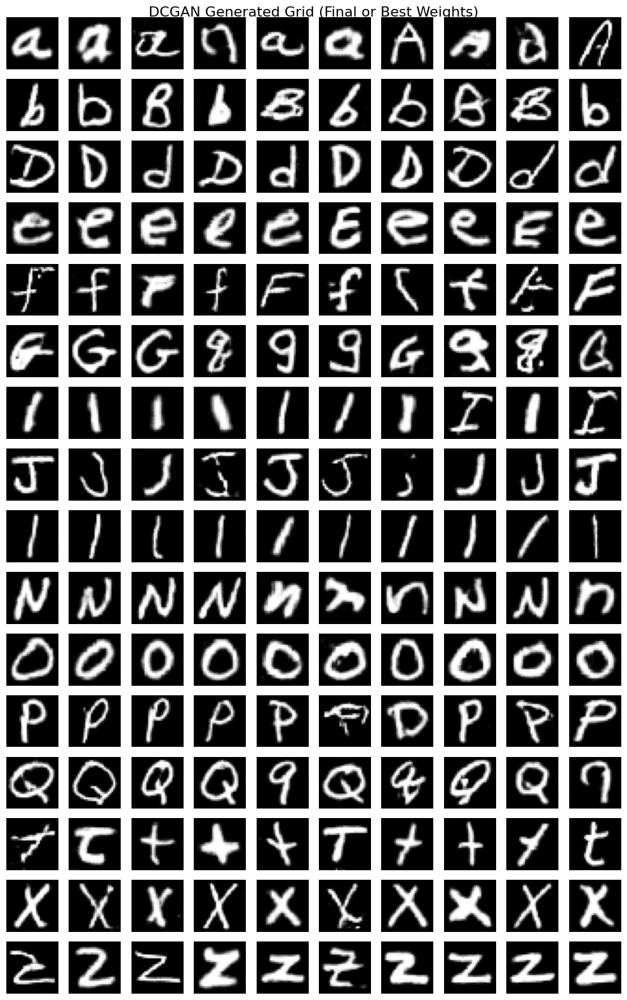

Grid of 160 images saved at: (2)Generated_Grid_160_Final\(2)new_grid_160images.png


In [143]:
generate_and_save_grid_only(weights_dir="(2)16Models_saved_generators_epochs(last)")


Loading generator weights for class 0...
1/1 [==============================] - 0s 99ms/step
Loading generator weights for class 1...
1/1 [==============================] - 0s 99ms/step
Loading generator weights for class 2...
1/1 [==============================] - 0s 105ms/step
Loading generator weights for class 3...
1/1 [==============================] - 0s 111ms/step
Loading generator weights for class 4...
1/1 [==============================] - 0s 104ms/step
Loading generator weights for class 5...
1/1 [==============================] - 0s 98ms/step
Loading generator weights for class 6...
1/1 [==============================] - 0s 100ms/step
Loading generator weights for class 7...
1/1 [==============================] - 0s 99ms/step
Loading generator weights for class 8...
1/1 [==============================] - 0s 102ms/step
Loading generator weights for class 9...
1/1 [==============================] - 0s 98ms/step
Loading generator weights for class 10...
1/1 [==================

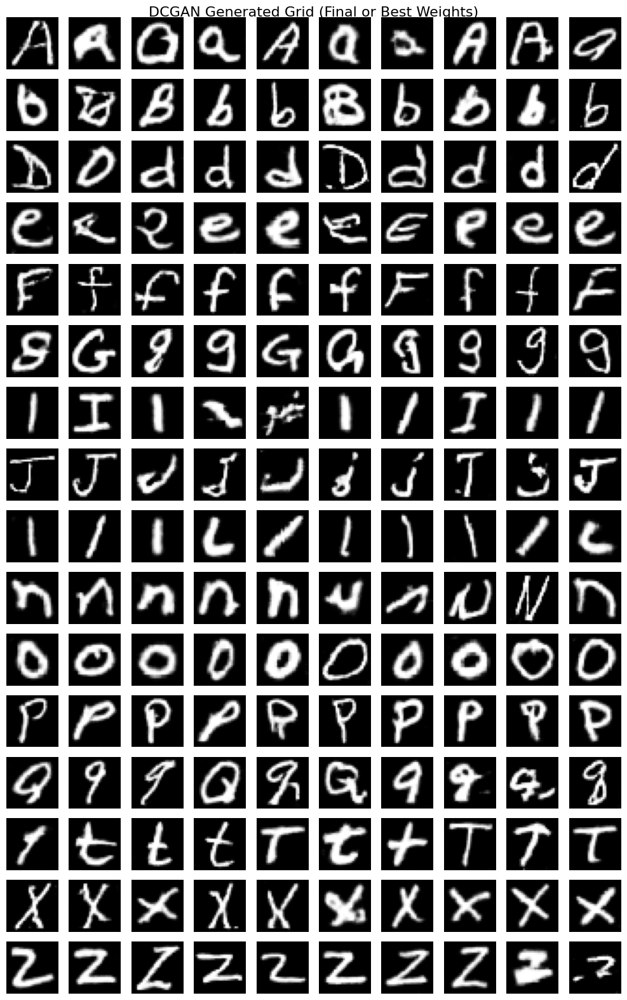

Grid of 160 images saved at: (2)Generated_Grid_160_Final\(2)new_grid_160images.png


In [137]:
generate_and_save_grid_only(weights_dir="(2)16Models_saved_generators_epochs")


In [42]:
def load_dcgan_models_from_weights(weight_dir, latent_dim=128):
    dcgan_models = {}
    for class_idx in range(16):
        generator = build_generator(latent_dim, channels=1)
        weight_path = os.path.join(weight_dir, f"(2)best_generator_class_{class_idx}.h5")
        if not os.path.exists(weight_path):  # Try loading final weights if best not found
            weight_path = os.path.join(weight_dir, f"(2)final_generator_class_{class_idx}.h5")
        generator.load_weights(weight_path)

        # Wrap inside dummy DCGAN model structure
        dcgan = tf.keras.models.Model()
        dcgan.generator = generator
        dcgan_models[class_idx] = dcgan
    return dcgan_models



Skipping ' ' — not trained.


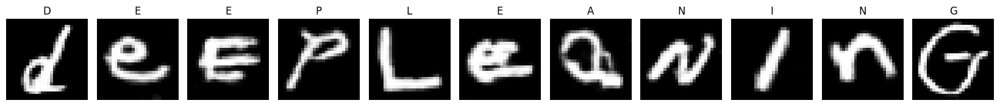

In [136]:
# For final weights
dcgan_models_final = load_dcgan_models_from_weights("(2)16Models_saved_generators_epochs(last)")
generate_word_from_models(dcgan_models_final, "DEEP LEANING")     # Final weights


In [43]:
# For final weights
dcgan_models_final = load_dcgan_models_from_weights("(2)16Models_saved_generators_epochs(last)")
generate_word_from_models(dcgan_models_final, "DEEP LEANING")     # Final weights


NameError: name 'generate_word_from_models' is not defined

Skipping 'R' — not trained.


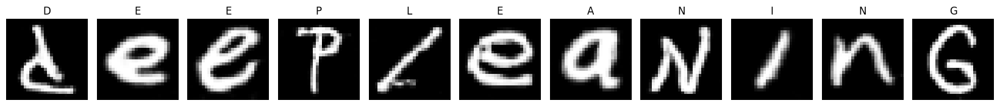

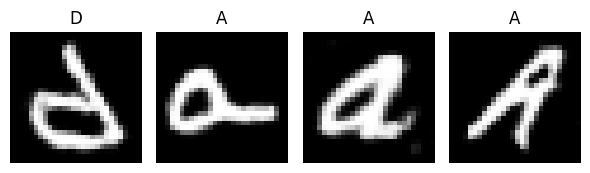

In [135]:
generate_word_from_models(dcgan_models, "DEEPLEARNING", latent_dim=128)
generate_word_from_models(dcgan_models, "DAAA", latent_dim=128)


In [138]:
import os
import numpy as np
import matplotlib.pyplot as plt

def save_10_images_per_class(weights_dir, latent_dim=128, images_per_class=10, base_save_dir="MULTIDCGAN_FINAL"):
    os.makedirs(base_save_dir, exist_ok=True)
    num_classes = 16

    for class_idx in range(num_classes):
        print(f"Generating images for class {class_idx}...")

        # Create class-specific folder
        class_dir = os.path.join(base_save_dir, f"class_{class_idx}")
        os.makedirs(class_dir, exist_ok=True)

        # Rebuild generator and load weights
        generator = build_generator(latent_dim, channels=1)
        weight_path = os.path.join(weights_dir, f"(2)final_generator_class_{class_idx}.h5")
        if not os.path.exists(weight_path):
            print(f" Skipping class {class_idx} — file not found: {weight_path}")
            continue

        generator.load_weights(weight_path)

        # Generate images
        noise = np.random.normal(0, 1, (images_per_class, latent_dim))
        generated_images = generator.predict(noise, verbose=0)
        generated_images = 0.5 * generated_images + 0.5  # Rescale from [-1,1] to [0,1]

        # Save each image
        for i in range(images_per_class):
            img = generated_images[i, :, :, 0]  # Grayscale
            img_path = os.path.join(class_dir, f"class{class_idx}_img{i+1}.png")
            plt.imsave(img_path, img, cmap='gray')

        print(f"Saved 10 images to {class_dir}")

    print("All class images saved to MULTIDCGAN_FINAL.")


In [144]:
save_10_images_per_class(weights_dir="(2)16Models_saved_generators_epochs(last)")


Generating images for class 0...
Saved 10 images to MULTIDCGAN_FINAL\class_0
Generating images for class 1...
Saved 10 images to MULTIDCGAN_FINAL\class_1
Generating images for class 2...
Saved 10 images to MULTIDCGAN_FINAL\class_2
Generating images for class 3...
Saved 10 images to MULTIDCGAN_FINAL\class_3
Generating images for class 4...
Saved 10 images to MULTIDCGAN_FINAL\class_4
Generating images for class 5...
Saved 10 images to MULTIDCGAN_FINAL\class_5
Generating images for class 6...
Saved 10 images to MULTIDCGAN_FINAL\class_6
Generating images for class 7...
Saved 10 images to MULTIDCGAN_FINAL\class_7
Generating images for class 8...
Saved 10 images to MULTIDCGAN_FINAL\class_8
Generating images for class 9...
Saved 10 images to MULTIDCGAN_FINAL\class_9
Generating images for class 10...
Saved 10 images to MULTIDCGAN_FINAL\class_10
Generating images for class 11...
Saved 10 images to MULTIDCGAN_FINAL\class_11
Generating images for class 12...
Saved 10 images to MULTIDCGAN_FINAL\cl